In [1]:
import numpy as np
import scipy
import random
import pandas as pd
import pickle
import seaborn.objects as so
import hashlib
import matplotlib.pyplot as plt

import seaborn as sns
from scipy.stats import ttest_ind
import scipy.stats as stats   

from IPython.display import display, HTML

In [2]:
class MetricManager:
    def __init__(self, metrics):
        """
        Inits the MetricManager

        Variables:
         - metrics: list of all metrics in form of a list of single runs
         - runs: parameters for the single runs extracted from the complete metrics
        """
        self.metrics = metrics.copy()
        self.set_perfect()
        self.full_metrics = self.metrics.copy()

        self.runs = pd.DataFrame(metrics).drop(["expert metrics", "verma", "hemmer", "artificial expert predictions"], axis=1)

        self.l2d_dfs = {
            "verma": {},
            "hemmer": {}
        }

        self.metric_dfs= {
            "verma": {},
            "hemmer": {}
        }

    def return_metrics_with_two(self):
        temp_metrics = []
        for run in self.metrics:
            if len(run["labeler_ids"]) == 2:
                temp_metrics.append(run)
        return temp_metrics

    def set_experts(self, labeler_ids):
        self.metrics = self.full_metrics.copy()

        remove_index = []
        for i in range(len(self.metrics)):
            if self.metrics[i]["labeler_ids"] != labeler_ids:
                remove_index.append(i)
        for i in remove_index[::-1]:
            del self.metrics[i]

        self.runs = pd.DataFrame(self.metrics).drop(["expert metrics", "verma", "hemmer", "artificial expert predictions"], axis=1)

    def set_perfect(self):
        labeler_used = []
        for i in range(len(self.metrics)):
            if self.metrics[i]["setting"] == "PERFECT":
                if self.metrics[i]["labeler_ids"] not in labeler_used:
                    for sample_equal in [True, False]:
                        for overlap in [0, 100]:
                            for expert_predict in ["target", "right"]:
                                new_metric = self.metrics[i].copy()
                                new_metric["overlap"] = overlap
                                new_metric["sample_equal"] = sample_equal
                                new_metric["expert_predict"] = expert_predict
                                self.metrics.append(new_metric)
                    labeler_used.append(self.metrics[i]["labeler_ids"])

        self.runs = pd.DataFrame(self.metrics).drop(["expert metrics", "verma", "hemmer", "artificial expert predictions"], axis=1)
        

    def get_dataframe_specific_run(self, run, method, seed, fold, step):
        """
        Returns a DataFrame for a given method of one (run, seed, fold) combination
        Step specifies the evaluation step (val, test)
        """
        if method == "verma":
            return self.create_dataframe_verma(run, seed, fold, step)
        if method == "hemmer":
            return self.create_dataframe_hemmer(run, seed, fold, step)

    def create_dataframe_verma(self, run, seed, fold, step):
        """
        Creates a dataframe which contains all metrics for verma for a given run, seed, fold and step

        Result is a DataFrame with every metric for the (run, seed, fold) combination
        """
        #Drops redundant columns
        df = pd.DataFrame(self.metrics[run]["verma"][seed][fold][step]).drop(["acc_experts", "cov_experts"], axis=0).T
        #Extract the number of images from coverage text
        df["coverage"] = df["coverage"].apply(lambda x: getCountOfCoverage(x))
        df["coverage_frac"] = df.apply(lambda x: x["cov_classifier"]/x["coverage"], axis=1)
        #df.rename(columns={'coverage':'n_images'}, inplace=True)
        return df

    def create_dataframe_hemmer(self, run, seed, fold, step):
        """
        Creates a dataframe which contains all metrics for hemmer for a given run, seed, fold and step

        Result is a DataFrame with every metric for the (run, seed, fold) combination
        """
        df = pd.DataFrame(self.metrics[run]["hemmer"][seed][fold][step]).T
        #Get the absolute number of images from the same combination from verma
        n_images = getCountOfCoverage(self.metrics[run]["verma"][seed][fold][step][0]["coverage"])
        #Extracts the experts ids
        experts = [column[7:] for column in df.columns if "Expert" in column]
        #Converts the percentage of coverage to absolute number
        df["Classifier Coverage"] = n_images * df["Classifier Coverage"]
        df["system_accuracy"] = df["system_accuracy"] * 100
        #Create metrics for every expert from list elements
        for expert in experts:
            df[f"{expert} Accuracy"] = [row["expert_accuracy"] for row in df[f"Expert_{expert}"]]
            df[f"{expert} Subset Accuracy"] = [row["expert_task_subset_accuracy"] for row in df[f"Expert_{expert}"]]
            df[f"{expert} Coverage"] = [n_images * row["expert_coverage"] for row in df[f"Expert_{expert}"]]
            df = df.drop([f"Expert_{expert}"], axis=1)
        return df

    def create_l2d_dataframe(self, method, step):
        """
        Creates a multiindex dataframe which contains all metrics for a L2D method and given step

        Result is a multiindex df (run, seed, fold)
        """
        dict_run = {}
        #Iterate over all runs
        for run in range(len(self.metrics)):
            dict_seed = {}
            #Iterate over all seeds
            for seed, val1 in self.metrics[run][method].items():
                dict_fold = {}
                #Iterate over every fold
                for fold, element in self.metrics[run][method][seed].items():
                    #Add metric for this (run, seed, fold) combination to the fold_dict
                    dict_fold[f"Fold_{fold}"] = self.get_dataframe_specific_run(run, method, seed, fold, step)
                #Create DataFrame for all folds in this (run, seed) combination
                df_seed = pd.concat(dict_fold)
                dict_seed[f"Seed_{seed}"] = df_seed
            #Create DataFrame for all seeds in this run
            df_run = pd.concat(dict_seed)
            dict_run[f"Run_{run}"] = df_run
        #Create DataFrame for all runs
        df_test = pd.concat(dict_run)
        return df_test

    def get_l2d_dataframe(self, method, step):
        """
        Returns the needed df

        Stores created dfs to speed up the process
        """
        if step not in self.l2d_dfs[method]:
            self.l2d_dfs[method][step] = self.create_l2d_dataframe(method, step)
        return self.l2d_dfs[method][step]

    def create_metric_dataframe(self, df, metric_name, method):
        """
        Creates the df for a L2D method and a specified aggregation method

        It chooses the metric from the single training step where the model had the best validation accuracy

        Current implemented are max for the aggregation of a (run, seed, fold) combination
        """
        #Only get the wanted metric
        dff = df[[metric_name]]

        #Get the indices where the model had the best validation accuracy
        #Matrix in form of columns=runs, rows=(seed + fold) (row index is range(len(seeds, folds combinations))
        indices = self.get_best_model_indices(method)

        #Get the indices for the complete dataframe (multiindex) in formate (run, seed, fold)
        index = dff.index
        #Get list of unique runs
        index_runs = index.get_level_values(0).drop_duplicates()
        #index_seeds = index.get_level_values(1).drop_duplicates()
        #index_folds = index.get_level_values(2).drop_duplicates()

        values = {}
        run_count = 0
        #Iterrate over all runs
        for run in index_runs:
            run_list = []
            count = 0
            #Get list of unique seeds in the current run
            index_seeds = dff.loc[run].index.get_level_values(0).drop_duplicates()
            #Iterrate over all seeds in the current run
            for seed in index_seeds:
                #Get list of qunique folds in the current run
                index_folds = dff.loc[(run, seed)].index.get_level_values(0).drop_duplicates()
                #Itterate over every fold in the current (run, seed) combination
                for fold in index_folds:
                    #Append the value from the current (run, seed, fold) combination on position indices.iloc[count, run_count] 
                    # (which is the training step from (run, seed, fold) where the model had the best val accuracy
                    run_list.append(dff.loc[(run, seed, fold, indices.iloc[count, run_count])][0])
                    #increases the parameter for index selection
                    count += 1
                values[run] = run_list
            run_count += 1
        #return pd.DataFrame(values)
        return pd.DataFrame(dict([(key, pd.Series(item)) for key, item in values.items()]))

    def get_best_model_indices(self, method):
        """
        Creates a df which contains the training step for every (run, seed, fold) combination in which the model had the best validation accuracy

        Returns a df the form of columns=runs, rows=range(len(seed - fold combinations in this run))
        """
        df = self.get_l2d_dataframe(method, "val") #Get metrics for every run, seed, fold
        dff = df[["system_accuracy"]]
        index = dff.index
        index_runs = index.get_level_values(0).drop_duplicates()

        #Iterrate ofer the complete multiindex df of system accuracy
        values = {}
        for run in index_runs:
            run_list = []
            index_seeds = dff.loc[run].index.get_level_values(0).drop_duplicates()
            for seed in index_seeds:
                index_folds = dff.loc[(run, seed)].index.get_level_values(0).drop_duplicates()
                for fold in index_folds:
                    #Get the index of the step of this (run, seed, fold) combination where the system accuracy is max
                    run_list.append(pd.to_numeric(dff.loc[(run, seed, fold), "system_accuracy"]).idxmax())
            values[run] = run_list
        #Returns df
        return pd.DataFrame(dict([(key, pd.Series(item)) for key, item in values.items()]))

    def get_metric_dataframe(self, method, step, metric_name):
        """
        Returns a dataframe for one metric

        Columns are runs, rows are the max of the L2D systems metric for every fold
        """
        df = self.get_l2d_dataframe(method, step) #Get metrics for every run, seed, fold

        if step not in self.metric_dfs[method]:
            self.metric_dfs[method][step] = {}
        if metric_name not in self.metric_dfs[method][step]:
            self.metric_dfs[method][step][metric_name] = self.create_metric_dataframe(df, metric_name, method)

        return self.metric_dfs[method][step][metric_name].copy()

    def get_metrics_dataframe_cut(self, method, step, metric_name, unwanted_tuple=None):
        """
        Cuts the name and add the posibility to remove unwanted parameter-value pairs
        """
        df = cut_column_name(self.get_metric_dataframe(method, step, metric_name))
        columns = df.columns
        if unwanted_tuple is not None: # Get only indieces of runs without unwanted parameter-value pairs
            columns = [str(el) for el in list(remove_unwanted_runs(self.runs, unwanted_tuple).index)]
        return df.loc[:,columns] #Return metric for every run with applied method to aggregate seeds and folds
        

    def print_metrics(self, df):
        """
        Prints the columns of a drataframe to get all available metrics
        """
        print(df.columns)

    def getRuns(self):
        return self.runs.copy()

In [3]:
def getCountOfCoverage(text):
    """
    Returns the number of images from the verma-metric coverage text
    """
    marker = None
    for j in range(len(text)):
        if text[-j] == "f":
            marker = j -1
    return int(text[-marker:])

def cut_column_name(df):
    """
    Removes the run_ prefix for every column
    """
    columns = [column[4:] for column in df.columns]
    df.columns = columns
    return df

def runs_cost_to_string(df):
    df = df.copy()
    if "cost" in df.columns:
        df["cost"] = df["cost"].apply(lambda x: cost_to_string(x))
    return df

def cost_to_string(cost):
    return str(cost)

def remove_unwanted_runs(df, unwanted_tuples):
    """
    Removes runs which contains unwanted column-value combinations

    Input:
        df - DataFrame which contains all runs
        unwanted_tuples - List of (column, value) pairs which should be removed
    """
    if isinstance(unwanted_tuples, tuple): #Make sure a single tuple doesn't break the code
        unwanted_tuples = [unwanted_tuples]
    dff = df.copy()
    for pair in unwanted_tuples:
        if (pair[0] in dff.columns): #Check if the column exists in the DataFrame
            dff = dff[dff[pair[0]] != pair[1]]
    return dff

def keep_wanted_runs(df, wanted_tuples):
    """
    Removes runs which contains unwanted column-value combinations

    Input:
        df - DataFrame which contains all runs
        unwanted_tuples - List of (column, value) pairs which should be removed
    """
    if isinstance(wanted_tuples, tuple): #Make sure a single tuple doesn't break the code
        wanted_tuples = [wanted_tuples]
    dff = df.copy()
    for pair in wanted_tuples:
        if (pair[0] in dff.columns): #Check if the column exists in the DataFrame
            dff = dff[dff[pair[0]] == pair[1]]
    return dff

In [4]:
def check_all_ttest(df, p=0.05, equal_var=False, plot=False):
    """
    Checks all columns of the dataframe of statistical significance
    """
    matrix = {}
    for i in df.columns:
        row = {}
        for j in df.columns:
            if i == j:
                row[j] = 1
            else:
                res = get_ttest(df.loc[:,[i]], df.loc[:,[j]], equal_var=equal_var)
                row[j] = res.pvalue[0]
        matrix[i] = row

    if plot:
        df = pd.DataFrame(matrix)
        heat = plot_ttests(df)
        return matrix, heat
    return matrix

def get_ttest(value1, value2, equal_var=True):
    res = ttest_ind(value1, value2, equal_var=equal_var, nan_policy="omit")
    #print(res)
    return res

def plot_ttests(df):
    # Draw a heatmap with the numeric values in each cell
    f, ax = plt.subplots(figsize=(25, 11))
    heat = sns.heatmap(df, annot=True, linewidths=.5, ax=ax)
    plt.show()
    return heat

In [5]:
def get_rungroup_name(df_runs, runs_g, var_columns, reverse=False):
    """
    Create names for every run where the runs differentiate in parameters

    Input:
        df_runs: DataFrame with every run and its parameters
        runs_g: Group of runs in structure [[0, 1, 2], [3, 4]]
        var_columns: Names of columns which can vary in a aggregated run
        reverse: If all columns could vary except of the given ones

    Return:
        run_names: Names for every run
        keys: Columnnames in which the runs are different
    """
    const_columns = [column for column in df_runs.columns if column not in var_columns]
    if reverse:
        const_columns = var_columns

    group_dict = []
    for run_group in runs_g:
        group_dict.append(dict(df_runs.loc[run_group[0], const_columns]))

    keys = []
    for i in range(len(group_dict) - 1):
        temp_keys = [k for k in group_dict[i] if group_dict[i][k] != group_dict[i + 1][k]]
        for key in temp_keys:
            if key not in keys:
                keys.append(key)
    keys.reverse()

    run_names = []
    for run_group in runs_g:
        run_names.append(create_run_name_from_columns(df_runs.loc[run_group[0]], keys))

    return run_names, keys

def create_run_name_from_columns(run, columns):
    """
    Concats names of columns with value for one run

    Input:
        run: DataFrame which contains one run with its parameters
        columns: The columns to build the name

    Return:
        Concated string from column-value pairs
    """
    name = ""
    #columns.reverse()
    for column in columns:
        name = name + f"{column}_{run.loc[column]}_"
    return name[:-1]


def get_runs_grouped(df, var_columns, reverse=False):
    """
    Groups the runs by their parameters
    All parameters except the passed ones are equal

    Returns a list whichs elements are lists of equal runs like [[0, 1, 2], [3, 4, 5]]
    """
    #Gets the columns which defines a aggregated run (stay constant for on aggregation)
    const_columns = [column for column in df.columns if column not in var_columns]
    #If all columns should be variable except the given ones
    if reverse:
        const_columns = var_columns

    pairs = []
    referenc_row = None
    index_list = list(df.index)
    #For every run in the dataframe
    for index in df.index:
        #If the run already is aggregated into one group
        if index in [el for sublist in pairs for el in sublist]:
            continue
        #Remove index to prevent adding it into the group to himself
        index_list.remove(index)
        #Get the reference row with the conctant columns
        referenc_row = df.loc[index, const_columns].to_dict()
        pair = [index]
        #Look at all other runs
        for index_j in index_list:
            current_row = df.loc[index_j, const_columns].to_dict()
            #If the current row equals the reference  row in the constant columns
            if referenc_row == current_row:
                pair.append(index_j)
        #Removed aggregated rows to prevent aggregation into different groups
        for el in pair:
            if el in index_list:
                index_list.remove(el)
        pairs.append(pair)
    return pairs

def get_runs_grouped_metric(df_runs, df_metrics, var_columns, reverse=False, unwanted_tuples=None):
    """
    Returns a DataFrame where the runs are aggregated and metrics for are combined for a aggregation

    A Aggregated run contains all metrics for every run it contains
    
    Parameter:
        var_columns are the coulmns which aren't fix, all other are
        Reverse makes all columns variable except var_columns

    Return:
        df - The DataFrame which contains aggregated runs with metrics
        df_runs.loc[first_indices, keys] - List of the aggregated runs from df_runs to show the parameters of the aggregated runs
    """

    #Remove unwanted runs
    if unwanted_tuples is not None:
        df_runs = remove_unwanted_runs(df_runs, unwanted_tuples)
    df_runs = runs_cost_to_string(df_runs)
    #Get groups of runs
    g_runs = get_runs_grouped(df_runs, var_columns, reverse)
    df = None
    first_indices = []
    for run_group in g_runs:
        #Append first run of group to show the parameters of a group
        first_indices.append(run_group[0])
        values = []
        #For every run in a group
        for run in run_group:
            #Aggregate the values of every run in this group
            values = values + df_metrics[str(run)].tolist()
        #Create Dataframe with aggregated values
        dff = pd.DataFrame(values, columns=[str(run_group)])
        #If first element of the group create Dataframe
        if df is None:
            df = dff
        else: #Concat for every other run in the group
            df = pd.concat([df, dff], axis=1)

    #keys are the columns of runs where the values are different in the aggregated runs
    #Prevents from printing column-values which are constant over all run groups
    df.columns, keys = get_rungroup_name(df_runs, g_runs, var_columns, reverse)

    df.columns = df_runs.loc[first_indices, keys].index
    
    return df, df_runs.loc[first_indices, keys]

def get_runs_hue_metric(df_runs, df_metrics, var_columns, unwanted_tuples=None):
    """
    Creates a DataFrame in long formate (for seaborn) which groups runs over equal columns and changing var_columns

    Parameter:
        df_runs: DataFrame containing all runs
        df_metrics: DataFrame containing values for one metric over every run and every fold (Columns are runs, rows are the max/var of the L2D systems metric for every fold)
        var_columns: Columns which can vary in a aggregated run
        unwanted_tuples: parameter-value pairs of runs which should be removed
    """
    if unwanted_tuples is not None:
        df_runs = remove_unwanted_runs(df_runs, unwanted_tuples)
    df_runs = runs_cost_to_string(df_runs)
    
    g_runs = get_runs_grouped(df_runs, var_columns, False)

    df = None
    first_indices = []
    dfs = []
    for run_group in g_runs:
        first_indices.append(run_group[0])
        values = {}
        run_dfs = []
        for run in run_group:
            temp_dict = {
                "value": df_metrics[str(run)],
            }
            for column in var_columns:
                temp_dict[column] = [df_runs.loc[run, column] for i in range(len(temp_dict["value"]))]
            df = pd.DataFrame(temp_dict)
            #print(df)
            run_dfs.append(df)
        dff = pd.concat(run_dfs)
        dff["group"] = [run_group[0] for i in range(len(dff))]
        dfs.append(dff)

    _, keys = get_rungroup_name(df_runs, g_runs, var_columns, False)
    
    return pd.concat(dfs), df_runs.loc[first_indices, keys]

def plot_runs_hue_metric(df_runs, df_metrics, var_columns, unwanted_tuples=None, y_text="value", sorted_columns=None, slice=None, plot=True):
    df, runs_df = get_runs_hue_metric(df_runs.iloc[:], df_metrics, var_columns, unwanted_tuples)
    

    if slice is not None:
        runs_df = runs_df.iloc[slice[0]:slice[1]]
        df = df[df["group"].isin(runs_df.index)]

    f, ax = plt.subplots(figsize=(25, 11))

    display(HTML(runs_df.to_html()))

    #lis = sorted(df[var_columns].apply(tuple, axis=1), key=lambda tup: tup[0])
    lis = df[var_columns].apply(tuple, axis=1)
    
    df.reset_index(inplace=True)
    lis.reset_index(inplace=True, drop = True,)

    if not plot:
        return df, runs_df, lis
    
    g = sns.boxplot(df, y="value", x="group", hue=lis)

    ax.set(xlabel='group', ylabel=y_text)

    series = pd.Series(df[var_columns].apply(tuple, axis=1))
    for i in range(len(var_columns)):
        name = var_columns[i]
        for j, el in enumerate(series):
            el = list(series.iloc[j])
            el[i] = f"{name}: {el[i]}"
            series.iloc[j] = tuple(el)

    if sorted_columns is not None:
        li = list(series.unique())
        sorted_list = sorted(li, key=lambda tup: tuple([tup[idx] for idx in [get_index_from_tuple(tup, name) for name in sorted_columns]]))
    else:
        sorted_list = list(series.unique())

    plt.legend(loc='upper right')
    for t, l in zip(g.legend_.texts, sorted_list):
        t.set_text(l)

    plt.show(g)

    return df, runs_df, lis


def get_index_from_tuple(tuple, name):
    for idx, element in enumerate(tuple):
        if name in element:
            return idx
    return -1


def get_uniq_values(df, column):
    if column in df.columns:
        return set(df[column].values)

def group_ttest(df, plot=False):

    group_test = []
    df = runs_cost_to_string(df)
    for group in get_uniq_values(df, "group"):
        group_df = df[df["group"] == group]

        columns = list(group_df.columns)
        columns.remove("value")
        columns.remove("group")

        dff = group_df.pivot(columns=columns, values='value')

        group_test.append(pd.DataFrame(check_all_ttest(dff)))

    return group_test

In [6]:
with open("../../Metrics_Folder/NIH/Metrics_1857.pickle", 'rb') as handle:
    metrics2 = pickle.load(handle)

metricManager = MetricManager(metrics2)

df_runs = metricManager.runs

In [7]:
np.unique(df_runs["labeler_ids"].values)

array([list([4295342357, 4295354117]), list([4295349121, 4295342357]),
       list([4295349121, 4295342357, 4295354117]),
       list([4323195249, 4295232296])], dtype=object)

In [16]:
#metricManager.set_experts([4323195249, 4295232296])
#df_runs = metricManager.runs
#np.unique(df_runs["labeler_ids"].values)

array([list([4323195249, 4295232296])], dtype=object)

In [50]:
#metricManager.set_experts([4295349121, 4295342357])
#df_runs = metricManager.runs
#np.unique(df_runs["labeler_ids"].values)

array([list([4295349121, 4295342357])], dtype=object)

In [80]:
#metricManager.set_experts([4295342357, 4295354117])
#df_runs = metricManager.runs
#np.unique(df_runs["labeler_ids"].values)

array([list([4295342357, 4295354117])], dtype=object)

array([list([4295349121, 4295342357])], dtype=object)

In [8]:
df_runs = metricManager.runs

In [9]:
np.unique(df_runs["labeler_ids"].values)

array([list([4295342357, 4295354117]), list([4295349121, 4295342357]),
       list([4295349121, 4295342357, 4295354117]),
       list([4323195249, 4295232296])], dtype=object)

In [10]:
metricManager.get_l2d_dataframe("verma", "test").columns

Index(['coverage', 'system_accuracy', 'expert_accuracy', 'classifier_accuracy',
       'alone_classifier', 'validation_loss', 'n_experts', 'expert_0',
       'expert_1', 'expert_0_coverage', 'expert_1_coverage', 'cov_classifier',
       'coverage_frac', 'expert_2', 'expert_2_coverage'],
      dtype='object')

In [79]:
wide_format = (17, 7)
wide_format_h = (17, 11)
small_format = (13, 11)

median = False

if median:
    estimator = np.median
else:
    estimator = np.mean

# System analysis accuracy

,labeled
0,12
20,20
38,36
43,16
48,24
58,40
74,68
153,72
161,32
169,48


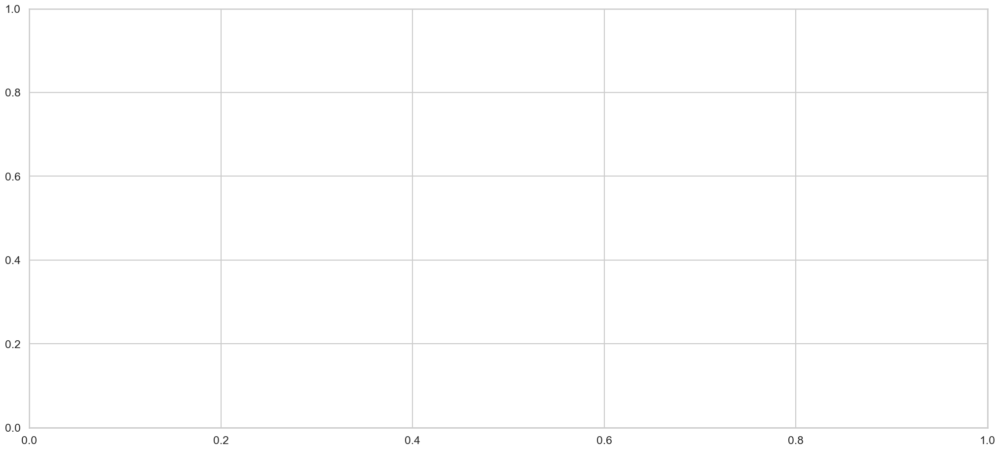

In [12]:
grouped_columns = []
cut_out = [("labeler_ids", "[4295349121, 4295342357, 4295354117]")]#, ("setting", "AL"), ("setting", "SSL"), ("setting", "NORMAL"), ("mod", "disagreement_diff")]#, ("overlap", 0), ("sample_equal", False)]#("setting", "AL"), ("setting", "SSL"), ("setting", "NORMAL"), ("mod", "disagreement_diff"), ("expert_predict", "target")]#, ("sample_equal", True), ("overlap", 100), 
#var_columns = ["labeled", "rounds", "init_size", "labels_per_round"]
var_columns = ["setting", "mod", "expert_predict", "overlap", "sample_equal", "labeler_ids", "init_size", "labels_per_round", "rounds"]#, "expert_predict"]

method = "verma"
metric_name = "system_accuracy"
#metric_name = "coverage"
step = "test"

sns.set_style("whitegrid")
sns.set_context("talk")

df_test = cut_column_name(metricManager.get_metric_dataframe(method, step, metric_name))
df_grouped_metrics, selected_runs = get_runs_grouped_metric(df_runs.iloc[:], df_test, grouped_columns, False, cut_out)

selected_runs["labeler_ids"] = selected_runs["labeler_ids"].apply(lambda x: str(x))

df_grouped_metrics.columns = [str(name) for name in df_grouped_metrics.columns]

df, runs_df, series = plot_runs_hue_metric(selected_runs, df_grouped_metrics, var_columns, cut_out, y_text=f"{method}_{step}_{metric_name}", slice=None, plot=False)
#group_test = group_ttest(df)

In [29]:
dff["labeler_ids"].unique()

array(['[4295342357, 4295354117]'], dtype=object)

In [28]:
dfff["labeler_ids"].unique()

array(['[4295349121, 4295342357]', '[4295342357, 4295354117]',
       '[4323195249, 4295232296]'], dtype=object)

In [16]:
df_save = df.copy()

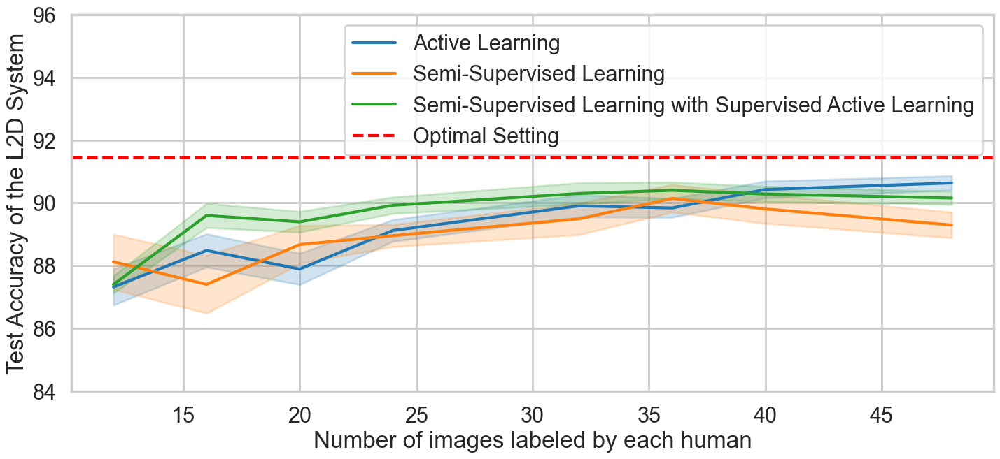

In [80]:
build_df = df.copy()
#Set ids
#build_df = build_df[build_df["labeler_ids"] != "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295349121, 4295342357]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295342357, 4295354117]"]

dff = build_df[build_df["setting"] != "PERFECT"].copy().reset_index()
dfff = build_df[build_df["setting"] == "PERFECT"].reset_index()

#dff = dff[dff["expert_predict"] == "target"]
#dff = dff[dff["expert_predict"] == "right"]

dff = dff[dff["overlap"] == 100]
dff = dff[dff["sample_equal"] == True]

#dff = dff[dff["mod"] != "disagreement_diff"]

dff = dff[dff["setting"] != "NORMAL"]
dff = dff[dff["setting"] != "SSL_AL_SSL"]
#dff = dff[dff["setting"] != "AL"]
#dff = dff[dff["setting"] != "SSL"]
#dff = dff[dff["setting"] == "SSL_AL"]


dff["group"] = dff["group"].replace(runs_df.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=wide_format)
sns.set_context("poster")

#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
ln = sns.lineplot(x="group", y="value", hue=dff[["setting"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))
ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")

ax.set(ylim=(84, 96))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test Accuracy of the L2D System")
#plt.legend(loc='lower right')
plt.legend()
leg_texts = ["Active Learning", "Semi-Supervised Learning", "Semi-Supervised Learning with Supervised Active Learning"]
for t, l in zip(ln.legend_.texts, leg_texts):
    t.set_text(l)
plt.savefig("../../images/NIH/overall_setting.png", bbox_inches="tight")

In [68]:
from scipy.stats import iqr

a = dff.dropna().groupby(["setting", "group"])["value"].agg([np.median, scipy.stats.iqr, scipy.stats.normaltest, "mean", "std"])#.mean()
a = a.reset_index()

a = a[a["group"] <= 50]
a = a[a["setting"] != "NORMAL"]
a = a[a["setting"] != "SSL_AL_SSL"]
a["normaltest"] = a["normaltest"].apply(lambda x: x.pvalue)

pivoted_df = a.pivot_table(index=["setting"], columns="group", values=["median", "iqr", "normaltest", "mean", "std"])
pivoted_df = pivoted_df.reset_index()

pivoted_df.to_csv("../../tables/NIH/overall_setting_acc.csv")
pivoted_df

setting       iqr                                                    \
group                12        16        20        24        32        36   
0          AL  4.580546  4.075893  5.142857  4.798541  5.073233  3.275371   
1         SSL  6.229721  6.959644  4.477612  4.088254  3.710670  3.165590   
2      SSL_AL  5.147751  3.361938  4.808184  4.049097  3.567528  3.681753   

                                mean  ... normaltest                 std  \
group        40        48         12  ...         40        48        12   
0      4.131516  4.529391  87.320423  ...   0.158322  0.086865  4.025562   
1      7.019704  4.375483  88.123778  ...   0.000044  0.536042  4.390223   
2      3.896104  4.450959  87.401238  ...   0.000002  0.071233  3.554808   

                                                                             
group        16        20        24        32        36        40        48  
0      3.673387  4.918192  4.157989  3.482654  2.949243  3.214970  3.145557  
1      4.512803  4.240773  2.978425  3.489972  3.042148  3.917368  4.012796  
2      3.089151  3.767768  3.632964  3.600999  2.953189  3.263757  3.169535  

[3 rows x 41 columns]

In [74]:
pivoted_df["normaltest"]

group,12,16,20,24,32,36,40,48
0,0.195133,0.513164,0.000004,2.206098e-04,0.703836,0.573270,0.158322,0.086865
1,0.271609,0.826253,0.000056,9.874169e-02,0.723345,0.147100,0.000044,0.536042
2,0.162838,0.720318,0.122029,1.206975e-07,0.000873,0.340568,0.000002,0.071233


In [70]:
pivoted_df.loc[[0, 2],["mean", "std", "median"]].pct_change().loc[:,"mean"].iloc[:,:].mean(axis=1)*100

0         NaN
2    0.542766
dtype: float64

In [71]:
pivoted_df.loc[[0, 2],["mean", "std", "median"]].pct_change().loc[:,"median"].iloc[:,:].mean(axis=1)*100

0         NaN
2    0.353901
dtype: float64

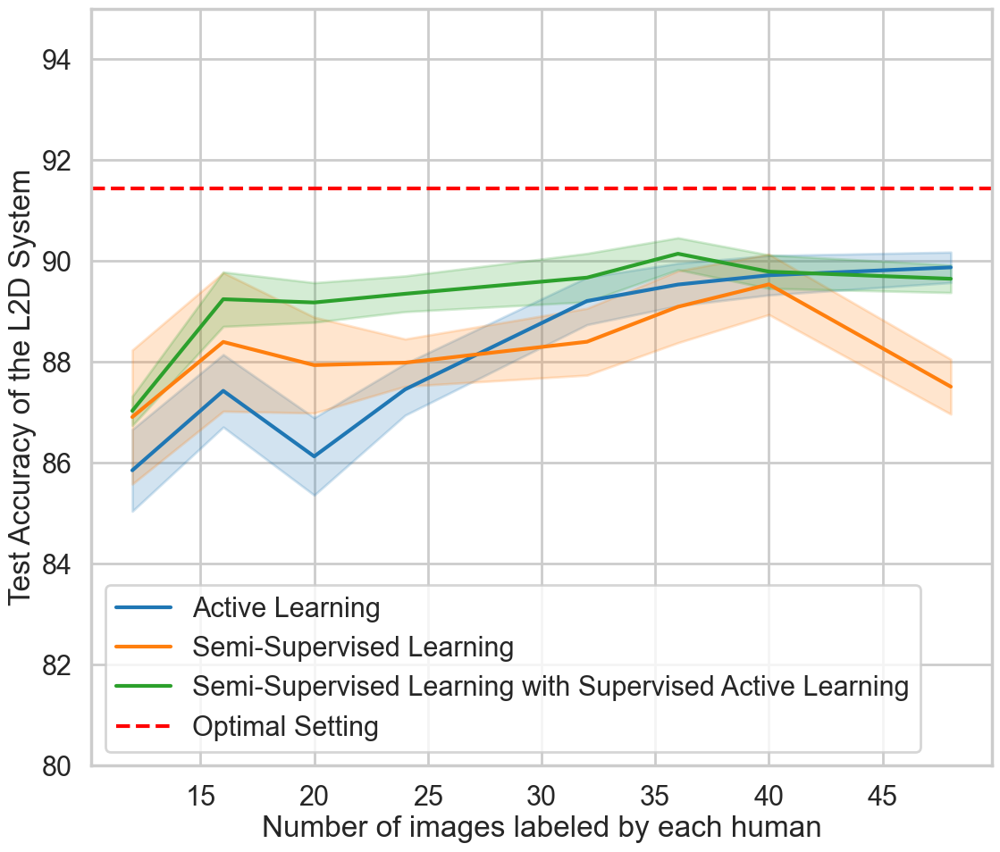

In [81]:
build_df = df.copy()
#Set ids
#build_df = build_df[build_df["labeler_ids"] != "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295349121, 4295342357]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295342357, 4295354117]"]

dff = build_df[build_df["setting"] != "PERFECT"].copy().reset_index()
dfff = build_df[build_df["setting"] == "PERFECT"].reset_index()

dff = dff[dff["expert_predict"] == "target"]
#dff = dff[dff["expert_predict"] == "right"]

dff = dff[dff["overlap"] == 100]
dff = dff[dff["sample_equal"] == True]

#dff = dff[dff["mod"] != "disagreement_diff"]

dff = dff[dff["setting"] != "NORMAL"]
dff = dff[dff["setting"] != "SSL_AL_SSL"]
#dff = dff[dff["setting"] != "AL"]
#dff = dff[dff["setting"] != "SSL"]


dff["group"] = dff["group"].replace(runs_df.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=small_format)
sns.set_context("poster")

#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
ln = sns.lineplot(x="group", y="value", hue=dff[["setting"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))
ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")

ax.set(ylim=(80, 95))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test Accuracy of the L2D System")
#plt.legend(loc='lower right')
plt.legend()
leg_texts = ["Active Learning", "Semi-Supervised Learning", "Semi-Supervised Learning with Supervised Active Learning"]
for t, l in zip(ln.legend_.texts, leg_texts):
    t.set_text(l)
plt.savefig("../../images/NIH/overall_setting_target.png", bbox_inches="tight")

In [77]:
from scipy.stats import iqr

a = dff.dropna().groupby(["setting", "group"])["value"].agg([np.median, scipy.stats.iqr, scipy.stats.normaltest, "mean", "std"])#.mean()
a = a.reset_index()

a = a[a["group"] <= 50]
a = a[a["setting"] != "NORMAL"]
a = a[a["setting"] != "SSL_AL_SSL"]
a["normaltest"] = a["normaltest"].apply(lambda x: x.pvalue)

pivoted_df = a.pivot_table(index=["setting"], columns="group", values=["median", "iqr", "normaltest", "mean", "std"])
pivoted_df = pivoted_df.reset_index()

pivoted_df.to_csv("../../tables/NIH/overall_setting_acc_target.csv")
pivoted_df

D:\Development\anaconda\envs\Masterarbeit\lib\site-packages\scipy\stats\_stats_py.py:1477: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=13
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
D:\Development\anaconda\envs\Masterarbeit\lib\site-packages\scipy\stats\_stats_py.py:1477: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=12
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


setting       iqr                                                    \
group                12        16        20        24        32        36   
0          AL  5.683117  4.825427  6.190638  5.090312  4.366905  3.328804   
1         SSL  8.591304  4.417414  5.204598  4.108951  4.780474  5.489921   
2      SSL_AL  5.086580  4.998550  4.861407  4.619362  5.193415  3.209434   

                                mean  ... normaltest                 std  \
group        40        48         12  ...         40        48        12   
0      3.940299  3.835404  85.849219  ...   0.275107  0.673296  4.053160   
1      6.110190  4.897798  86.906116  ...   0.012969  0.140458  4.791055   
2      3.879933  3.926868  87.029324  ...   0.000015  0.046047  3.430739   

                                                                             
group        16        20        24        32        36        40        48  
0      3.520012  5.371667  4.336440  3.250710  2.919454  3.319644  2.956696  
1      4.760556  4.751747  2.815864  3.245557  3.490244  3.597542  3.771852  
2      3.416326  3.533208  3.882875  3.841706  2.827297  3.507167  3.095317  

[3 rows x 41 columns]

In [78]:
pivoted_df["normaltest"]

group,12,16,20,24,32,36,40,48
0,0.397843,0.434010,0.001979,0.009948,0.897666,0.845046,0.275107,0.673296
1,0.399398,0.451923,0.000214,0.037152,0.369930,0.111815,0.012969,0.140458
2,0.198476,0.795613,0.447597,0.000059,0.065691,0.149953,0.000015,0.046047


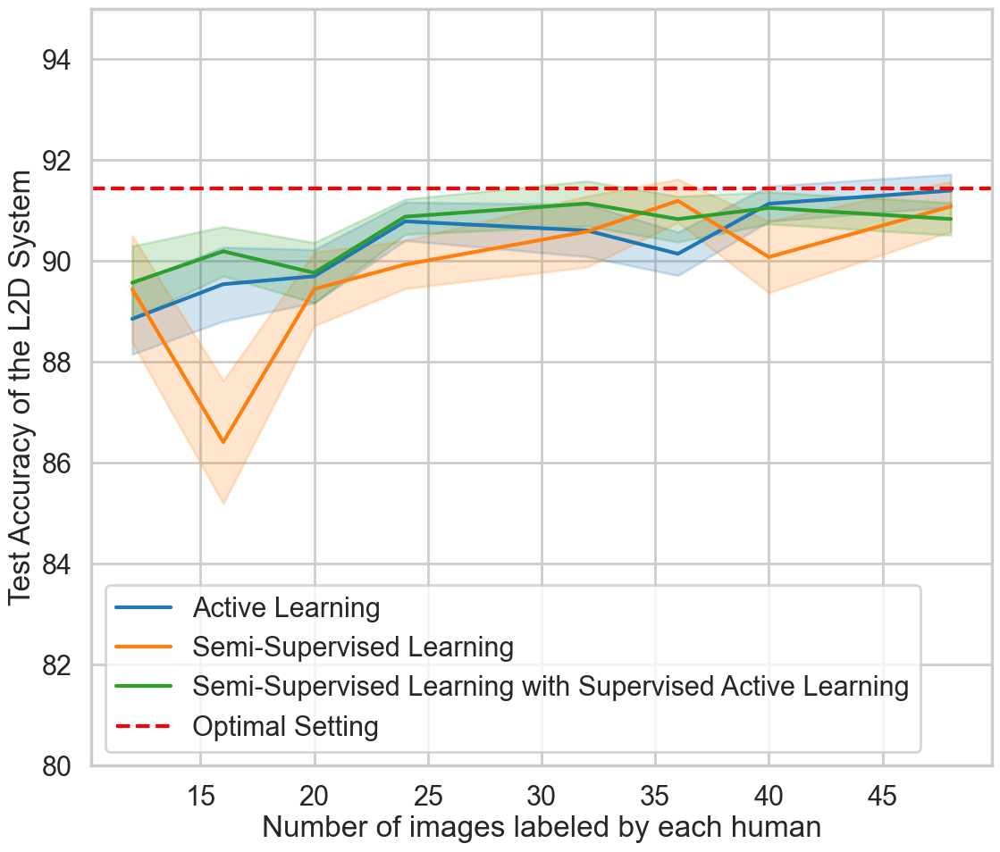

In [88]:
build_df = df.copy()
#Set ids
#build_df = build_df[build_df["labeler_ids"] != "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295349121, 4295342357]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295342357, 4295354117]"]

dff = build_df[build_df["setting"] != "PERFECT"].copy().reset_index()
dfff = build_df[build_df["setting"] == "PERFECT"].reset_index()

#dff = dff[dff["expert_predict"] == "target"]
dff = dff[dff["expert_predict"] == "right"]

dff = dff[dff["overlap"] != 0]
dff = dff[dff["sample_equal"] != False]

#dff = dff[dff["mod"] != "disagreement_diff"]

dff = dff[dff["setting"] != "NORMAL"]
dff = dff[dff["setting"] != "SSL_AL_SSL"]
#dff = dff[dff["setting"] != "AL"]
#dff = dff[dff["setting"] != "SSL"]


dff["group"] = dff["group"].replace(runs_df.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=small_format)
sns.set_context("poster")

#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
ln = sns.lineplot(x="group", y="value", hue=dff[["setting"]].apply(tuple, axis=1), hue_order=[("AL",), ("SSL",), ("SSL_AL",)], data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))
ax.axhline(dfff["value"].mean(), ls='--', color="red", label="Optimal Setting")

ax.set(ylim=(80, 95))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test Accuracy of the L2D System")
#plt.legend(loc='lower right')
plt.legend()
leg_texts = ["Active Learning", "Semi-Supervised Learning", "Semi-Supervised Learning with Supervised Active Learning"]
for t, l in zip(ln.legend_.texts, leg_texts):
    t.set_text(l)
plt.savefig("../../images/NIH/overall_setting_right.png", bbox_inches="tight")

In [88]:
from scipy.stats import iqr

a = dff.dropna().groupby(["setting", "group"])["value"].agg([np.median, scipy.stats.iqr, scipy.stats.normaltest])#.mean()
a = a.reset_index()

a = a[a["group"] <= 50]
a = a[a["setting"] != "NORMAL"]
a = a[a["setting"] != "SSL_AL_SSL"]
a["normaltest"] = a["normaltest"].apply(lambda x: x.pvalue)

pivoted_df = a.pivot_table(index=["setting"], columns="group", values=["median", "iqr", "normaltest"])
pivoted_df = pivoted_df.reset_index()

pivoted_df.to_csv("../../tables/NIH/overall_setting_acc_right.csv")
pivoted_df

setting       iqr                                                    \
group                12        16        20        24        32        36   
0          AL  2.782671  2.838837  3.148497  3.479356  4.906659  2.569304   
1         SSL  2.601771  5.841785  3.791611  3.571429  2.783776  2.752101   
2      SSL_AL  3.299689  2.634836  3.746269  2.982348  2.942857  3.508285   

                              median  ...                       normaltest  \
group        40        48         12  ...         40         48         12   
0      2.938754  3.672927  89.411765  ...  89.610390  89.610390   0.155040   
1      4.844007  3.873214  89.582609  ...  88.505747  89.411765   0.118168   
2      3.095393  3.642335  90.298507  ...  89.655172  89.655172   0.022808   

                                                                             
group        16        20        24        32        36        40        48  
0      0.420718  0.070629  0.118303  0.706336  0.043079  0.507771  0.865600  
1      0.611487  0.162510  0.651854  0.195192  0.699940  0.454226  0.756955  
2      0.592563  0.002835  0.000201  0.000072  0.497239  0.003660  0.315919  

[3 rows x 25 columns]

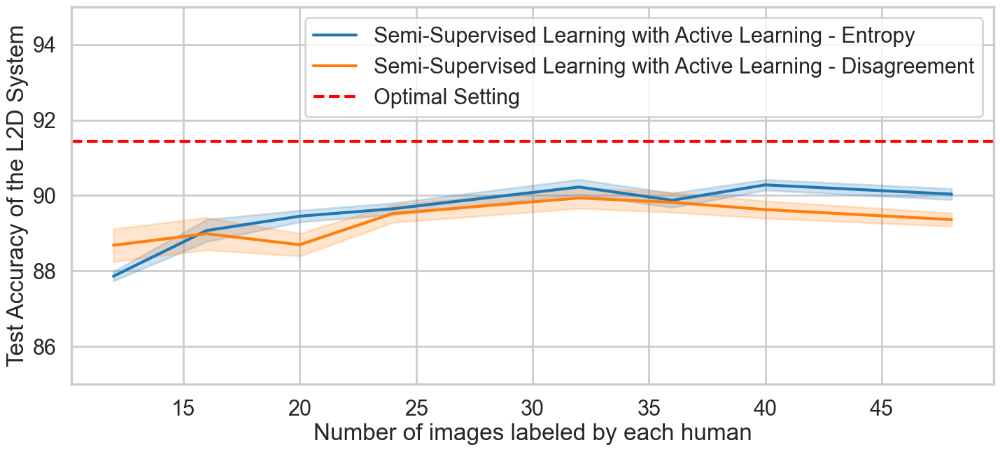

In [89]:
build_df = df.copy()
#Set ids
#build_df = build_df[build_df["labeler_ids"] != "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295349121, 4295342357]"]

dff = build_df[build_df["setting"] != "PERFECT"].copy().reset_index()
dfff = build_df[build_df["setting"] == "PERFECT"].reset_index()

#dff = dff[dff["expert_predict"] == "target"]
#dff = df[df["expert_predict"] == "right"]

#dff = dff[dff["overlap"] != 0]
#dff = dff[dff["sample_equal"] != False]

#dff = dff[dff["mod"] != "disagreement_diff"]

dff = dff[dff["setting"] != "NORMAL"]
dff = dff[dff["setting"] != "SSL_AL_SSL"]
dff = dff[dff["setting"] != "AL"]
dff = dff[dff["setting"] != "SSL"]


dff["group"] = dff["group"].replace(runs_df.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=wide_format)
sns.set_context("poster")
#, "overlap", "sample_equal", "expert_predict", "mod"
#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
ln = sns.lineplot(x="group", y="value", hue=dff[["setting", "mod"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))
ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")
#ax.axhline(90.1403561, ls='--', color="g")
#ax.axhline(87.5957923, ls='--', color="b")
ax.set(ylim=(85, 95))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test Accuracy of the L2D System")
plt.legend(loc='upper right')
leg_texts = ["Semi-Supervised Learning with Active Learning - Entropy", "Semi-Supervised Learning with Active Learning - Disagreement"]
for t, l in zip(ln.legend_.texts, leg_texts):
    t.set_text(l)
plt.savefig("../../images/NIH/active_learning_strategy.png", bbox_inches="tight")

In [95]:
from scipy.stats import iqr

a = dff.dropna().groupby(["mod", "group"])["value"].agg([np.median, scipy.stats.iqr, scipy.stats.normaltest])#.mean()
a = a.reset_index()

a = a[a["group"] <= 50]
#a = a[a["setting"] != "NORMAL"]
#a = a[a["setting"] != "SSL_AL_SSL"]
a["normaltest"] = a["normaltest"].apply(lambda x: x.pvalue)

pivoted_df = a.pivot_table(index=["mod"], columns="group", values=["median", "iqr", "normaltest"])
pivoted_df = pivoted_df.reset_index()

#pivoted_df.to_csv("../../tables/NIH/overall_setting_acc.csv")
pivoted_df

mod       iqr                                         \
group                           12        16        20        24       32   
0             confidence  4.529617  3.992821  3.992895  4.038839  3.78941   
1      disagreement_diff  4.896249  3.999511  5.118883  3.899836  3.84304   

                                        median  ...                        \
group        36        40        48         12  ...         40         48   
0      3.368177  3.280806  4.092262  88.095238  ...  90.349254  90.298507   
1      4.310345  3.688454  3.044776  89.237132  ...  89.552239  89.558728   

      normaltest                                                           \
group         12        16        20            24       32            36   
0       0.002627  0.000004  0.125814  1.227577e-15  0.00012  5.497060e-09   
1       0.010364  0.078289  0.275265  6.772019e-04  0.00085  9.542893e-02   

                                   
group            40            48  
0      7.894840e-11  5.535487e-14  
1      4.588104e-04  9.120725e-05  

[2 rows x 25 columns]

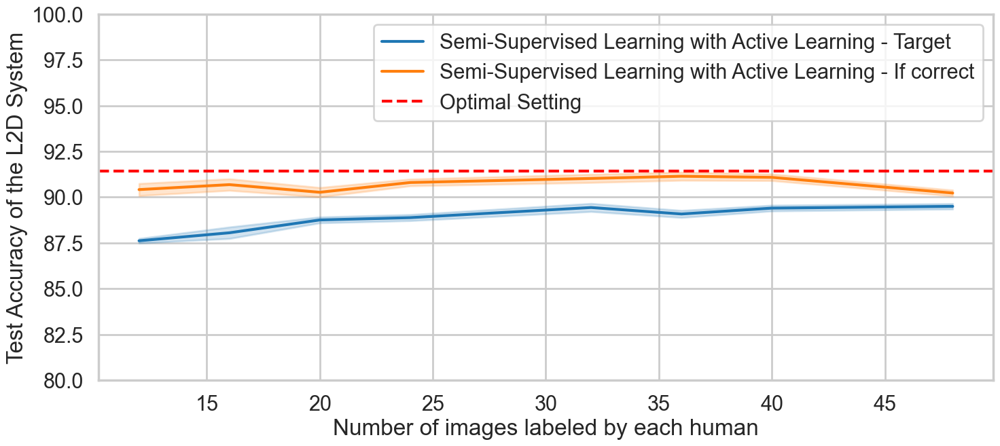

In [90]:
build_df = df.copy()
#Set ids
#build_df = build_df[build_df["labeler_ids"] != "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295349121, 4295342357]"]

dff = build_df[build_df["setting"] != "PERFECT"].copy().reset_index()
dfff = build_df[build_df["setting"] == "PERFECT"].reset_index()

#dff = dff[dff["expert_predict"] == "target"]
#dff = df[df["expert_predict"] == "right"]

#dff = dff[dff["overlap"] != 0]
#dff = dff[dff["sample_equal"] != False]

#dff = dff[dff["mod"] != "disagreement_diff"]

dff = dff[dff["setting"] != "NORMAL"]
dff = dff[dff["setting"] != "SSL_AL_SSL"]
dff = dff[dff["setting"] != "AL"]
dff = dff[dff["setting"] != "SSL"]

dff["group"] = dff["group"].replace(runs_df.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=wide_format)
sns.set_context("poster")
#, "overlap", "sample_equal", "expert_predict", "mod"
#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
ln = sns.lineplot(x="group", y="value", hue=dff[["setting", "expert_predict"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))
ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")
#ax.axhline(90.1403561, ls='--', color="g")
#ax.axhline(87.5957923, ls='--', color="b")
ax.set(ylim=(80, 100))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test Accuracy of the L2D System")
plt.legend(loc='upper right')
leg_texts = ["Semi-Supervised Learning with Active Learning - Target", "Semi-Supervised Learning with Active Learning - If correct"]
for t, l in zip(ln.legend_.texts, leg_texts):
    t.set_text(l)
plt.savefig("../../images/NIH/model_strategy.png", bbox_inches="tight")

In [98]:
from scipy.stats import iqr

a = dff.dropna().groupby(["setting", "expert_predict", "group"])["value"].agg([np.median, scipy.stats.iqr, scipy.stats.normaltest])#.mean()
a = a.reset_index()

a = a[a["group"] <= 50]
a = a[a["setting"] != "NORMAL"]
a = a[a["setting"] != "SSL_AL_SSL"]
a["normaltest"] = a["normaltest"].apply(lambda x: x.pvalue)

pivoted_df = a.pivot_table(index=["setting", "expert_predict"], columns="group", values=["median", "iqr", "normaltest"])
pivoted_df = pivoted_df.reset_index()

pivoted_df.to_csv("../../tables/NIH/approach_setting_acc_model.csv")
pivoted_df

setting expert_predict       iqr                                \
group                               12        16        20        24   
0      SSL_AL          right  3.299689  2.634836  3.746269  2.982348   
1      SSL_AL         target  4.878049  4.793992  4.004329  4.295238   

                                               ...     median             \
group        32        36        40        48  ...         40         48   
0      2.942857  3.508285  3.095393  3.642335  ...  89.655172  89.655172   
1      4.298709  4.156195  3.628515  3.840580  ...  89.605195  89.610390   

      normaltest                                                        \
group         12        16        20            24        32        36   
0       0.022808  0.592563  0.002835  2.013706e-04  0.000072  0.497239   
1       0.002196  0.001090  0.111220  2.520002e-10  0.001094  0.000001   

                                   
group            40            48  
0      3.659599e-03  3.159192e-01  
1      1.194272e-09  5.145262e-13  

[2 rows x 26 columns]

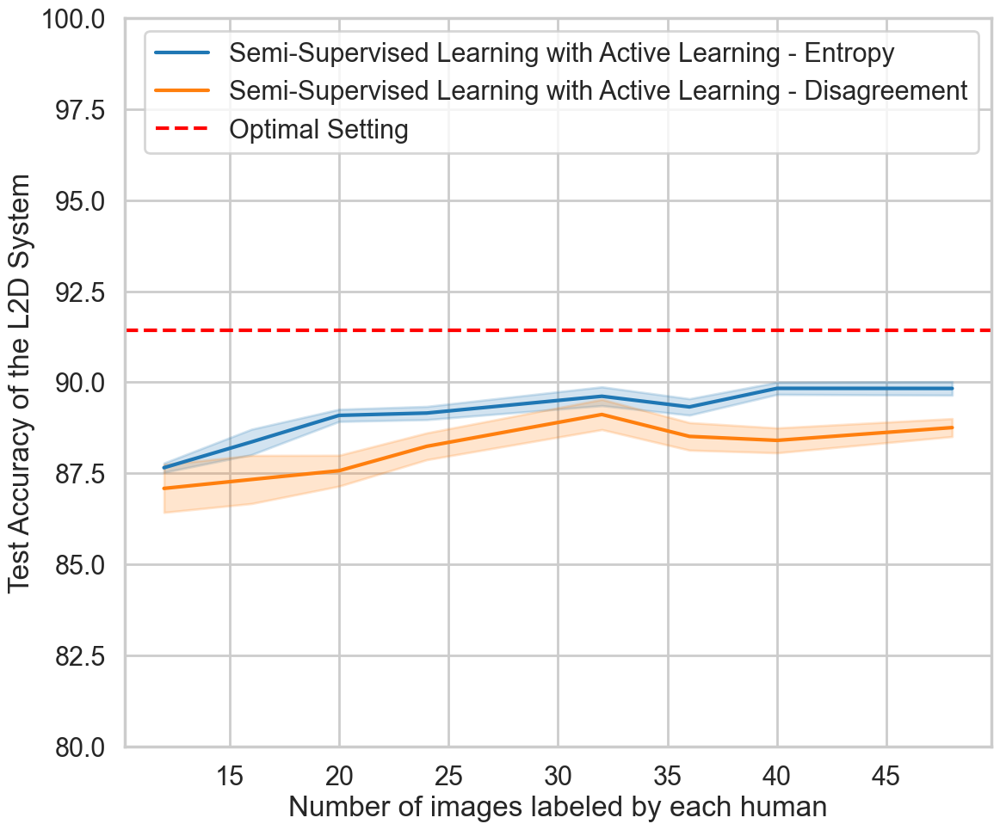

In [91]:
build_df = df.copy()
#Set ids
#build_df = build_df[build_df["labeler_ids"] != "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295349121, 4295342357]"]

dff = build_df[build_df["setting"] != "PERFECT"].copy().reset_index()
dfff = build_df[build_df["setting"] == "PERFECT"].reset_index()

dff = dff[dff["expert_predict"] == "target"]
#dff = df[df["expert_predict"] == "right"]

#dff = dff[dff["overlap"] != 0]
#dff = dff[dff["sample_equal"] != False]

#dff = dff[dff["mod"] != "disagreement_diff"]

dff = dff[dff["setting"] != "NORMAL"]
dff = dff[dff["setting"] != "SSL_AL_SSL"]
dff = dff[dff["setting"] != "AL"]
dff = dff[dff["setting"] != "SSL"]

dff["group"] = dff["group"].replace(runs_df.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=small_format)
sns.set_context("poster")
#, "overlap", "sample_equal", "expert_predict", "mod"
#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
ln = sns.lineplot(x="group", y="value", hue=dff[["setting", "mod"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))
ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")
#ax.axhline(90.1403561, ls='--', color="g")
#ax.axhline(87.5957923, ls='--', color="b")
ax.set(ylim=(80, 100))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test Accuracy of the L2D System")
plt.legend(loc='upper right')
leg_texts = ["Semi-Supervised Learning with Active Learning - Entropy", "Semi-Supervised Learning with Active Learning - Disagreement", ]
for t, l in zip(ln.legend_.texts, leg_texts):
    t.set_text(l)
plt.savefig("../../images/NIH/model_strategy_target.png", bbox_inches="tight")

In [101]:
from scipy.stats import iqr

a = dff.dropna().groupby(["setting", "mod", "expert_predict", "group"])["value"].agg([np.median, scipy.stats.iqr, scipy.stats.normaltest])#.mean()
a = a.reset_index()

a = a[a["group"] <= 50]
a = a[a["setting"] != "NORMAL"]
a = a[a["setting"] != "SSL_AL_SSL"]
a["normaltest"] = a["normaltest"].apply(lambda x: x.pvalue)

pivoted_df = a.pivot_table(index=["setting", "mod", "expert_predict"], columns="group", values=["median", "iqr", "normaltest"])
pivoted_df = pivoted_df.reset_index()

pivoted_df.to_csv("../../tables/NIH/approach_setting_acc_al_target.csv")
pivoted_df

setting                mod expert_predict       iqr                      \
group                                                  12        16        20   
0      SSL_AL         confidence         target  4.736656  4.249883  3.850267   
1      SSL_AL  disagreement_diff         target  4.762380  5.151465  5.984416   

                                               ...     median             \
group        24        32        36        40  ...         40         48   
0      4.254112  3.986167  3.541890  3.462224  ...  90.264808  90.349254   
1      4.494670  4.144526  4.166234  4.158960  ...  88.695652  88.802985   

      normaltest                                                            \
group         12        16        20            24        32            36   
0       0.003282  0.000242  0.105925  6.922823e-11  0.004540  1.372723e-07   
1       0.284775  0.731549  0.341817  1.406810e-01  0.062767  4.749403e-01   

                                   
group            40            48  
0      1.947108e-08  8.190550e-12  
1      1.580201e-01  2.935870e-04  

[2 rows x 27 columns]

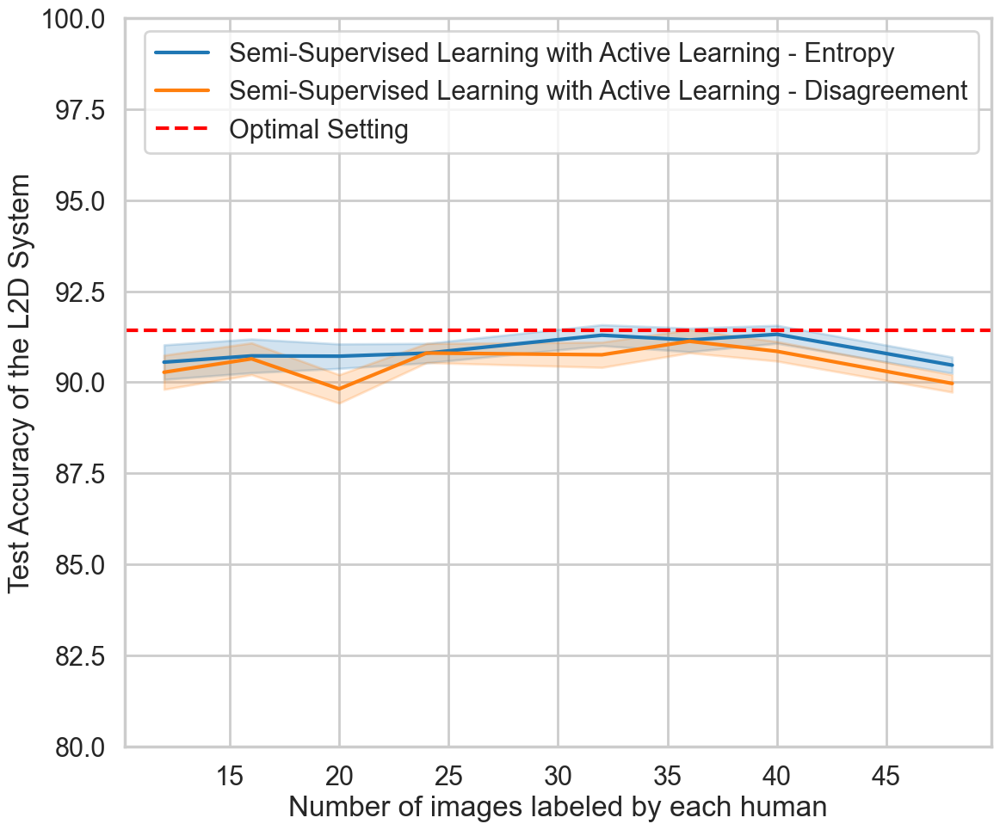

In [92]:
build_df = df.copy()
#Set ids
#build_df = build_df[build_df["labeler_ids"] != "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295349121, 4295342357]"]

dff = build_df[build_df["setting"] != "PERFECT"].copy().reset_index()
dfff = build_df[build_df["setting"] == "PERFECT"].reset_index()

#dff = dff[dff["expert_predict"] == "target"]
dff = dff[dff["expert_predict"] == "right"]

#dff = dff[dff["overlap"] != 0]
#dff = dff[dff["sample_equal"] != False]

#dff = dff[dff["mod"] != "disagreement_diff"]

dff = dff[dff["setting"] != "NORMAL"]
dff = dff[dff["setting"] != "SSL_AL_SSL"]
dff = dff[dff["setting"] != "AL"]
dff = dff[dff["setting"] != "SSL"]

dff["group"] = dff["group"].replace(runs_df.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=small_format)
sns.set_context("poster")
#, "overlap", "sample_equal", "expert_predict", "mod"
#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
ln = sns.lineplot(x="group", y="value", hue=dff[["setting", "mod"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))
ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")
#ax.axhline(90.1403561, ls='--', color="g")
#ax.axhline(87.5957923, ls='--', color="b")
ax.set(ylim=(80, 100))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test Accuracy of the L2D System")
plt.legend(loc='upper right')
leg_texts = ["Semi-Supervised Learning with Active Learning - Entropy", "Semi-Supervised Learning with Active Learning - Disagreement"]
for t, l in zip(ln.legend_.texts, leg_texts):
    t.set_text(l)
plt.savefig("../../images/NIH/model_strategy_right.png", bbox_inches="tight")

In [103]:
from scipy.stats import iqr

a = dff.dropna().groupby(["setting", "mod", "expert_predict", "group"])["value"].agg([np.median, scipy.stats.iqr, scipy.stats.normaltest])#.mean()
a = a.reset_index()

a = a[a["group"] <= 50]
a = a[a["setting"] != "NORMAL"]
a = a[a["setting"] != "SSL_AL_SSL"]
a["normaltest"] = a["normaltest"].apply(lambda x: x.pvalue)

pivoted_df = a.pivot_table(index=["setting", "mod", "expert_predict"], columns="group", values=["median", "iqr", "normaltest"])
pivoted_df = pivoted_df.reset_index()

pivoted_df.to_csv("../../tables/NIH/approach_setting_acc_al_right.csv")
pivoted_df

setting                mod expert_predict       iqr                      \
group                                                  12        16        20   
0      SSL_AL         confidence          right  4.177764  2.504878  3.812112   
1      SSL_AL  disagreement_diff          right  3.025807  2.407032  4.084711   

                                               ...     median             \
group        24        32        36        40  ...         40         48   
0      3.075638  2.665719  3.326042  2.619748  ...  90.455487  89.655172   
1      2.809482  3.317341  3.688312  2.847115  ...  89.610390  89.655172   

      normaltest                                                              \
group         12        16        20        24        32        36        40   
0       0.659157  0.597171  0.850410  0.000004  0.649230  0.645231  0.013231   
1       0.005683  0.762981  0.004157  0.974898  0.000802  0.288187  0.050217   

                 
group        48  
0      0.259622  
1      0.088547  

[2 rows x 27 columns]

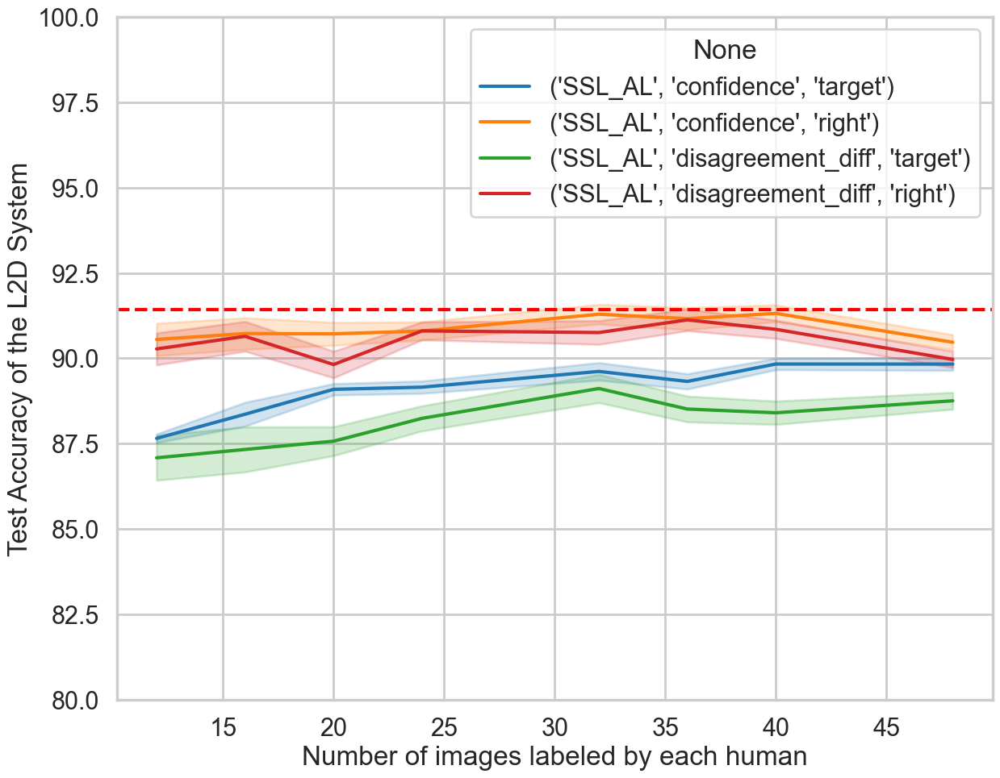

In [93]:
build_df = df.copy()
#Set ids
#build_df = build_df[build_df["labeler_ids"] != "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295349121, 4295342357]"]

dff = build_df[build_df["setting"] != "PERFECT"].copy().reset_index()
dfff = build_df[build_df["setting"] == "PERFECT"].reset_index()

#dff = dff[dff["expert_predict"] == "target"]
#dff = df[df["expert_predict"] == "right"]

#dff = dff[dff["overlap"] != 0]
#dff = dff[dff["sample_equal"] != False]

#dff = dff[dff["mod"] != "disagreement_diff"]

dff = dff[dff["setting"] != "NORMAL"]
dff = dff[dff["setting"] != "SSL_AL_SSL"]
dff = dff[dff["setting"] != "AL"]
dff = dff[dff["setting"] != "SSL"]

dff["group"] = dff["group"].replace(runs_df.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=(14, 11))
sns.set_context("poster")
#, "overlap", "sample_equal", "expert_predict", "mod"
#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
ln = sns.lineplot(x="group", y="value", hue=dff[["setting", "mod", "expert_predict"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))
ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")
#ax.axhline(90.1403561, ls='--', color="g")
#ax.axhline(87.5957923, ls='--', color="b")
ax.set(ylim=(80, 100))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test Accuracy of the L2D System")
#plt.legend(loc='upper right')
#leg_texts = ["Semi-Supervised Learning with Active Learning - Target", "Semi-Supervised Learning with Active Learning - If correct"]
#for t, l in zip(ln.legend_.texts, leg_texts):
#    t.set_text(l)
plt.savefig("../../images/NIH/model_strategy_active_learning.png", bbox_inches="tight")

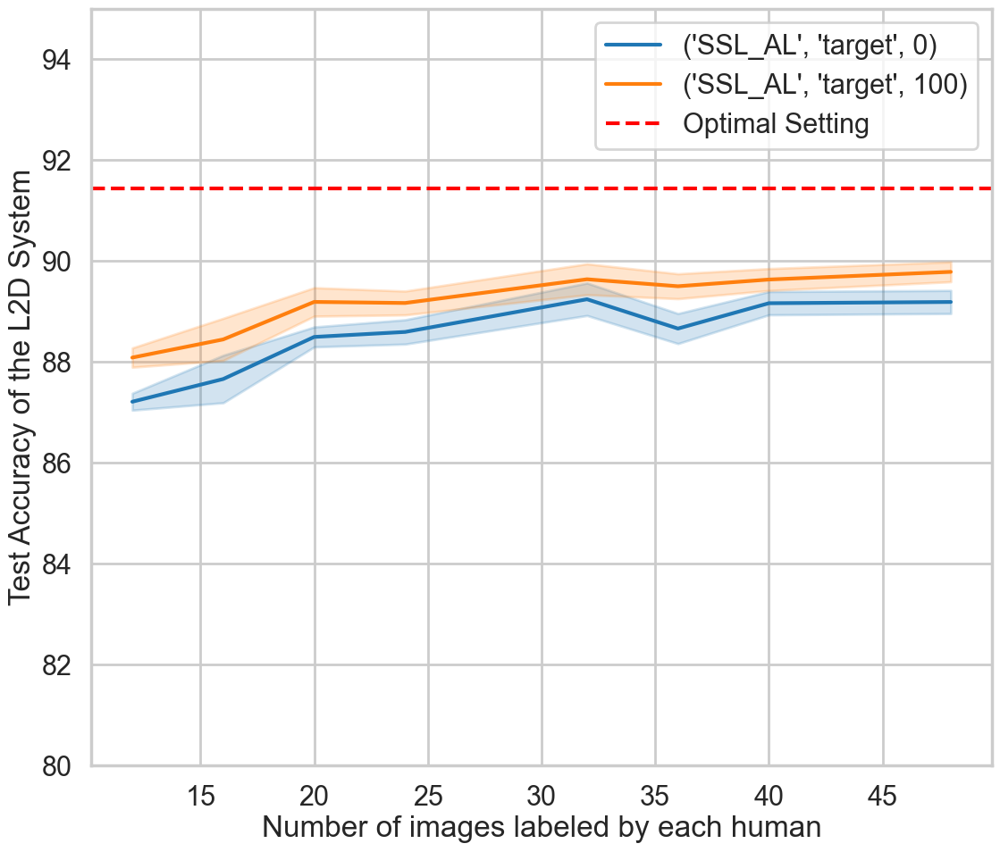

In [96]:
build_df = df.copy()
#Set ids
#build_df = build_df[build_df["labeler_ids"] != "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295349121, 4295342357]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295342357, 4295354117]"]


dff = build_df[build_df["setting"] != "PERFECT"].copy().reset_index()
dfff = build_df[build_df["setting"] == "PERFECT"].reset_index()

dff = dff[dff["expert_predict"] == "target"]
#dff = dff[dff["expert_predict"] == "right"]

#dff = dff[dff["overlap"] != 0]
#dff = dff[dff["sample_equal"] != False]

#dff = dff[dff["mod"] != "disagreement_diff"]

dff = dff[dff["setting"] != "NORMAL"]
dff = dff[dff["setting"] != "SSL_AL_SSL"]
dff = dff[dff["setting"] != "AL"]
dff = dff[dff["setting"] != "SSL"]


dff["group"] = dff["group"].replace(runs_df.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=small_format)
sns.set_context("poster")
#, "overlap", "sample_equal", "expert_predict", "mod"
#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
ln = sns.lineplot(x="group", y="value", hue=dff[["setting", "expert_predict", "overlap"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))
ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")
#ax.axhline(90.1403561, ls='--', color="g")
#ax.axhline(87.5957923, ls='--', color="b")
ax.set(ylim=(80, 95))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test Accuracy of the L2D System")
plt.legend(loc='upper right')
#leg_texts = ["Semi-Supervised Learning with Active Learning, 0% overlab", "Semi-Supervised Learning with Active Learning, 100% overlab"]
#for t, l in zip(ln.legend_.texts, leg_texts):
#    t.set_text(l)
plt.savefig("../../images/NIH/parameters_overlap_target.png", bbox_inches="tight")

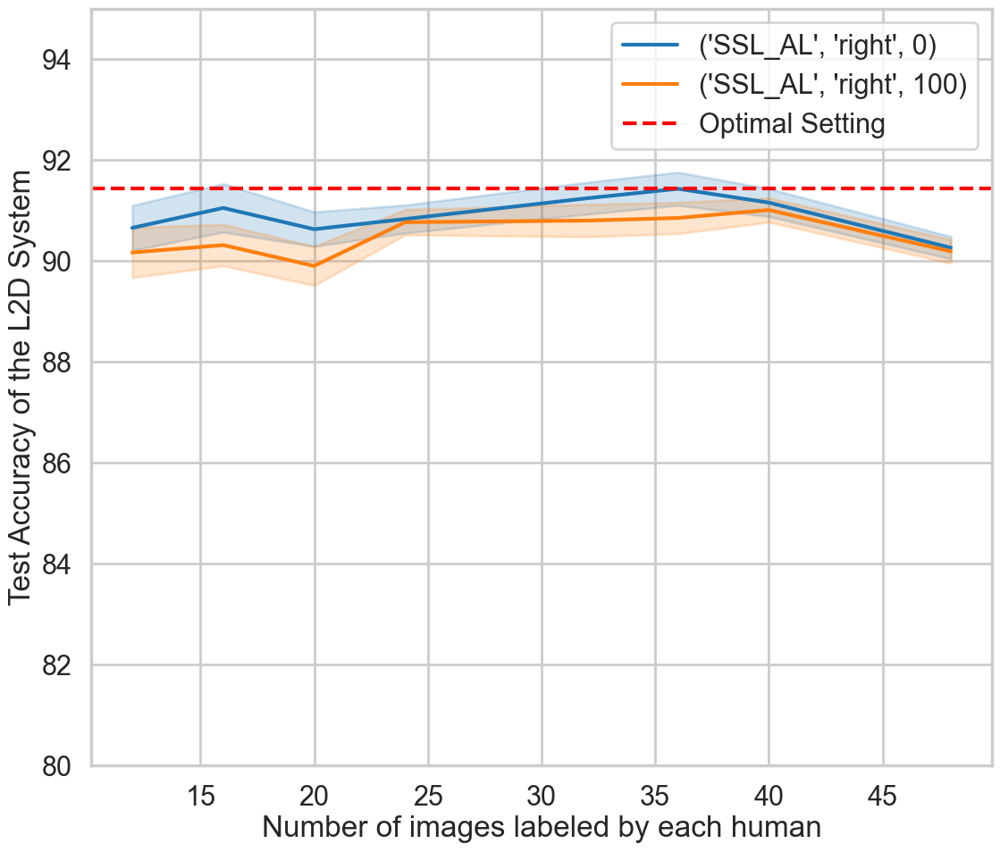

In [97]:
build_df = df.copy()
#Set ids
#build_df = build_df[build_df["labeler_ids"] != "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295349121, 4295342357]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295342357, 4295354117]"]


dff = build_df[build_df["setting"] != "PERFECT"].copy().reset_index()
dfff = build_df[build_df["setting"] == "PERFECT"].reset_index()

#dff = dff[dff["expert_predict"] == "target"]
dff = dff[dff["expert_predict"] == "right"]

#dff = dff[dff["overlap"] != 0]
#dff = dff[dff["sample_equal"] != False]

#dff = dff[dff["mod"] != "disagreement_diff"]

dff = dff[dff["setting"] != "NORMAL"]
dff = dff[dff["setting"] != "SSL_AL_SSL"]
dff = dff[dff["setting"] != "AL"]
dff = dff[dff["setting"] != "SSL"]


dff["group"] = dff["group"].replace(runs_df.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=small_format)
sns.set_context("poster")
#, "overlap", "sample_equal", "expert_predict", "mod"
#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
ln = sns.lineplot(x="group", y="value", hue=dff[["setting", "expert_predict", "overlap"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))
ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")
#ax.axhline(90.1403561, ls='--', color="g")
#ax.axhline(87.5957923, ls='--', color="b")
ax.set(ylim=(80, 95))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test Accuracy of the L2D System")
plt.legend(loc='upper right')
#leg_texts = ["Semi-Supervised Learning with Active Learning, 0% overlab", "Semi-Supervised Learning with Active Learning, 100% overlab"]
#for t, l in zip(ln.legend_.texts, leg_texts):
#    t.set_text(l)
plt.savefig("../../images/NIH/parameters_overlap_right.png", bbox_inches="tight")

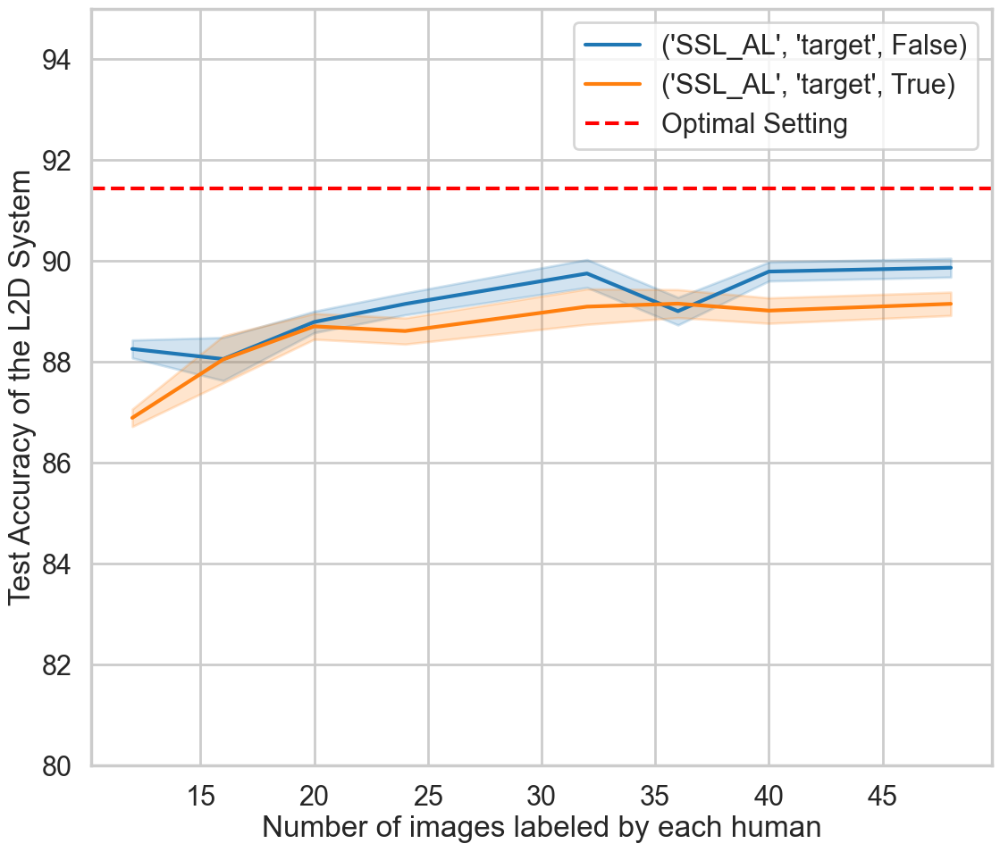

In [100]:
build_df = df.copy()
#Set ids
#build_df = build_df[build_df["labeler_ids"] != "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295349121, 4295342357]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295342357, 4295354117]"]

dff = build_df[build_df["setting"] != "PERFECT"].copy().reset_index()
dfff = build_df[build_df["setting"] == "PERFECT"].reset_index()

dff = dff[dff["expert_predict"] == "target"]
#dff = dff[dff["expert_predict"] == "right"]

#dff = dff[dff["overlap"] != 0]
#dff = dff[dff["sample_equal"] != False]

#dff = dff[dff["mod"] != "disagreement_diff"]

dff = dff[dff["setting"] != "NORMAL"]
dff = dff[dff["setting"] != "SSL_AL_SSL"]
dff = dff[dff["setting"] != "AL"]
dff = dff[dff["setting"] != "SSL"]


dff["group"] = dff["group"].replace(runs_df.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=small_format)
sns.set_context("poster")
#, "overlap", "sample_equal", "expert_predict", "mod"
#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
ln = sns.lineplot(x="group", y="value", hue=dff[["setting", "expert_predict", "sample_equal"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))

#ln = sns.lineplot(x="group", y="value", hue=dff[["setting", "expert_predict", "sample_equal"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=estimator, errorbar=(lambda x: (np.median(x)-stats.sem(x), np.median(x)+stats.sem(x))))

from scipy import stats

(lambda x: (np.median(x)-stats.sem(x), np.median(x)+stats.sem(x)))


ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")
#ax.axhline(90.1403561, ls='--', color="g")
#ax.axhline(87.5957923, ls='--', color="b")
ax.set(ylim=(80, 95))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test Accuracy of the L2D System")
plt.legend(loc='upper right')
#leg_texts = ["Semi-Supervised Learning with Active Learning, sample target randomly", "Semi-Supervised Learning with Active Learning, sample target equally"]
#for t, l in zip(ln.legend_.texts, leg_texts):
#    t.set_text(l)
plt.savefig("../../images/NIH/parameters_sample_target.png", bbox_inches="tight")

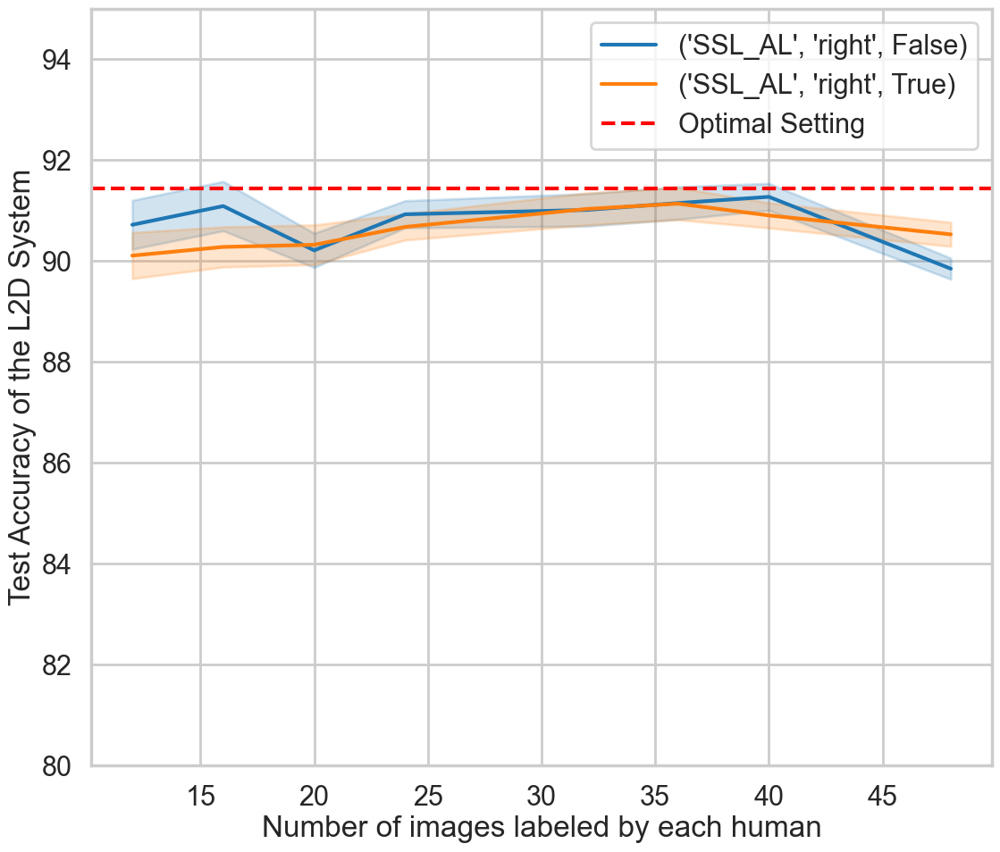

In [99]:
build_df = df.copy()
#Set ids
#build_df = build_df[build_df["labeler_ids"] != "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295349121, 4295342357]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295342357, 4295354117]"]

dff = build_df[build_df["setting"] != "PERFECT"].copy().reset_index()
dfff = build_df[build_df["setting"] == "PERFECT"].reset_index()

#dff = dff[dff["expert_predict"] == "target"]
dff = dff[dff["expert_predict"] == "right"]

#dff = dff[dff["overlap"] != 0]
#dff = dff[dff["sample_equal"] != False]

#dff = dff[dff["mod"] != "disagreement_diff"]

dff = dff[dff["setting"] != "NORMAL"]
dff = dff[dff["setting"] != "SSL_AL_SSL"]
dff = dff[dff["setting"] != "AL"]
dff = dff[dff["setting"] != "SSL"]


dff["group"] = dff["group"].replace(runs_df.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=small_format)
sns.set_context("poster")
#, "overlap", "sample_equal", "expert_predict", "mod"
#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
ln = sns.lineplot(x="group", y="value", hue=dff[["setting", "expert_predict", "sample_equal"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))

#ln = sns.lineplot(x="group", y="value", hue=dff[["setting", "expert_predict", "sample_equal"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=estimator, errorbar=(lambda x: (np.median(x)-stats.sem(x), np.median(x)+stats.sem(x))))

from scipy import stats

(lambda x: (np.median(x)-stats.sem(x), np.median(x)+stats.sem(x)))


ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")
#ax.axhline(90.1403561, ls='--', color="g")
#ax.axhline(87.5957923, ls='--', color="b")
ax.set(ylim=(80, 95))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test Accuracy of the L2D System")
plt.legend(loc='upper right')
#leg_texts = ["Semi-Supervised Learning with Active Learning, sample target randomly", "Semi-Supervised Learning with Active Learning, sample target equally"]
#for t, l in zip(ln.legend_.texts, leg_texts):
#    t.set_text(l)
plt.savefig("../../images/NIH/parameters_sample_right.png", bbox_inches="tight")

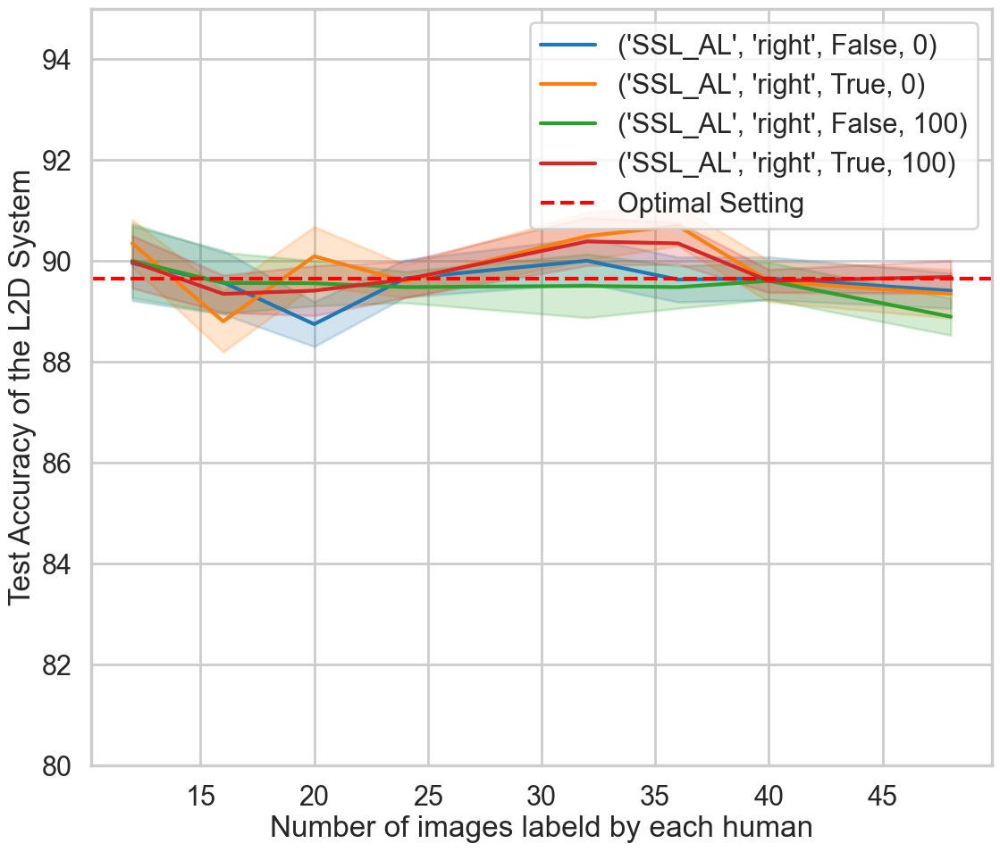

In [299]:
build_df = df.copy()
#Set ids
#build_df = build_df[build_df["labeler_ids"] != "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295349121, 4295342357]"]
build_df = build_df[build_df["labeler_ids"] != "[4295342357, 4295354117]"]

dff = build_df[build_df["setting"] != "PERFECT"].copy().reset_index()
dfff = build_df[build_df["setting"] == "PERFECT"].reset_index()

#dff = dff[dff["expert_predict"] == "target"]
dff = dff[dff["expert_predict"] == "right"]

#dff = dff[dff["overlap"] != 0]
#dff = dff[dff["sample_equal"] != False]

#dff = dff[dff["mod"] != "disagreement_diff"]

dff = dff[dff["setting"] != "NORMAL"]
dff = dff[dff["setting"] != "SSL_AL_SSL"]
dff = dff[dff["setting"] != "AL"]
dff = dff[dff["setting"] != "SSL"]


dff["group"] = dff["group"].replace(runs_df.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=small_format)
sns.set_context("poster")
#, "overlap", "sample_equal", "expert_predict", "mod"
#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
ln = sns.lineplot(x="group", y="value", hue=dff[["setting", "expert_predict", "sample_equal", "overlap"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))
ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")
#ax.axhline(90.1403561, ls='--', color="g")
#ax.axhline(87.5957923, ls='--', color="b")
ax.set(ylim=(80, 95))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test Accuracy of the L2D System")
plt.legend(loc='upper right')
#leg_texts = ["Semi-Supervised Learning with Active Learning, sample target randomly", "Semi-Supervised Learning with Active Learning, sample target equally"]
#for t, l in zip(ln.legend_.texts, leg_texts):
#    t.set_text(l)
#plt.savefig("../../images/NIH/parameters_sample.png", bbox_inches="tight")

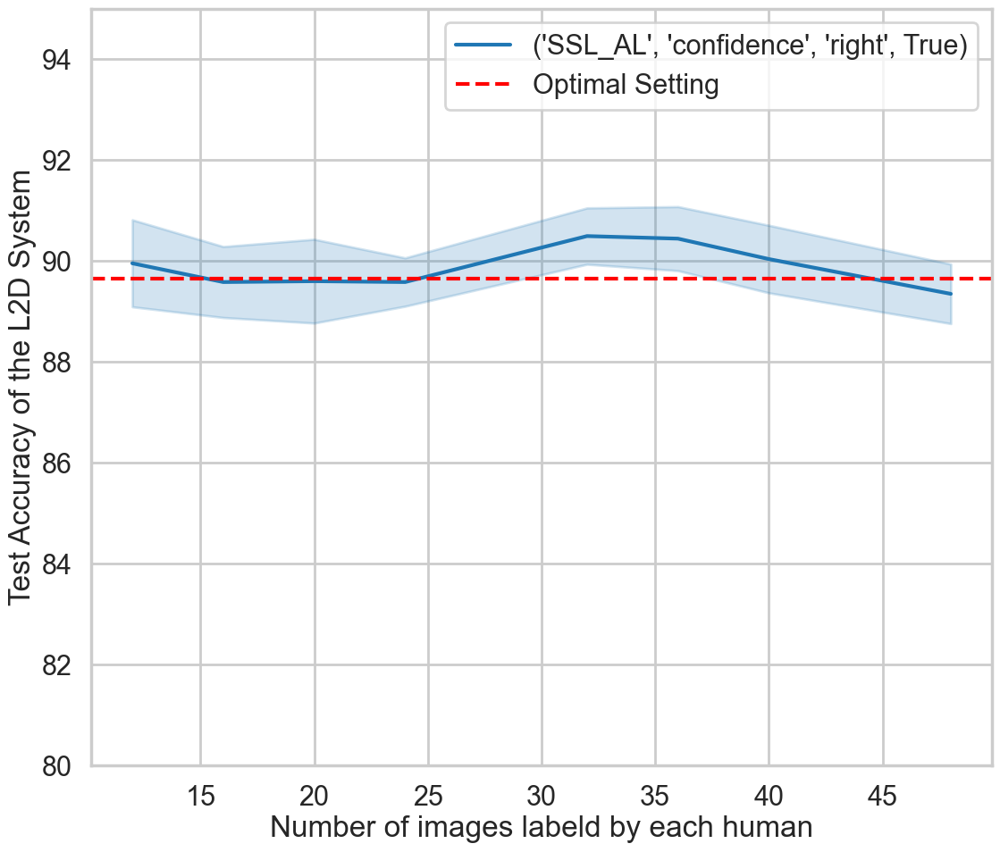

In [296]:
build_df = df.copy()
#Set ids
#build_df = build_df[build_df["labeler_ids"] == "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] == "[4295349121, 4295342357]"]
build_df = build_df[build_df["labeler_ids"] != "[4295342357, 4295354117]"]

dff = build_df[build_df["setting"] != "PERFECT"].copy().reset_index()
dfff = build_df[build_df["setting"] == "PERFECT"].reset_index()

#dff = dff[dff["expert_predict"] == "target"]
dff = dff[dff["expert_predict"] == "right"]

dff = dff[dff["overlap"] == 0]
dff = dff[dff["sample_equal"] == True]

dff = dff[dff["mod"] != "disagreement_diff"]

dff = dff[dff["setting"] != "NORMAL"]
dff = dff[dff["setting"] != "SSL_AL_SSL"]
dff = dff[dff["setting"] != "AL"]
dff = dff[dff["setting"] != "SSL"]


dff["group"] = dff["group"].replace(runs_df.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=wide_format)
sns.set_context("poster")
#, "overlap", "sample_equal", "expert_predict", "mod"
#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
ln = sns.lineplot(x="group", y="value", hue=dff[["setting", "mod", "expert_predict", "sample_equal"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))
ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")
#ax.axhline(90.1403561, ls='--', color="g")
#ax.axhline(87.5957923, ls='--', color="b")
ax.set(ylim=(80, 95))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test Accuracy of the L2D System")
plt.legend(loc='upper right')
#leg_texts = ["Semi-Supervised Learning with Active Learning, sample target randomly", "Semi-Supervised Learning with Active Learning, sample target equally"]
#for t, l in zip(ln.legend_.texts, leg_texts):
#    t.set_text(l)
plt.savefig("../../images/NIH/parameters_target.png", bbox_inches="tight")

In [260]:
med1 = dfff[dfff["labeler_ids"] == "[4323195249, 4295232296]"]["value"].median()
med2 = dfff[dfff["labeler_ids"] == "[4295349121, 4295342357]"]["value"].median()
med3 = dfff[dfff["labeler_ids"] == "[4295342357, 4295354117]"]["value"].median()



print(med1)
print(med2)
print(med3)
print(estimator(dfff["value"].dropna()))
print(np.median([med1, med2, med3]))

90.39222148978247
89.55872809863725
nan
89.65517241379311
nan


## Individual teams

### Labeler [4323195249, 4295232296]

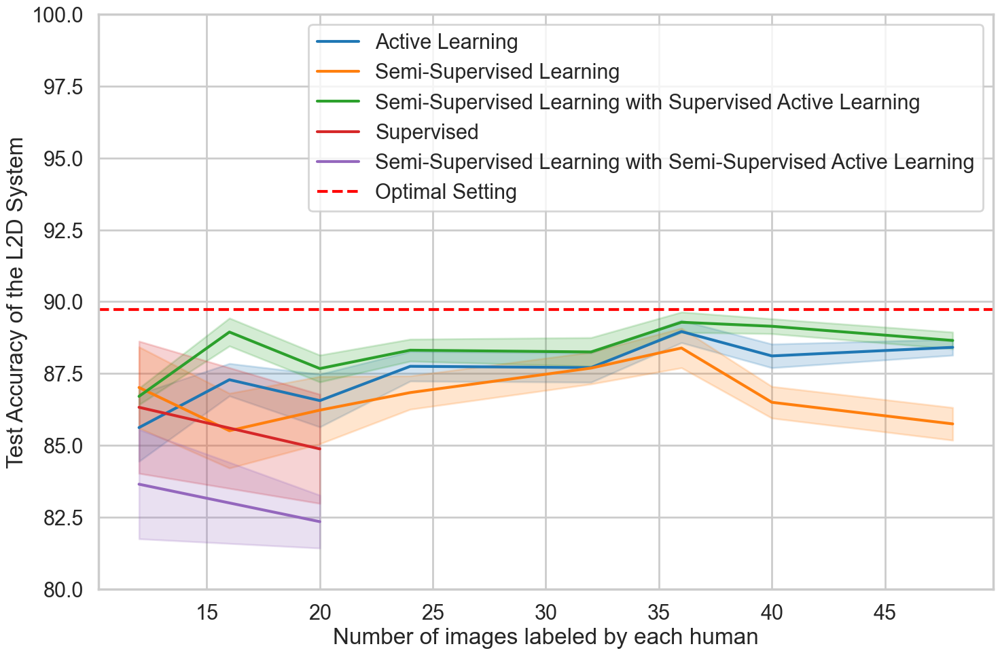

In [103]:
build_df = df.copy()
#Set ids
build_df = build_df[build_df["labeler_ids"] == "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295349121, 4295342357]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295342357, 4295354117]"]

dff = build_df[build_df["setting"] != "PERFECT"].copy().reset_index()
dfff = build_df[build_df["setting"] == "PERFECT"].reset_index()

#dff = dff[dff["expert_predict"] == "target"]
#dff = df[df["expert_predict"] == "right"]

dff = dff[dff["overlap"] != 0]
dff = dff[dff["sample_equal"] != False]

#dff = dff[dff["mod"] != "disagreement_diff"]

#dff = dff[dff["setting"] != "NORMAL"]
#dff = dff[dff["setting"] != "SSL_AL_SSL"]
#dff = dff[dff["setting"] != "AL"]
#dff = dff[dff["setting"] != "SSL"]


dff["group"] = dff["group"].replace(runs_df.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=wide_format_h)
sns.set_context("poster")

#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
ln = sns.lineplot(x="group", y="value", hue=dff[["setting"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))
ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")

ax.set(ylim=(80, 100))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test Accuracy of the L2D System")
plt.legend(loc='upper right')
leg_texts = ["Active Learning", "Semi-Supervised Learning", "Semi-Supervised Learning with Supervised Active Learning", "Supervised", "Semi-Supervised Learning with Semi-Supervised Active Learning"]
for t, l in zip(ln.legend_.texts, leg_texts):
    t.set_text(l)
plt.savefig("../../images/NIH/4996/overall_setting.png", bbox_inches="tight")

In [110]:
from scipy.stats import iqr

a = dff.dropna().groupby(["setting", "group"])["value"].agg([np.median, "mean", "std"])#.mean()
a = a.reset_index()

a = a[a["group"] <= 50]
#a = a[a["setting"] != "NORMAL"]
#a = a[a["setting"] != "SSL_AL_SSL"]

pivoted_df = a.pivot_table(index=["setting"], columns="group", values=["median", "mean", "std"])
pivoted_df = pivoted_df.reset_index()

pivoted_df.to_csv("../../tables/NIH/4996/overall_setting_acc.csv")
pivoted_df

setting       mean                                              \
group                     12         16         20         24         32   
0              AL  83.435161  86.161559  84.822939  86.575566  87.705285   
1          NORMAL  86.325035        NaN  84.877998        NaN        NaN   
2             SSL  85.391503  86.971267  85.557587  85.669690  87.032140   
3          SSL_AL  86.579782  88.941835  87.299684  87.934275  87.878996   
4      SSL_AL_SSL  83.649263        NaN  82.346290        NaN        NaN   

                                           median  ...                        \
group         36         40         48         12  ...         40         48   
0      89.230984  87.063395  88.050252  82.954545  ...  88.095238  88.273491   
1            NaN        NaN        NaN  87.058824  ...        NaN        NaN   
2      86.991320  86.115959  82.904209  85.882353  ...  86.555829  82.363039   
3      89.199876  88.938371  88.531345  86.585366  ...  89.237452  89.017690   
4            NaN        NaN        NaN  85.714286  ...        NaN        NaN   

            std                                                              \
group        12        16        20        24        32        36        40   
0      5.096991  2.056731  6.157143  4.165718  2.866991  2.384140  2.846759   
1      5.139950       NaN  4.245242       NaN       NaN       NaN       NaN   
2      4.076233  3.139150  5.971925  2.754449  2.161768  3.398105  1.962131   
3      3.236515  2.779238  3.557892  3.371608  3.504472  2.506288  2.489312   
4      4.250216       NaN  1.842432       NaN       NaN       NaN       NaN   

                 
group        48  
0      2.177931  
1           NaN  
2      1.833314  
3      2.923611  
4           NaN  

[5 rows x 25 columns]

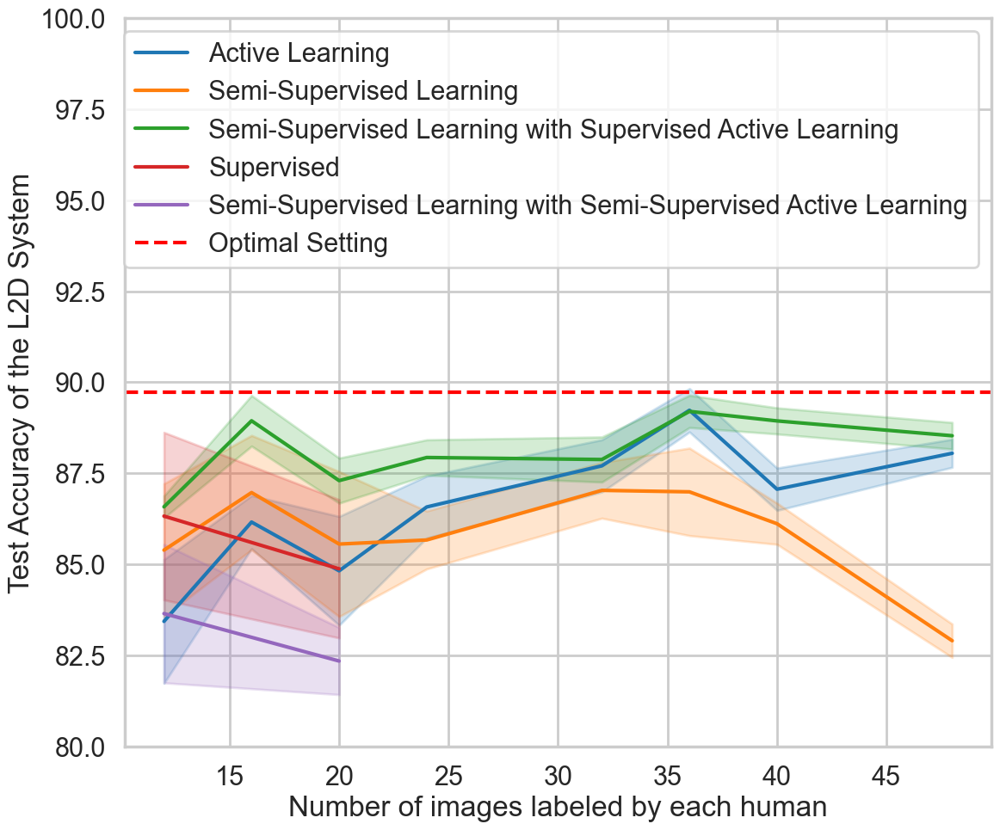

In [107]:
build_df = df.copy()
#Set ids
build_df = build_df[build_df["labeler_ids"] == "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295349121, 4295342357]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295342357, 4295354117]"]

dff = build_df[build_df["setting"] != "PERFECT"].copy().reset_index()
dfff = build_df[build_df["setting"] == "PERFECT"].reset_index()

dff = dff[dff["expert_predict"] == "target"]
#dff = df[df["expert_predict"] == "right"]

dff = dff[dff["overlap"] != 0]
dff = dff[dff["sample_equal"] != False]

#dff = dff[dff["mod"] != "disagreement_diff"]

#dff = dff[dff["setting"] != "NORMAL"]
#dff = dff[dff["setting"] != "SSL_AL_SSL"]
#dff = dff[dff["setting"] != "AL"]
#dff = dff[dff["setting"] != "SSL"]


dff["group"] = dff["group"].replace(runs_df.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=small_format)
sns.set_context("poster")

#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
ln = sns.lineplot(x="group", y="value", hue=dff[["setting"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))
ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")

ax.set(ylim=(80, 100))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test Accuracy of the L2D System")
plt.legend(loc='upper right')
leg_texts = ["Active Learning", "Semi-Supervised Learning", "Semi-Supervised Learning with Supervised Active Learning", "Supervised", "Semi-Supervised Learning with Semi-Supervised Active Learning"]
for t, l in zip(ln.legend_.texts, leg_texts):
    t.set_text(l)
plt.savefig("../../images/NIH/4996/overall_setting_target.png", bbox_inches="tight")

In [111]:
from scipy.stats import iqr

a = dff.dropna().groupby(["setting", "group"])["value"].agg([np.median, "mean", "std"])#.mean()
a = a.reset_index()

a = a[a["group"] <= 50]
#a = a[a["setting"] != "NORMAL"]
#a = a[a["setting"] != "SSL_AL_SSL"]

pivoted_df = a.pivot_table(index=["setting"], columns="group", values=["median", "mean", "std"])
pivoted_df = pivoted_df.reset_index()

pivoted_df.to_csv("../../tables/NIH/4996/overall_setting_acc_target.csv")
pivoted_df

setting       mean                                              \
group                     12         16         20         24         32   
0              AL  83.435161  86.161559  84.822939  86.575566  87.705285   
1          NORMAL  86.325035        NaN  84.877998        NaN        NaN   
2             SSL  85.391503  86.971267  85.557587  85.669690  87.032140   
3          SSL_AL  86.579782  88.941835  87.299684  87.934275  87.878996   
4      SSL_AL_SSL  83.649263        NaN  82.346290        NaN        NaN   

                                           median  ...                        \
group         36         40         48         12  ...         40         48   
0      89.230984  87.063395  88.050252  82.954545  ...  88.095238  88.273491   
1            NaN        NaN        NaN  87.058824  ...        NaN        NaN   
2      86.991320  86.115959  82.904209  85.882353  ...  86.555829  82.363039   
3      89.199876  88.938371  88.531345  86.585366  ...  89.237452  89.017690   
4            NaN        NaN        NaN  85.714286  ...        NaN        NaN   

            std                                                              \
group        12        16        20        24        32        36        40   
0      5.096991  2.056731  6.157143  4.165718  2.866991  2.384140  2.846759   
1      5.139950       NaN  4.245242       NaN       NaN       NaN       NaN   
2      4.076233  3.139150  5.971925  2.754449  2.161768  3.398105  1.962131   
3      3.236515  2.779238  3.557892  3.371608  3.504472  2.506288  2.489312   
4      4.250216       NaN  1.842432       NaN       NaN       NaN       NaN   

                 
group        48  
0      2.177931  
1           NaN  
2      1.833314  
3      2.923611  
4           NaN  

[5 rows x 25 columns]

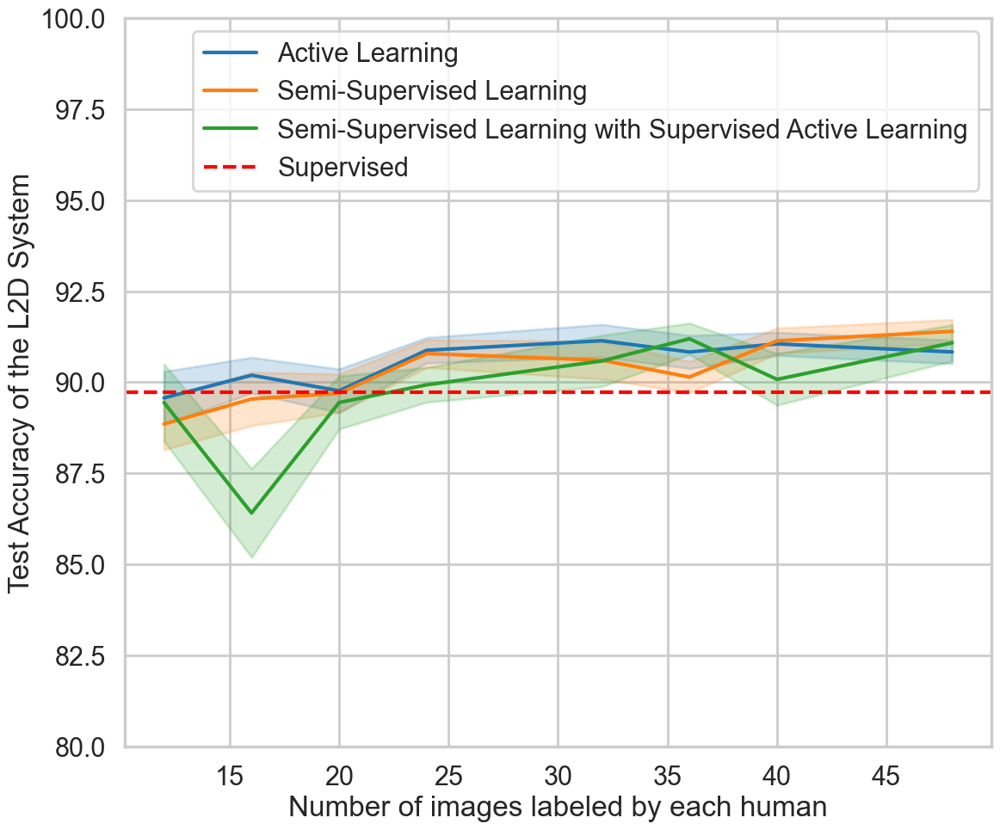

In [113]:
build_df = df.copy()
#Set ids
build_df = build_df[build_df["labeler_ids"] == "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295349121, 4295342357]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295342357, 4295354117]"]

dff = build_df[build_df["setting"] != "PERFECT"].copy().reset_index()
dfff = build_df[build_df["setting"] == "PERFECT"].reset_index()

#dff = dff[dff["expert_predict"] == "target"]
dff = df[df["expert_predict"] == "right"]

dff = dff[dff["overlap"] != 0]
dff = dff[dff["sample_equal"] != False]

#dff = dff[dff["mod"] != "disagreement_diff"]

#dff = dff[dff["setting"] != "NORMAL"]
#dff = dff[dff["setting"] != "SSL_AL_SSL"]
#dff = dff[dff["setting"] != "AL"]
#dff = dff[dff["setting"] != "SSL"]


dff["group"] = dff["group"].replace(runs_df.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=small_format)
sns.set_context("poster")

#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
ln = sns.lineplot(x="group", y="value", hue=dff[["setting"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))
ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")

ax.set(ylim=(80, 100))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test Accuracy of the L2D System")
plt.legend(loc='upper right')
leg_texts = ["Active Learning", "Semi-Supervised Learning", "Semi-Supervised Learning with Supervised Active Learning", "Supervised", "Semi-Supervised Learning with Semi-Supervised Active Learning"]
for t, l in zip(ln.legend_.texts, leg_texts):
    t.set_text(l)
plt.savefig("../../images/NIH/4996/overall_setting_right.png", bbox_inches="tight")

In [114]:
from scipy.stats import iqr

a = dff.dropna().groupby(["setting", "group"])["value"].agg([np.median, "mean", "std"])#.mean()
a = a.reset_index()

a = a[a["group"] <= 50]
#a = a[a["setting"] != "NORMAL"]
#a = a[a["setting"] != "SSL_AL_SSL"]

pivoted_df = a.pivot_table(index=["setting"], columns="group", values=["median", "mean", "std"])
pivoted_df = pivoted_df.reset_index()

pivoted_df.to_csv("../../tables/NIH/4996/overall_setting_acc_right.csv")
pivoted_df

setting       mean                                              \
group                 12         16         20         24         32   
0          AL  88.852928  89.540360  89.697182  90.786885  90.604984   
1         SSL  89.442911  86.410016  89.443602  89.929481  90.583960   
2      SSL_AL  89.570734  90.192320  89.765907  90.878327  91.140428   

                                           median  ...                        \
group         36         40         48         12  ...         40         48   
0      90.143474  91.136696  91.397114  89.482002  ...  90.856844  91.044776   
1      91.192951  90.078621  91.080676  90.387349  ...  90.043290  89.505882   
2      90.830629  91.053088  90.832742  89.982609  ...  90.476190  90.856844   

            std                                                              \
group        12        16        20        24        32        36        40   
0      3.445829  3.584940  3.654463  3.222482  3.598689  2.977900  2.962498   
1      3.655262  4.215380  3.572189  2.849548  3.444589  2.104221  4.246964   
2      3.559582  2.400077  4.146218  2.959034  3.095299  3.135181  2.690503   

                 
group        48  
0      3.158980  
1      3.435635  
2      3.156338  

[3 rows x 25 columns]

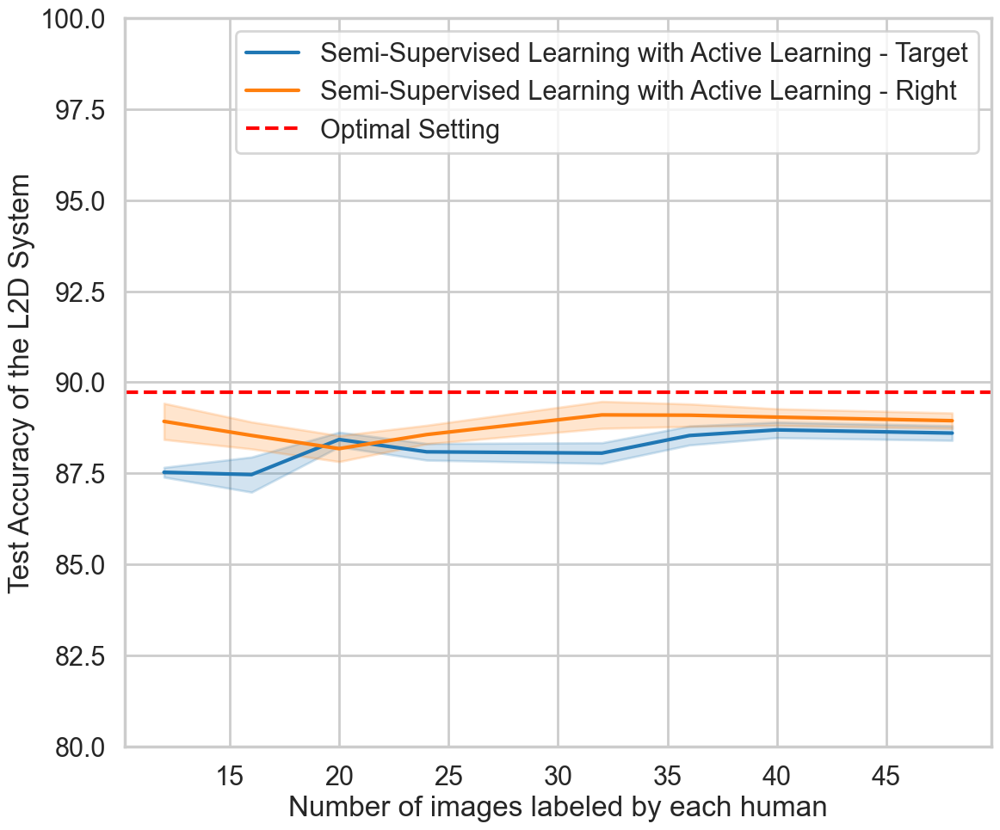

In [121]:
build_df = df.copy()
#Set ids
build_df = build_df[build_df["labeler_ids"] == "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] != "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295349121, 4295342357]"]

dff = build_df[build_df["setting"] != "PERFECT"].copy().reset_index()
dfff = build_df[build_df["setting"] == "PERFECT"].reset_index()

#dff = dff[dff["expert_predict"] == "target"]
#dff = df[df["expert_predict"] == "right"]

#dff = dff[dff["overlap"] != 0]
#dff = dff[dff["sample_equal"] != False]

#dff = dff[dff["mod"] != "disagreement_diff"]

dff = dff[dff["setting"] != "NORMAL"]
dff = dff[dff["setting"] != "SSL_AL_SSL"]
dff = dff[dff["setting"] != "AL"]
dff = dff[dff["setting"] != "SSL"]


dff["group"] = dff["group"].replace(runs_df.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=small_format)
sns.set_context("poster")
#, "overlap", "sample_equal", "expert_predict", "mod"
#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
ln = sns.lineplot(x="group", y="value", hue=dff[["setting", "expert_predict"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))
ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")
#ax.axhline(90.1403561, ls='--', color="g")
#ax.axhline(87.5957923, ls='--', color="b")
ax.set(ylim=(80, 100))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test Accuracy of the L2D System")
plt.legend(loc='upper right')
leg_texts = ["Semi-Supervised Learning with Active Learning - Target", "Semi-Supervised Learning with Active Learning - Right"]
for t, l in zip(ln.legend_.texts, leg_texts):
    t.set_text(l)
plt.savefig("../../images/NIH/4996/expert_strategy.png", bbox_inches="tight")

In [ ]:
from scipy.stats import iqr

a = dff.dropna().groupby(["setting", "group"])["value"].agg([np.median, "mean", "std"])#.mean()
a = a.reset_index()

a = a[a["group"] <= 50]
#a = a[a["setting"] != "NORMAL"]
#a = a[a["setting"] != "SSL_AL_SSL"]

pivoted_df = a.pivot_table(index=["setting"], columns="group", values=["median", "mean", "std"])
pivoted_df = pivoted_df.reset_index()

pivoted_df.to_csv("../../tables/NIH/4996/approach_acc_model_strategy.csv")
pivoted_df

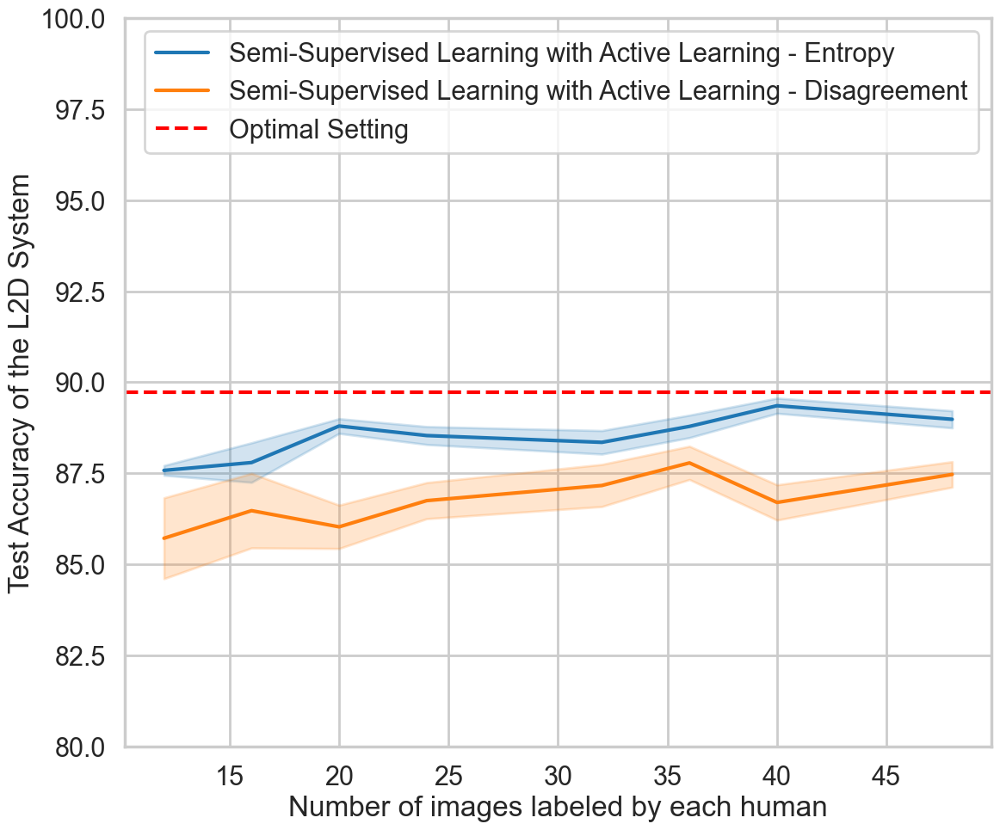

In [124]:
build_df = df.copy()
#Set ids
build_df = build_df[build_df["labeler_ids"] == "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295349121, 4295342357]"]

dff = build_df[build_df["setting"] != "PERFECT"].copy().reset_index()
dfff = build_df[build_df["setting"] == "PERFECT"].reset_index()

dff = dff[dff["expert_predict"] == "target"]
#dff = df[df["expert_predict"] == "right"]

#dff = dff[dff["overlap"] != 0]
#dff = dff[dff["sample_equal"] != False]

#dff = dff[dff["mod"] != "disagreement_diff"]

dff = dff[dff["setting"] != "NORMAL"]
dff = dff[dff["setting"] != "SSL_AL_SSL"]
dff = dff[dff["setting"] != "AL"]
dff = dff[dff["setting"] != "SSL"]

dff["group"] = dff["group"].replace(runs_df.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=small_format)
sns.set_context("poster")
#, "overlap", "sample_equal", "expert_predict", "mod"
#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
ln = sns.lineplot(x="group", y="value", hue=dff[["setting", "mod"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))
ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")
#ax.axhline(90.1403561, ls='--', color="g")
#ax.axhline(87.5957923, ls='--', color="b")
ax.set(ylim=(80, 100))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test Accuracy of the L2D System")
plt.legend(loc='upper right')
leg_texts = ["Semi-Supervised Learning with Active Learning - Entropy", "Semi-Supervised Learning with Active Learning - Disagreement"]
for t, l in zip(ln.legend_.texts, leg_texts):
    t.set_text(l)
plt.savefig("../../images/NIH/4996/al_strategy_target.png", bbox_inches="tight")

In [ ]:
from scipy.stats import iqr

a = dff.dropna().groupby(["setting", "group"])["value"].agg([np.median, "mean", "std"])#.mean()
a = a.reset_index()

a = a[a["group"] <= 50]
#a = a[a["setting"] != "NORMAL"]
#a = a[a["setting"] != "SSL_AL_SSL"]

pivoted_df = a.pivot_table(index=["setting"], columns="group", values=["median", "mean", "std"])
pivoted_df = pivoted_df.reset_index()

pivoted_df.to_csv("../../tables/NIH/4996/approach_acc_al_strategy_target.csv")
pivoted_df

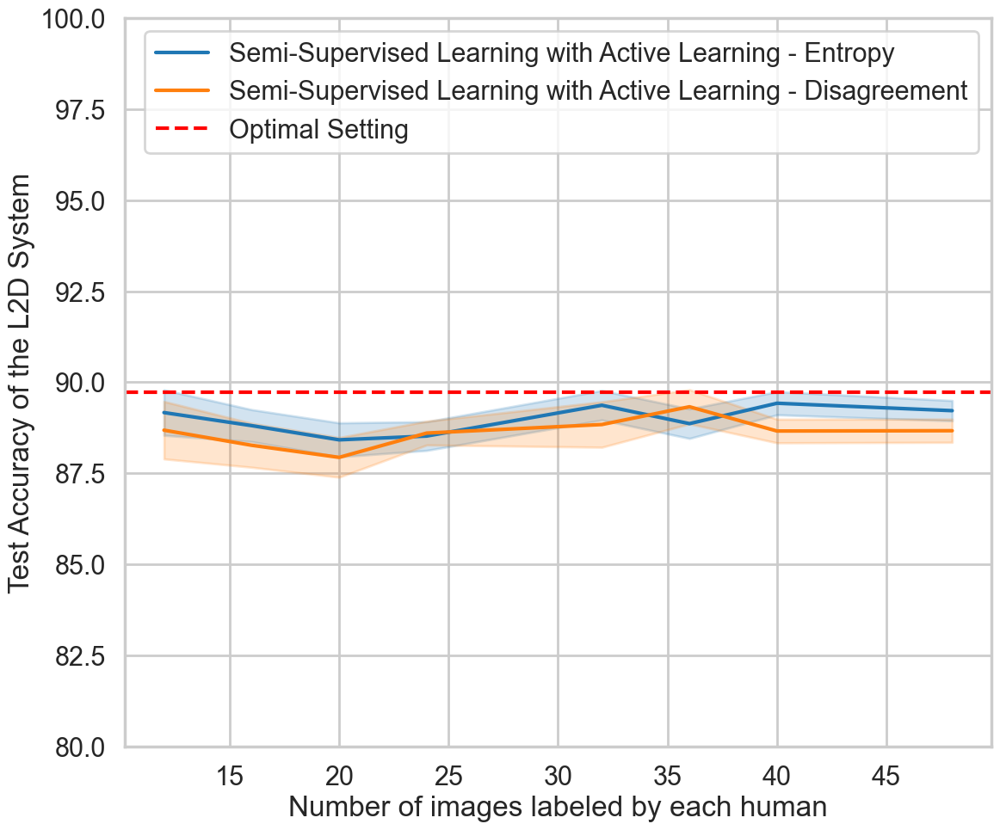

In [126]:
build_df = df.copy()
#Set ids
build_df = build_df[build_df["labeler_ids"] == "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295349121, 4295342357]"]

dff = build_df[build_df["setting"] != "PERFECT"].copy().reset_index()
dfff = build_df[build_df["setting"] == "PERFECT"].reset_index()

#dff = dff[dff["expert_predict"] == "target"]
dff = dff[dff["expert_predict"] == "right"]

#dff = dff[dff["overlap"] != 0]
#dff = dff[dff["sample_equal"] != False]

#dff = dff[dff["mod"] != "disagreement_diff"]

dff = dff[dff["setting"] != "NORMAL"]
dff = dff[dff["setting"] != "SSL_AL_SSL"]
dff = dff[dff["setting"] != "AL"]
dff = dff[dff["setting"] != "SSL"]

dff["group"] = dff["group"].replace(runs_df.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=small_format)
sns.set_context("poster")
#, "overlap", "sample_equal", "expert_predict", "mod"
#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
ln = sns.lineplot(x="group", y="value", hue=dff[["setting", "mod"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))
ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")
#ax.axhline(90.1403561, ls='--', color="g")
#ax.axhline(87.5957923, ls='--', color="b")
ax.set(ylim=(80, 100))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test Accuracy of the L2D System")
plt.legend(loc='upper right')
leg_texts = ["Semi-Supervised Learning with Active Learning - Entropy", "Semi-Supervised Learning with Active Learning - Disagreement"]
for t, l in zip(ln.legend_.texts, leg_texts):
    t.set_text(l)
plt.savefig("../../images/NIH/4996/al_strategy_right.png", bbox_inches="tight")

In [ ]:
from scipy.stats import iqr

a = dff.dropna().groupby(["setting", "group"])["value"].agg([np.median, "mean", "std"])#.mean()
a = a.reset_index()

a = a[a["group"] <= 50]
#a = a[a["setting"] != "NORMAL"]
#a = a[a["setting"] != "SSL_AL_SSL"]

pivoted_df = a.pivot_table(index=["setting"], columns="group", values=["median", "mean", "std"])
pivoted_df = pivoted_df.reset_index()

pivoted_df.to_csv("../../tables/NIH/4996/approach_acc_al_strategy_right.csv")
pivoted_df

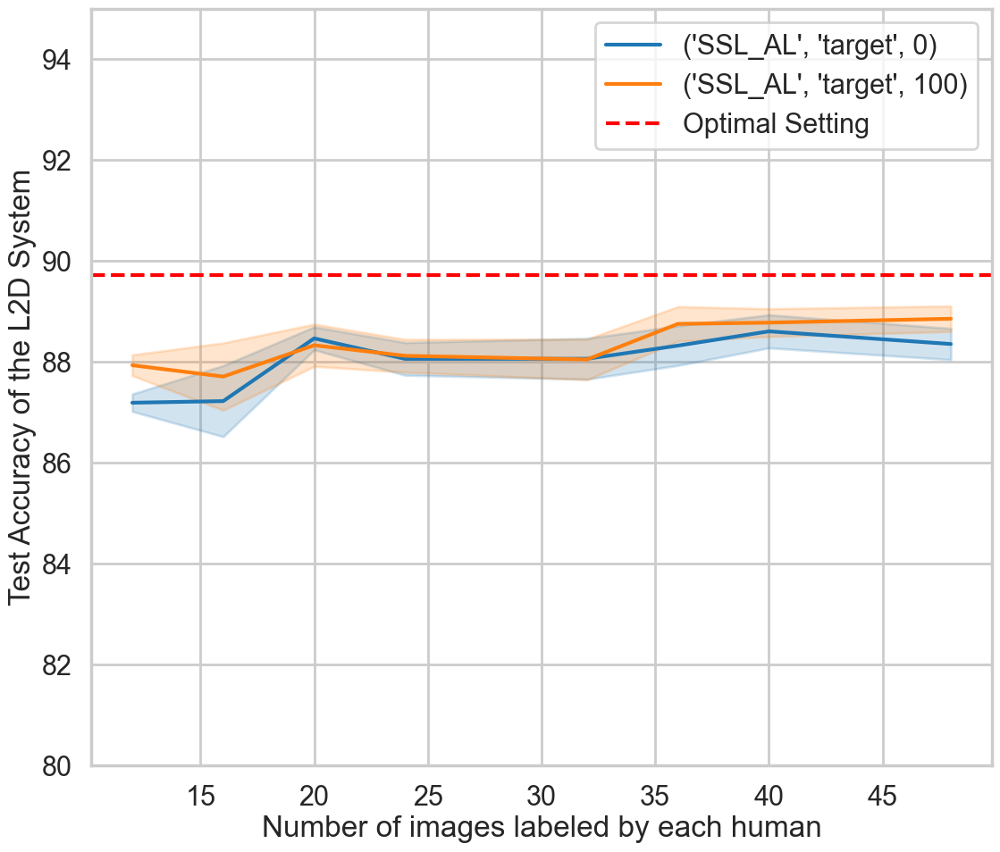

In [127]:
build_df = df.copy()
#Set ids
build_df = build_df[build_df["labeler_ids"] == "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295349121, 4295342357]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295342357, 4295354117]"]


dff = build_df[build_df["setting"] != "PERFECT"].copy().reset_index()
dfff = build_df[build_df["setting"] == "PERFECT"].reset_index()

dff = dff[dff["expert_predict"] == "target"]
#dff = dff[dff["expert_predict"] == "right"]

#dff = dff[dff["overlap"] != 0]
#dff = dff[dff["sample_equal"] != False]

#dff = dff[dff["mod"] != "disagreement_diff"]

dff = dff[dff["setting"] != "NORMAL"]
dff = dff[dff["setting"] != "SSL_AL_SSL"]
dff = dff[dff["setting"] != "AL"]
dff = dff[dff["setting"] != "SSL"]


dff["group"] = dff["group"].replace(runs_df.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=small_format)
sns.set_context("poster")
#, "overlap", "sample_equal", "expert_predict", "mod"
#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
ln = sns.lineplot(x="group", y="value", hue=dff[["setting", "expert_predict", "overlap"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))
ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")
#ax.axhline(90.1403561, ls='--', color="g")
#ax.axhline(87.5957923, ls='--', color="b")
ax.set(ylim=(80, 95))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test Accuracy of the L2D System")
plt.legend(loc='upper right')
#leg_texts = ["Semi-Supervised Learning with Active Learning, 0% overlab", "Semi-Supervised Learning with Active Learning, 100% overlab"]
#for t, l in zip(ln.legend_.texts, leg_texts):
#    t.set_text(l)
plt.savefig("../../images/NIH/4996/parameters_overlap_target.png", bbox_inches="tight")

In [ ]:
from scipy.stats import iqr

a = dff.dropna().groupby(["setting", "group"])["value"].agg([np.median, "mean", "std"])#.mean()
a = a.reset_index()

a = a[a["group"] <= 50]
#a = a[a["setting"] != "NORMAL"]
#a = a[a["setting"] != "SSL_AL_SSL"]

pivoted_df = a.pivot_table(index=["setting"], columns="group", values=["median", "mean", "std"])
pivoted_df = pivoted_df.reset_index()

pivoted_df.to_csv("../../tables/NIH/4996/approach_acc_overlap_target.csv")
pivoted_df

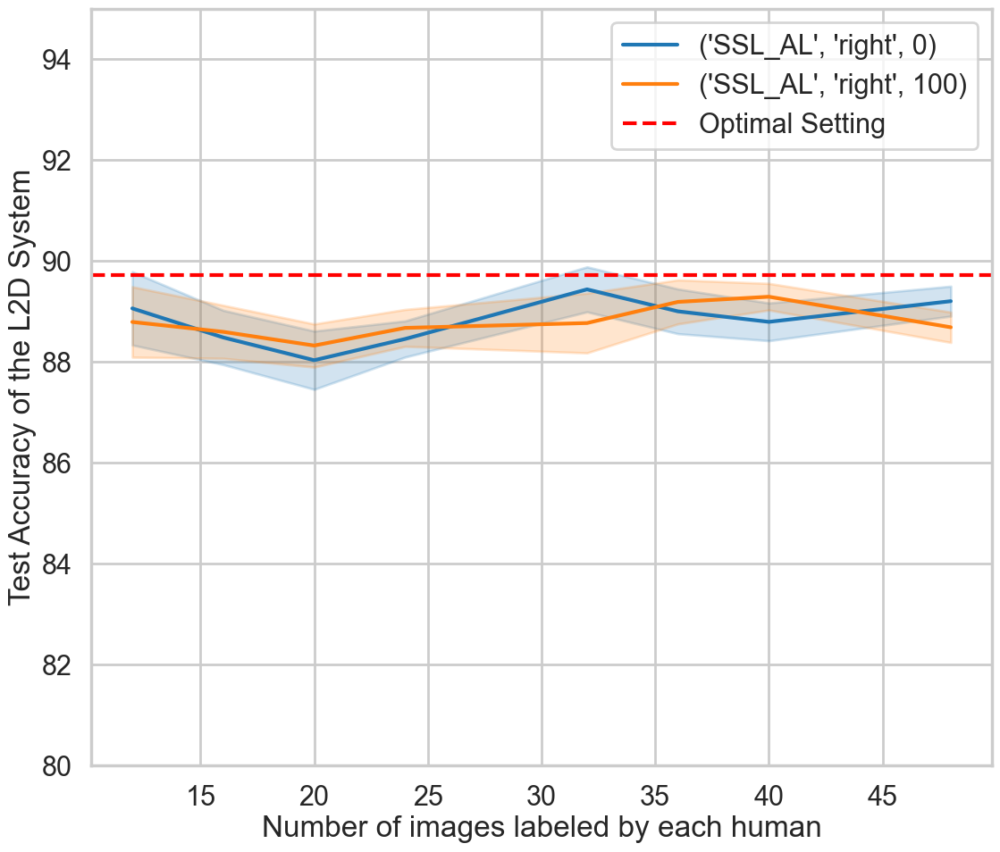

In [128]:
build_df = df.copy()
#Set ids
build_df = build_df[build_df["labeler_ids"] == "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295349121, 4295342357]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295342357, 4295354117]"]


dff = build_df[build_df["setting"] != "PERFECT"].copy().reset_index()
dfff = build_df[build_df["setting"] == "PERFECT"].reset_index()

#dff = dff[dff["expert_predict"] == "target"]
dff = dff[dff["expert_predict"] == "right"]

#dff = dff[dff["overlap"] != 0]
#dff = dff[dff["sample_equal"] != False]

#dff = dff[dff["mod"] != "disagreement_diff"]

dff = dff[dff["setting"] != "NORMAL"]
dff = dff[dff["setting"] != "SSL_AL_SSL"]
dff = dff[dff["setting"] != "AL"]
dff = dff[dff["setting"] != "SSL"]


dff["group"] = dff["group"].replace(runs_df.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=small_format)
sns.set_context("poster")
#, "overlap", "sample_equal", "expert_predict", "mod"
#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
ln = sns.lineplot(x="group", y="value", hue=dff[["setting", "expert_predict", "overlap"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))
ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")
#ax.axhline(90.1403561, ls='--', color="g")
#ax.axhline(87.5957923, ls='--', color="b")
ax.set(ylim=(80, 95))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test Accuracy of the L2D System")
plt.legend(loc='upper right')
#leg_texts = ["Semi-Supervised Learning with Active Learning, 0% overlab", "Semi-Supervised Learning with Active Learning, 100% overlab"]
#for t, l in zip(ln.legend_.texts, leg_texts):
#    t.set_text(l)
plt.savefig("../../images/NIH/4996/parameters_overlap_right.png", bbox_inches="tight")

In [ ]:
from scipy.stats import iqr

a = dff.dropna().groupby(["setting", "group"])["value"].agg([np.median, "mean", "std"])#.mean()
a = a.reset_index()

a = a[a["group"] <= 50]
#a = a[a["setting"] != "NORMAL"]
#a = a[a["setting"] != "SSL_AL_SSL"]

pivoted_df = a.pivot_table(index=["setting"], columns="group", values=["median", "mean", "std"])
pivoted_df = pivoted_df.reset_index()

pivoted_df.to_csv("../../tables/NIH/4996/approach_acc_overlap_right.csv")
pivoted_df

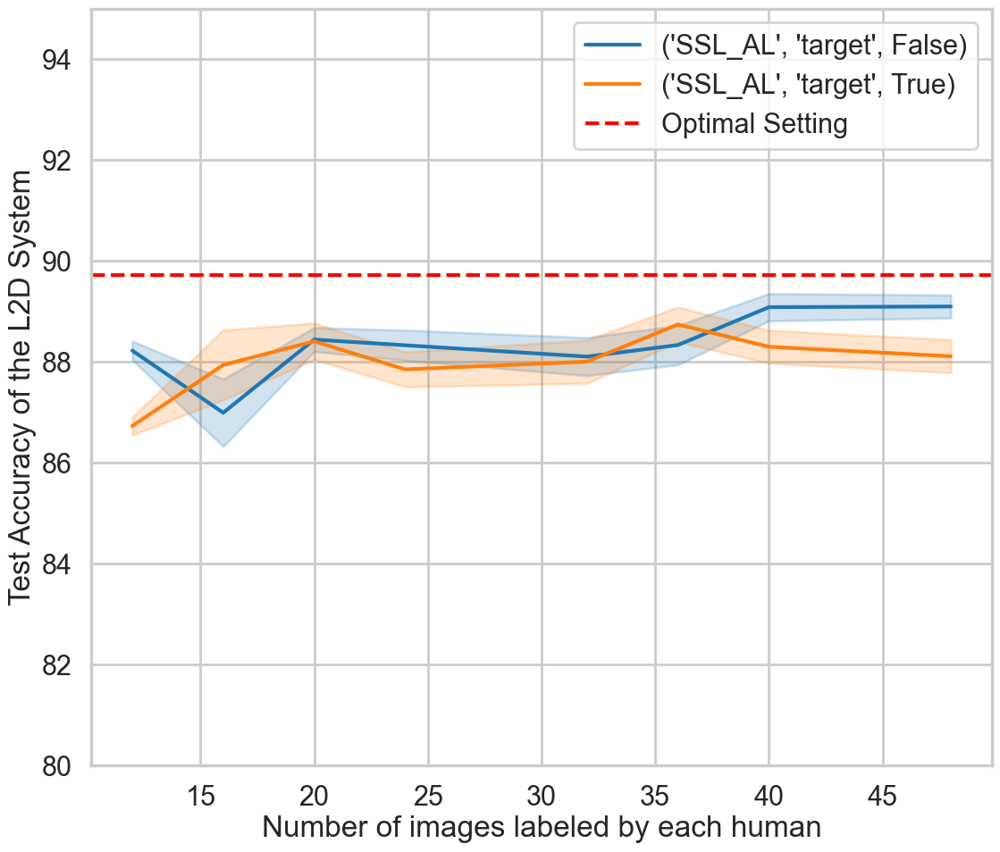

In [129]:
build_df = df.copy()
#Set ids
build_df = build_df[build_df["labeler_ids"] == "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295349121, 4295342357]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295342357, 4295354117]"]

dff = build_df[build_df["setting"] != "PERFECT"].copy().reset_index()
dfff = build_df[build_df["setting"] == "PERFECT"].reset_index()

dff = dff[dff["expert_predict"] == "target"]
#dff = dff[dff["expert_predict"] == "right"]

#dff = dff[dff["overlap"] != 0]
#dff = dff[dff["sample_equal"] != False]

#dff = dff[dff["mod"] != "disagreement_diff"]

dff = dff[dff["setting"] != "NORMAL"]
dff = dff[dff["setting"] != "SSL_AL_SSL"]
dff = dff[dff["setting"] != "AL"]
dff = dff[dff["setting"] != "SSL"]


dff["group"] = dff["group"].replace(runs_df.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=small_format)
sns.set_context("poster")
#, "overlap", "sample_equal", "expert_predict", "mod"
#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
ln = sns.lineplot(x="group", y="value", hue=dff[["setting", "expert_predict", "sample_equal"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))

#ln = sns.lineplot(x="group", y="value", hue=dff[["setting", "expert_predict", "sample_equal"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=estimator, errorbar=(lambda x: (np.median(x)-stats.sem(x), np.median(x)+stats.sem(x))))

from scipy import stats

(lambda x: (np.median(x)-stats.sem(x), np.median(x)+stats.sem(x)))


ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")
#ax.axhline(90.1403561, ls='--', color="g")
#ax.axhline(87.5957923, ls='--', color="b")
ax.set(ylim=(80, 95))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test Accuracy of the L2D System")
plt.legend(loc='upper right')
#leg_texts = ["Semi-Supervised Learning with Active Learning, sample target randomly", "Semi-Supervised Learning with Active Learning, sample target equally"]
#for t, l in zip(ln.legend_.texts, leg_texts):
#    t.set_text(l)
plt.savefig("../../images/NIH/4996/parameters_sample_target.png", bbox_inches="tight")

In [ ]:
from scipy.stats import iqr

a = dff.dropna().groupby(["setting", "group"])["value"].agg([np.median, "mean", "std"])#.mean()
a = a.reset_index()

a = a[a["group"] <= 50]
#a = a[a["setting"] != "NORMAL"]
#a = a[a["setting"] != "SSL_AL_SSL"]

pivoted_df = a.pivot_table(index=["setting"], columns="group", values=["median", "mean", "std"])
pivoted_df = pivoted_df.reset_index()

pivoted_df.to_csv("../../tables/NIH/4996/approach_acc_sample_target.csv")
pivoted_df

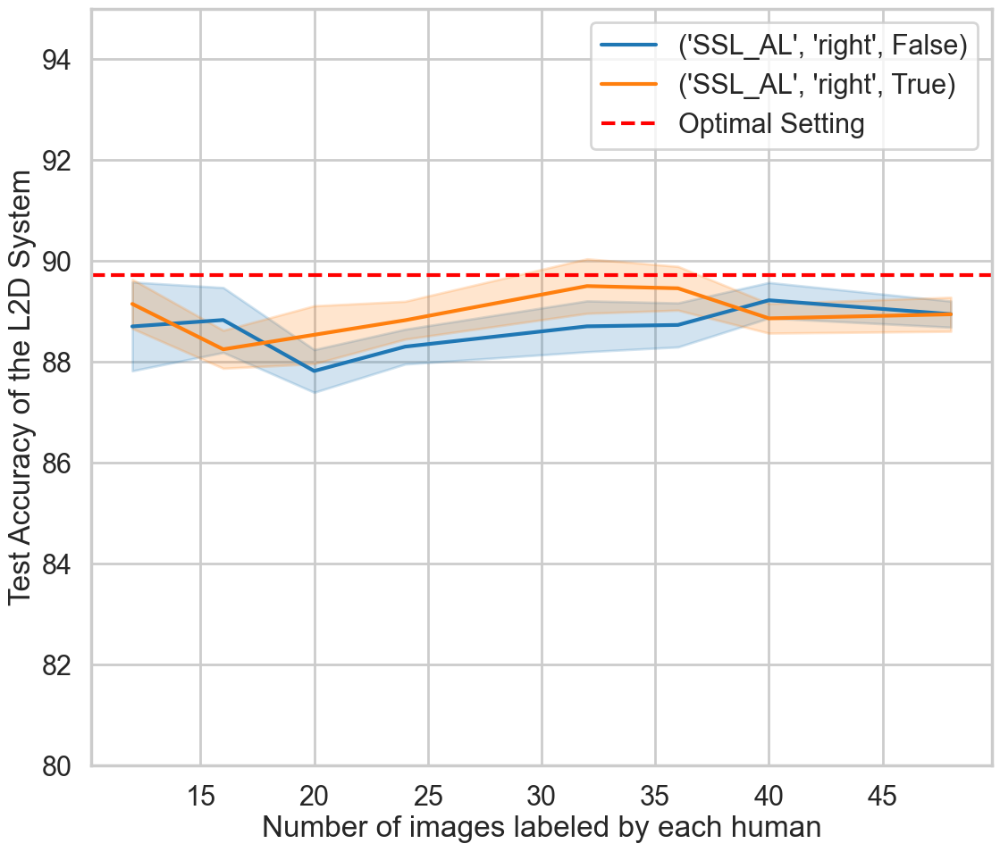

In [130]:
build_df = df.copy()
#Set ids
build_df = build_df[build_df["labeler_ids"] == "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295349121, 4295342357]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295342357, 4295354117]"]

dff = build_df[build_df["setting"] != "PERFECT"].copy().reset_index()
dfff = build_df[build_df["setting"] == "PERFECT"].reset_index()

#dff = dff[dff["expert_predict"] == "target"]
dff = dff[dff["expert_predict"] == "right"]

#dff = dff[dff["overlap"] != 0]
#dff = dff[dff["sample_equal"] != False]

#dff = dff[dff["mod"] != "disagreement_diff"]

dff = dff[dff["setting"] != "NORMAL"]
dff = dff[dff["setting"] != "SSL_AL_SSL"]
dff = dff[dff["setting"] != "AL"]
dff = dff[dff["setting"] != "SSL"]


dff["group"] = dff["group"].replace(runs_df.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=small_format)
sns.set_context("poster")
#, "overlap", "sample_equal", "expert_predict", "mod"
#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
ln = sns.lineplot(x="group", y="value", hue=dff[["setting", "expert_predict", "sample_equal"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))

#ln = sns.lineplot(x="group", y="value", hue=dff[["setting", "expert_predict", "sample_equal"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=estimator, errorbar=(lambda x: (np.median(x)-stats.sem(x), np.median(x)+stats.sem(x))))

from scipy import stats

(lambda x: (np.median(x)-stats.sem(x), np.median(x)+stats.sem(x)))


ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")
#ax.axhline(90.1403561, ls='--', color="g")
#ax.axhline(87.5957923, ls='--', color="b")
ax.set(ylim=(80, 95))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test Accuracy of the L2D System")
plt.legend(loc='upper right')
#leg_texts = ["Semi-Supervised Learning with Active Learning, sample target randomly", "Semi-Supervised Learning with Active Learning, sample target equally"]
#for t, l in zip(ln.legend_.texts, leg_texts):
#    t.set_text(l)
plt.savefig("../../images/NIH/4996/parameters_sample_right.png", bbox_inches="tight")

In [ ]:
from scipy.stats import iqr

a = dff.dropna().groupby(["setting", "group"])["value"].agg([np.median, "mean", "std"])#.mean()
a = a.reset_index()

a = a[a["group"] <= 50]
#a = a[a["setting"] != "NORMAL"]
#a = a[a["setting"] != "SSL_AL_SSL"]

pivoted_df = a.pivot_table(index=["setting"], columns="group", values=["median", "mean", "std"])
pivoted_df = pivoted_df.reset_index()

pivoted_df.to_csv("../../tables/NIH/4996/approach_acc_sample_right.csv")
pivoted_df

### Labeler [4295349121, 4295342357]

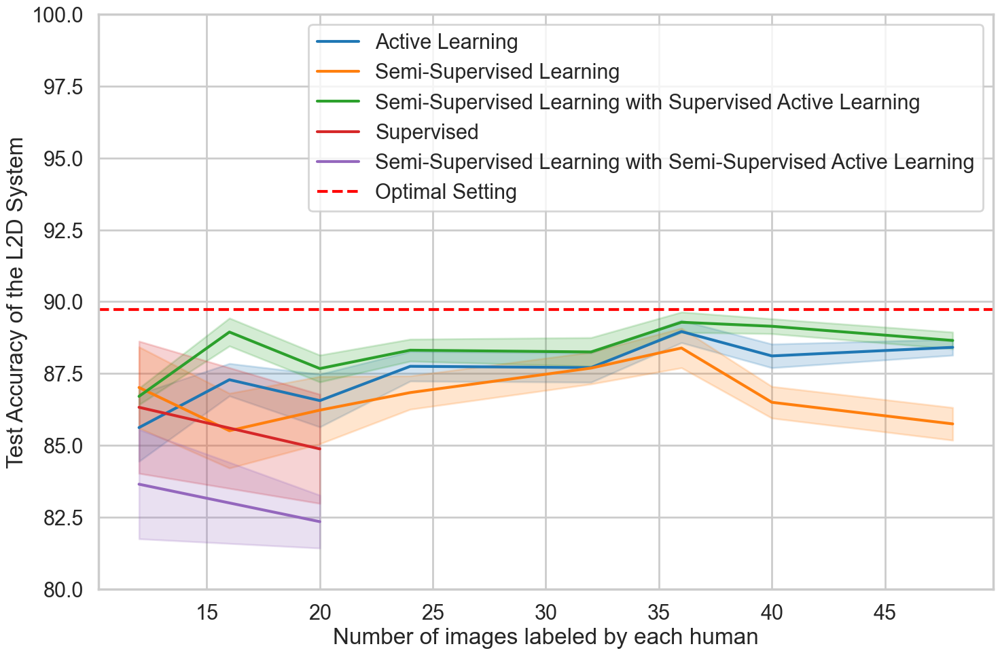

In [103]:
build_df = df.copy()
#Set ids
#build_df = build_df[build_df["labeler_ids"] == "[4323195249, 4295232296]"]
build_df = build_df[build_df["labeler_ids"] == "[4295349121, 4295342357]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295342357, 4295354117]"]

dff = build_df[build_df["setting"] != "PERFECT"].copy().reset_index()
dfff = build_df[build_df["setting"] == "PERFECT"].reset_index()

#dff = dff[dff["expert_predict"] == "target"]
#dff = df[df["expert_predict"] == "right"]

dff = dff[dff["overlap"] != 0]
dff = dff[dff["sample_equal"] != False]

#dff = dff[dff["mod"] != "disagreement_diff"]

#dff = dff[dff["setting"] != "NORMAL"]
#dff = dff[dff["setting"] != "SSL_AL_SSL"]
#dff = dff[dff["setting"] != "AL"]
#dff = dff[dff["setting"] != "SSL"]


dff["group"] = dff["group"].replace(runs_df.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=wide_format_h)
sns.set_context("poster")

#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
ln = sns.lineplot(x="group", y="value", hue=dff[["setting"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))
ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")

ax.set(ylim=(80, 100))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test Accuracy of the L2D System")
plt.legend(loc='upper right')
leg_texts = ["Active Learning", "Semi-Supervised Learning", "Semi-Supervised Learning with Supervised Active Learning", "Supervised", "Semi-Supervised Learning with Semi-Supervised Active Learning"]
for t, l in zip(ln.legend_.texts, leg_texts):
    t.set_text(l)
plt.savefig("../../images/NIH/2157/overall_setting.png", bbox_inches="tight")

In [110]:
from scipy.stats import iqr

a = dff.dropna().groupby(["setting", "group"])["value"].agg([np.median, "mean", "std"])#.mean()
a = a.reset_index()

a = a[a["group"] <= 50]
#a = a[a["setting"] != "NORMAL"]
#a = a[a["setting"] != "SSL_AL_SSL"]

pivoted_df = a.pivot_table(index=["setting"], columns="group", values=["median", "mean", "std"])
pivoted_df = pivoted_df.reset_index()

pivoted_df.to_csv("../../tables/NIH/2157/overall_setting_acc.csv")
pivoted_df

setting       mean                                              \
group                     12         16         20         24         32   
0              AL  83.435161  86.161559  84.822939  86.575566  87.705285   
1          NORMAL  86.325035        NaN  84.877998        NaN        NaN   
2             SSL  85.391503  86.971267  85.557587  85.669690  87.032140   
3          SSL_AL  86.579782  88.941835  87.299684  87.934275  87.878996   
4      SSL_AL_SSL  83.649263        NaN  82.346290        NaN        NaN   

                                           median  ...                        \
group         36         40         48         12  ...         40         48   
0      89.230984  87.063395  88.050252  82.954545  ...  88.095238  88.273491   
1            NaN        NaN        NaN  87.058824  ...        NaN        NaN   
2      86.991320  86.115959  82.904209  85.882353  ...  86.555829  82.363039   
3      89.199876  88.938371  88.531345  86.585366  ...  89.237452  89.017690   
4            NaN        NaN        NaN  85.714286  ...        NaN        NaN   

            std                                                              \
group        12        16        20        24        32        36        40   
0      5.096991  2.056731  6.157143  4.165718  2.866991  2.384140  2.846759   
1      5.139950       NaN  4.245242       NaN       NaN       NaN       NaN   
2      4.076233  3.139150  5.971925  2.754449  2.161768  3.398105  1.962131   
3      3.236515  2.779238  3.557892  3.371608  3.504472  2.506288  2.489312   
4      4.250216       NaN  1.842432       NaN       NaN       NaN       NaN   

                 
group        48  
0      2.177931  
1           NaN  
2      1.833314  
3      2.923611  
4           NaN  

[5 rows x 25 columns]

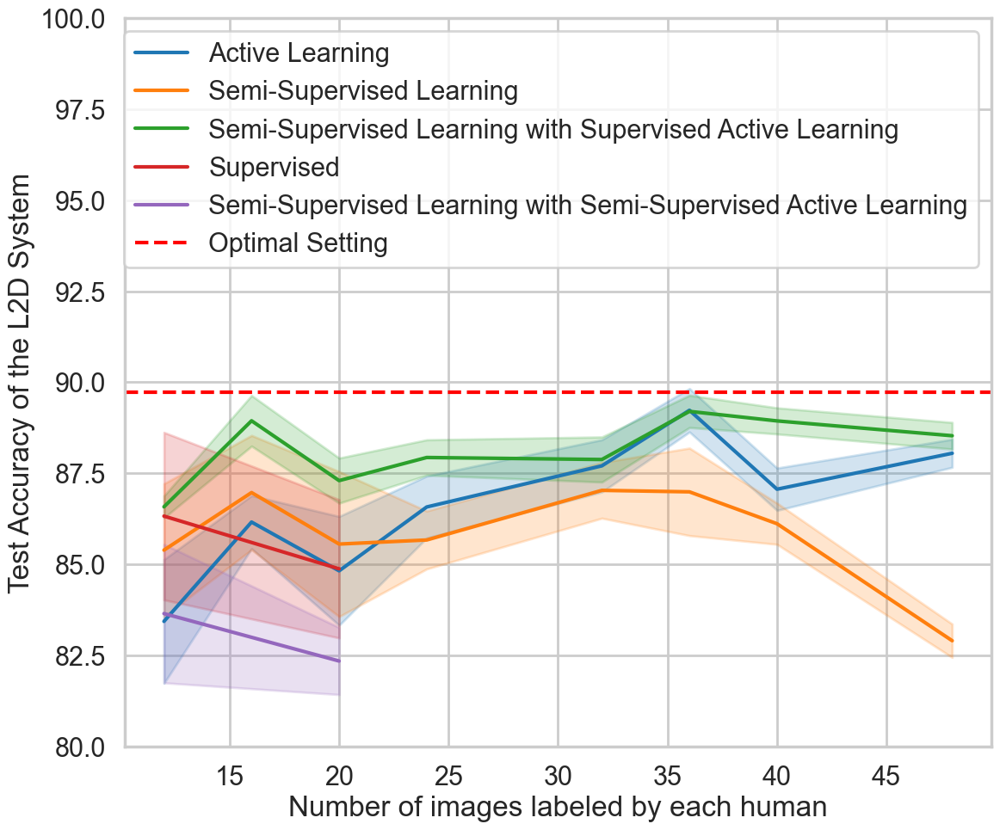

In [107]:
build_df = df.copy()
#Set ids
#build_df = build_df[build_df["labeler_ids"] == "[4323195249, 4295232296]"]
build_df = build_df[build_df["labeler_ids"] == "[4295349121, 4295342357]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295342357, 4295354117]"]

dff = build_df[build_df["setting"] != "PERFECT"].copy().reset_index()
dfff = build_df[build_df["setting"] == "PERFECT"].reset_index()

dff = dff[dff["expert_predict"] == "target"]
#dff = df[df["expert_predict"] == "right"]

dff = dff[dff["overlap"] != 0]
dff = dff[dff["sample_equal"] != False]

#dff = dff[dff["mod"] != "disagreement_diff"]

#dff = dff[dff["setting"] != "NORMAL"]
#dff = dff[dff["setting"] != "SSL_AL_SSL"]
#dff = dff[dff["setting"] != "AL"]
#dff = dff[dff["setting"] != "SSL"]


dff["group"] = dff["group"].replace(runs_df.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=small_format)
sns.set_context("poster")

#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
ln = sns.lineplot(x="group", y="value", hue=dff[["setting"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))
ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")

ax.set(ylim=(80, 100))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test Accuracy of the L2D System")
plt.legend(loc='upper right')
leg_texts = ["Active Learning", "Semi-Supervised Learning", "Semi-Supervised Learning with Supervised Active Learning", "Supervised", "Semi-Supervised Learning with Semi-Supervised Active Learning"]
for t, l in zip(ln.legend_.texts, leg_texts):
    t.set_text(l)
plt.savefig("../../images/NIH/2157/overall_setting_target.png", bbox_inches="tight")

In [111]:
from scipy.stats import iqr

a = dff.dropna().groupby(["setting", "group"])["value"].agg([np.median, "mean", "std"])#.mean()
a = a.reset_index()

a = a[a["group"] <= 50]
#a = a[a["setting"] != "NORMAL"]
#a = a[a["setting"] != "SSL_AL_SSL"]

pivoted_df = a.pivot_table(index=["setting"], columns="group", values=["median", "mean", "std"])
pivoted_df = pivoted_df.reset_index()

pivoted_df.to_csv("../../tables/NIH/2157/overall_setting_acc_target.csv")
pivoted_df

setting       mean                                              \
group                     12         16         20         24         32   
0              AL  83.435161  86.161559  84.822939  86.575566  87.705285   
1          NORMAL  86.325035        NaN  84.877998        NaN        NaN   
2             SSL  85.391503  86.971267  85.557587  85.669690  87.032140   
3          SSL_AL  86.579782  88.941835  87.299684  87.934275  87.878996   
4      SSL_AL_SSL  83.649263        NaN  82.346290        NaN        NaN   

                                           median  ...                        \
group         36         40         48         12  ...         40         48   
0      89.230984  87.063395  88.050252  82.954545  ...  88.095238  88.273491   
1            NaN        NaN        NaN  87.058824  ...        NaN        NaN   
2      86.991320  86.115959  82.904209  85.882353  ...  86.555829  82.363039   
3      89.199876  88.938371  88.531345  86.585366  ...  89.237452  89.017690   
4            NaN        NaN        NaN  85.714286  ...        NaN        NaN   

            std                                                              \
group        12        16        20        24        32        36        40   
0      5.096991  2.056731  6.157143  4.165718  2.866991  2.384140  2.846759   
1      5.139950       NaN  4.245242       NaN       NaN       NaN       NaN   
2      4.076233  3.139150  5.971925  2.754449  2.161768  3.398105  1.962131   
3      3.236515  2.779238  3.557892  3.371608  3.504472  2.506288  2.489312   
4      4.250216       NaN  1.842432       NaN       NaN       NaN       NaN   

                 
group        48  
0      2.177931  
1           NaN  
2      1.833314  
3      2.923611  
4           NaN  

[5 rows x 25 columns]

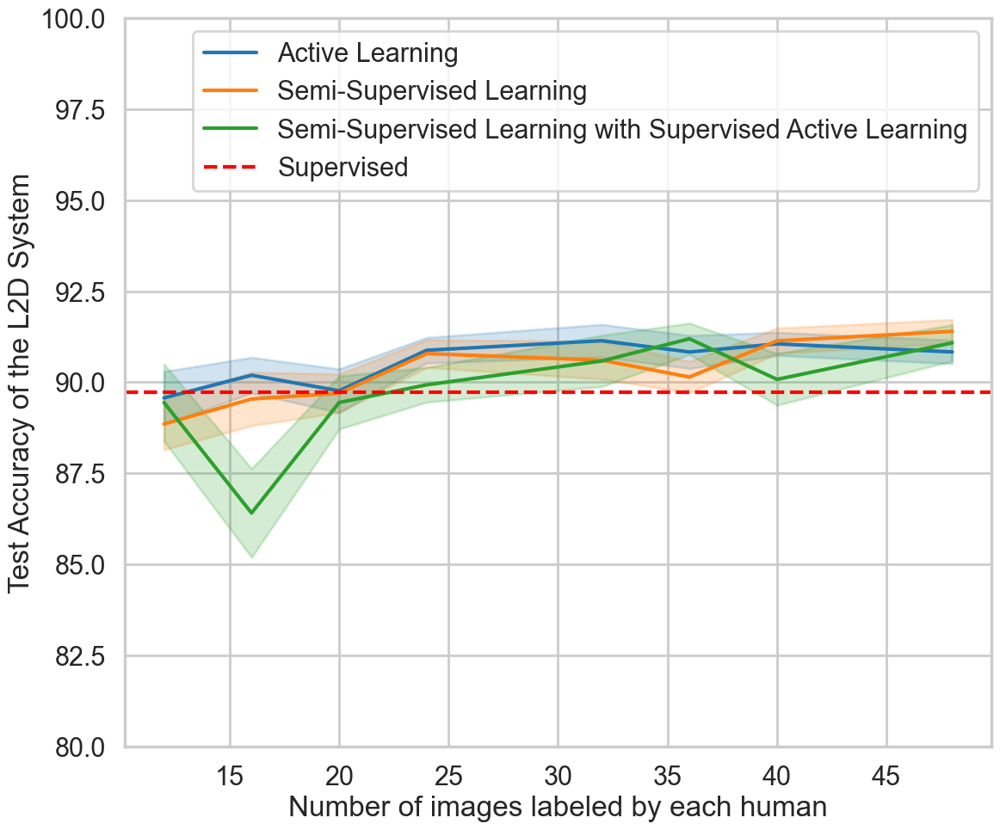

In [113]:
build_df = df.copy()
#Set ids
#build_df = build_df[build_df["labeler_ids"] == "[4323195249, 4295232296]"]
build_df = build_df[build_df["labeler_ids"] == "[4295349121, 4295342357]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295342357, 4295354117]"]

dff = build_df[build_df["setting"] != "PERFECT"].copy().reset_index()
dfff = build_df[build_df["setting"] == "PERFECT"].reset_index()

#dff = dff[dff["expert_predict"] == "target"]
dff = df[df["expert_predict"] == "right"]

dff = dff[dff["overlap"] != 0]
dff = dff[dff["sample_equal"] != False]

#dff = dff[dff["mod"] != "disagreement_diff"]

#dff = dff[dff["setting"] != "NORMAL"]
#dff = dff[dff["setting"] != "SSL_AL_SSL"]
#dff = dff[dff["setting"] != "AL"]
#dff = dff[dff["setting"] != "SSL"]


dff["group"] = dff["group"].replace(runs_df.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=small_format)
sns.set_context("poster")

#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
ln = sns.lineplot(x="group", y="value", hue=dff[["setting"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))
ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")

ax.set(ylim=(80, 100))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test Accuracy of the L2D System")
plt.legend(loc='upper right')
leg_texts = ["Active Learning", "Semi-Supervised Learning", "Semi-Supervised Learning with Supervised Active Learning", "Supervised", "Semi-Supervised Learning with Semi-Supervised Active Learning"]
for t, l in zip(ln.legend_.texts, leg_texts):
    t.set_text(l)
plt.savefig("../../images/NIH/2157/overall_setting_right.png", bbox_inches="tight")

In [114]:
from scipy.stats import iqr

a = dff.dropna().groupby(["setting", "group"])["value"].agg([np.median, "mean", "std"])#.mean()
a = a.reset_index()

a = a[a["group"] <= 50]
#a = a[a["setting"] != "NORMAL"]
#a = a[a["setting"] != "SSL_AL_SSL"]

pivoted_df = a.pivot_table(index=["setting"], columns="group", values=["median", "mean", "std"])
pivoted_df = pivoted_df.reset_index()

pivoted_df.to_csv("../../tables/NIH/2157/overall_setting_acc_right.csv")
pivoted_df

setting       mean                                              \
group                 12         16         20         24         32   
0          AL  88.852928  89.540360  89.697182  90.786885  90.604984   
1         SSL  89.442911  86.410016  89.443602  89.929481  90.583960   
2      SSL_AL  89.570734  90.192320  89.765907  90.878327  91.140428   

                                           median  ...                        \
group         36         40         48         12  ...         40         48   
0      90.143474  91.136696  91.397114  89.482002  ...  90.856844  91.044776   
1      91.192951  90.078621  91.080676  90.387349  ...  90.043290  89.505882   
2      90.830629  91.053088  90.832742  89.982609  ...  90.476190  90.856844   

            std                                                              \
group        12        16        20        24        32        36        40   
0      3.445829  3.584940  3.654463  3.222482  3.598689  2.977900  2.962498   
1      3.655262  4.215380  3.572189  2.849548  3.444589  2.104221  4.246964   
2      3.559582  2.400077  4.146218  2.959034  3.095299  3.135181  2.690503   

                 
group        48  
0      3.158980  
1      3.435635  
2      3.156338  

[3 rows x 25 columns]

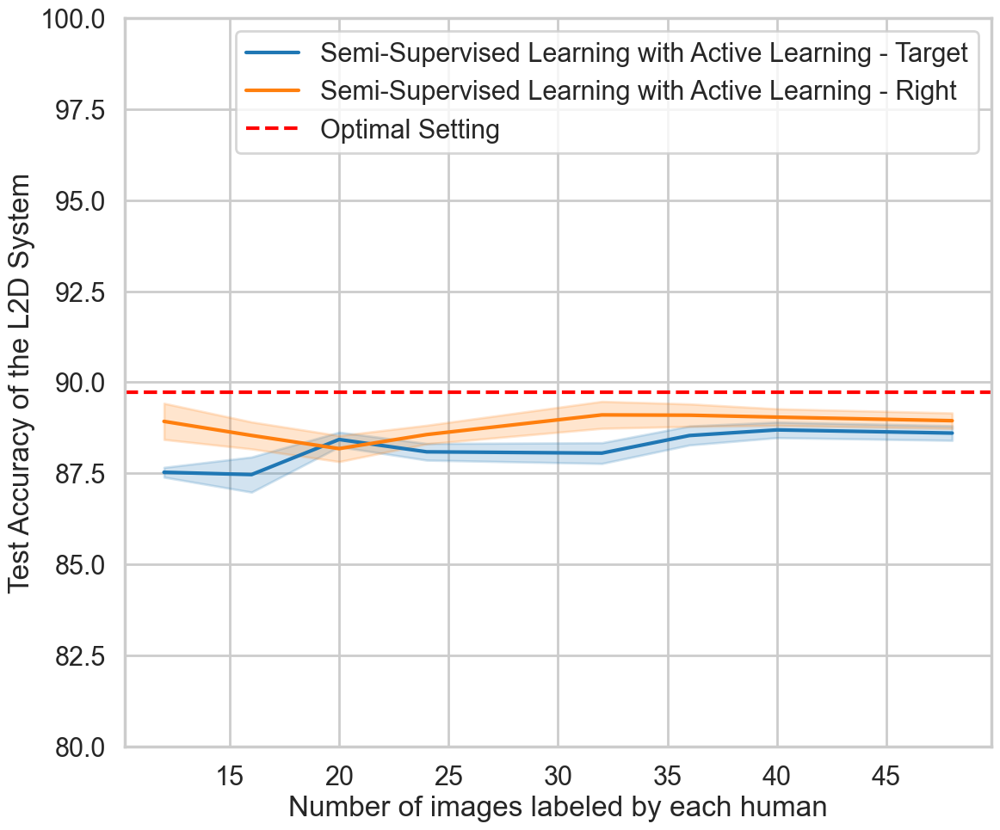

In [121]:
build_df = df.copy()
#Set ids
#build_df = build_df[build_df["labeler_ids"] == "[4323195249, 4295232296]"]
build_df = build_df[build_df["labeler_ids"] == "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295349121, 4295342357]"]

dff = build_df[build_df["setting"] != "PERFECT"].copy().reset_index()
dfff = build_df[build_df["setting"] == "PERFECT"].reset_index()

#dff = dff[dff["expert_predict"] == "target"]
#dff = df[df["expert_predict"] == "right"]

#dff = dff[dff["overlap"] != 0]
#dff = dff[dff["sample_equal"] != False]

#dff = dff[dff["mod"] != "disagreement_diff"]

dff = dff[dff["setting"] != "NORMAL"]
dff = dff[dff["setting"] != "SSL_AL_SSL"]
dff = dff[dff["setting"] != "AL"]
dff = dff[dff["setting"] != "SSL"]


dff["group"] = dff["group"].replace(runs_df.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=small_format)
sns.set_context("poster")
#, "overlap", "sample_equal", "expert_predict", "mod"
#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
ln = sns.lineplot(x="group", y="value", hue=dff[["setting", "expert_predict"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))
ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")
#ax.axhline(90.1403561, ls='--', color="g")
#ax.axhline(87.5957923, ls='--', color="b")
ax.set(ylim=(80, 100))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test Accuracy of the L2D System")
plt.legend(loc='upper right')
leg_texts = ["Semi-Supervised Learning with Active Learning - Target", "Semi-Supervised Learning with Active Learning - Right"]
for t, l in zip(ln.legend_.texts, leg_texts):
    t.set_text(l)
plt.savefig("../../images/NIH/2157/expert_strategy.png", bbox_inches="tight")

In [ ]:
from scipy.stats import iqr

a = dff.dropna().groupby(["setting", "group"])["value"].agg([np.median, "mean", "std"])#.mean()
a = a.reset_index()

a = a[a["group"] <= 50]
#a = a[a["setting"] != "NORMAL"]
#a = a[a["setting"] != "SSL_AL_SSL"]

pivoted_df = a.pivot_table(index=["setting"], columns="group", values=["median", "mean", "std"])
pivoted_df = pivoted_df.reset_index()

pivoted_df.to_csv("../../tables/NIH/2157/approach_acc_model_strategy.csv")
pivoted_df

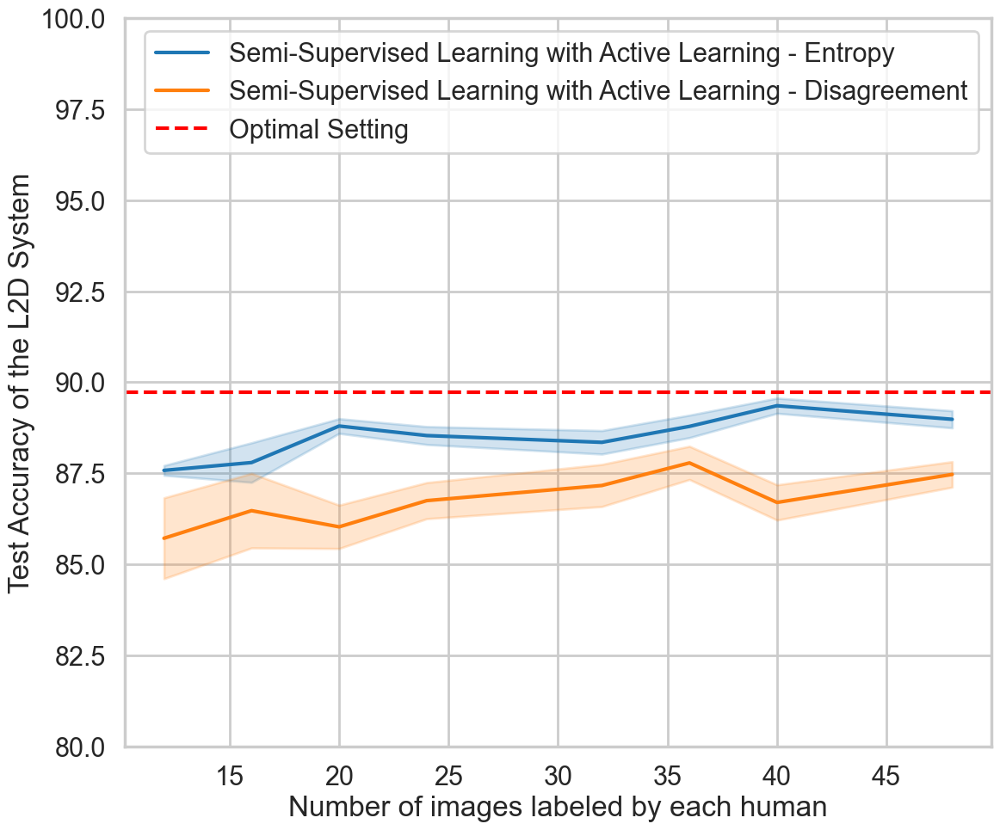

In [124]:
build_df = df.copy()
#Set ids
#build_df = build_df[build_df["labeler_ids"] == "[4323195249, 4295232296]"]
build_df = build_df[build_df["labeler_ids"] == "[4295349121, 4295342357]"]

dff = build_df[build_df["setting"] != "PERFECT"].copy().reset_index()
dfff = build_df[build_df["setting"] == "PERFECT"].reset_index()

dff = dff[dff["expert_predict"] == "target"]
#dff = df[df["expert_predict"] == "right"]

#dff = dff[dff["overlap"] != 0]
#dff = dff[dff["sample_equal"] != False]

#dff = dff[dff["mod"] != "disagreement_diff"]

dff = dff[dff["setting"] != "NORMAL"]
dff = dff[dff["setting"] != "SSL_AL_SSL"]
dff = dff[dff["setting"] != "AL"]
dff = dff[dff["setting"] != "SSL"]

dff["group"] = dff["group"].replace(runs_df.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=small_format)
sns.set_context("poster")
#, "overlap", "sample_equal", "expert_predict", "mod"
#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
ln = sns.lineplot(x="group", y="value", hue=dff[["setting", "mod"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))
ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")
#ax.axhline(90.1403561, ls='--', color="g")
#ax.axhline(87.5957923, ls='--', color="b")
ax.set(ylim=(80, 100))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test Accuracy of the L2D System")
plt.legend(loc='upper right')
leg_texts = ["Semi-Supervised Learning with Active Learning - Entropy", "Semi-Supervised Learning with Active Learning - Disagreement"]
for t, l in zip(ln.legend_.texts, leg_texts):
    t.set_text(l)
plt.savefig("../../images/NIH/2157/al_strategy_target.png", bbox_inches="tight")

In [ ]:
from scipy.stats import iqr

a = dff.dropna().groupby(["setting", "group"])["value"].agg([np.median, "mean", "std"])#.mean()
a = a.reset_index()

a = a[a["group"] <= 50]
#a = a[a["setting"] != "NORMAL"]
#a = a[a["setting"] != "SSL_AL_SSL"]

pivoted_df = a.pivot_table(index=["setting"], columns="group", values=["median", "mean", "std"])
pivoted_df = pivoted_df.reset_index()

pivoted_df.to_csv("../../tables/NIH/2157/approach_acc_al_strategy_target.csv")
pivoted_df

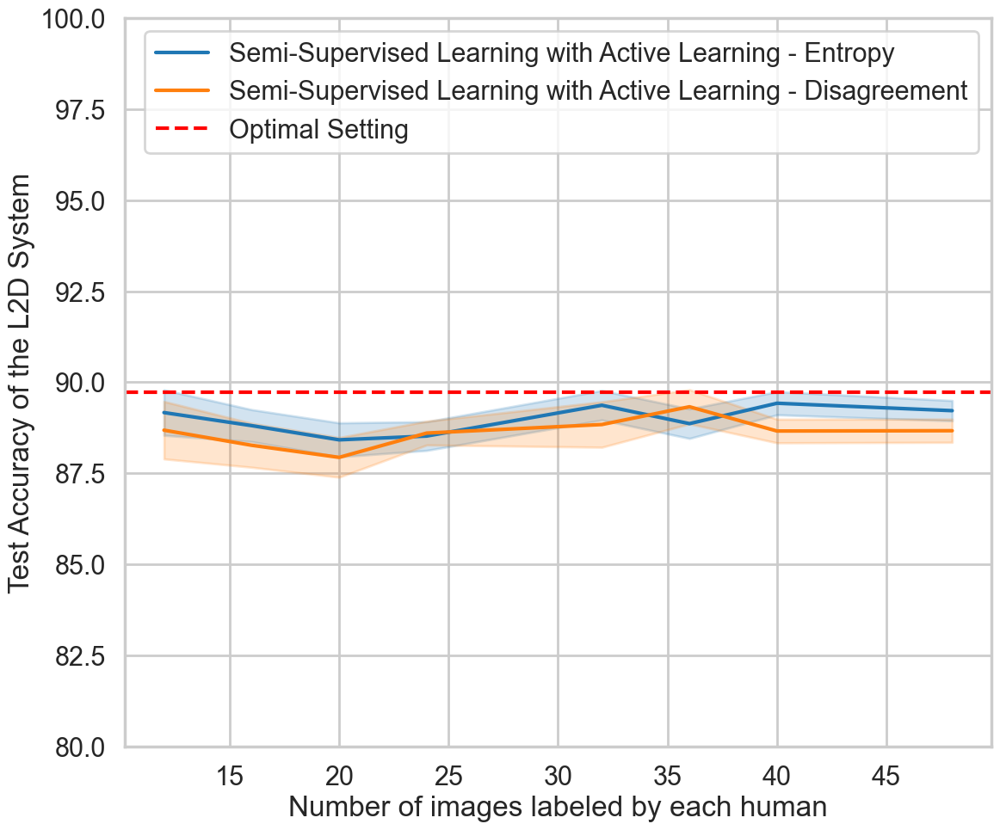

In [126]:
build_df = df.copy()
#Set ids
#build_df = build_df[build_df["labeler_ids"] == "[4323195249, 4295232296]"]
build_df = build_df[build_df["labeler_ids"] == "[4295349121, 4295342357]"]

dff = build_df[build_df["setting"] != "PERFECT"].copy().reset_index()
dfff = build_df[build_df["setting"] == "PERFECT"].reset_index()

#dff = dff[dff["expert_predict"] == "target"]
dff = dff[dff["expert_predict"] == "right"]

#dff = dff[dff["overlap"] != 0]
#dff = dff[dff["sample_equal"] != False]

#dff = dff[dff["mod"] != "disagreement_diff"]

dff = dff[dff["setting"] != "NORMAL"]
dff = dff[dff["setting"] != "SSL_AL_SSL"]
dff = dff[dff["setting"] != "AL"]
dff = dff[dff["setting"] != "SSL"]

dff["group"] = dff["group"].replace(runs_df.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=small_format)
sns.set_context("poster")
#, "overlap", "sample_equal", "expert_predict", "mod"
#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
ln = sns.lineplot(x="group", y="value", hue=dff[["setting", "mod"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))
ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")
#ax.axhline(90.1403561, ls='--', color="g")
#ax.axhline(87.5957923, ls='--', color="b")
ax.set(ylim=(80, 100))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test Accuracy of the L2D System")
plt.legend(loc='upper right')
leg_texts = ["Semi-Supervised Learning with Active Learning - Entropy", "Semi-Supervised Learning with Active Learning - Disagreement"]
for t, l in zip(ln.legend_.texts, leg_texts):
    t.set_text(l)
plt.savefig("../../images/NIH/2157/al_strategy_right.png", bbox_inches="tight")

In [ ]:
from scipy.stats import iqr

a = dff.dropna().groupby(["setting", "group"])["value"].agg([np.median, "mean", "std"])#.mean()
a = a.reset_index()

a = a[a["group"] <= 50]
#a = a[a["setting"] != "NORMAL"]
#a = a[a["setting"] != "SSL_AL_SSL"]

pivoted_df = a.pivot_table(index=["setting"], columns="group", values=["median", "mean", "std"])
pivoted_df = pivoted_df.reset_index()

pivoted_df.to_csv("../../tables/NIH/2157/approach_acc_al_strategy_right.csv")
pivoted_df

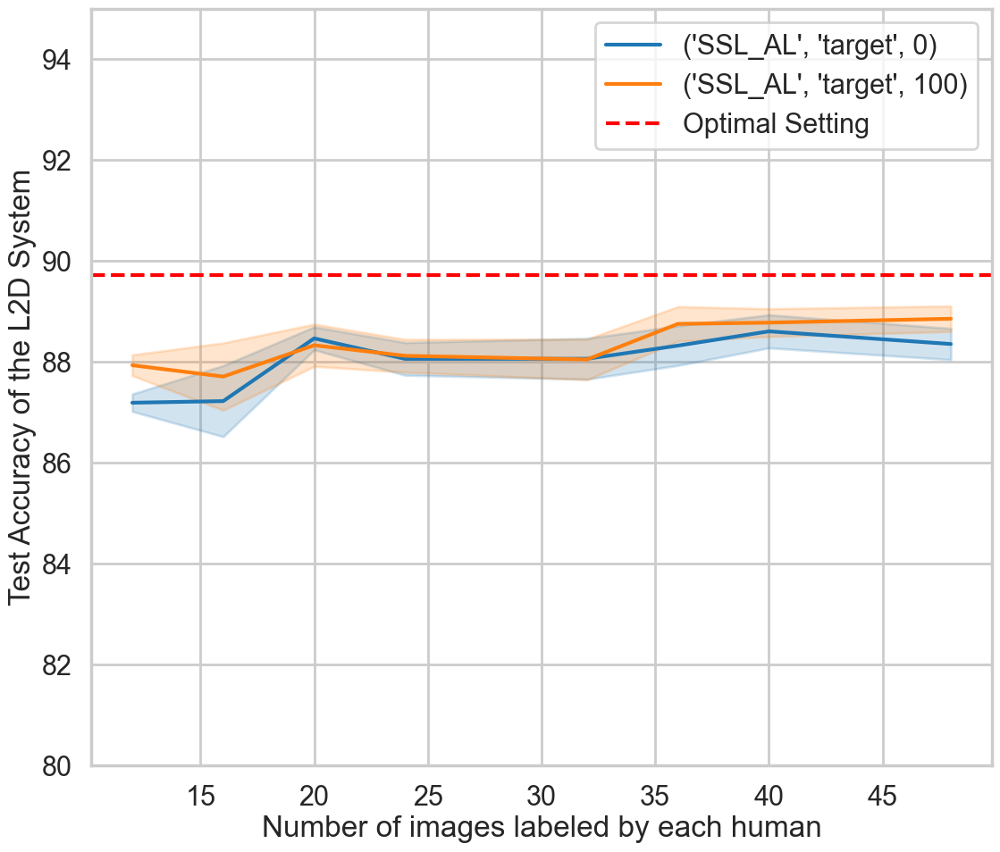

In [127]:
build_df = df.copy()
#Set ids
#build_df = build_df[build_df["labeler_ids"] == "[4323195249, 4295232296]"]
build_df = build_df[build_df["labeler_ids"] == "[4295349121, 4295342357]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295342357, 4295354117]"]


dff = build_df[build_df["setting"] != "PERFECT"].copy().reset_index()
dfff = build_df[build_df["setting"] == "PERFECT"].reset_index()

dff = dff[dff["expert_predict"] == "target"]
#dff = dff[dff["expert_predict"] == "right"]

#dff = dff[dff["overlap"] != 0]
#dff = dff[dff["sample_equal"] != False]

#dff = dff[dff["mod"] != "disagreement_diff"]

dff = dff[dff["setting"] != "NORMAL"]
dff = dff[dff["setting"] != "SSL_AL_SSL"]
dff = dff[dff["setting"] != "AL"]
dff = dff[dff["setting"] != "SSL"]


dff["group"] = dff["group"].replace(runs_df.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=small_format)
sns.set_context("poster")
#, "overlap", "sample_equal", "expert_predict", "mod"
#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
ln = sns.lineplot(x="group", y="value", hue=dff[["setting", "expert_predict", "overlap"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))
ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")
#ax.axhline(90.1403561, ls='--', color="g")
#ax.axhline(87.5957923, ls='--', color="b")
ax.set(ylim=(80, 95))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test Accuracy of the L2D System")
plt.legend(loc='upper right')
#leg_texts = ["Semi-Supervised Learning with Active Learning, 0% overlab", "Semi-Supervised Learning with Active Learning, 100% overlab"]
#for t, l in zip(ln.legend_.texts, leg_texts):
#    t.set_text(l)
plt.savefig("../../images/NIH/2157/parameters_overlap_target.png", bbox_inches="tight")

In [ ]:
from scipy.stats import iqr

a = dff.dropna().groupby(["setting", "group"])["value"].agg([np.median, "mean", "std"])#.mean()
a = a.reset_index()

a = a[a["group"] <= 50]
#a = a[a["setting"] != "NORMAL"]
#a = a[a["setting"] != "SSL_AL_SSL"]

pivoted_df = a.pivot_table(index=["setting"], columns="group", values=["median", "mean", "std"])
pivoted_df = pivoted_df.reset_index()

pivoted_df.to_csv("../../tables/NIH/2157/approach_acc_overlap_target.csv")
pivoted_df

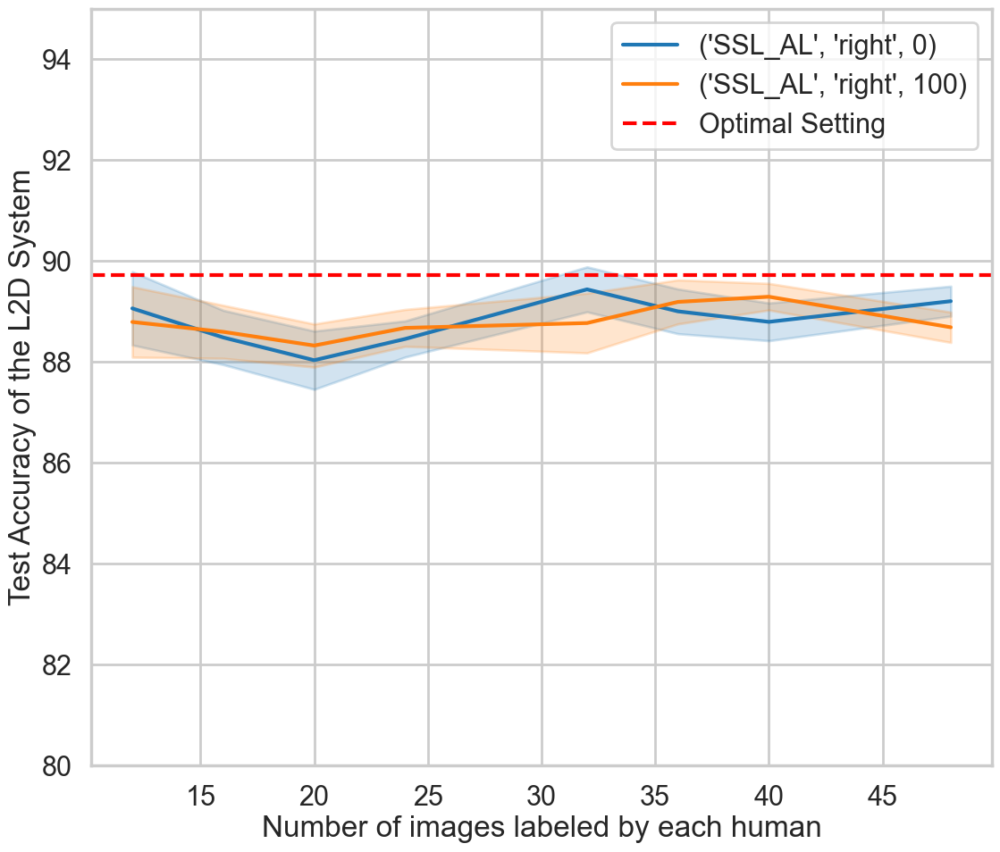

In [128]:
build_df = df.copy()
#Set ids
#build_df = build_df[build_df["labeler_ids"] == "[4323195249, 4295232296]"]
build_df = build_df[build_df["labeler_ids"] == "[4295349121, 4295342357]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295342357, 4295354117]"]


dff = build_df[build_df["setting"] != "PERFECT"].copy().reset_index()
dfff = build_df[build_df["setting"] == "PERFECT"].reset_index()

#dff = dff[dff["expert_predict"] == "target"]
dff = dff[dff["expert_predict"] == "right"]

#dff = dff[dff["overlap"] != 0]
#dff = dff[dff["sample_equal"] != False]

#dff = dff[dff["mod"] != "disagreement_diff"]

dff = dff[dff["setting"] != "NORMAL"]
dff = dff[dff["setting"] != "SSL_AL_SSL"]
dff = dff[dff["setting"] != "AL"]
dff = dff[dff["setting"] != "SSL"]


dff["group"] = dff["group"].replace(runs_df.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=small_format)
sns.set_context("poster")
#, "overlap", "sample_equal", "expert_predict", "mod"
#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
ln = sns.lineplot(x="group", y="value", hue=dff[["setting", "expert_predict", "overlap"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))
ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")
#ax.axhline(90.1403561, ls='--', color="g")
#ax.axhline(87.5957923, ls='--', color="b")
ax.set(ylim=(80, 95))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test Accuracy of the L2D System")
plt.legend(loc='upper right')
#leg_texts = ["Semi-Supervised Learning with Active Learning, 0% overlab", "Semi-Supervised Learning with Active Learning, 100% overlab"]
#for t, l in zip(ln.legend_.texts, leg_texts):
#    t.set_text(l)
plt.savefig("../../images/NIH/2157/parameters_overlap_right.png", bbox_inches="tight")

In [ ]:
from scipy.stats import iqr

a = dff.dropna().groupby(["setting", "group"])["value"].agg([np.median, "mean", "std"])#.mean()
a = a.reset_index()

a = a[a["group"] <= 50]
#a = a[a["setting"] != "NORMAL"]
#a = a[a["setting"] != "SSL_AL_SSL"]

pivoted_df = a.pivot_table(index=["setting"], columns="group", values=["median", "mean", "std"])
pivoted_df = pivoted_df.reset_index()

pivoted_df.to_csv("../../tables/NIH/2157/approach_acc_overlap_right.csv")
pivoted_df

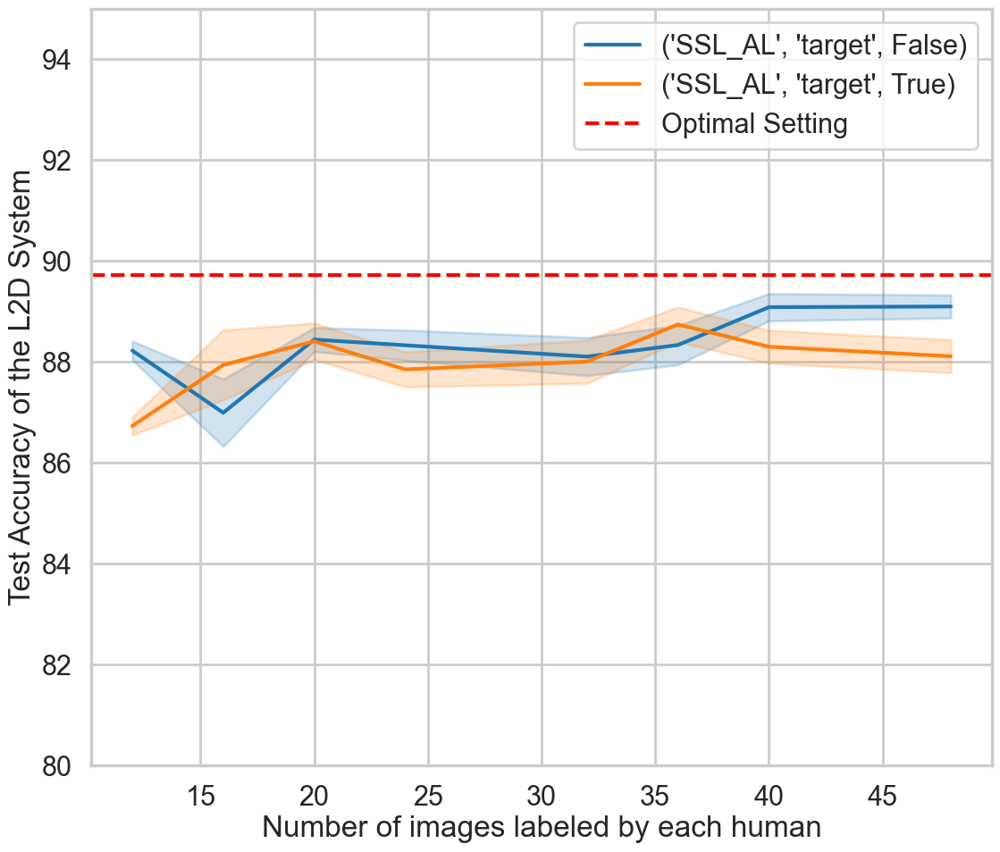

In [129]:
build_df = df.copy()
#Set ids
#build_df = build_df[build_df["labeler_ids"] == "[4323195249, 4295232296]"]
build_df = build_df[build_df["labeler_ids"] == "[4295349121, 4295342357]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295342357, 4295354117]"]

dff = build_df[build_df["setting"] != "PERFECT"].copy().reset_index()
dfff = build_df[build_df["setting"] == "PERFECT"].reset_index()

dff = dff[dff["expert_predict"] == "target"]
#dff = dff[dff["expert_predict"] == "right"]

#dff = dff[dff["overlap"] != 0]
#dff = dff[dff["sample_equal"] != False]

#dff = dff[dff["mod"] != "disagreement_diff"]

dff = dff[dff["setting"] != "NORMAL"]
dff = dff[dff["setting"] != "SSL_AL_SSL"]
dff = dff[dff["setting"] != "AL"]
dff = dff[dff["setting"] != "SSL"]


dff["group"] = dff["group"].replace(runs_df.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=small_format)
sns.set_context("poster")
#, "overlap", "sample_equal", "expert_predict", "mod"
#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
ln = sns.lineplot(x="group", y="value", hue=dff[["setting", "expert_predict", "sample_equal"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))

#ln = sns.lineplot(x="group", y="value", hue=dff[["setting", "expert_predict", "sample_equal"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=estimator, errorbar=(lambda x: (np.median(x)-stats.sem(x), np.median(x)+stats.sem(x))))

from scipy import stats

(lambda x: (np.median(x)-stats.sem(x), np.median(x)+stats.sem(x)))


ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")
#ax.axhline(90.1403561, ls='--', color="g")
#ax.axhline(87.5957923, ls='--', color="b")
ax.set(ylim=(80, 95))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test Accuracy of the L2D System")
plt.legend(loc='upper right')
#leg_texts = ["Semi-Supervised Learning with Active Learning, sample target randomly", "Semi-Supervised Learning with Active Learning, sample target equally"]
#for t, l in zip(ln.legend_.texts, leg_texts):
#    t.set_text(l)
plt.savefig("../../images/NIH/2157/parameters_sample_target.png", bbox_inches="tight")

In [ ]:
from scipy.stats import iqr

a = dff.dropna().groupby(["setting", "group"])["value"].agg([np.median, "mean", "std"])#.mean()
a = a.reset_index()

a = a[a["group"] <= 50]
#a = a[a["setting"] != "NORMAL"]
#a = a[a["setting"] != "SSL_AL_SSL"]

pivoted_df = a.pivot_table(index=["setting"], columns="group", values=["median", "mean", "std"])
pivoted_df = pivoted_df.reset_index()

pivoted_df.to_csv("../../tables/NIH/2157/approach_acc_sample_target.csv")
pivoted_df

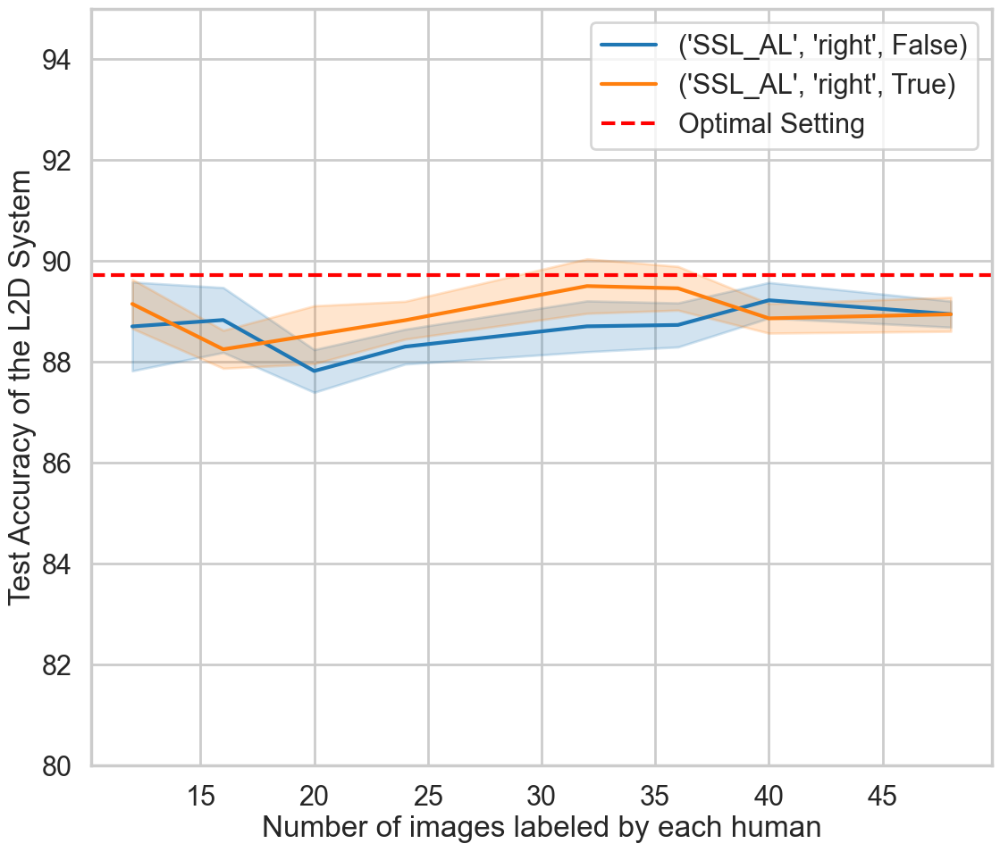

In [130]:
build_df = df.copy()
#Set ids
#build_df = build_df[build_df["labeler_ids"] == "[4323195249, 4295232296]"]
build_df = build_df[build_df["labeler_ids"] == "[4295349121, 4295342357]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295342357, 4295354117]"]

dff = build_df[build_df["setting"] != "PERFECT"].copy().reset_index()
dfff = build_df[build_df["setting"] == "PERFECT"].reset_index()

#dff = dff[dff["expert_predict"] == "target"]
dff = dff[dff["expert_predict"] == "right"]

#dff = dff[dff["overlap"] != 0]
#dff = dff[dff["sample_equal"] != False]

#dff = dff[dff["mod"] != "disagreement_diff"]

dff = dff[dff["setting"] != "NORMAL"]
dff = dff[dff["setting"] != "SSL_AL_SSL"]
dff = dff[dff["setting"] != "AL"]
dff = dff[dff["setting"] != "SSL"]


dff["group"] = dff["group"].replace(runs_df.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=small_format)
sns.set_context("poster")
#, "overlap", "sample_equal", "expert_predict", "mod"
#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
ln = sns.lineplot(x="group", y="value", hue=dff[["setting", "expert_predict", "sample_equal"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))

#ln = sns.lineplot(x="group", y="value", hue=dff[["setting", "expert_predict", "sample_equal"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=estimator, errorbar=(lambda x: (np.median(x)-stats.sem(x), np.median(x)+stats.sem(x))))

from scipy import stats

(lambda x: (np.median(x)-stats.sem(x), np.median(x)+stats.sem(x)))


ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")
#ax.axhline(90.1403561, ls='--', color="g")
#ax.axhline(87.5957923, ls='--', color="b")
ax.set(ylim=(80, 95))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test Accuracy of the L2D System")
plt.legend(loc='upper right')
#leg_texts = ["Semi-Supervised Learning with Active Learning, sample target randomly", "Semi-Supervised Learning with Active Learning, sample target equally"]
#for t, l in zip(ln.legend_.texts, leg_texts):
#    t.set_text(l)
plt.savefig("../../images/NIH/2157/parameters_sample_right.png", bbox_inches="tight")

In [ ]:
from scipy.stats import iqr

a = dff.dropna().groupby(["setting", "group"])["value"].agg([np.median, "mean", "std"])#.mean()
a = a.reset_index()

a = a[a["group"] <= 50]
#a = a[a["setting"] != "NORMAL"]
#a = a[a["setting"] != "SSL_AL_SSL"]

pivoted_df = a.pivot_table(index=["setting"], columns="group", values=["median", "mean", "std"])
pivoted_df = pivoted_df.reset_index()

pivoted_df.to_csv("../../tables/NIH/2157/approach_acc_sample_right.csv")
pivoted_df

### Labeler [4295342357, 4295354117]

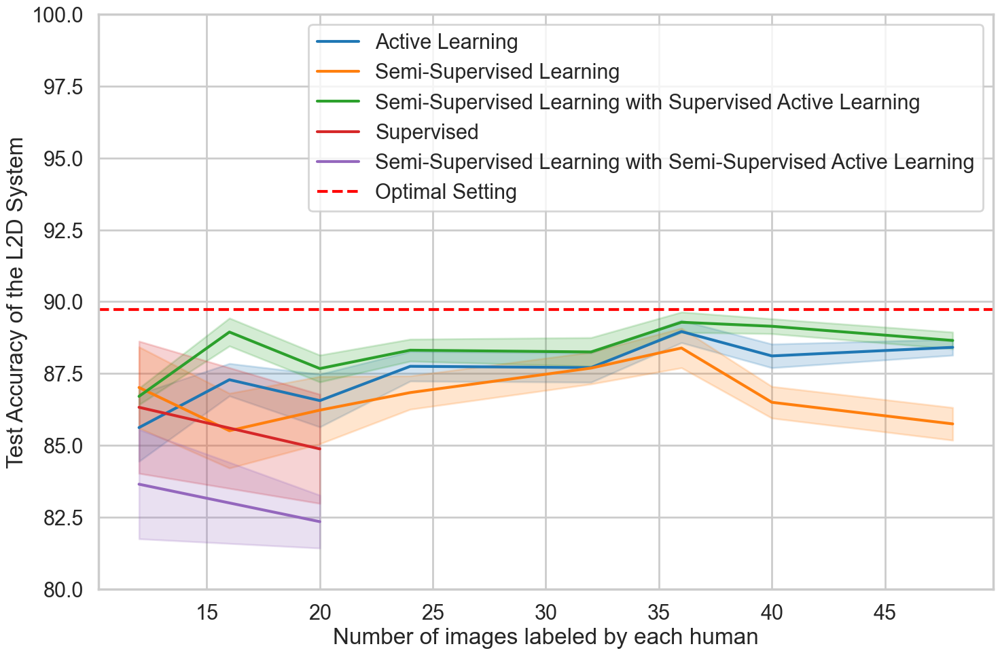

In [103]:
build_df = df.copy()
#Set ids
#build_df = build_df[build_df["labeler_ids"] == "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295349121, 4295342357]"]
build_df = build_df[build_df["labeler_ids"] == "[4295342357, 4295354117]"]

dff = build_df[build_df["setting"] != "PERFECT"].copy().reset_index()
dfff = build_df[build_df["setting"] == "PERFECT"].reset_index()

#dff = dff[dff["expert_predict"] == "target"]
#dff = df[df["expert_predict"] == "right"]

dff = dff[dff["overlap"] != 0]
dff = dff[dff["sample_equal"] != False]

#dff = dff[dff["mod"] != "disagreement_diff"]

#dff = dff[dff["setting"] != "NORMAL"]
#dff = dff[dff["setting"] != "SSL_AL_SSL"]
#dff = dff[dff["setting"] != "AL"]
#dff = dff[dff["setting"] != "SSL"]


dff["group"] = dff["group"].replace(runs_df.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=wide_format_h)
sns.set_context("poster")

#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
ln = sns.lineplot(x="group", y="value", hue=dff[["setting"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))
ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")

ax.set(ylim=(80, 100))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test Accuracy of the L2D System")
plt.legend(loc='upper right')
leg_texts = ["Active Learning", "Semi-Supervised Learning", "Semi-Supervised Learning with Supervised Active Learning"]
for t, l in zip(ln.legend_.texts, leg_texts):
    t.set_text(l)
plt.savefig("../../images/NIH/5717/overall_setting.png", bbox_inches="tight")

In [110]:
from scipy.stats import iqr

a = dff.dropna().groupby(["setting", "group"])["value"].agg([np.median, "mean", "std"])#.mean()
a = a.reset_index()

a = a[a["group"] <= 50]
#a = a[a["setting"] != "NORMAL"]
#a = a[a["setting"] != "SSL_AL_SSL"]

pivoted_df = a.pivot_table(index=["setting"], columns="group", values=["median", "mean", "std"])
pivoted_df = pivoted_df.reset_index()

pivoted_df.to_csv("../../tables/NIH/5717/overall_setting_acc.csv")
pivoted_df

setting       mean                                              \
group                     12         16         20         24         32   
0              AL  83.435161  86.161559  84.822939  86.575566  87.705285   
1          NORMAL  86.325035        NaN  84.877998        NaN        NaN   
2             SSL  85.391503  86.971267  85.557587  85.669690  87.032140   
3          SSL_AL  86.579782  88.941835  87.299684  87.934275  87.878996   
4      SSL_AL_SSL  83.649263        NaN  82.346290        NaN        NaN   

                                           median  ...                        \
group         36         40         48         12  ...         40         48   
0      89.230984  87.063395  88.050252  82.954545  ...  88.095238  88.273491   
1            NaN        NaN        NaN  87.058824  ...        NaN        NaN   
2      86.991320  86.115959  82.904209  85.882353  ...  86.555829  82.363039   
3      89.199876  88.938371  88.531345  86.585366  ...  89.237452  89.017690   
4            NaN        NaN        NaN  85.714286  ...        NaN        NaN   

            std                                                              \
group        12        16        20        24        32        36        40   
0      5.096991  2.056731  6.157143  4.165718  2.866991  2.384140  2.846759   
1      5.139950       NaN  4.245242       NaN       NaN       NaN       NaN   
2      4.076233  3.139150  5.971925  2.754449  2.161768  3.398105  1.962131   
3      3.236515  2.779238  3.557892  3.371608  3.504472  2.506288  2.489312   
4      4.250216       NaN  1.842432       NaN       NaN       NaN       NaN   

                 
group        48  
0      2.177931  
1           NaN  
2      1.833314  
3      2.923611  
4           NaN  

[5 rows x 25 columns]

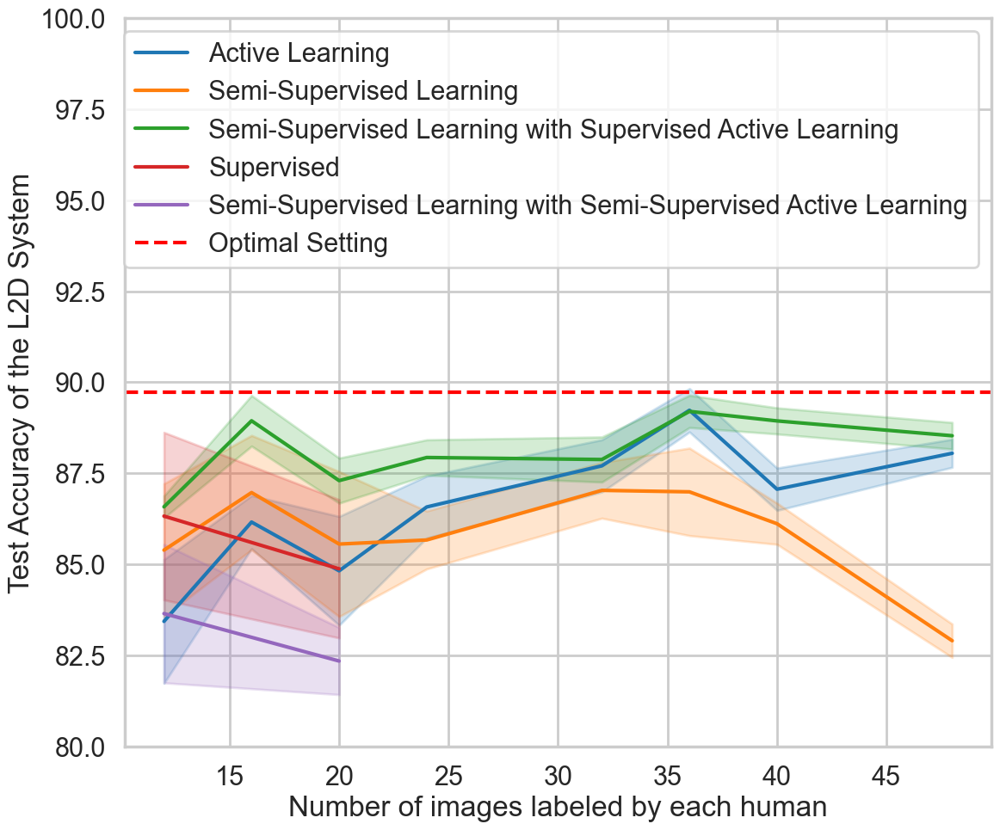

In [107]:
build_df = df.copy()
#Set ids
#build_df = build_df[build_df["labeler_ids"] == "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295349121, 4295342357]"]
build_df = build_df[build_df["labeler_ids"] == "[4295342357, 4295354117]"]

dff = build_df[build_df["setting"] != "PERFECT"].copy().reset_index()
dfff = build_df[build_df["setting"] == "PERFECT"].reset_index()

dff = dff[dff["expert_predict"] == "target"]
#dff = df[df["expert_predict"] == "right"]

dff = dff[dff["overlap"] != 0]
dff = dff[dff["sample_equal"] != False]

#dff = dff[dff["mod"] != "disagreement_diff"]

#dff = dff[dff["setting"] != "NORMAL"]
#dff = dff[dff["setting"] != "SSL_AL_SSL"]
#dff = dff[dff["setting"] != "AL"]
#dff = dff[dff["setting"] != "SSL"]


dff["group"] = dff["group"].replace(runs_df.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=small_format)
sns.set_context("poster")

#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
ln = sns.lineplot(x="group", y="value", hue=dff[["setting"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))
ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")

ax.set(ylim=(80, 100))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test Accuracy of the L2D System")
plt.legend(loc='upper right')
leg_texts = ["Active Learning", "Semi-Supervised Learning", "Semi-Supervised Learning with Supervised Active Learning"]
for t, l in zip(ln.legend_.texts, leg_texts):
    t.set_text(l)
plt.savefig("../../images/NIH/5717/overall_setting_target.png", bbox_inches="tight")

In [111]:
from scipy.stats import iqr

a = dff.dropna().groupby(["setting", "group"])["value"].agg([np.median, "mean", "std"])#.mean()
a = a.reset_index()

a = a[a["group"] <= 50]
#a = a[a["setting"] != "NORMAL"]
#a = a[a["setting"] != "SSL_AL_SSL"]

pivoted_df = a.pivot_table(index=["setting"], columns="group", values=["median", "mean", "std"])
pivoted_df = pivoted_df.reset_index()

pivoted_df.to_csv("../../tables/NIH/5717/overall_setting_acc_target.csv")
pivoted_df

setting       mean                                              \
group                     12         16         20         24         32   
0              AL  83.435161  86.161559  84.822939  86.575566  87.705285   
1          NORMAL  86.325035        NaN  84.877998        NaN        NaN   
2             SSL  85.391503  86.971267  85.557587  85.669690  87.032140   
3          SSL_AL  86.579782  88.941835  87.299684  87.934275  87.878996   
4      SSL_AL_SSL  83.649263        NaN  82.346290        NaN        NaN   

                                           median  ...                        \
group         36         40         48         12  ...         40         48   
0      89.230984  87.063395  88.050252  82.954545  ...  88.095238  88.273491   
1            NaN        NaN        NaN  87.058824  ...        NaN        NaN   
2      86.991320  86.115959  82.904209  85.882353  ...  86.555829  82.363039   
3      89.199876  88.938371  88.531345  86.585366  ...  89.237452  89.017690   
4            NaN        NaN        NaN  85.714286  ...        NaN        NaN   

            std                                                              \
group        12        16        20        24        32        36        40   
0      5.096991  2.056731  6.157143  4.165718  2.866991  2.384140  2.846759   
1      5.139950       NaN  4.245242       NaN       NaN       NaN       NaN   
2      4.076233  3.139150  5.971925  2.754449  2.161768  3.398105  1.962131   
3      3.236515  2.779238  3.557892  3.371608  3.504472  2.506288  2.489312   
4      4.250216       NaN  1.842432       NaN       NaN       NaN       NaN   

                 
group        48  
0      2.177931  
1           NaN  
2      1.833314  
3      2.923611  
4           NaN  

[5 rows x 25 columns]

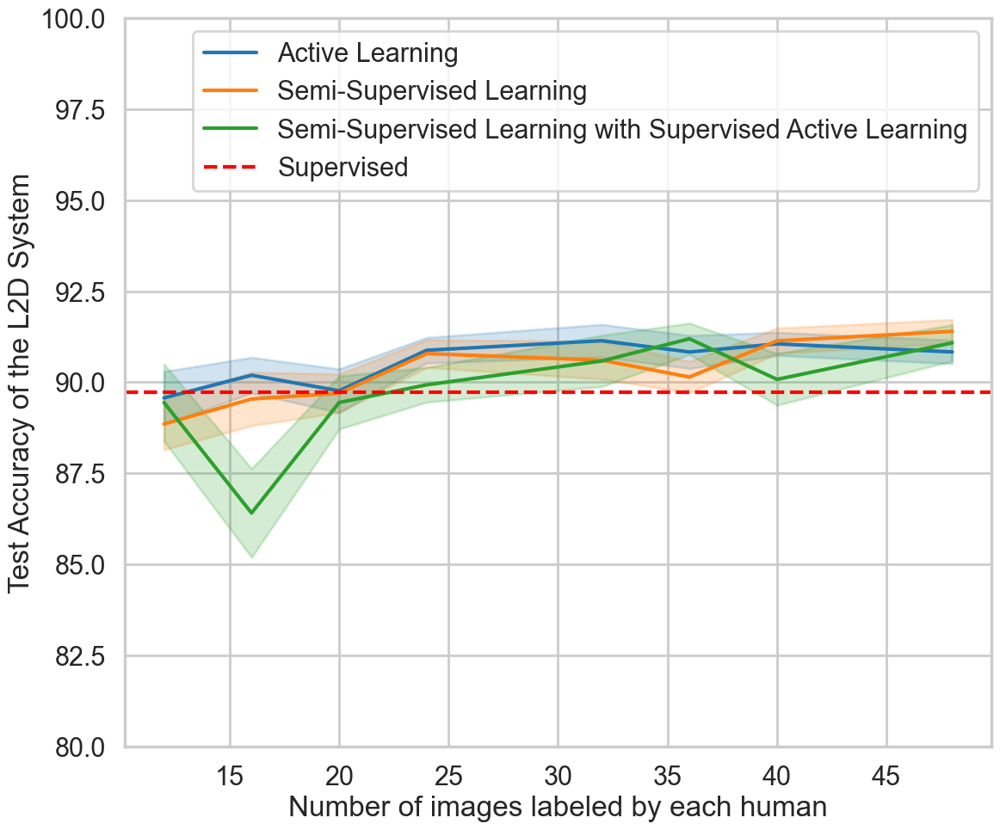

In [113]:
build_df = df.copy()
#Set ids
#build_df = build_df[build_df["labeler_ids"] == "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295349121, 4295342357]"]
build_df = build_df[build_df["labeler_ids"] == "[4295342357, 4295354117]"]

dff = build_df[build_df["setting"] != "PERFECT"].copy().reset_index()
dfff = build_df[build_df["setting"] == "PERFECT"].reset_index()

#dff = dff[dff["expert_predict"] == "target"]
dff = df[df["expert_predict"] == "right"]

dff = dff[dff["overlap"] != 0]
dff = dff[dff["sample_equal"] != False]

#dff = dff[dff["mod"] != "disagreement_diff"]

#dff = dff[dff["setting"] != "NORMAL"]
#dff = dff[dff["setting"] != "SSL_AL_SSL"]
#dff = dff[dff["setting"] != "AL"]
#dff = dff[dff["setting"] != "SSL"]


dff["group"] = dff["group"].replace(runs_df.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=small_format)
sns.set_context("poster")

#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
ln = sns.lineplot(x="group", y="value", hue=dff[["setting"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))
ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")

ax.set(ylim=(80, 100))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test Accuracy of the L2D System")
plt.legend(loc='upper right')
leg_texts = ["Active Learning", "Semi-Supervised Learning", "Semi-Supervised Learning with Supervised Active Learning", "Supervised", "Semi-Supervised Learning with Semi-Supervised Active Learning"]
for t, l in zip(ln.legend_.texts, leg_texts):
    t.set_text(l)
plt.savefig("../../images/NIH/5717/overall_setting_right.png", bbox_inches="tight")

In [114]:
from scipy.stats import iqr

a = dff.dropna().groupby(["setting", "group"])["value"].agg([np.median, "mean", "std"])#.mean()
a = a.reset_index()

a = a[a["group"] <= 50]
#a = a[a["setting"] != "NORMAL"]
#a = a[a["setting"] != "SSL_AL_SSL"]

pivoted_df = a.pivot_table(index=["setting"], columns="group", values=["median", "mean", "std"])
pivoted_df = pivoted_df.reset_index()

pivoted_df.to_csv("../../tables/NIH/5717/overall_setting_acc_right.csv")
pivoted_df

setting       mean                                              \
group                 12         16         20         24         32   
0          AL  88.852928  89.540360  89.697182  90.786885  90.604984   
1         SSL  89.442911  86.410016  89.443602  89.929481  90.583960   
2      SSL_AL  89.570734  90.192320  89.765907  90.878327  91.140428   

                                           median  ...                        \
group         36         40         48         12  ...         40         48   
0      90.143474  91.136696  91.397114  89.482002  ...  90.856844  91.044776   
1      91.192951  90.078621  91.080676  90.387349  ...  90.043290  89.505882   
2      90.830629  91.053088  90.832742  89.982609  ...  90.476190  90.856844   

            std                                                              \
group        12        16        20        24        32        36        40   
0      3.445829  3.584940  3.654463  3.222482  3.598689  2.977900  2.962498   
1      3.655262  4.215380  3.572189  2.849548  3.444589  2.104221  4.246964   
2      3.559582  2.400077  4.146218  2.959034  3.095299  3.135181  2.690503   

                 
group        48  
0      3.158980  
1      3.435635  
2      3.156338  

[3 rows x 25 columns]

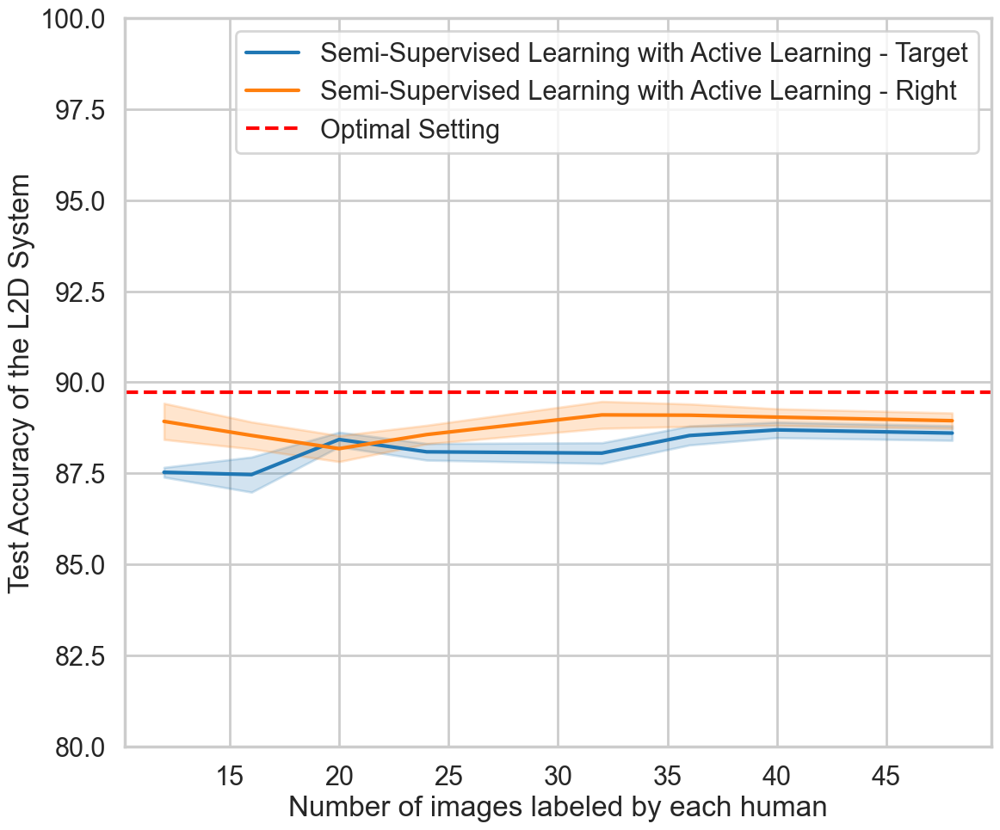

In [121]:
build_df = df.copy()
#Set ids
#build_df = build_df[build_df["labeler_ids"] == "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] != "[4323195249, 4295232296]"]
build_df = build_df[build_df["labeler_ids"] == "[4295349121, 4295342357]"]

dff = build_df[build_df["setting"] != "PERFECT"].copy().reset_index()
dfff = build_df[build_df["setting"] == "PERFECT"].reset_index()

#dff = dff[dff["expert_predict"] == "target"]
#dff = df[df["expert_predict"] == "right"]

#dff = dff[dff["overlap"] != 0]
#dff = dff[dff["sample_equal"] != False]

#dff = dff[dff["mod"] != "disagreement_diff"]

dff = dff[dff["setting"] != "NORMAL"]
dff = dff[dff["setting"] != "SSL_AL_SSL"]
dff = dff[dff["setting"] != "AL"]
dff = dff[dff["setting"] != "SSL"]


dff["group"] = dff["group"].replace(runs_df.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=small_format)
sns.set_context("poster")
#, "overlap", "sample_equal", "expert_predict", "mod"
#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
ln = sns.lineplot(x="group", y="value", hue=dff[["setting", "expert_predict"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))
ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")
#ax.axhline(90.1403561, ls='--', color="g")
#ax.axhline(87.5957923, ls='--', color="b")
ax.set(ylim=(80, 100))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test Accuracy of the L2D System")
plt.legend(loc='upper right')
leg_texts = ["Semi-Supervised Learning with Active Learning - Target", "Semi-Supervised Learning with Active Learning - Right"]
for t, l in zip(ln.legend_.texts, leg_texts):
    t.set_text(l)
plt.savefig("../../images/NIH/5717/expert_strategy.png", bbox_inches="tight")

In [ ]:
from scipy.stats import iqr

a = dff.dropna().groupby(["setting", "group"])["value"].agg([np.median, "mean", "std"])#.mean()
a = a.reset_index()

a = a[a["group"] <= 50]
#a = a[a["setting"] != "NORMAL"]
#a = a[a["setting"] != "SSL_AL_SSL"]

pivoted_df = a.pivot_table(index=["setting"], columns="group", values=["median", "mean", "std"])
pivoted_df = pivoted_df.reset_index()

pivoted_df.to_csv("../../tables/NIH/5717/approach_acc_model_strategy.csv")
pivoted_df

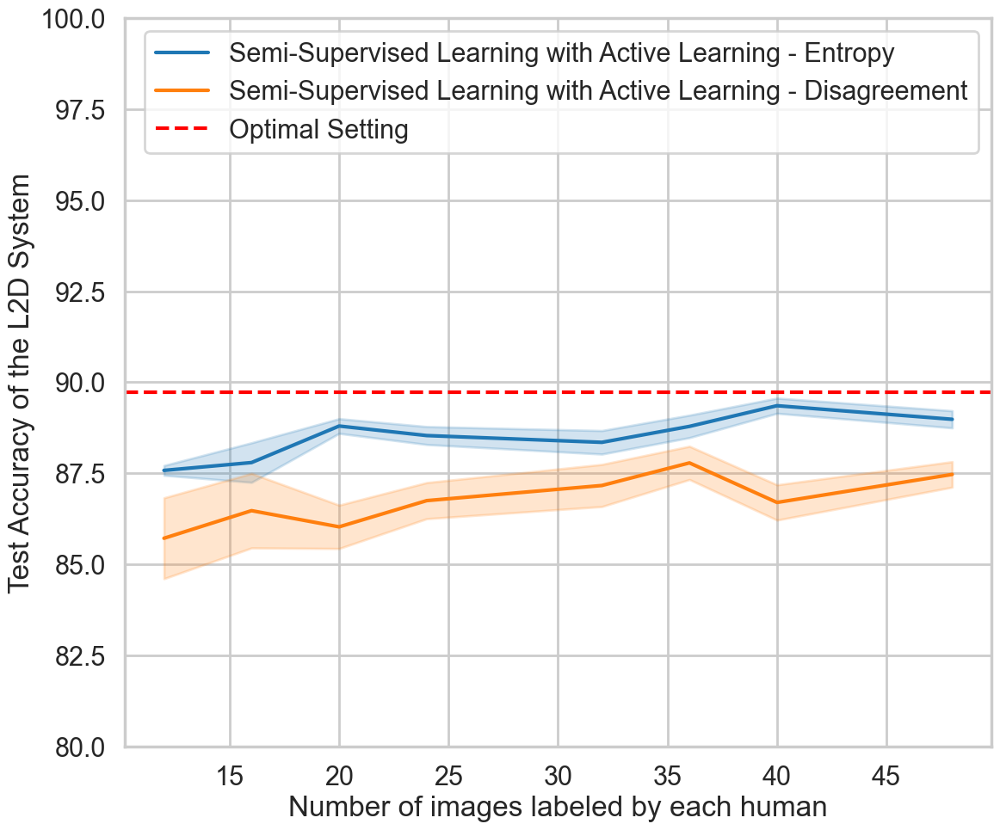

In [124]:
build_df = df.copy()
#Set ids
#build_df = build_df[build_df["labeler_ids"] == "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295349121, 4295342357]"]
build_df = build_df[build_df["labeler_ids"] == "[4295342357, 4295354117]"]

dff = build_df[build_df["setting"] != "PERFECT"].copy().reset_index()
dfff = build_df[build_df["setting"] == "PERFECT"].reset_index()

dff = dff[dff["expert_predict"] == "target"]
#dff = df[df["expert_predict"] == "right"]

#dff = dff[dff["overlap"] != 0]
#dff = dff[dff["sample_equal"] != False]

#dff = dff[dff["mod"] != "disagreement_diff"]

dff = dff[dff["setting"] != "NORMAL"]
dff = dff[dff["setting"] != "SSL_AL_SSL"]
dff = dff[dff["setting"] != "AL"]
dff = dff[dff["setting"] != "SSL"]

dff["group"] = dff["group"].replace(runs_df.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=small_format)
sns.set_context("poster")
#, "overlap", "sample_equal", "expert_predict", "mod"
#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
ln = sns.lineplot(x="group", y="value", hue=dff[["setting", "mod"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))
ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")
#ax.axhline(90.1403561, ls='--', color="g")
#ax.axhline(87.5957923, ls='--', color="b")
ax.set(ylim=(80, 100))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test Accuracy of the L2D System")
plt.legend(loc='upper right')
leg_texts = ["Semi-Supervised Learning with Active Learning - Entropy", "Semi-Supervised Learning with Active Learning - Disagreement"]
for t, l in zip(ln.legend_.texts, leg_texts):
    t.set_text(l)
plt.savefig("../../images/NIH/5717/al_strategy_target.png", bbox_inches="tight")

In [ ]:
from scipy.stats import iqr

a = dff.dropna().groupby(["setting", "group"])["value"].agg([np.median, "mean", "std"])#.mean()
a = a.reset_index()

a = a[a["group"] <= 50]
#a = a[a["setting"] != "NORMAL"]
#a = a[a["setting"] != "SSL_AL_SSL"]

pivoted_df = a.pivot_table(index=["setting"], columns="group", values=["median", "mean", "std"])
pivoted_df = pivoted_df.reset_index()

pivoted_df.to_csv("../../tables/NIH/5717/approach_acc_al_strategy_target.csv")
pivoted_df

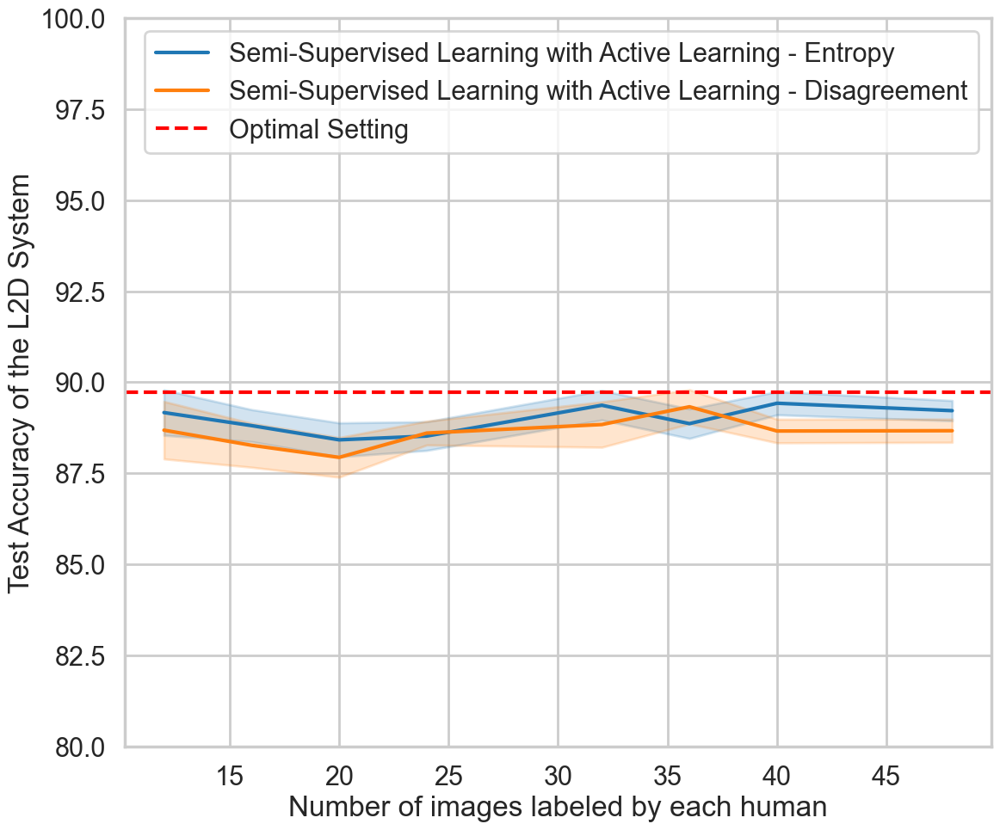

In [126]:
build_df = df.copy()
#Set ids
#build_df = build_df[build_df["labeler_ids"] == "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295349121, 4295342357]"]

build_df = build_df[build_df["labeler_ids"] == "[4295342357, 4295354117]"]

dff = build_df[build_df["setting"] != "PERFECT"].copy().reset_index()
dfff = build_df[build_df["setting"] == "PERFECT"].reset_index()

#dff = dff[dff["expert_predict"] == "target"]
dff = dff[dff["expert_predict"] == "right"]

#dff = dff[dff["overlap"] != 0]
#dff = dff[dff["sample_equal"] != False]

#dff = dff[dff["mod"] != "disagreement_diff"]

dff = dff[dff["setting"] != "NORMAL"]
dff = dff[dff["setting"] != "SSL_AL_SSL"]
dff = dff[dff["setting"] != "AL"]
dff = dff[dff["setting"] != "SSL"]

dff["group"] = dff["group"].replace(runs_df.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=small_format)
sns.set_context("poster")
#, "overlap", "sample_equal", "expert_predict", "mod"
#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
ln = sns.lineplot(x="group", y="value", hue=dff[["setting", "mod"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))
ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")
#ax.axhline(90.1403561, ls='--', color="g")
#ax.axhline(87.5957923, ls='--', color="b")
ax.set(ylim=(80, 100))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test Accuracy of the L2D System")
plt.legend(loc='upper right')
leg_texts = ["Semi-Supervised Learning with Active Learning - Entropy", "Semi-Supervised Learning with Active Learning - Disagreement"]
for t, l in zip(ln.legend_.texts, leg_texts):
    t.set_text(l)
plt.savefig("../../images/NIH/5717/al_strategy_right.png", bbox_inches="tight")

In [ ]:
from scipy.stats import iqr

a = dff.dropna().groupby(["setting", "group"])["value"].agg([np.median, "mean", "std"])#.mean()
a = a.reset_index()

a = a[a["group"] <= 50]
#a = a[a["setting"] != "NORMAL"]
#a = a[a["setting"] != "SSL_AL_SSL"]

pivoted_df = a.pivot_table(index=["setting"], columns="group", values=["median", "mean", "std"])
pivoted_df = pivoted_df.reset_index()

pivoted_df.to_csv("../../tables/NIH/5717/approach_acc_al_strategy_right.csv")
pivoted_df

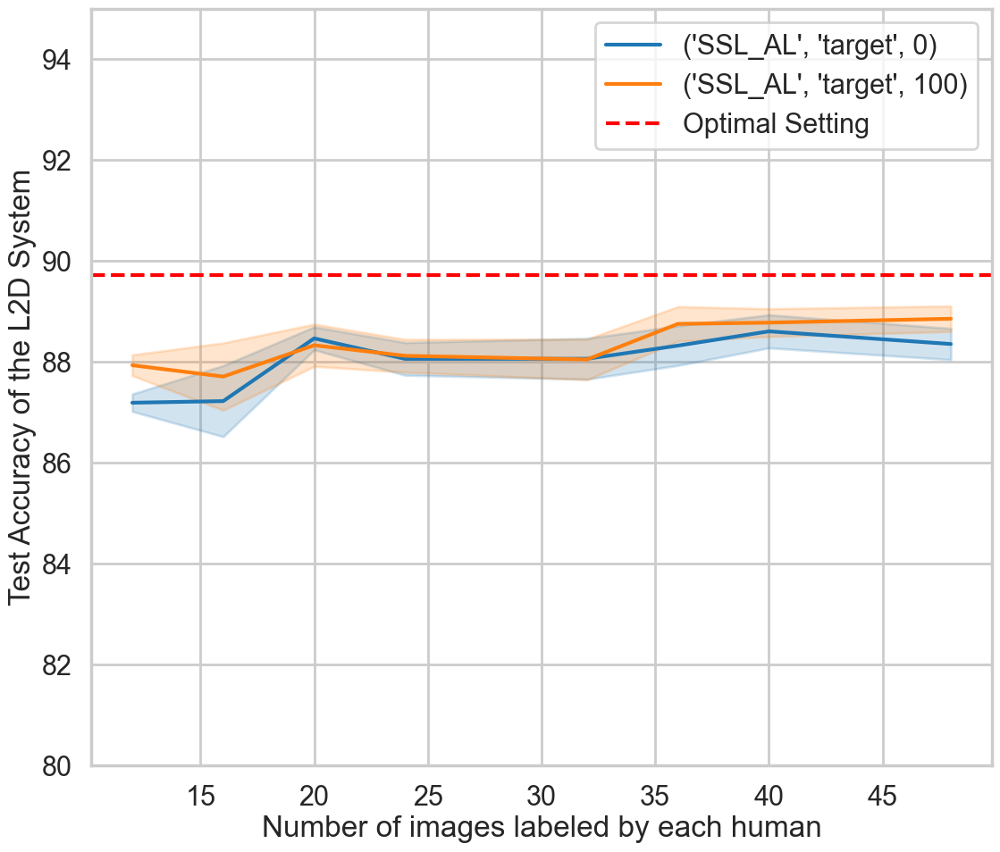

In [127]:
build_df = df.copy()
#Set ids
#build_df = build_df[build_df["labeler_ids"] == "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295349121, 4295342357]"]
build_df = build_df[build_df["labeler_ids"] == "[4295342357, 4295354117]"]


dff = build_df[build_df["setting"] != "PERFECT"].copy().reset_index()
dfff = build_df[build_df["setting"] == "PERFECT"].reset_index()

dff = dff[dff["expert_predict"] == "target"]
#dff = dff[dff["expert_predict"] == "right"]

#dff = dff[dff["overlap"] != 0]
#dff = dff[dff["sample_equal"] != False]

#dff = dff[dff["mod"] != "disagreement_diff"]

dff = dff[dff["setting"] != "NORMAL"]
dff = dff[dff["setting"] != "SSL_AL_SSL"]
dff = dff[dff["setting"] != "AL"]
dff = dff[dff["setting"] != "SSL"]


dff["group"] = dff["group"].replace(runs_df.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=small_format)
sns.set_context("poster")
#, "overlap", "sample_equal", "expert_predict", "mod"
#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
ln = sns.lineplot(x="group", y="value", hue=dff[["setting", "expert_predict", "overlap"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))
ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")
#ax.axhline(90.1403561, ls='--', color="g")
#ax.axhline(87.5957923, ls='--', color="b")
ax.set(ylim=(80, 95))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test Accuracy of the L2D System")
plt.legend(loc='upper right')
#leg_texts = ["Semi-Supervised Learning with Active Learning, 0% overlab", "Semi-Supervised Learning with Active Learning, 100% overlab"]
#for t, l in zip(ln.legend_.texts, leg_texts):
#    t.set_text(l)
plt.savefig("../../images/NIH/5717/parameters_overlap_target.png", bbox_inches="tight")

In [ ]:
from scipy.stats import iqr

a = dff.dropna().groupby(["setting", "group"])["value"].agg([np.median, "mean", "std"])#.mean()
a = a.reset_index()

a = a[a["group"] <= 50]
#a = a[a["setting"] != "NORMAL"]
#a = a[a["setting"] != "SSL_AL_SSL"]

pivoted_df = a.pivot_table(index=["setting"], columns="group", values=["median", "mean", "std"])
pivoted_df = pivoted_df.reset_index()

pivoted_df.to_csv("../../tables/NIH/5717/approach_acc_overlap_target.csv")
pivoted_df

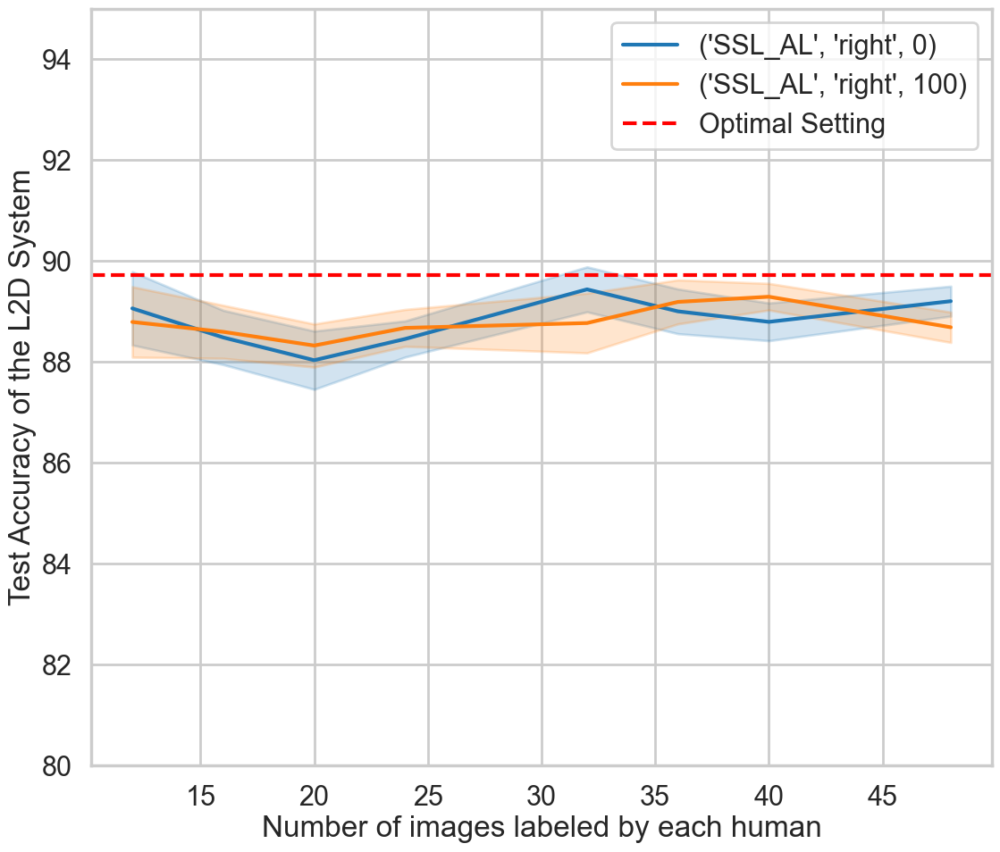

In [128]:
build_df = df.copy()
#Set ids
#build_df = build_df[build_df["labeler_ids"] == "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295349121, 4295342357]"]
build_df = build_df[build_df["labeler_ids"] == "[4295342357, 4295354117]"]


dff = build_df[build_df["setting"] != "PERFECT"].copy().reset_index()
dfff = build_df[build_df["setting"] == "PERFECT"].reset_index()

#dff = dff[dff["expert_predict"] == "target"]
dff = dff[dff["expert_predict"] == "right"]

#dff = dff[dff["overlap"] != 0]
#dff = dff[dff["sample_equal"] != False]

#dff = dff[dff["mod"] != "disagreement_diff"]

dff = dff[dff["setting"] != "NORMAL"]
dff = dff[dff["setting"] != "SSL_AL_SSL"]
dff = dff[dff["setting"] != "AL"]
dff = dff[dff["setting"] != "SSL"]


dff["group"] = dff["group"].replace(runs_df.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=small_format)
sns.set_context("poster")
#, "overlap", "sample_equal", "expert_predict", "mod"
#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
ln = sns.lineplot(x="group", y="value", hue=dff[["setting", "expert_predict", "overlap"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))
ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")
#ax.axhline(90.1403561, ls='--', color="g")
#ax.axhline(87.5957923, ls='--', color="b")
ax.set(ylim=(80, 95))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test Accuracy of the L2D System")
plt.legend(loc='upper right')
#leg_texts = ["Semi-Supervised Learning with Active Learning, 0% overlab", "Semi-Supervised Learning with Active Learning, 100% overlab"]
#for t, l in zip(ln.legend_.texts, leg_texts):
#    t.set_text(l)
plt.savefig("../../images/NIH/5717/parameters_overlap_right.png", bbox_inches="tight")

In [ ]:
from scipy.stats import iqr

a = dff.dropna().groupby(["setting", "group"])["value"].agg([np.median, "mean", "std"])#.mean()
a = a.reset_index()

a = a[a["group"] <= 50]
#a = a[a["setting"] != "NORMAL"]
#a = a[a["setting"] != "SSL_AL_SSL"]

pivoted_df = a.pivot_table(index=["setting"], columns="group", values=["median", "mean", "std"])
pivoted_df = pivoted_df.reset_index()

pivoted_df.to_csv("../../tables/NIH/5717/approach_acc_overlap_right.csv")
pivoted_df

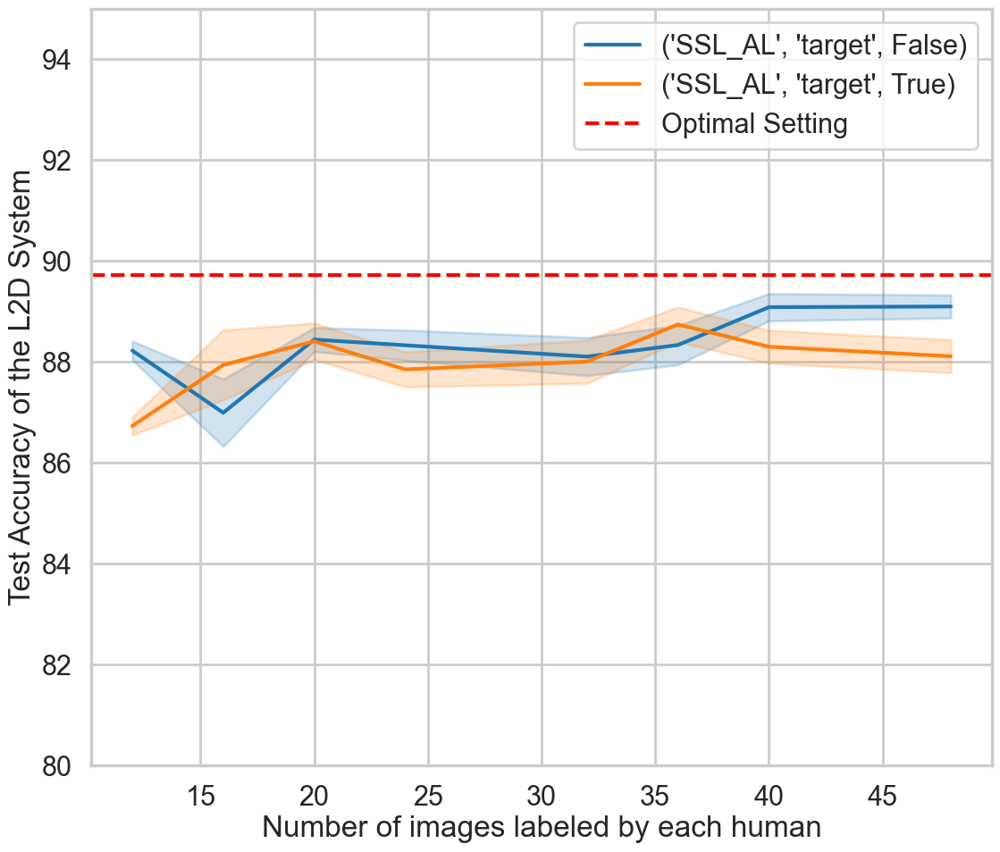

In [129]:
build_df = df.copy()
#Set ids
#build_df = build_df[build_df["labeler_ids"] == "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295349121, 4295342357]"]
build_df = build_df[build_df["labeler_ids"] == "[4295342357, 4295354117]"]

dff = build_df[build_df["setting"] != "PERFECT"].copy().reset_index()
dfff = build_df[build_df["setting"] == "PERFECT"].reset_index()

dff = dff[dff["expert_predict"] == "target"]
#dff = dff[dff["expert_predict"] == "right"]

#dff = dff[dff["overlap"] != 0]
#dff = dff[dff["sample_equal"] != False]

#dff = dff[dff["mod"] != "disagreement_diff"]

dff = dff[dff["setting"] != "NORMAL"]
dff = dff[dff["setting"] != "SSL_AL_SSL"]
dff = dff[dff["setting"] != "AL"]
dff = dff[dff["setting"] != "SSL"]


dff["group"] = dff["group"].replace(runs_df.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=small_format)
sns.set_context("poster")
#, "overlap", "sample_equal", "expert_predict", "mod"
#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
ln = sns.lineplot(x="group", y="value", hue=dff[["setting", "expert_predict", "sample_equal"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))

#ln = sns.lineplot(x="group", y="value", hue=dff[["setting", "expert_predict", "sample_equal"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=estimator, errorbar=(lambda x: (np.median(x)-stats.sem(x), np.median(x)+stats.sem(x))))

from scipy import stats

(lambda x: (np.median(x)-stats.sem(x), np.median(x)+stats.sem(x)))


ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")
#ax.axhline(90.1403561, ls='--', color="g")
#ax.axhline(87.5957923, ls='--', color="b")
ax.set(ylim=(80, 95))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test Accuracy of the L2D System")
plt.legend(loc='upper right')
#leg_texts = ["Semi-Supervised Learning with Active Learning, sample target randomly", "Semi-Supervised Learning with Active Learning, sample target equally"]
#for t, l in zip(ln.legend_.texts, leg_texts):
#    t.set_text(l)
plt.savefig("../../images/NIH/5717/parameters_sample_target.png", bbox_inches="tight")

In [ ]:
from scipy.stats import iqr

a = dff.dropna().groupby(["setting", "group"])["value"].agg([np.median, "mean", "std"])#.mean()
a = a.reset_index()

a = a[a["group"] <= 50]
#a = a[a["setting"] != "NORMAL"]
#a = a[a["setting"] != "SSL_AL_SSL"]

pivoted_df = a.pivot_table(index=["setting"], columns="group", values=["median", "mean", "std"])
pivoted_df = pivoted_df.reset_index()

pivoted_df.to_csv("../../tables/NIH/5717/approach_acc_sample_target.csv")
pivoted_df

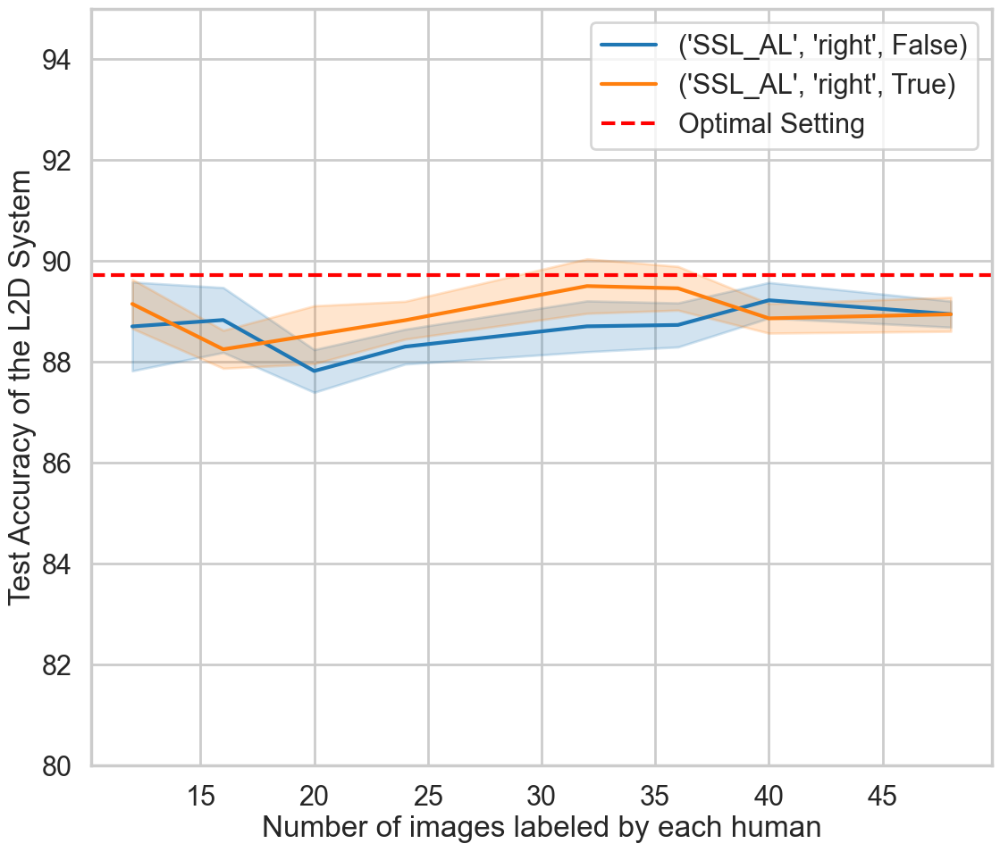

In [130]:
build_df = df.copy()
#Set ids
#build_df = build_df[build_df["labeler_ids"] == "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295349121, 4295342357]"]
build_df = build_df[build_df["labeler_ids"] == "[4295342357, 4295354117]"]

dff = build_df[build_df["setting"] != "PERFECT"].copy().reset_index()
dfff = build_df[build_df["setting"] == "PERFECT"].reset_index()

#dff = dff[dff["expert_predict"] == "target"]
dff = dff[dff["expert_predict"] == "right"]

#dff = dff[dff["overlap"] != 0]
#dff = dff[dff["sample_equal"] != False]

#dff = dff[dff["mod"] != "disagreement_diff"]

dff = dff[dff["setting"] != "NORMAL"]
dff = dff[dff["setting"] != "SSL_AL_SSL"]
dff = dff[dff["setting"] != "AL"]
dff = dff[dff["setting"] != "SSL"]


dff["group"] = dff["group"].replace(runs_df.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=small_format)
sns.set_context("poster")
#, "overlap", "sample_equal", "expert_predict", "mod"
#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
ln = sns.lineplot(x="group", y="value", hue=dff[["setting", "expert_predict", "sample_equal"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))

#ln = sns.lineplot(x="group", y="value", hue=dff[["setting", "expert_predict", "sample_equal"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=estimator, errorbar=(lambda x: (np.median(x)-stats.sem(x), np.median(x)+stats.sem(x))))

from scipy import stats

(lambda x: (np.median(x)-stats.sem(x), np.median(x)+stats.sem(x)))


ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")
#ax.axhline(90.1403561, ls='--', color="g")
#ax.axhline(87.5957923, ls='--', color="b")
ax.set(ylim=(80, 95))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test Accuracy of the L2D System")
plt.legend(loc='upper right')
#leg_texts = ["Semi-Supervised Learning with Active Learning, sample target randomly", "Semi-Supervised Learning with Active Learning, sample target equally"]
#for t, l in zip(ln.legend_.texts, leg_texts):
#    t.set_text(l)
plt.savefig("../../images/NIH/5717/parameters_sample_right.png", bbox_inches="tight")

In [ ]:
from scipy.stats import iqr

a = dff.dropna().groupby(["setting", "group"])["value"].agg([np.median, "mean", "std"])#.mean()
a = a.reset_index()

a = a[a["group"] <= 50]
#a = a[a["setting"] != "NORMAL"]
#a = a[a["setting"] != "SSL_AL_SSL"]

pivoted_df = a.pivot_table(index=["setting"], columns="group", values=["median", "mean", "std"])
pivoted_df = pivoted_df.reset_index()

pivoted_df.to_csv("../../tables/NIH/5717/approach_acc_sample_right.csv")
pivoted_df

# Other metrics

In [7]:
metricManager.get_l2d_dataframe("verma", "test").columns

Index(['coverage', 'system_accuracy', 'expert_accuracy', 'classifier_accuracy',
       'alone_classifier', 'validation_loss', 'n_experts', 'expert_0',
       'expert_1', 'expert_0_coverage', 'expert_1_coverage', 'cov_classifier',
       'coverage_frac', 'expert_2', 'expert_2_coverage'],
      dtype='object')

In [8]:
df_runs = metricManager.runs

,labeled
0,12
20,20
38,36
43,16
48,24
58,40
74,68
153,72
161,32
169,48


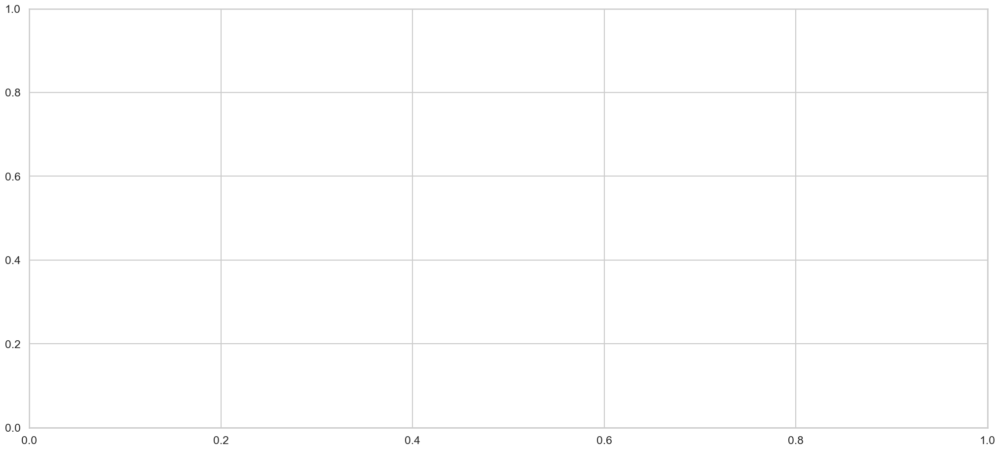

In [21]:
grouped_columns = []
cut_out = [("labeler_ids", "[4295349121, 4295342357, 4295354117]")]#, ("setting", "AL"), ("setting", "SSL"), ("setting", "NORMAL"), ("mod", "disagreement_diff")]#, ("overlap", 0), ("sample_equal", False)]#("setting", "AL"), ("setting", "SSL"), ("setting", "NORMAL"), ("mod", "disagreement_diff"), ("expert_predict", "target")]#, ("sample_equal", True), ("overlap", 100), 
#var_columns = ["labeled", "rounds", "init_size", "labels_per_round"]
var_columns = ["setting", "mod", "expert_predict", "overlap", "sample_equal", "labeler_ids", "init_size", "labels_per_round", "rounds"]#, "expert_predict"]

method = "verma"
metric_name = "cov_classifier"
#metric_name = "coverage"
step = "test"

sns.set_style("whitegrid")
sns.set_context("talk")

df_test_overlap = cut_column_name(metricManager.get_metric_dataframe(method, step, metric_name))
df_grouped_metrics_overlap, selected_runs_overlap = get_runs_grouped_metric(df_runs.iloc[:], df_test_overlap, grouped_columns, False, cut_out)

selected_runs_overlap["labeler_ids"] = selected_runs_overlap["labeler_ids"].apply(lambda x: str(x))

df_grouped_metrics_overlap.columns = [str(name) for name in df_grouped_metrics_overlap.columns]

df_overlap, runs_df_overlap, series_overlap = plot_runs_hue_metric(selected_runs_overlap, df_grouped_metrics_overlap, var_columns, cut_out, y_text=f"{method}_{step}_{metric_name}", slice=None, plot=False)
#group_test = group_ttest(df)

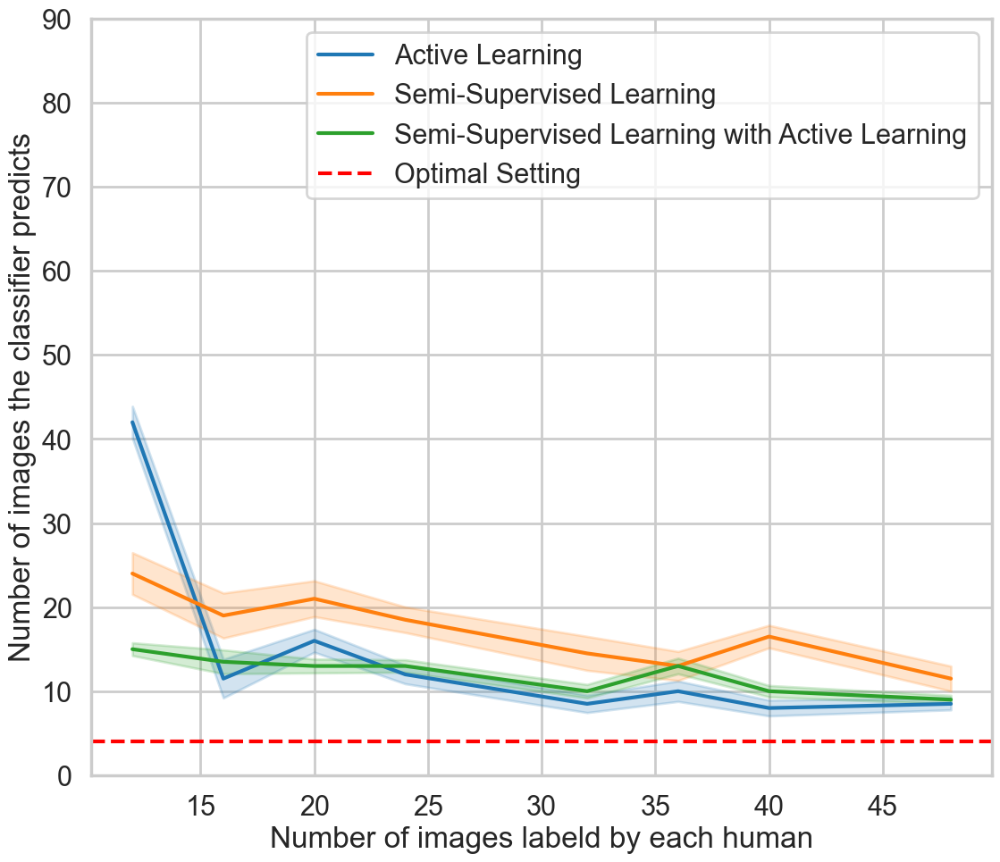

In [185]:
build_df = df_overlap.copy()
#Set ids
#build_df = build_df[build_df["labeler_ids"] == "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] != "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295349121, 4295342357]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295342357, 4295354117]"]

dff = build_df[build_df["setting"] != "PERFECT"].copy().reset_index()
dfff = build_df[build_df["setting"] == "PERFECT"].reset_index()

#dff = dff[dff["expert_predict"] == "target"]
#dff = dff[dff["expert_predict"] == "right"]

#dff = dff[dff["overlap"] != 0]
#dff = dff[dff["sample_equal"] != False]

#dff = dff[dff["mod"] != "disagreement_diff"]

dff = dff[dff["setting"] != "NORMAL"]
dff = dff[dff["setting"] != "SSL_AL_SSL"]
#dff = dff[dff["setting"] != "AL"]
#dff = dff[dff["setting"] != "SSL"]


dff["group"] = dff["group"].replace(runs_df_overlap.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=(13, 11))
sns.set_context("poster")
#, "overlap", "sample_equal", "expert_predict", "mod"
#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
ln = sns.lineplot(x="group", y="value", hue=dff[["setting"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))
ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")
#ax.axhline(90.1403561, ls='--', color="g")
#ax.axhline(87.5957923, ls='--', color="b")
ax.set(ylim=(0, 90))

ax.set(xlabel='Number of images labeled by each human', ylabel="Number of images the classifier predicts")
plt.legend(loc='upper right')
leg_texts = ["Active Learning", "Semi-Supervised Learning", "Semi-Supervised Learning with Active Learning"]
for t, l in zip(ln.legend_.texts, leg_texts):
    t.set_text(l)
plt.savefig("../../images/NIH/overall_clf_cov.png", bbox_inches="tight")

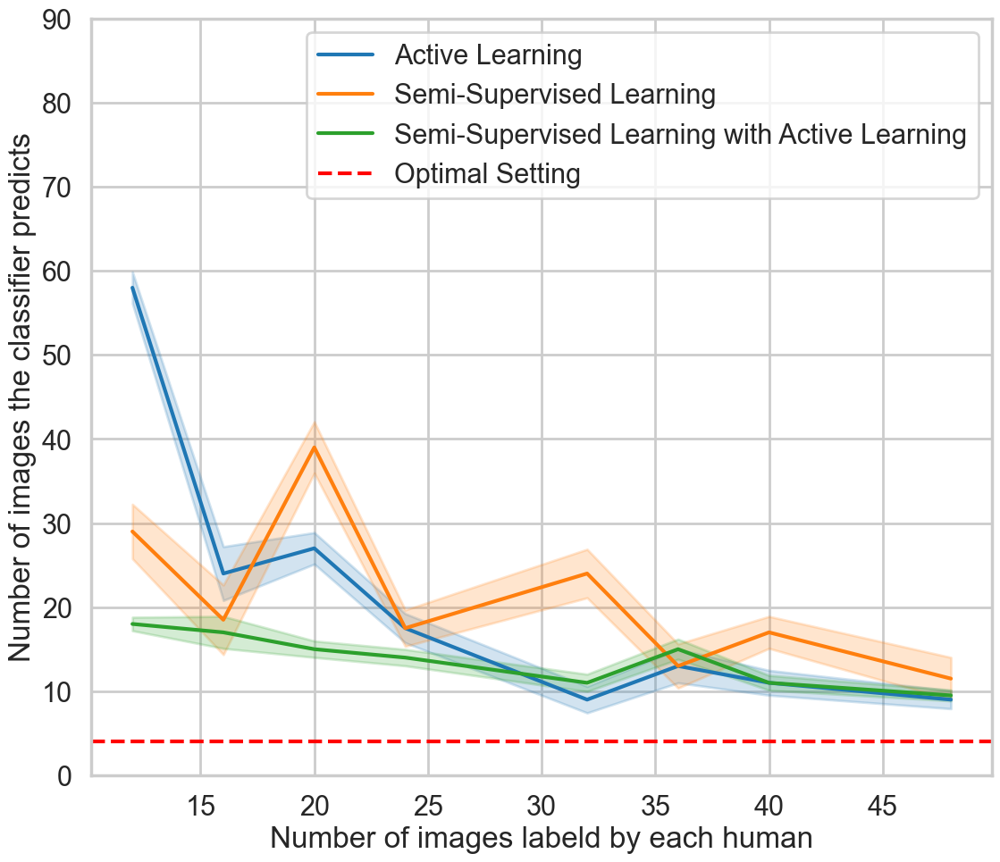

In [187]:
build_df = df_overlap.copy()
#Set ids
#build_df = build_df[build_df["labeler_ids"] == "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] != "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295349121, 4295342357]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295342357, 4295354117]"]

dff = build_df[build_df["setting"] != "PERFECT"].copy().reset_index()
dfff = build_df[build_df["setting"] == "PERFECT"].reset_index()

dff = dff[dff["expert_predict"] == "target"]
#dff = dff[dff["expert_predict"] == "right"]

#dff = dff[dff["overlap"] != 0]
#dff = dff[dff["sample_equal"] != False]

#dff = dff[dff["mod"] != "disagreement_diff"]

dff = dff[dff["setting"] != "NORMAL"]
dff = dff[dff["setting"] != "SSL_AL_SSL"]
#dff = dff[dff["setting"] != "AL"]
#dff = dff[dff["setting"] != "SSL"]


dff["group"] = dff["group"].replace(runs_df_overlap.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=(13, 11))
sns.set_context("poster")
#, "overlap", "sample_equal", "expert_predict", "mod"
#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
ln = sns.lineplot(x="group", y="value", hue=dff[["setting"]].apply(tuple, axis=1), hue_order=[("AL",), ("SSL",), ("SSL_AL",)], data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))
ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")
#ax.axhline(90.1403561, ls='--', color="g")
#ax.axhline(87.5957923, ls='--', color="b")
ax.set(ylim=(0, 90))

ax.set(xlabel='Number of images labeled by each human', ylabel="Number of images the classifier predicts")
plt.legend(loc='upper right')
leg_texts = ["Active Learning", "Semi-Supervised Learning", "Semi-Supervised Learning with Active Learning"]
for t, l in zip(ln.legend_.texts, leg_texts):
    t.set_text(l)
plt.savefig("../../images/NIH/overall_clf_cov_target.png", bbox_inches="tight")

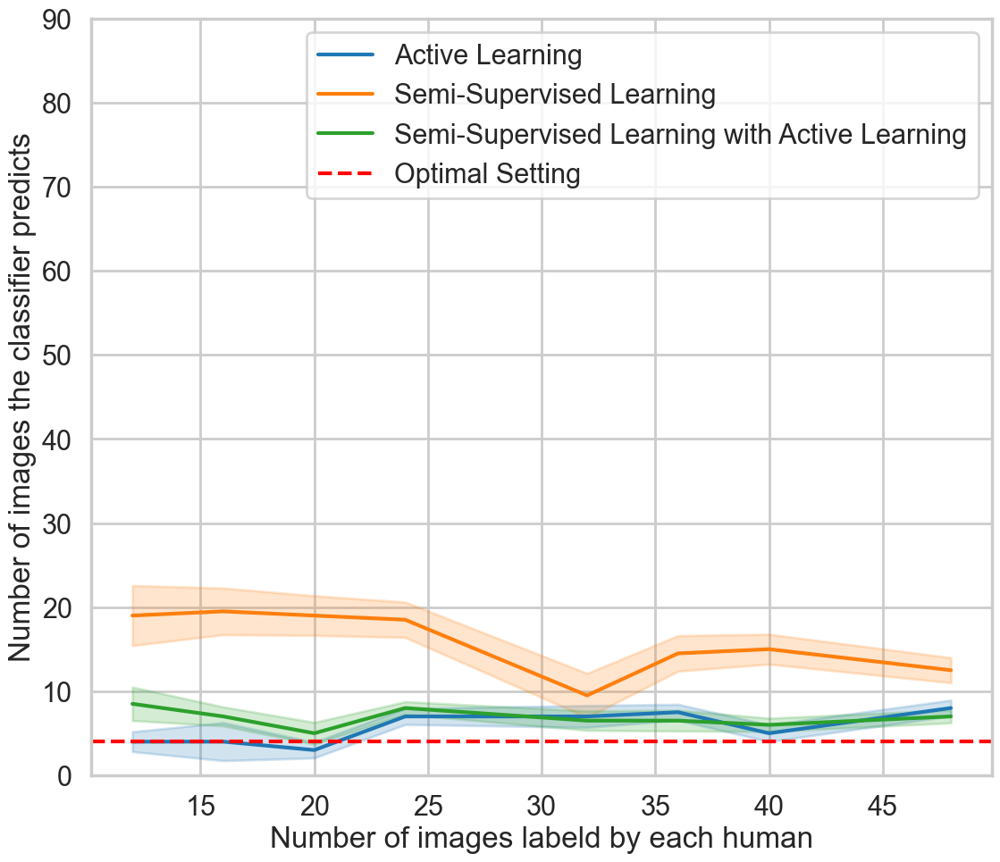

In [188]:
build_df = df_overlap.copy()
#Set ids
#build_df = build_df[build_df["labeler_ids"] == "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] != "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295349121, 4295342357]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295342357, 4295354117]"]

dff = build_df[build_df["setting"] != "PERFECT"].copy().reset_index()
dfff = build_df[build_df["setting"] == "PERFECT"].reset_index()

#dff = dff[dff["expert_predict"] == "target"]
dff = dff[dff["expert_predict"] == "right"]

#dff = dff[dff["overlap"] != 0]
#dff = dff[dff["sample_equal"] != False]

#dff = dff[dff["mod"] != "disagreement_diff"]

dff = dff[dff["setting"] != "NORMAL"]
dff = dff[dff["setting"] != "SSL_AL_SSL"]
#dff = dff[dff["setting"] != "AL"]
#dff = dff[dff["setting"] != "SSL"]


dff["group"] = dff["group"].replace(runs_df_overlap.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=(13, 11))
sns.set_context("poster")
#, "overlap", "sample_equal", "expert_predict", "mod"
#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
ln = sns.lineplot(x="group", y="value", hue=dff[["setting"]].apply(tuple, axis=1), hue_order=[("AL",), ("SSL",), ("SSL_AL",)], data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))
ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")
#ax.axhline(90.1403561, ls='--', color="g")
#ax.axhline(87.5957923, ls='--', color="b")
ax.set(ylim=(0, 90))

ax.set(xlabel='Number of images labeled by each human', ylabel="Number of images the classifier predicts")
plt.legend(loc='upper right')
leg_texts = ["Active Learning", "Semi-Supervised Learning", "Semi-Supervised Learning with Active Learning"]
for t, l in zip(ln.legend_.texts, leg_texts):
    t.set_text(l)
plt.savefig("../../images/NIH/overall_clf_cov_right.png", bbox_inches="tight")

,labeled
0,12
20,20
38,36
43,16
48,24
58,40
74,68
153,72
161,32
169,48


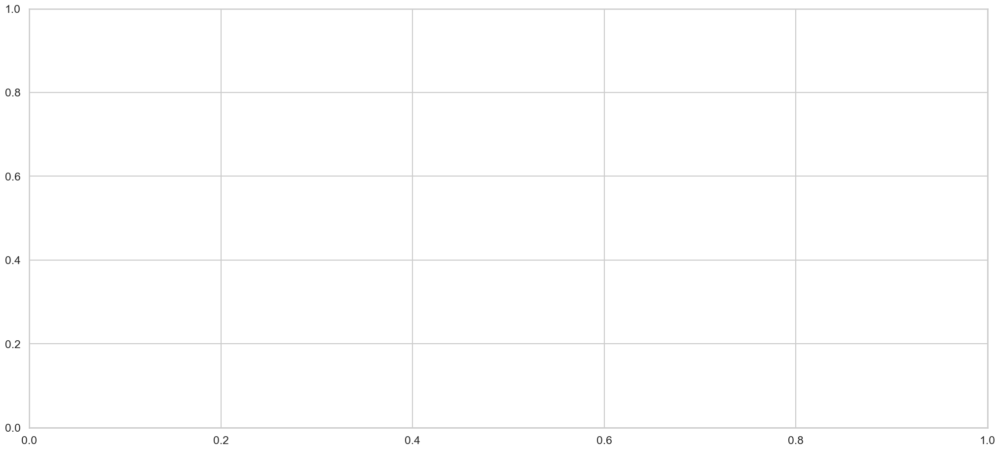

In [18]:
grouped_columns = []
cut_out = [("labeler_ids", "[4295349121, 4295342357, 4295354117]")]#, ("setting", "AL"), ("setting", "SSL"), ("setting", "NORMAL"), ("mod", "disagreement_diff")]#, ("overlap", 0), ("sample_equal", False)]#("setting", "AL"), ("setting", "SSL"), ("setting", "NORMAL"), ("mod", "disagreement_diff"), ("expert_predict", "target")]#, ("sample_equal", True), ("overlap", 100), 
#var_columns = ["labeled", "rounds", "init_size", "labels_per_round"]
var_columns = ["setting", "mod", "expert_predict", "overlap", "sample_equal", "labeler_ids", "init_size", "labels_per_round", "rounds"]#, "expert_predict"]

method = "verma"
metric_name = "classifier_accuracy"
#metric_name = "coverage"
step = "test"

sns.set_style("whitegrid")
sns.set_context("talk")

df_test_classifier_accuracy = cut_column_name(metricManager.get_metric_dataframe(method, step, metric_name))
df_grouped_metrics_classifier_accuracy, selected_runs_classifier_accuracy = get_runs_grouped_metric(df_runs.iloc[:], df_test_classifier_accuracy, grouped_columns, False, cut_out)

selected_runs_classifier_accuracy["labeler_ids"] = selected_runs_classifier_accuracy["labeler_ids"].apply(lambda x: str(x))

df_grouped_metrics_classifier_accuracy.columns = [str(name) for name in df_grouped_metrics_classifier_accuracy.columns]

df_classifier_accuracy, runs_df_classifier_accuracy, series_classifier_accuracy = plot_runs_hue_metric(selected_runs_classifier_accuracy, df_grouped_metrics_classifier_accuracy, var_columns, cut_out, y_text=f"{method}_{step}_{metric_name}", slice=None, plot=False)
#group_test = group_ttest(df)

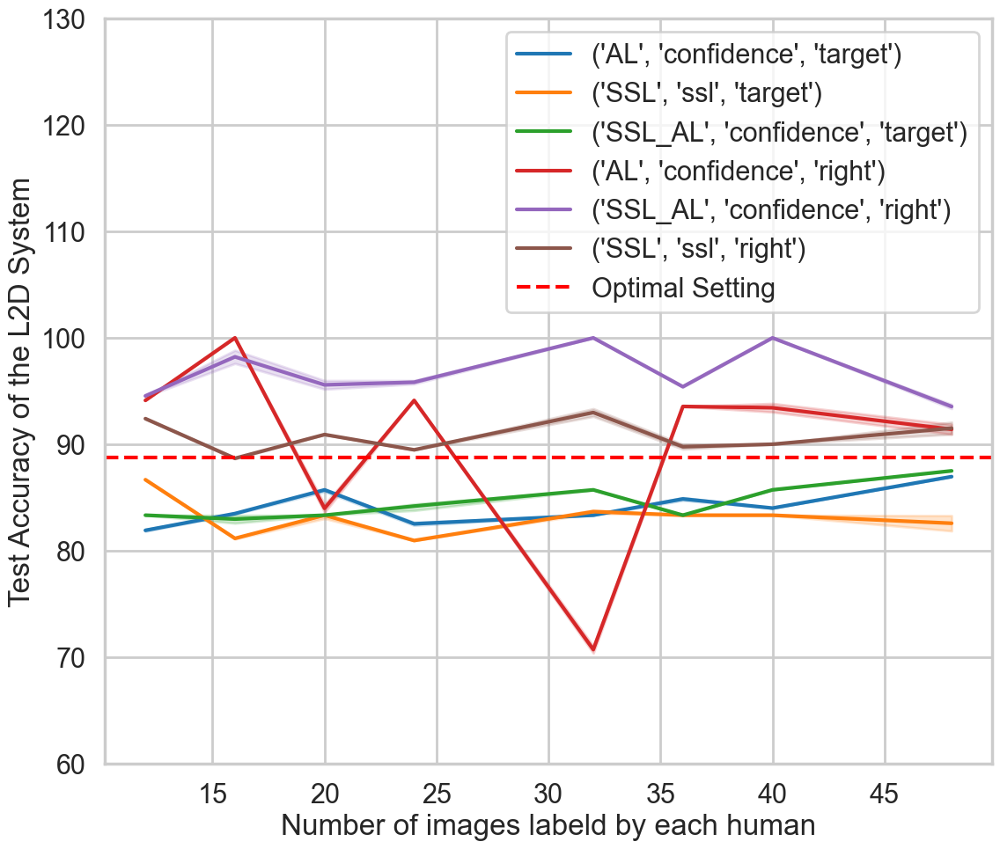

In [190]:
build_df = df_classifier_accuracy.copy()
#Set ids
#build_df = build_df[build_df["labeler_ids"] == "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] != "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295349121, 4295342357]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295342357, 4295354117]"]

dff = build_df[build_df["setting"] != "PERFECT"].copy().reset_index()
dfff = build_df[build_df["setting"] == "PERFECT"].reset_index()

#dff = dff[dff["expert_predict"] == "target"]
#dff = dff[dff["expert_predict"] == "right"]

#dff = dff[dff["overlap"] != 0]
#dff = dff[dff["sample_equal"] != False]

dff = dff[dff["mod"] != "disagreement_diff"]

dff = dff[dff["setting"] != "NORMAL"]
dff = dff[dff["setting"] != "SSL_AL_SSL"]
#dff = dff[dff["setting"] != "AL"]
#dff = dff[dff["setting"] != "SSL"]


dff["group"] = dff["group"].replace(runs_df_classifier_accuracy.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=(13, 11))
sns.set_context("poster")
#, "overlap", "sample_equal", "expert_predict", "mod"
#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
ln = sns.lineplot(x="group", y="value", hue=dff[["setting", "mod", "expert_predict"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=estimator, errorbar=
(lambda x: (np.median(x)-stats.sem(x), np.median(x)+stats.sem(x))))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))
ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")
#ax.axhline(90.1403561, ls='--', color="g")
#ax.axhline(87.5957923, ls='--', color="b")
ax.set(ylim=(60, 130))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test Accuracy of the L2D System")
plt.legend(loc='upper right')
#leg_texts = ["Semi-Supervised Learning with Active Learning, sample target randomly", "Semi-Supervised Learning with Active Learning, sample target equally"]
#for t, l in zip(ln.legend_.texts, leg_texts):
#    t.set_text(l)
plt.savefig("../../images/NIH/overall_clf_acc.png", bbox_inches="tight")

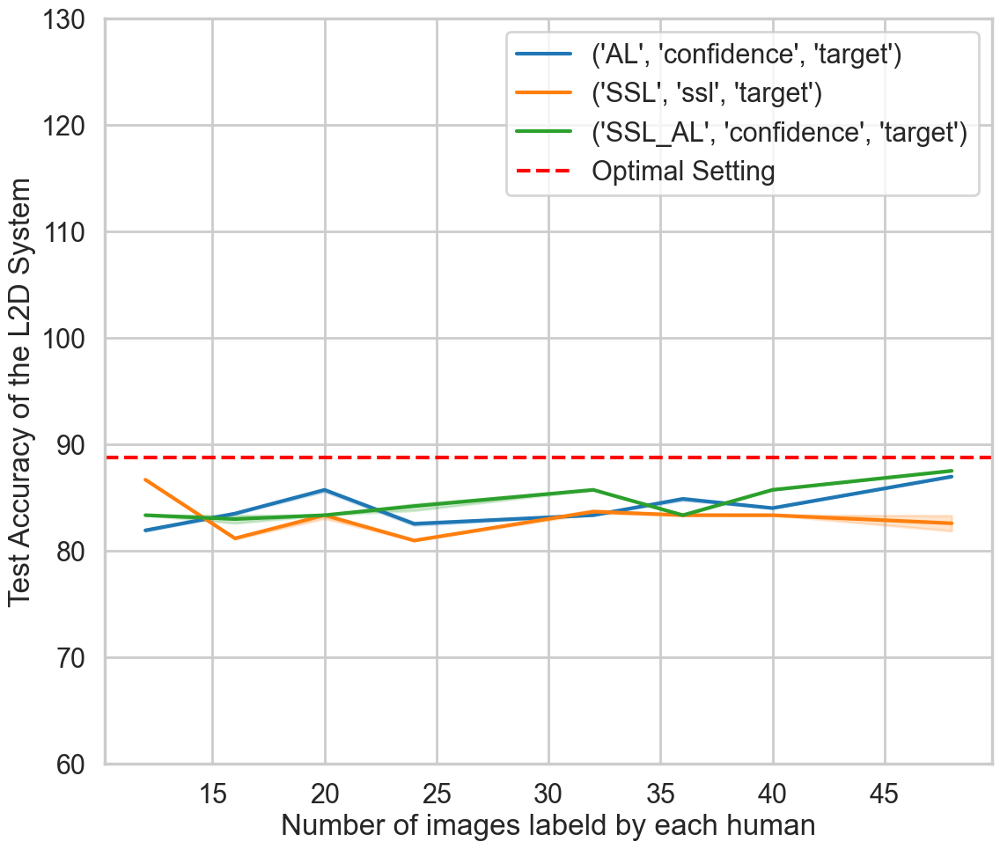

In [191]:
build_df = df_classifier_accuracy.copy()
#Set ids
#build_df = build_df[build_df["labeler_ids"] == "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] != "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295349121, 4295342357]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295342357, 4295354117]"]

dff = build_df[build_df["setting"] != "PERFECT"].copy().reset_index()
dfff = build_df[build_df["setting"] == "PERFECT"].reset_index()

dff = dff[dff["expert_predict"] == "target"]
#dff = dff[dff["expert_predict"] == "right"]

#dff = dff[dff["overlap"] != 0]
#dff = dff[dff["sample_equal"] != False]

dff = dff[dff["mod"] != "disagreement_diff"]

dff = dff[dff["setting"] != "NORMAL"]
dff = dff[dff["setting"] != "SSL_AL_SSL"]
#dff = dff[dff["setting"] != "AL"]
#dff = dff[dff["setting"] != "SSL"]


dff["group"] = dff["group"].replace(runs_df_classifier_accuracy.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=(13, 11))
sns.set_context("poster")
#, "overlap", "sample_equal", "expert_predict", "mod"
#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
ln = sns.lineplot(x="group", y="value", hue=dff[["setting", "mod", "expert_predict"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=estimator, errorbar=
(lambda x: (np.median(x)-stats.sem(x), np.median(x)+stats.sem(x))))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))
ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")
#ax.axhline(90.1403561, ls='--', color="g")
#ax.axhline(87.5957923, ls='--', color="b")
ax.set(ylim=(60, 130))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test Accuracy of the L2D System")
plt.legend(loc='upper right')
#leg_texts = ["Semi-Supervised Learning with Active Learning, sample target randomly", "Semi-Supervised Learning with Active Learning, sample target equally"]
#for t, l in zip(ln.legend_.texts, leg_texts):
#    t.set_text(l)
plt.savefig("../../images/NIH/overall_clf_acc_target.png", bbox_inches="tight")

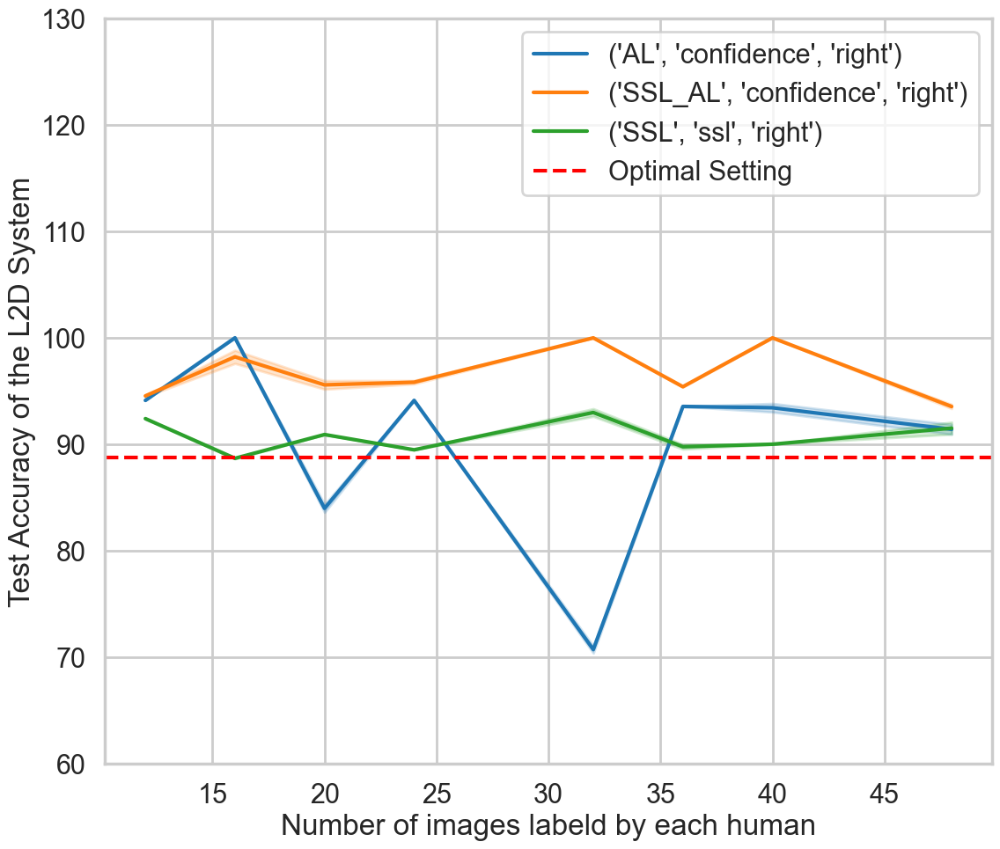

In [192]:
build_df = df_classifier_accuracy.copy()
#Set ids
#build_df = build_df[build_df["labeler_ids"] == "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] != "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295349121, 4295342357]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295342357, 4295354117]"]

dff = build_df[build_df["setting"] != "PERFECT"].copy().reset_index()
dfff = build_df[build_df["setting"] == "PERFECT"].reset_index()

#dff = dff[dff["expert_predict"] == "target"]
dff = dff[dff["expert_predict"] == "right"]

#dff = dff[dff["overlap"] != 0]
#dff = dff[dff["sample_equal"] != False]

dff = dff[dff["mod"] != "disagreement_diff"]

dff = dff[dff["setting"] != "NORMAL"]
dff = dff[dff["setting"] != "SSL_AL_SSL"]
#dff = dff[dff["setting"] != "AL"]
#dff = dff[dff["setting"] != "SSL"]


dff["group"] = dff["group"].replace(runs_df_classifier_accuracy.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=(13, 11))
sns.set_context("poster")
#, "overlap", "sample_equal", "expert_predict", "mod"
#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
ln = sns.lineplot(x="group", y="value", hue=dff[["setting", "mod", "expert_predict"]].apply(tuple, axis=1), hue_order=[("AL",), ("SSL",), ("SSL_AL",)], data=dff, err_style="band", markers=True, estimator=estimator, errorbar=
(lambda x: (np.median(x)-stats.sem(x), np.median(x)+stats.sem(x))))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))
ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")
#ax.axhline(90.1403561, ls='--', color="g")
#ax.axhline(87.5957923, ls='--', color="b")
ax.set(ylim=(60, 130))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test Accuracy of the L2D System")
plt.legend(loc='upper right')
#leg_texts = ["Semi-Supervised Learning with Active Learning, sample target randomly", "Semi-Supervised Learning with Active Learning, sample target equally"]
#for t, l in zip(ln.legend_.texts, leg_texts):
#    t.set_text(l)
plt.savefig("../../images/NIH/overall_clf_acc_right.png", bbox_inches="tight")

In [29]:
dff["value"].max()

99.99983606584252

,labeled
0,12
20,20
38,36
43,16
48,24
58,40
74,68
153,72
161,32
169,48


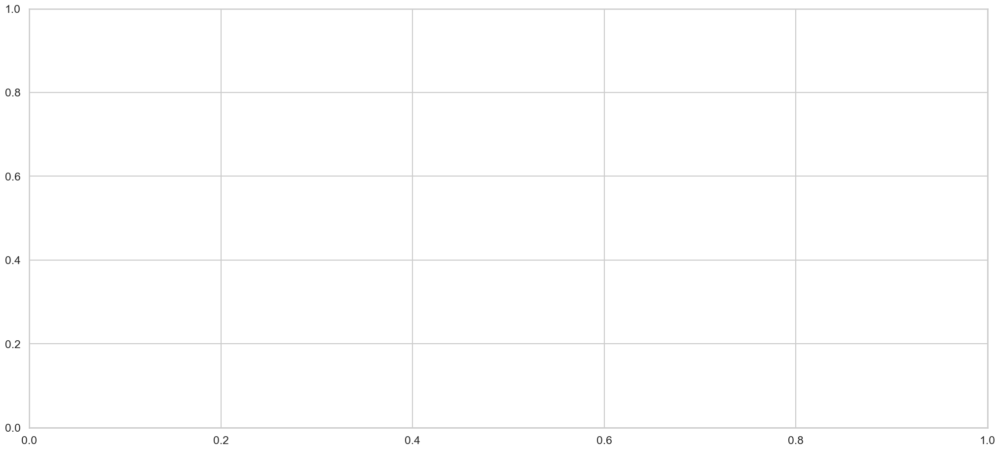

In [179]:
grouped_columns = []
cut_out = [("labeler_ids", "[4295349121, 4295342357, 4295354117]")]#, ("setting", "AL"), ("setting", "SSL"), ("setting", "NORMAL"), ("mod", "disagreement_diff")]#, ("overlap", 0), ("sample_equal", False)]#("setting", "AL"), ("setting", "SSL"), ("setting", "NORMAL"), ("mod", "disagreement_diff"), ("expert_predict", "target")]#, ("sample_equal", True), ("overlap", 100), 
#var_columns = ["labeled", "rounds", "init_size", "labels_per_round"]
var_columns = ["setting", "mod", "expert_predict", "overlap", "sample_equal", "labeler_ids", "init_size", "labels_per_round", "rounds"]#, "expert_predict"]

method = "verma"
metric_name = "expert_accuracy"
#metric_name = "coverage"
step = "test"

sns.set_style("whitegrid")
sns.set_context("talk")

df_test_expert_accuracy = cut_column_name(metricManager.get_metric_dataframe(method, step, metric_name))
df_grouped_metrics_expert_accuracy, selected_runs_expert_accuracy = get_runs_grouped_metric(df_runs.iloc[:], df_test_expert_accuracy, grouped_columns, False, cut_out)

selected_runs_expert_accuracy["labeler_ids"] = selected_runs_expert_accuracy["labeler_ids"].apply(lambda x: str(x))

df_grouped_metrics_expert_accuracy.columns = [str(name) for name in df_grouped_metrics_expert_accuracy.columns]

df_expert_accuracy, runs_df_expert_accuracy, series_expert_accuracy = plot_runs_hue_metric(selected_runs_expert_accuracy, df_grouped_metrics_expert_accuracy, var_columns, cut_out, y_text=f"{method}_{step}_{metric_name}", slice=None, plot=False)
#group_test = group_ttest(df)

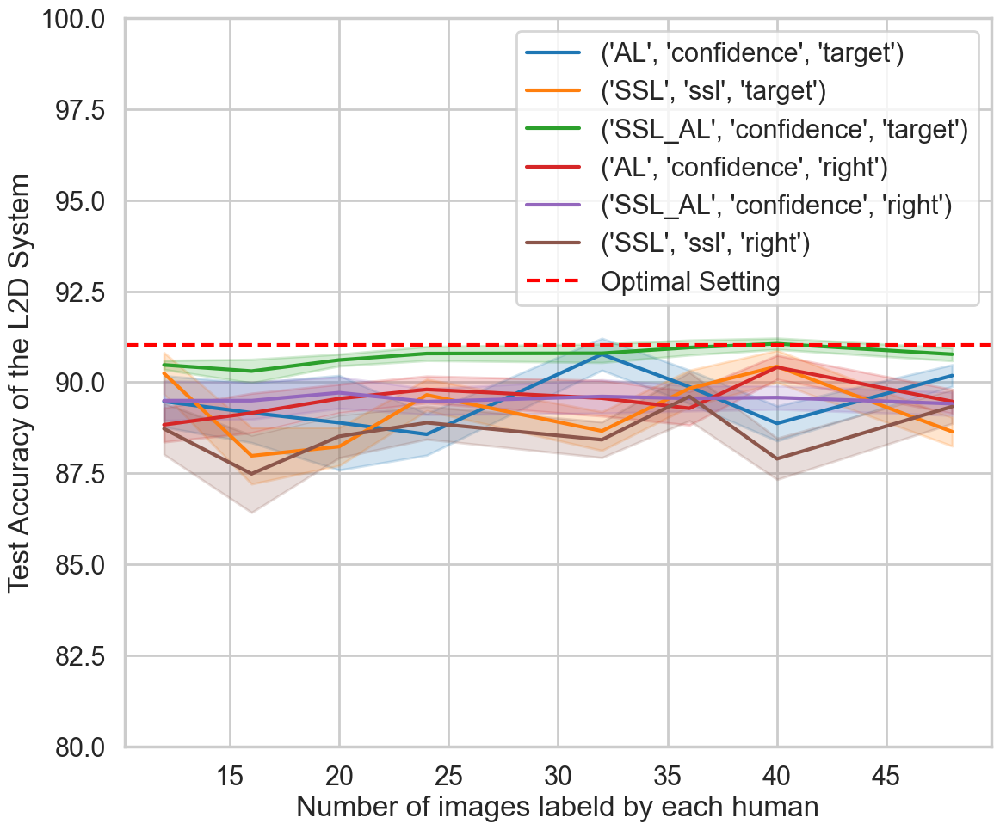

In [182]:
build_df = df_expert_accuracy.copy()
#Set ids
#build_df = build_df[build_df["labeler_ids"] == "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] != "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295349121, 4295342357]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295342357, 4295354117]"]

dff = build_df[build_df["setting"] != "PERFECT"].copy().reset_index()
dfff = build_df[build_df["setting"] == "PERFECT"].reset_index()

#dff = dff[dff["expert_predict"] == "target"]
#dff = dff[dff["expert_predict"] == "right"]

#dff = dff[dff["overlap"] != 0]
#dff = dff[dff["sample_equal"] != False]

dff = dff[dff["mod"] != "disagreement_diff"]

dff = dff[dff["setting"] != "NORMAL"]
dff = dff[dff["setting"] != "SSL_AL_SSL"]
#dff = dff[dff["setting"] != "AL"]
#dff = dff[dff["setting"] != "SSL"]


dff["group"] = dff["group"].replace(runs_df_classifier_accuracy.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=(13, 11))
sns.set_context("poster")
#, "overlap", "sample_equal", "expert_predict", "mod"
#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
ln = sns.lineplot(x="group", y="value", hue=dff[["setting", "mod", "expert_predict"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))
ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")
#ax.axhline(90.1403561, ls='--', color="g")
#ax.axhline(87.5957923, ls='--', color="b")
ax.set(ylim=(80, 100))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test Accuracy of the L2D System")
plt.legend(loc='upper right')
#leg_texts = ["Semi-Supervised Learning with Active Learning, sample target randomly", "Semi-Supervised Learning with Active Learning, sample target equally"]
#for t, l in zip(ln.legend_.texts, leg_texts):
#    t.set_text(l)
#plt.savefig("../../images/NIH/4996/parameters_target.png", bbox_inches="tight")

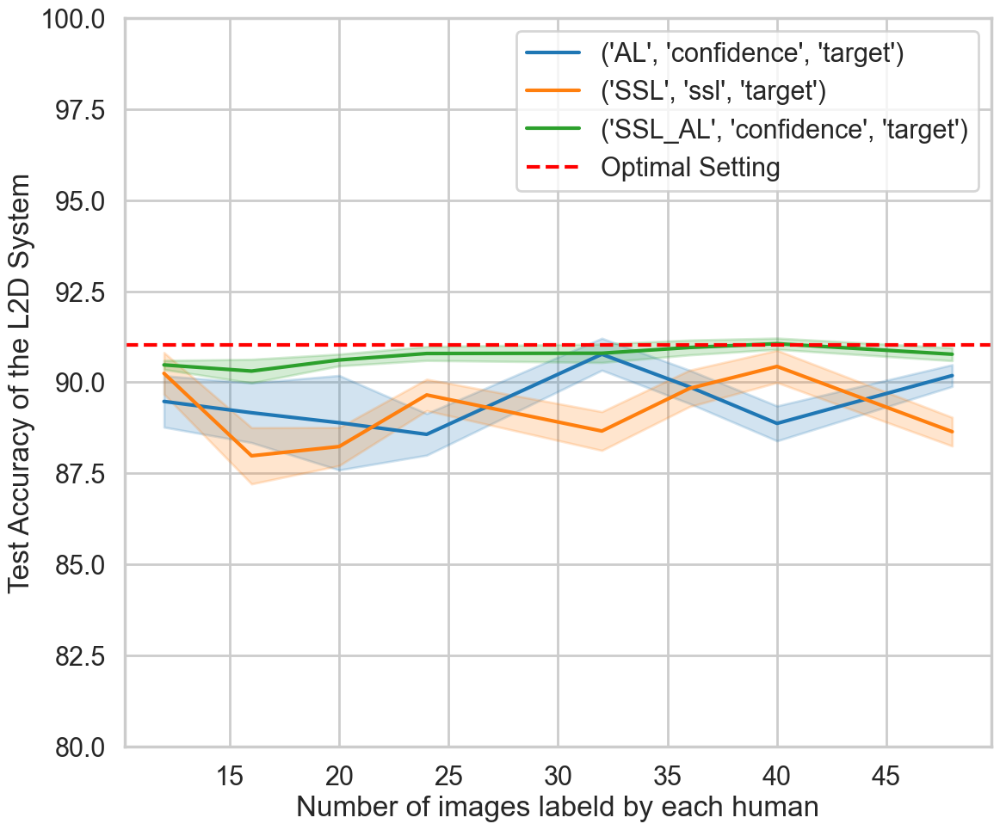

In [195]:
build_df = df_expert_accuracy.copy()
#Set ids
#build_df = build_df[build_df["labeler_ids"] == "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] != "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295349121, 4295342357]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295342357, 4295354117]"]

dff = build_df[build_df["setting"] != "PERFECT"].copy().reset_index()
dfff = build_df[build_df["setting"] == "PERFECT"].reset_index()

dff = dff[dff["expert_predict"] == "target"]
#dff = dff[dff["expert_predict"] == "right"]

#dff = dff[dff["overlap"] != 0]
#dff = dff[dff["sample_equal"] != False]

dff = dff[dff["mod"] != "disagreement_diff"]

dff = dff[dff["setting"] != "NORMAL"]
dff = dff[dff["setting"] != "SSL_AL_SSL"]
#dff = dff[dff["setting"] != "AL"]
#dff = dff[dff["setting"] != "SSL"]


dff["group"] = dff["group"].replace(runs_df_classifier_accuracy.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=(13, 11))
sns.set_context("poster")
#, "overlap", "sample_equal", "expert_predict", "mod"
#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
ln = sns.lineplot(x="group", y="value", hue=dff[["setting", "mod", "expert_predict"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))
ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")
#ax.axhline(90.1403561, ls='--', color="g")
#ax.axhline(87.5957923, ls='--', color="b")
ax.set(ylim=(80, 100))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test Accuracy of the L2D System")
plt.legend(loc='upper right')
#leg_texts = ["Semi-Supervised Learning with Active Learning, sample target randomly", "Semi-Supervised Learning with Active Learning, sample target equally"]
#for t, l in zip(ln.legend_.texts, leg_texts):
#    t.set_text(l)
plt.savefig("../../images/NIH/overall_expert_acc_target.png", bbox_inches="tight")

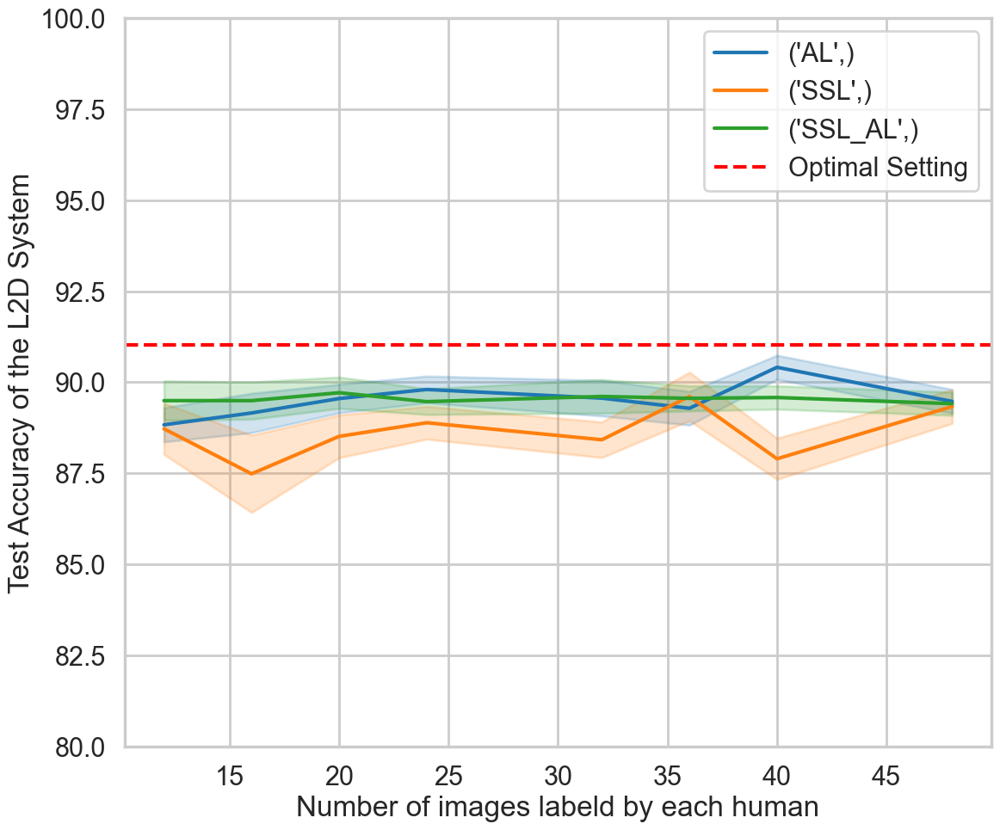

In [198]:
build_df = df_expert_accuracy.copy()
#Set ids
#build_df = build_df[build_df["labeler_ids"] == "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] != "[4323195249, 4295232296]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295349121, 4295342357]"]
#build_df = build_df[build_df["labeler_ids"] != "[4295342357, 4295354117]"]

dff = build_df[build_df["setting"] != "PERFECT"].copy().reset_index()
dfff = build_df[build_df["setting"] == "PERFECT"].reset_index()

#dff = dff[dff["expert_predict"] == "target"]
dff = dff[dff["expert_predict"] == "right"]

#dff = dff[dff["overlap"] != 0]
#dff = dff[dff["sample_equal"] != False]

dff = dff[dff["mod"] != "disagreement_diff"]

dff = dff[dff["setting"] != "NORMAL"]
dff = dff[dff["setting"] != "SSL_AL_SSL"]
#dff = dff[dff["setting"] != "AL"]
#dff = dff[dff["setting"] != "SSL"]


dff["group"] = dff["group"].replace(runs_df_classifier_accuracy.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=(13, 11))
sns.set_context("poster")
#, "overlap", "sample_equal", "expert_predict", "mod"
#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
ln = sns.lineplot(x="group", y="value", hue=dff[["setting"]].apply(tuple, axis=1), hue_order=[("AL",), ("SSL",), ("SSL_AL",)], data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))
ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")
#ax.axhline(90.1403561, ls='--', color="g")
#ax.axhline(87.5957923, ls='--', color="b")
ax.set(ylim=(80, 100))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test Accuracy of the L2D System")
plt.legend(loc='upper right')
#leg_texts = ["Semi-Supervised Learning with Active Learning, sample target randomly", "Semi-Supervised Learning with Active Learning, sample target equally"]
#for t, l in zip(ln.legend_.texts, leg_texts):
#    t.set_text(l)
plt.savefig("../../images/NIH/overall_expert_acc_rigth.png", bbox_inches="tight")

## Playground

[(80.0, 100.0)]

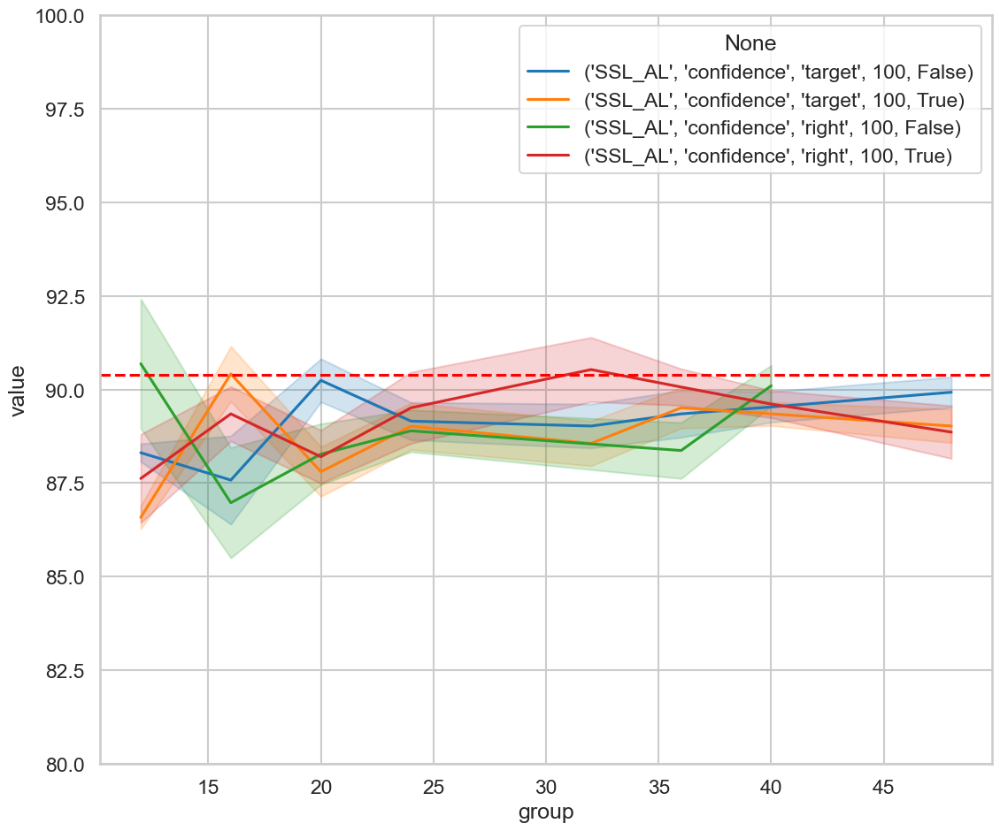

In [25]:
dff = df[df["setting"] != "PERFECT"].copy().reset_index()
dff = df[df["setting"] == "SSL_AL"].copy().reset_index()
#dff = dff[dff["expert_predict"] == "right"]
dff = dff[dff["overlap"] != 0]
#dff = dff[dff["sample_equal"] != False]
dff = dff[dff["mod"] != "disagreement_diff"]

dfff = df[df["setting"] == "PERFECT"].reset_index()
dff["group"] = dff["group"].replace(runs_df.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=(13, 11))
sns.set_context("talk")
#, "overlap", "sample_equal", "expert_predict", "mod"
#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
sns.lineplot(x="group", y="value", hue=dff[["setting", "mod", "expert_predict", "overlap", "sample_equal"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))
ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")
#ax.axhline(90.1403561, ls='--', color="g")
#ax.axhline(87.5957923, ls='--', color="b")
ax.set(ylim=(80, 100))

[(80.0, 100.0)]

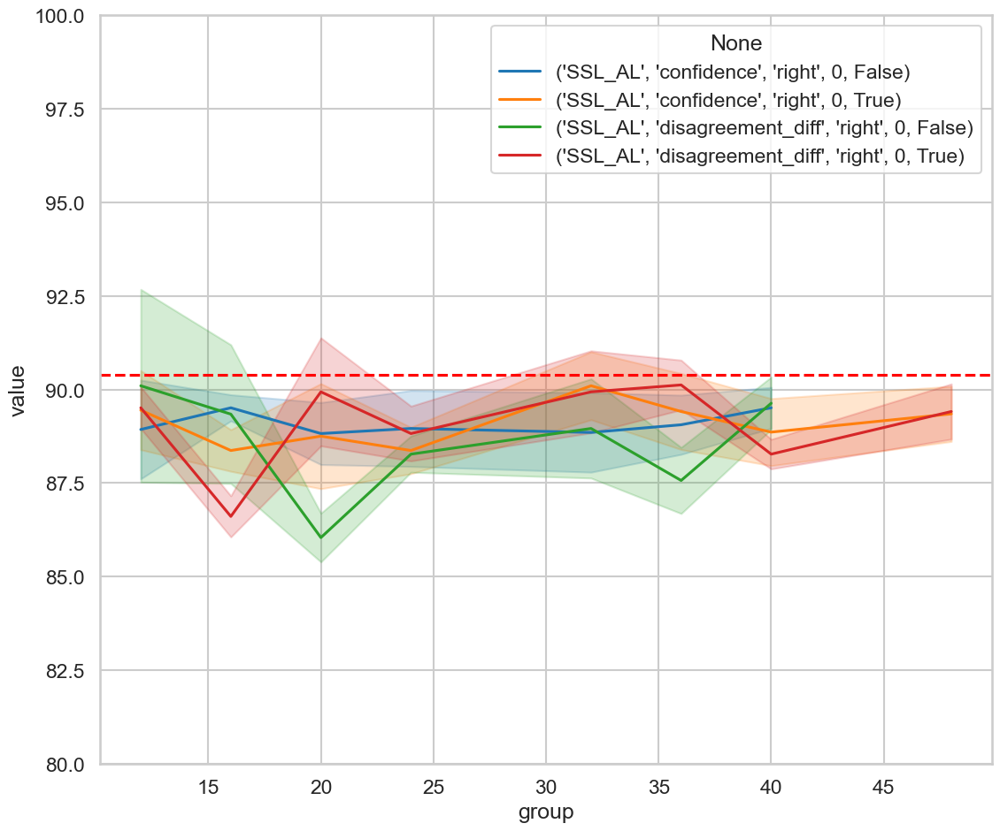

In [26]:
dff = df[df["setting"] != "PERFECT"].copy().reset_index()
dff = df[df["setting"] == "SSL_AL"].copy().reset_index()
dff = dff[dff["expert_predict"] == "right"]
dff = dff[dff["overlap"] != 100]
#dff = dff[dff["sample_equal"] != False]
#dff = dff[dff["mod"] != "disagreement_diff"]

dfff = df[df["setting"] == "PERFECT"].reset_index()
dff["group"] = dff["group"].replace(runs_df.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=(13, 11))
sns.set_context("talk")
#, "overlap", "sample_equal", "expert_predict", "mod"
#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
sns.lineplot(x="group", y="value", hue=dff[["setting", "mod", "expert_predict", "overlap", "sample_equal"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))
ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")
#ax.axhline(90.1403561, ls='--', color="g")
#ax.axhline(87.5957923, ls='--', color="b")
ax.set(ylim=(80, 100))

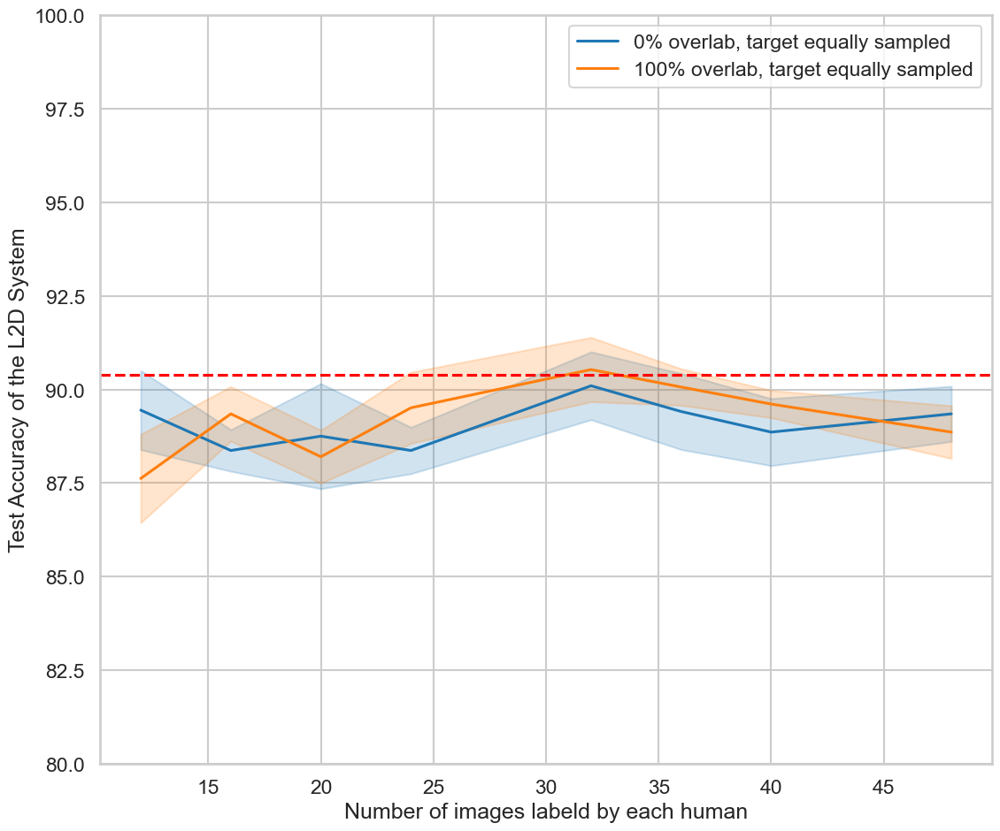

In [35]:
dff = df[df["setting"] != "PERFECT"].copy().reset_index()
dff = df[df["setting"] == "SSL_AL"].copy().reset_index()
dff = dff[dff["expert_predict"] == "right"]
#dff = dff[dff["overlap"] != 0]
dff = dff[dff["sample_equal"] != False]
dff = dff[dff["mod"] != "disagreement_diff"]

dfff = df[df["setting"] == "PERFECT"].reset_index()
dff["group"] = dff["group"].replace(runs_df.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=(13, 11))
sns.set_context("talk")
#, "overlap", "sample_equal", "expert_predict", "mod"
#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
ln = sns.lineplot(x="group", y="value", hue=dff[["setting", "mod", "expert_predict", "overlap", "sample_equal"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))
ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")
#ax.axhline(90.1403561, ls='--', color="g")
#ax.axhline(87.5957923, ls='--', color="b")
ax.set(ylim=(80, 100))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test Accuracy of the L2D System")
plt.legend(loc='upper right')
leg_texts = ["0% overlab, target equally sampled", "100% overlab, target equally sampled"]
for t, l in zip(ln.legend_.texts, leg_texts):
    t.set_text(l)

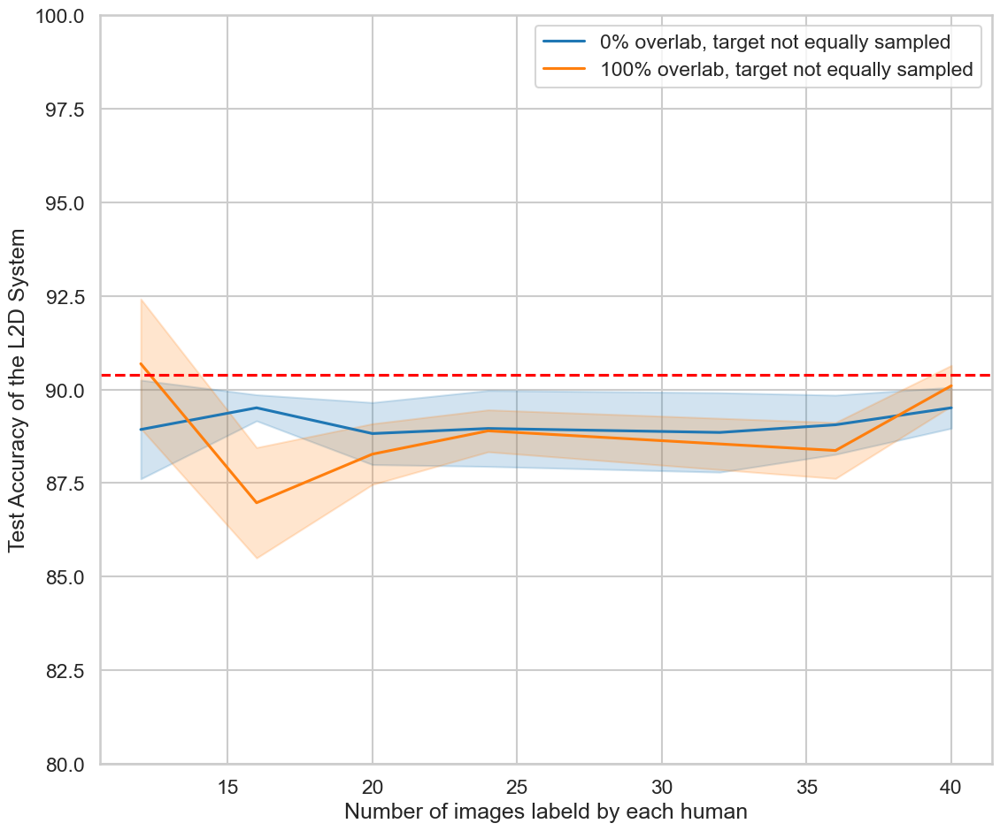

In [38]:
dff = df[df["setting"] != "PERFECT"].copy().reset_index()
dff = df[df["setting"] == "SSL_AL"].copy().reset_index()
dff = dff[dff["expert_predict"] == "right"]
#dff = dff[dff["overlap"] != 0]
dff = dff[dff["sample_equal"] != True]
dff = dff[dff["mod"] != "disagreement_diff"]

dfff = df[df["setting"] == "PERFECT"].reset_index()
dff["group"] = dff["group"].replace(runs_df.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=(13, 11))
sns.set_context("talk")
#, "overlap", "sample_equal", "expert_predict", "mod"
#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
ln = sns.lineplot(x="group", y="value", hue=dff[["setting", "mod", "expert_predict", "overlap", "sample_equal"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))
ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")
#ax.axhline(90.1403561, ls='--', color="g")
#ax.axhline(87.5957923, ls='--', color="b")
ax.set(ylim=(80, 100))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test Accuracy of the L2D System")
plt.legend(loc='upper right')
leg_texts = ["0% overlab, target not equally sampled", "100% overlab, target not equally sampled"]
for t, l in zip(ln.legend_.texts, leg_texts):
    t.set_text(l)

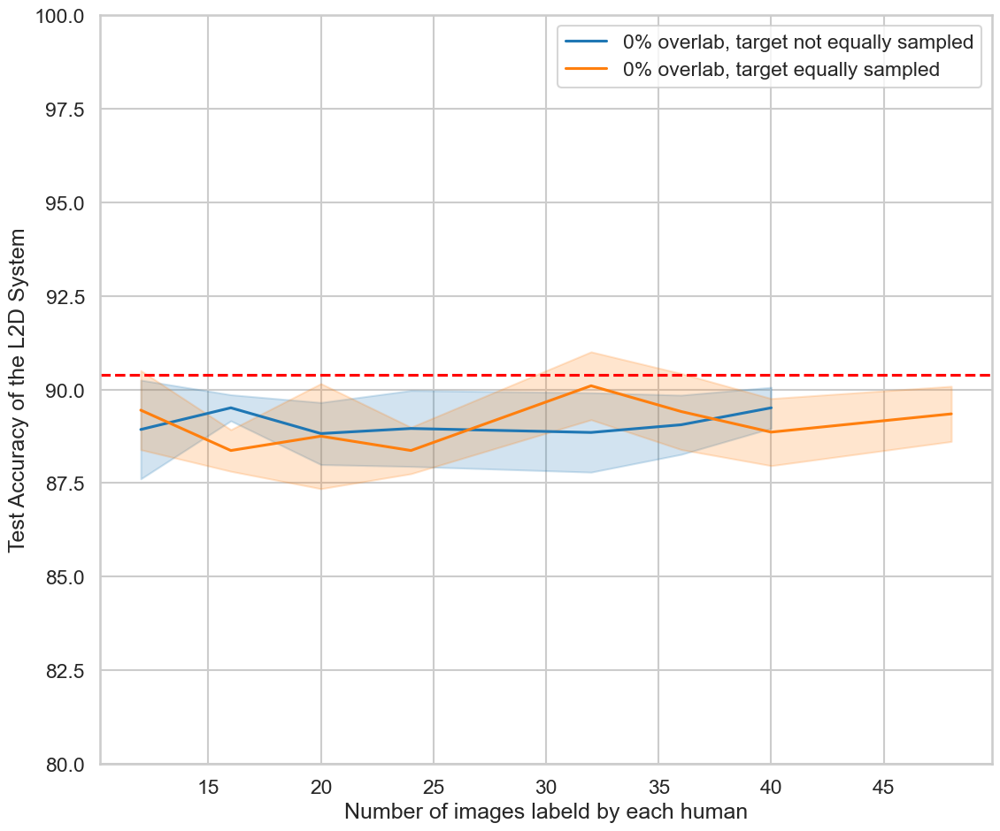

In [47]:
dff = df[df["setting"] != "PERFECT"].copy().reset_index()
dff = df[df["setting"] == "SSL_AL"].copy().reset_index()
dff = dff[dff["expert_predict"] == "right"]
dff = dff[dff["overlap"] == 0]
#dff = dff[dff["sample_equal"] == True]
dff = dff[dff["mod"] != "disagreement_diff"]

dfff = df[df["setting"] == "PERFECT"].reset_index()
dff["group"] = dff["group"].replace(runs_df.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=(13, 11))
sns.set_context("talk")
#, "overlap", "sample_equal", "expert_predict", "mod"
#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
ln = sns.lineplot(x="group", y="value", hue=dff[["setting", "mod", "expert_predict", "overlap", "sample_equal"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))
ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")
#ax.axhline(90.1403561, ls='--', color="g")
#ax.axhline(87.5957923, ls='--', color="b")
ax.set(ylim=(80, 100))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test Accuracy of the L2D System")
plt.legend(loc='upper right')
leg_texts = ["0% overlab, target not equally sampled", "0% overlab, target equally sampled"]
for t, l in zip(ln.legend_.texts, leg_texts):
    t.set_text(l)

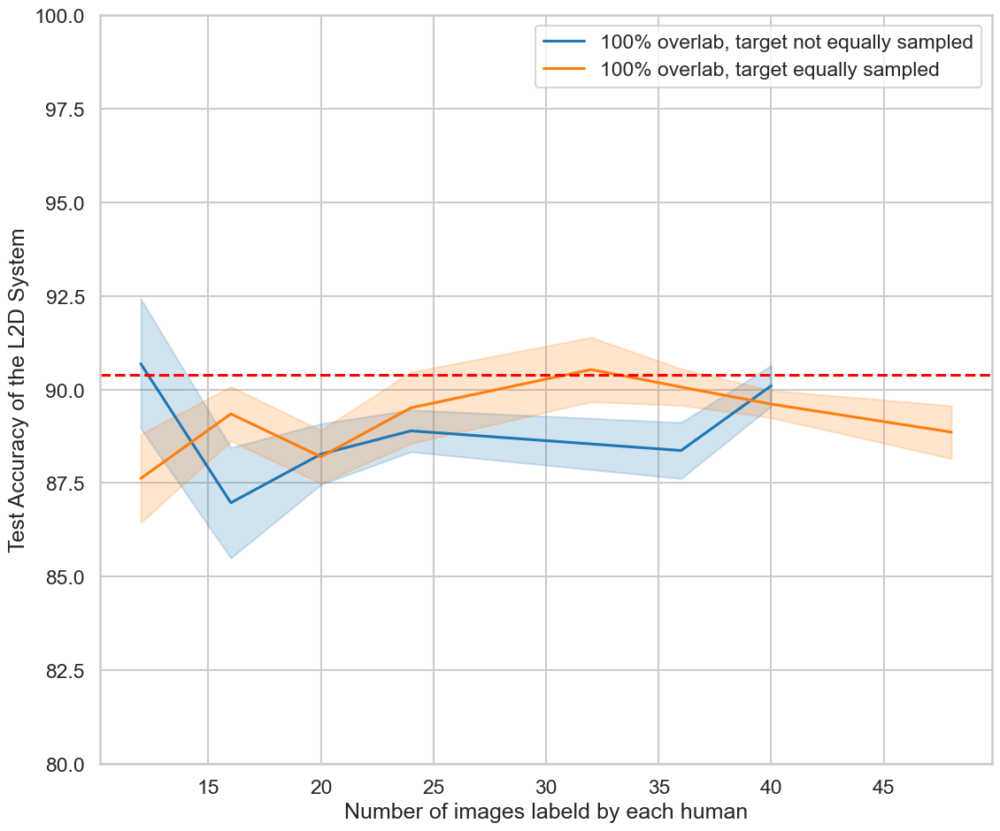

In [49]:
dff = df[df["setting"] != "PERFECT"].copy().reset_index()
dff = df[df["setting"] == "SSL_AL"].copy().reset_index()
dff = dff[dff["expert_predict"] == "right"]
dff = dff[dff["overlap"] == 100]
#dff = dff[dff["sample_equal"] != False]
dff = dff[dff["mod"] != "disagreement_diff"]

dfff = df[df["setting"] == "PERFECT"].reset_index()
dff["group"] = dff["group"].replace(runs_df.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=(13, 11))
sns.set_context("talk")
#, "overlap", "sample_equal", "expert_predict", "mod"
#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
ln = sns.lineplot(x="group", y="value", hue=dff[["setting", "mod", "expert_predict", "sample_equal", "overlap"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))
ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")
#ax.axhline(90.1403561, ls='--', color="g")
#ax.axhline(87.5957923, ls='--', color="b")
ax.set(ylim=(80, 100))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test Accuracy of the L2D System")
plt.legend(loc='upper right')
leg_texts = ["100% overlab, target not equally sampled", "100% overlab, target equally sampled"]
for t, l in zip(ln.legend_.texts, leg_texts):
    t.set_text(l)

In [58]:
dfff["group"].unique()

array([  0, 193], dtype=int64)

In [17]:
dff.to_excel("bac.xlsx")

In [ ]:
grouped_columns = ["sample_equal", "overlap", "init_size", "labels_per_round", "rounds"]
cut_out = [("mod", "disagreement"), ("labeler_ids", "[4295342357, 4295354117]"), ("labeler_ids", "[4323195249, 4295232296]")]
#var_columns = ["labeled", "rounds", "init_size", "labels_per_round"]
var_columns = ["setting", "mod", "labeler_ids"]

method = "verma"
metric_name = "system_accuracy"
step = "test"

df_test = cut_column_name(metricManager.get_metric_dataframe(method, step, metric_name))
df_grouped_metrics, selected_runs = get_runs_grouped_metric(df_runs.iloc[:], df_test, grouped_columns, False, cut_out)

selected_runs["labeler_ids"] = selected_runs["labeler_ids"].apply(lambda x: str(x))

df_grouped_metrics.columns = [str(name) for name in df_grouped_metrics.columns]

df, runs_df, series = plot_runs_hue_metric(selected_runs, df_grouped_metrics, var_columns, cut_out, y_text=f"{method}_{step}_{metric_name}", slice=(0, 7))
group_test = group_ttest(df)

In [ ]:
dff = df[df["group"] != 0].reset_index()
dfff = df[df["group"] == 0].reset_index()
dff["group"] = dff["group"].replace(runs_df.to_dict()["labeled"])
f, ax = plt.subplots(figsize=(25, 11))
#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
sns.lineplot(x="group", y="value", hue="setting", data=dff, err_style="band", markers=True, estimator=np.mean, errorbar=("sd", 0.5))
ax.axhline(dfff["value"].mean(), ls='--')
ax.set(ylim=(80, 95))

In [ ]:
grouped_columns = ["sample_equal", "overlap", "init_size", "labels_per_round", "rounds"]
cut_out = [("mod", "disagreement")]
#var_columns = ["labeled", "rounds", "init_size", "labels_per_round"]
var_columns = ["setting", "mod", "labeler_ids"]

method = "verma"
metric_name = "system_accuracy"
step = "test"

df_test = cut_column_name(metricManager.get_metric_dataframe(method, step, metric_name))
df_grouped_metrics, selected_runs = get_runs_grouped_metric(df_runs.iloc[:], df_test, grouped_columns, False, cut_out)

selected_runs["labeler_ids"] = selected_runs["labeler_ids"].apply(lambda x: str(x))

df_grouped_metrics.columns = [str(name) for name in df_grouped_metrics.columns]

df, runs_df, series = plot_runs_hue_metric(selected_runs, df_grouped_metrics, var_columns, cut_out, y_text=f"{method}_{step}_{metric_name}", slice=(0, 7))
group_test = group_ttest(df)

In [ ]:
dff = df[df["group"] != 0].reset_index()
dfff = df[df["group"] == 0].reset_index()
dff["group"] = dff["group"].replace(runs_df.to_dict()["labeled"])
dff["setting"] = dff.apply(lambda x: f'{x["setting"]}_{x["labeler_ids"]}', axis=1)
f, ax = plt.subplots(figsize=(25, 11))
#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
#sns.lineplot(x="group", y="value", hue="setting", data=dff, err_style="band", markers=True, estimator=np.mean, errorbar=("sd", 0.5))
sns.lineplot(x="group", y="value", hue="setting", data=dff, markers=True)
ax.axhline(dfff["value"].mean(), ls='--')
ax.set(ylim=(80, 95))

In [ ]:
grouped_columns = ["init_size", "labels_per_round", "rounds"]
cut_out = [("mod", "disagreement"), ("mod", "disagreement_diff"),
           ("labeler_ids", "[4295349121, 4295342357]"), ("labeler_ids", "[4323195249, 4295232296]"), 
           ("setting", "AL"), ("setting", "SSL"), ("setting", "SSL_AL_SSL"), ("setting", "NORMAL"),]
#var_columns = ["labeled", "rounds", "init_size", "labels_per_round"]
var_columns = ["setting", "mod", "sample_equal", "overlap"]

method = "verma"
metric_name = "system_accuracy"
step = "test"

df_test = cut_column_name(metricManager.get_metric_dataframe(method, step, metric_name))
df_grouped_metrics, selected_runs = get_runs_grouped_metric(df_runs.iloc[:], df_test, grouped_columns, False, cut_out)

selected_runs["labeler_ids"] = selected_runs["labeler_ids"].apply(lambda x: str(x))

df_grouped_metrics.columns = [str(name) for name in df_grouped_metrics.columns]

df, runs_df, series = plot_runs_hue_metric(selected_runs, df_grouped_metrics, var_columns, cut_out, y_text=f"{method}_{step}_{metric_name}", slice=(0, 7))
group_test = group_ttest(df)

In [ ]:
grouped_columns = ["sample_equal", "overlap", "init_size", "labels_per_round", "rounds", "labeler_ids"]
#cut_out = [("expert_predict", "right"), ("mod", "disagreement")]
#var_columns = ["labeled", "rounds", "init_size", "labels_per_round"]
var_columns = ["setting", "mod"]

method = "verma"
metric_name = "system_accuracy"
step = "test"

df_test = cut_column_name(metricManager_cifar.get_metric_dataframe(method, step, metric_name))
df_grouped_metrics, selected_runs = get_runs_grouped_metric(df_runs_cifar.iloc[:], df_test, grouped_columns, False, cut_out)

#selected_runs["labeler_ids"] = selected_runs["labeler_ids"].apply(lambda x: str(x))

df_grouped_metrics.columns = [str(name) for name in df_grouped_metrics.columns]

df, runs_df, series = plot_runs_hue_metric(selected_runs, df_grouped_metrics, var_columns, cut_out, y_text=f"{method}_{step}_{metric_name}", slice=None)
group_test = group_ttest(df)

# Analysis

In [ ]:
metricManager.get_l2d_dataframe("verma", "val").columns

In [ ]:
metricManager.get_l2d_dataframe("hemmer", "val").columns

In [ ]:
exclude = [("expert_predict", "right")]
#exclude = None

df_accuracy = metricManager.get_metrics_dataframe_cut("verma", "test", "system_accuracy", exclude)
f, ax = plt.subplots(figsize=(70, 11))
ax.set(xlabel='Run', ylabel='Val System Accuracy')
box = sns.boxplot(df_accuracy)
plt.show()
box.figure.savefig("all_runs.png", bbox_inches="tight")

df_ttests = pd.DataFrame(check_all_ttest(df_accuracy))
# Draw a heatmap with the numeric values in each cell
f, ax = plt.subplots(figsize=(25, 11))
sns.heatmap(df_ttests, annot=True, linewidths=.5, ax=ax)

df_runs.loc[[int(el) for el in df_accuracy.columns]]

In [ ]:
import matplotlib.ticker as ticker

def row_to_name(row):
    result = row["setting"] + "_"
    row = row.drop("setting")
    for col in row:
        result += str(col) + "_"
    return result[:-1]

In [ ]:
df_verma = df.copy()
df_ver = df_verma.melt(var_name='run')
df_ver["method"] = ["verma" for i in range(len(df_verma.melt()))]
df_ver

In [ ]:
df_hemmer = df.copy()
df_hem = df_hemmer.melt(var_name='run')
df_hem["method"] = ["hemmer" for i in range(len(df_hemmer.melt()))]
df_hem

In [ ]:
df = pd.concat([df_ver, df_hem])

sns.set_style("whitegrid")
sns.set_context("poster")
f, ax = plt.subplots(figsize=(25, 9))
box_plot = sns.boxplot(df, x="run", y="value", hue="method")
#box_plot.tick_params(labelsize=5)

labels = [row_to_name(selected_runs.loc[x]) for x in selected_runs.index]
labels = list(map(lambda x: x.replace('NORMAL', 'Supervised'), labels))
ax.set_xticks(ax.get_xticks(), labels)
ax.set(xlabel='Group', ylabel=f"{method}_{step}_{metric_name}")

#plt.axhline(df[0].median(), color='r') # horizontal

#for tick in ax.xaxis.get_major_ticks()[1::2]:
    #tick.set_pad(35)

plt.xticks(rotation=45)
box_plot.figure.savefig("all_runs_grouped_cutRightDisagreementdiff.png", bbox_inches='tight')
plt.show()

In [ ]:
var_columns = ["sample_equal", "overlap", "rounds", "init_size", "labels_per_round", "mod"]
cut_out = [("setting", "SSL_AL_SSL"), ("setting", "NORMAL")]

method = "verma"
metric_name = "system_accuracy"
step = "test"

df_test = cut_column_name(metricManager.get_metric_dataframe(method, step, metric_name))
df, selected_runs = get_runs_grouped_metric(df_runs.iloc[:], df_test, var_columns, False, cut_out)


sns.set_style("whitegrid")
sns.set_context("poster")
f, ax = plt.subplots(figsize=(22, 9))
box_plot = sns.boxplot(df)
#box_plot.tick_params(labelsize=5)

labels = [row_to_name(selected_runs.loc[x]) for x in selected_runs.index]
labels = list(map(lambda x: x.replace('NORMAL', 'Supervised'), labels))
ax.set_xticks(ax.get_xticks(), labels)
#ax.set(xlabel='Training method', ylabel=f"{method}_{step}_{metric_name}")
ax.set(xlabel='Training method', ylabel=f"System Accuracy")

plt.axhline(df[0].median(), color='r') # horizontal

#for tick in ax.xaxis.get_major_ticks()[1::2]:
    #tick.set_pad(35)

plt.xticks(rotation=45)
box_plot.figure.savefig("all_runs_grouped_cutRightDisagreementdiff.svg", bbox_inches='tight', format="svg")
plt.show()
#

m, test_plot = check_all_ttest(df, plot=True)
test_plot.get_figure().savefig("Images/ttest_all_runs_grouped_cutRightDisagreementDisagreementdiff.png", bbox_inches="tight")

selected_runs.head(70)

In [ ]:
var_columns = ["sample_equal", "overlap", "cost", "labeled"]

cut_out = [("expert_predict", "right")]

df_test = cut_column_name(metricManager.get_metric_dataframe("verma", "val", "system_accuracy"))
df, runs_df = get_runs_hue_metric(df_runs.iloc[:], df_test, var_columns, cut_out)
group_test = group_ttest(df)

In [ ]:
var_columns = ["sample_equal", "overlap"]
cut_out = [("expert_predict", "right"), ("setting", "AL"), ("setting", "NORMAL"), ("mod", "disagreement"), ("setting", "SSL"), ("setting", "SSL_AL_SSL"), ("mod", "disagreement_diff")]

method = "verma"
metric_name = "system_accuracy"
step = "test"

df_test = cut_column_name(metricManager.get_metric_dataframe(method, step, metric_name))
df, runs_df, series = plot_runs_hue_metric(df_runs.iloc[:], df_test, var_columns, cut_out, y_text=f"{method}_{step}_{metric_name}", sorted_columns=["labeled"])
group_test = group_ttest(df)

In [ ]:
def get_index_from_tuple(tuple, name):
    for idx, element in enumerate(tuple):
        if name in element:
            return idx
    return -1

get_index_from_tuple(li[0], "labeled")

In [ ]:
sorted_names = ["labeled", "init_size", "overlap"]
sorted_by_second = sorted(li, key=lambda tup: tuple([tup[idx] for idx in [get_index_from_tuple(tup, name) for name in sorted_names]]))
ser = pd.Series(sorted_by_second)
ser.head()

def get_index_from_tuple(tuple, name):
    for idx, element in enumerate(tuple):
        if name in element:
            return idx
    return -1

In [ ]:
def plot_runs_hue_metric(df_runs, df_metrics, var_columns, unwanted_tuples=None, y_text="value", sorted_columns=None, size=(15, 8)):
    df, runs_df = get_runs_hue_metric(df_runs.iloc[:], df_metrics, var_columns, unwanted_tuples)

    #f, ax = plt.subplots(figsize=size)
    f, ax = plt.subplots(1, 2, figsize=size, gridspec_kw=dict(width_ratios=[1, 9]))

    df_perfect = df[df["group"] == 0]
    df = df[df["group"] != 0]

    #f = plt.figure()

    #ax = f.add_subplot(2, 2, 1)

    display(HTML(runs_df.to_html()))

    ax[0].set(ylim=(70, 97))
    ax[1].set(ylim=(70, 97))

    #lis = sorted(df[var_columns].apply(tuple, axis=1), key=lambda tup: tup[0])
    lis = df[var_columns].apply(tuple, axis=1)
    sort = sorted(list(lis.unique()), key=lambda tup: tuple([tup[idx] for idx in [get_index_from_tuple(var_columns, name) for name in var_columns]]))

    g = sns.boxplot(df_perfect, y="value", x="group", ax=ax[0])
    g = sns.boxplot(df, y="value", x="group", hue=lis, hue_order=sort, ax=ax[1])

    #ax[0].set(xlabel='', ylabel=y_text)
    ax[0].set(xlabel='', ylabel="System accuracy")
    ax[1].set(xlabel='', ylabel="")

    series = pd.Series(df[var_columns].apply(tuple, axis=1))
    for i in range(len(var_columns)):
        name = var_columns[i]
        for j, el in enumerate(series):
            el = list(series.iloc[j])
            if name == "labeled":
                name += " images"
            el[i] = f"{name}: {el[i]}"
            series.iloc[j] = tuple(el)

    li = list(series.unique())
    sorted_list = sorted(li, key=lambda tup: tuple([tup[idx] for idx in [get_index_from_tuple(tup, name) for name in var_columns]]))

    plt.legend(loc='lower right', ncol=2)
    #plt.legend(bbox_to_anchor=(0., 1.02, 1., .102), loc=3, ncol=2, mode="expand", borderaxespad=0.)
    #plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

    #labels = list(map(lambda x: x.replace('NORMAL', 'Supervised'), labels))
    ax[0].set_xticks(ax[0].get_xticks(), ["Perfect"])
    ax[1].set_xticks(ax[1].get_xticks(), ["SSL + AL"])
    
    for t, l in zip(g.legend_.texts, sorted_list):
        #print(l)
        #print(cut_hue_legend(str(l)))
        t.set_text(cut_hue_legend(str(l)))
        #t.set_text(l)

    f.tight_layout()
    f.savefig("labeled_images.svg", bbox_inches='tight', format="svg")
    plt.show(g)

    return df, runs_df, lis

In [ ]:
def cut_hue_legend(name):
    return name.replace(",", "").replace("(", "").replace(")", "")

In [ ]:
grouped_columns = ["sample_equal", "overlap"]
cut_out = [("expert_predict", "right"), ("mod", "disagreement"), ("setting", "AL"), ("setting", "SSL"), ("setting", "NORMAL"), ("setting", "SSL_AL_SSL")]
var_columns = ["labeled", "rounds", "init_size", "labels_per_round"]

method = "verma"
metric_name = "system_accuracy"
step = "test"

df_test = cut_column_name(metricManager.get_metric_dataframe(method, step, metric_name))
df_grouped_metrics, selected_runs = get_runs_grouped_metric(df_runs.iloc[:], df_test, grouped_columns, False, cut_out)

df_grouped_metrics.columns = [str(name) for name in df_grouped_metrics.columns]

df, runs_df, series = plot_runs_hue_metric(selected_runs, df_grouped_metrics, var_columns, cut_out, y_text=f"{method}_{step}_{metric_name}")
group_test = group_ttest(df)

In [ ]:
grouped_columns = ["sample_equal", "overlap", "rounds", "init_size", "labels_per_round"]
cut_out = [("expert_predict", "right"), ("mod", "disagreement_diff"), ("mod", "disagreement"),]
var_columns = ["labeled"]

method = "verma"
metric_name = "system_accuracy"
step = "test"

df_test = cut_column_name(metricManager.get_metric_dataframe(method, step, metric_name))
df_grouped_metrics, selected_runs = get_runs_grouped_metric(df_runs.iloc[:], df_test, grouped_columns, False, cut_out)



df_grouped_metrics.columns = [str(name) for name in df_grouped_metrics.columns]

df, runs_df, series = plot_runs_hue_metric(selected_runs, df_grouped_metrics, var_columns, cut_out, y_text=f"{method}_{step}_{metric_name}")
group_test = group_ttest(df)

In [ ]:
grouped_columns = ["sample_equal", "overlap"]
cut_out = [("expert_predict", "right"), ("mod", "disagreement_diff"), ("mod", "disagreement"), ("setting", "AL"), ("setting", "SSL"), ("setting", "NORMAL"), ("setting", "SSL_AL_SSL")]
var_columns = ["labeled", "rounds", "init_size", "labels_per_round"]

method = "verma"
metric_name = "system_accuracy"
step = "test"

df_test = cut_column_name(metricManager.get_metric_dataframe(method, step, metric_name))
df_grouped_metrics, selected_runs = get_runs_grouped_metric(df_runs.iloc[:], df_test, grouped_columns, False, cut_out)

df_grouped_metrics.columns = [str(name) for name in df_grouped_metrics.columns]

df, runs_df, series = plot_runs_hue_metric(selected_runs, df_grouped_metrics, var_columns, cut_out, y_text=f"{method}_{step}_{metric_name}")
#group_test = group_ttest(df)

plt.show()

# Expert

In [47]:
class ExpertMetrics:
    def __init__(self, metrics):
        self.metric = metrics

        self.runs = pd.DataFrame(metrics).drop(["expert metrics", "verma", "hemmer", "artificial expert predictions"], axis=1)
        
        self.runs["al_labels"] = self.runs.apply(lambda x: 1 if (x["labeled"]-x["init_size"])/x["labeled"] >= 0.5 else 0, axis=1)
        
        self.cache = {}

        self.expert_values = {
            "Val": {},
            "Test": {},
        }

    def get_experts_in_run(self, run):
        """
        Returns a list of all expert ids in this run
        """
        seed = list(self.metric[run]["expert metrics"].keys())[0]
        fold = list(self.metric[run]["expert metrics"][seed].keys())[0]
        return list(self.metric[run]["expert metrics"][seed][fold].keys())

    def creat_expert_run(self, expertId, run, step, metric_name):
        """
        Creates a pd.DataFrame which consists of the start and end as columns and Seed_Fold as index
        """
        run_dict = {}
        for seed, value1 in self.metric[run]["expert metrics"].items():
            seed_dict = {}
            for fold, value2 in value1.items():
                expert_metric = value2[expertId][step]
                fold_dict = {}
                if metric_name in expert_metric["End"]:
                    fold_dict["End"] = expert_metric["End"][metric_name]
                else:
                    if metric_name == "f0.5":
                        fold_dict["End"] = f_beta_score(expert_metric["End"]["tp"], expert_metric["End"]["tn"], expert_metric["End"]["fp"], expert_metric["End"]["fn"], 0.5)
                    if metric_name in ["tp", "fp", "tn", "fn"]:
                        fold_dict["End"] = read_from_conv(expert_metric["End"]["conf_matrix"])[metric_name]
                    if metric_name == "fpr": #fp / (fp + tn)
                        if "conf_matrix" in expert_metric["End"]:
                            conv = read_from_conv(expert_metric["End"]["conf_matrix"])
                            if (conv["fp"] + conv["tn"]) <= 0:
                                print("0 detected")
                                fold_dict["End"] = -1
                            else:
                                fold_dict["End"] = conv["fp"] / (conv["fp"] + conv["tn"])
                        else:
                            if (expert_metric["End"]["fp"] + expert_metric["End"]["tn"]) <= 0:
                                fold_dict["End"] = -1
                            else:
                                fold_dict["End"] = expert_metric["End"]["fp"] / (expert_metric["End"]["fp"] + expert_metric["End"]["tn"])
                if "Start" in expert_metric and False:
                    if metric_name in expert_metric["Start"]:
                        fold_dict["Start"] = expert_metric["Start"][metric_name]
                    else:
                        if metric_name == "f0.5":
                            fold_dict["Start"] = f_beta_score(expert_metric["Start"]["tp"], expert_metric["Start"]["tn"], expert_metric["Start"]["fp"], expert_metric["Start"]["fn"], 0.5)
                        if metric_name in ["tp", "fp", "tn", "fn"]:
                            fold_dict["Start"] = read_from_conv(expert_metric["Start"]["conf_matrix"])[metric_name]
                        if metric_name == "fpr": #fp / (fp + tn)
                            if "conf_matrix" in expert_metric["End"]:
                                conv = read_from_conv(expert_metric["Start"]["conf_matrix"])
                                if (conv["fp"] + conv["tn"]) == 0:
                                    fold_dict["Start"] = np.nan
                                else:
                                    fold_dict["Start"] = conv["fp"] / (conv["fp"] + conv["tn"])
                            else:
                                fold_dict["Start"] = expert_metric["Start"]["fp"] / (expert_metric["Start"]["fp"] + expert_metric["Start"]["tn"])
                else:
                    fold_dict["Start"] = fold_dict["End"]
                seed_dict[f"Fold_{fold}"] = pd.DataFrame(fold_dict, index=[0])
            run_dict[f"Seed_{seed}"] =  pd.concat(seed_dict, ignore_index=True)
        return pd.concat(run_dict)

    def create_expert_metric(self, expertId, step, metric_name):
        """
        Creates a multiindex Dataframe for one expert with start and end as columns and Run, Seed, Fold as index
        """
        if expertId not in self.cache:
            self.cache[expertId] = {}
        if metric_name not in self.cache[expertId]:
            self.cache[expertId][metric_name] = {}
        if step not in self.cache[expertId][metric_name]:
            run_metrics = {}
            for run_id in range(len(self.metric)):
                if expertId in self.metric[run_id]["labeler_ids"]:
                    run_metrics[f"Run_{run_id}"] = self.creat_expert_run(expertId, run_id, step, metric_name)
            self.cache[expertId][metric_name][step] = pd.concat(run_metrics)
        return self.cache[expertId][metric_name][step]

    def create_plot_df(self, expertId, step, metric_name, unwanted_tuples=None):
        """
        Generates a Dataframe to plot all runs (except with unwanted tuples) with start/end as hue
        """
        if unwanted_tuples is not None:
            runs = remove_unwanted_runs(self.runs, unwanted_tuples).index
        else:
            runs = self.runs.index
            
        print("Error #############")

        df = expertMetrics.create_expert_metric(4323195249, step, metric_name).reset_index()
        dff = df.melt(id_vars=["level_0", "level_1", "level_2"])
        dff["level_2"] = dff["level_2"].apply(lambda x: str(x))
        dff["run"] = dff["level_0"].apply(lambda x: int(x[4:]))
        dff.head()
        dff["seed_fold"] = dff["level_1"] + "_Fold_"+ dff["level_2"]
        dff = dff.drop(["level_1", "level_2", "seed_fold", "level_0"], axis=1)
        return dff[dff["run"].isin(runs)]

    def create_plot_df_grouped(self, expertId, step, metric_name, var_columns, unwanted_tuples=None):
        """
        Generates a Dataframe to plot gruped runs (over var_columns aggregated) with start/end as hue
        """
        if unwanted_tuples is not None:
            df_runs = remove_unwanted_runs(self.runs, unwanted_tuples)
        else:
            df_runs = self.runs
        df_runs = runs_cost_to_string(df_runs)
    
        g_runs = get_runs_grouped(df_runs, var_columns, False)

        df = expertMetrics.create_expert_metric(expertId, step, metric_name).reset_index()
        dff = df.melt(id_vars=["level_0", "level_1", "level_2"])
        dff["level_2"] = dff["level_2"].apply(lambda x: str(x))
        dff["run"] = dff["level_0"].apply(lambda x: int(x[4:]))
        dff["seed_fold"] = dff["level_1"] + "_Fold_"+ dff["level_2"]
        dff = dff.drop(["level_1", "level_2", "seed_fold", "level_0"], axis=1)
        dff["group"] = -1

        dff = dff[dff["run"].isin(df_runs.index)]
            
        dff["group"] = dff.apply(lambda row: g_runs[getGroupIndex(g_runs, row["run"])][0], axis=1)

        #keys are the columns of runs where the values are different in the aggregated runs
        #Prevents from printing column-values which are constant over all run groups
        temp1, keys = get_rungroup_name(df_runs, g_runs, var_columns, False)

        first_indices = [group[0] for group in g_runs]

        #df.columns = df_runs.loc[first_indices, keys].index
    
        return dff, df_runs.loc[first_indices, keys]

    def create_plot_df_grouped_hue(self, expertId, step, metric_name, var_columns, fix_columns):
        """
        Creates a Dataframe for one fix set of parameters (fix_columns) grouped (aggregated over var_columns) and variable columns as different possibilities (single boxplots)
        Hue is start/end
        """
        if fix_columns is not None:
            df_runs = keep_wanted_runs(self.runs, fix_columns)
        else:
            print("default")
            df_runs = self.runs
        df_runs = runs_cost_to_string(df_runs)
    
        g_runs = get_runs_grouped(df_runs, var_columns, False)

        df = expertMetrics.create_expert_metric(expertId, step, metric_name).reset_index()
        dff = df.melt(id_vars=["level_0", "level_1", "level_2"])
        dff["level_2"] = dff["level_2"].apply(lambda x: str(x))
        dff["run"] = dff["level_0"].apply(lambda x: int(x[4:]))
        dff["seed_fold"] = dff["level_1"] + "_Fold_"+ dff["level_2"]
        dff = dff.drop(["level_1", "level_2", "seed_fold", "level_0"], axis=1)
        dff["group"] = -1

        dff = dff[dff["run"].isin(df_runs.index)]
            
        dff["group"] = dff.apply(lambda row: g_runs[getGroupIndex(g_runs, row["run"])][0], axis=1)

        #keys are the columns of runs where the values are different in the aggregated runs
        #Prevents from printing column-values which are constant over all run groups
        temp1, keys = get_rungroup_name(df_runs, g_runs, var_columns, False)

        first_indices = [group[0] for group in g_runs]

        #df.columns = df_runs.loc[first_indices, keys].index
    
        return dff, df_runs.loc[first_indices, keys]
        

    def print_metrics(self):
        print("tn, fp, fn, tp, accurancy, f1, accurancy_balanced")


def getGroupIndex(groups, x):
    for i in range(len(groups)):
        if x in groups[i]:
            return i
        
        
def f_beta_score(tp, tn, fp, fn, beta):
    if (tp + fp) == 0 or (tp + fn) == 0:
        return 0
    precision = tp / (tp + fp)
    recall = tp / (tp + fn)
    if (precision + recall) == 0:
        return 0
    f_beta = (1+beta**2) * ((precision * recall)/(beta**2 * precision + recall))
    return f_beta

def read_from_conv(conv_matrix):
    conv = conv_matrix.reshape(2, -1)
    tp = conv[0][0]
    fp = conv[0][1]
    tn = conv[1][0]
    fn = conv[1][1]
    return {"tp": tp, "fp": fp, "tn": tn, "fn": fn}

In [78]:
abc = {"test": 1}
"test" in abc

True

In [76]:
f_beta_score(10, 0, 0, 10, 1)

0.6666666666666666

In [8]:
import gc
gc.collect()

0

In [45]:
#metricManager = MetricManager(metrics2)
df_runs = metricManager.runs
np.unique(df_runs["labeler_ids"].values)


array([list([4295342357, 4295354117]), list([4295349121, 4295342357]),
       list([4295349121, 4295342357, 4295354117]),
       list([4323195249, 4295232296])], dtype=object)

In [48]:
#metricManager.set_experts([4323195249, 4295232296])


expertMetrics = ExpertMetrics(metricManager.return_metrics_with_two().copy())#metrics2)

In [110]:
conv = np.array([ 2,  6, 21, 55])
te(conv)

(2, 6, 21, 55)

In [153]:
expertMetrics.cache[4295342357]["fpr"]["Test"].iloc[9]

End      0.0
Start    0.0
Name: (Run_193, Seed_4, 0), dtype: float64

In [16]:
def read_from_conv(conv_matrix):
    conv = conv_matrix.reshape(2, -1)
    tp = conv[0][0]
    fp = conv[0][1]
    tn = conv[1][0]
    fn = conv[1][1]
    return tp, fp, tn, fn

In [105]:
seed = 1
fold = 0
labeler_id = 4323195249

for run_id in range(len(metricManager.metrics)):
    if "tp" not in metricManager.metrics[run_id]["expert metrics"][seed][fold][labeler_id]["Test"]["End"]:
        print(metricManager.metrics[run_id]["expert metrics"][seed][fold][labeler_id]["Test"]["End"])

KeyError: 4323195249

In [ ]:
dfs = []
for labeler_id in [4295342357, 4295354117, 4295349121, 4323195249, 4295232296]:

    var_columns = []
    cut_out = [("setting", "PERFECT")]

    df_plot, df_runs = expertMetrics.create_plot_df_grouped(labeler_id, "Test", "f1", var_columns=var_columns, unwanted_tuples=cut_out)
    
    df = df_plot#[df_plot["variable"] == "End"]
    df = df.join(df_runs, on="group")
    
    df["labeler_id"] = labeler_id
    
    dfs.append(df.copy())
    
    print(labeler_id)

4295342357
4295354117


In [12]:
df = dfs[0]

for temp_df in range(1, len(dfs)):
    df = pd.concat([df, dfs[temp_df]])
    
df.head()

,variable,value,run,group,expert_predict,labeler_ids,al_labels,init_size,labels_per_round,labeled,rounds,overlap,mod,setting,sample_equal,labeler_id
0,End,0.144144,193,193,target,"[4295349121, 4295342357]",1,4,4,12,2,0,confidence,SSL_AL,False,4295342357
1,End,0.360000,193,193,target,"[4295349121, 4295342357]",1,4,4,12,2,0,confidence,SSL_AL,False,4295342357
2,End,0.090909,193,193,target,"[4295349121, 4295342357]",1,4,4,12,2,0,confidence,SSL_AL,False,4295342357
3,End,0.423077,193,193,target,"[4295349121, 4295342357]",1,4,4,12,2,0,confidence,SSL_AL,False,4295342357
4,End,0.166667,193,193,target,"[4295349121, 4295342357]",1,4,4,12,2,0,confidence,SSL_AL,False,4295342357


In [137]:
df

,variable,value,run,group,expert_predict,labeler_ids,al_labels,init_size,labels_per_round,labeled,rounds,overlap,mod,setting,sample_equal,labeler_id
0,End,0.144144,193,193,target,"[4295349121, 4295342357]",1,4,4,12,2,0,confidence,SSL_AL,False,4295342357
1,End,0.360000,193,193,target,"[4295349121, 4295342357]",1,4,4,12,2,0,confidence,SSL_AL,False,4295342357
2,End,0.090909,193,193,target,"[4295349121, 4295342357]",1,4,4,12,2,0,confidence,SSL_AL,False,4295342357
3,End,0.423077,193,193,target,"[4295349121, 4295342357]",1,4,4,12,2,0,confidence,SSL_AL,False,4295342357
4,End,0.166667,193,193,target,"[4295349121, 4295342357]",1,4,4,12,2,0,confidence,SSL_AL,False,4295342357
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9669,Start,0.674251,1287,1287,target,"[4323195249, 4295232296]",0,32,8,48,2,100,disagreement_diff,SSL_AL,False,4295232296
9670,Start,0.490909,1288,1288,right,"[4323195249, 4295232296]",0,32,8,48,2,100,disagreement_diff,SSL_AL,False,4295232296
9671,Start,0.603333,1288,1288,right,"[4323195249, 4295232296]",0,32,8,48,2,100,disagreement_diff,SSL_AL,False,4295232296
9672,Start,0.437956,1288,1288,right,"[4323195249, 4295232296]",0,32,8,48,2,100,disagreement_diff,SSL_AL,False,4295232296


In [76]:
df = df_plot[df_plot["variable"] == "End"]
df = df.join(df_runs, on="group")
df

,variable,value,run,group,expert_predict,labeler_ids,init_size,labels_per_round,labeled,rounds,overlap,mod,setting,sample_equal
0,End,0.625000,0,0,target,"[4323195249, 4295232296]",4,4,12,2,0,confidence,AL,False
1,End,0.464286,0,0,target,"[4323195249, 4295232296]",4,4,12,2,0,confidence,AL,False
2,End,0.632653,0,0,target,"[4323195249, 4295232296]",4,4,12,2,0,confidence,AL,False
3,End,0.542373,0,0,target,"[4323195249, 4295232296]",4,4,12,2,0,confidence,AL,False
4,End,0.307692,0,0,target,"[4323195249, 4295232296]",4,4,12,2,0,confidence,AL,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4744,End,0.449367,1285,1285,right,"[4323195249, 4295232296]",32,8,48,2,100,ssl,SSL,False
4745,End,0.492514,1286,1286,right,"[4323195249, 4295232296]",32,8,48,2,100,confidence,SSL_AL,False
4746,End,0.607692,1286,1286,right,"[4323195249, 4295232296]",32,8,48,2,100,confidence,SSL_AL,False
4747,End,0.437956,1286,1286,right,"[4323195249, 4295232296]",32,8,48,2,100,confidence,SSL_AL,False


In [155]:
df["labeler_id"].unique()

array([4295342357, 4295354117, 4295349121, 4323195249, 4295232296],
      dtype=int64)

In [13]:
dff = df.copy()
dff = dff[dff["variable"] == "End"]
#dff = dff[dff["expert_predict"] == "target"]
dff = dff[dff["setting"] != "NORMAL"]
dff = dff[dff["setting"] != "SSL_AL_SSL"]
dff = dff[dff["overlap"] == 100]
dff = dff[dff["sample_equal"] == True]
dff = dff[dff["labeled"] <= 50]
#dff = dff[dff["labeler_id"] != 4295342357]
#dff = dff[dff["labeler_id"] != 4295354117]
#dff = dff[dff["labeler_id"] != 4295349121]

#dff = dff[dff["labeler_id"] == 4295342357]
#dff = dff[dff["labeler_id"] == 4295354117]
#dff = dff[dff["labeler_id"] == 4295349121]
#dff = dff[dff["labeler_id"] == 4323195249]
#dff = dff[dff["labeler_id"] == 4295232296]

<Figure size 640x480 with 0 Axes>

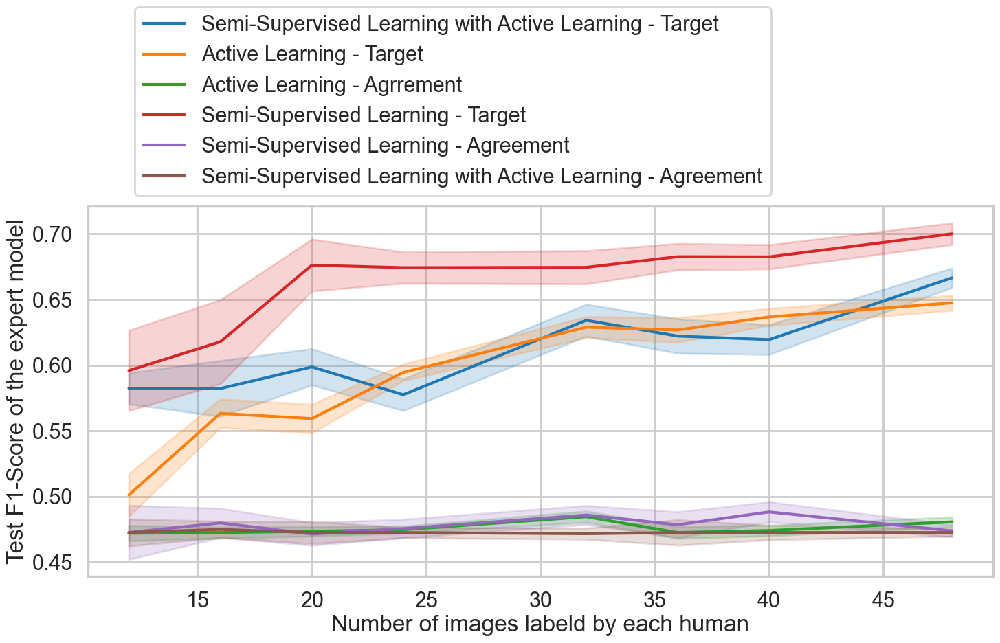

In [18]:
plt.figure()
sns.set_context("poster")
sns.set_style("whitegrid")
f, ax = plt.subplots(figsize=wide_format)
#, "labeler_id"
ln = sns.lineplot(x="labeled", y="value", hue=dff[["setting", "expert_predict", "sample_equal"]].apply(tuple, axis=1), 
                  data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0), ax=ax)
#ax.set(ylim=(, 130))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test F1-Score of the expert model")
plt.legend(loc='lower left', bbox_to_anchor=(0.04, 1))
leg_texts = ["Semi-Supervised Learning with Active Learning - Target", "Active Learning - Target", "Active Learning - Agrrement", "Semi-Supervised Learning - Target", "Semi-Supervised Learning - Agreement", "Semi-Supervised Learning with Active Learning - Agreement"]
for t, l in zip(ln.legend_.texts, leg_texts):
    t.set_text(l)
plt.savefig("../../images/NIH/expert_model/model_f1t.png", bbox_inches="tight")

In [19]:
from scipy.stats import iqr

a = dff.dropna().groupby(["setting", "labeled"])["value"].agg([np.median, scipy.stats.iqr, scipy.stats.normaltest])#.mean()
a = a.reset_index()

a = a[a["labeled"] <= 50]
a = a[a["setting"] != "NORMAL"]
a = a[a["setting"] != "SSL_AL_SSL"]
a["normaltest"] = a["normaltest"].apply(lambda x: x.pvalue)

pivoted_df = a.pivot_table(index=["setting"], columns="labeled", values=["median", "iqr", "normaltest"])
pivoted_df = pivoted_df.reset_index()

#pivoted_df.to_csv("../../tables/NIH/overall_setting_acc.csv")
pivoted_df

setting       iqr                                                    \
labeled                12        16        20        24        32        36   
0            AL  0.065785  0.098826  0.110533  0.123252  0.148914  0.158516   
1           SSL  0.140569  0.177555  0.209005  0.209883  0.192739  0.209122   
2        SSL_AL  0.228670  0.162557  0.181049  0.165173  0.188608  0.187794   

                               median  ...                        normaltest  \
labeled        40        48        12  ...        40        48            12   
0        0.164783  0.173280  0.472574  ...  0.533116  0.543683  6.386723e-02   
1        0.197271  0.223987  0.493362  ...  0.567646  0.549294  5.691085e-01   
2        0.190811  0.214228  0.542373  ...  0.509474  0.540681  1.074570e-16   

                                                                           \
labeled        16            20            24            32            36   
0        0.001936  2.552539e-02  3.276045e-06  1.238689e-04  1.305163e-06   
1        0.496584  1.064717e-01  1.255758e-10  5.844115e-12  2.812675e-12   
2        0.000138  3.553827e-11  8.341178e-10  3.091418e-03  4.164050e-09   

                                      
labeled            40             48  
0        9.341574e-19   7.245191e-18  
1        7.258461e-27  1.342115e-159  
2        4.514015e-06   2.366954e-01  

[3 rows x 25 columns]

In [20]:
dff = df.copy()
dff = dff[dff["variable"] == "End"]
dff = dff[dff["expert_predict"] == "target"]
dff = dff[dff["setting"] != "NORMAL"]
dff = dff[dff["setting"] != "SSL_AL_SSL"]
dff = dff[dff["overlap"] == 100]
dff = dff[dff["sample_equal"] == True]
dff = dff[dff["labeled"] <= 50]
#dff = dff[dff["labeler_id"] != 4295342357]
#dff = dff[dff["labeler_id"] != 4295354117]
#dff = dff[dff["labeler_id"] != 4295349121]

#dff = dff[dff["labeler_id"] == 4295342357]
#dff = dff[dff["labeler_id"] == 4295354117]
#dff = dff[dff["labeler_id"] == 4295349121]
#dff = dff[dff["labeler_id"] == 4323195249]
#dff = dff[dff["labeler_id"] == 4295232296]

In [198]:
#dff[dff["setting"] == "SSL_AL"]["value"].hist()
print(scipy.stats.normaltest(dff[dff["setting"] == "SSL_AL"]["value"]))
print(scipy.stats.normaltest(dff[dff["setting"] == "SSL"]["value"]))
print(scipy.stats.normaltest(dff[dff["setting"] == "AL"]["value"]))

NormaltestResult(statistic=298.118853977424, pvalue=1.8378640517841799e-65)
NormaltestResult(statistic=20.406478638468304, pvalue=3.705010696306075e-05)
NormaltestResult(statistic=92.7827009591348, pvalue=7.120204687873918e-21)


<Figure size 640x480 with 0 Axes>

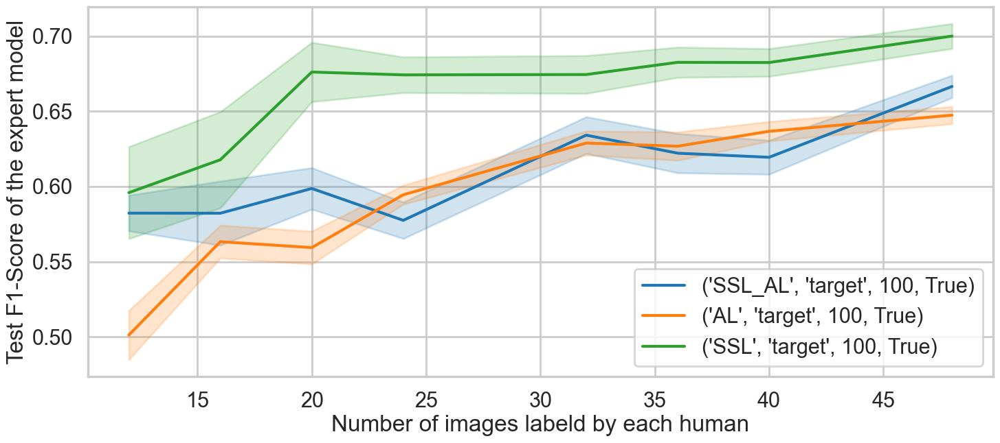

In [21]:
plt.figure()
sns.set_context("poster")
f, ax = plt.subplots(figsize=wide_format)
#, "labeler_id"
ln = sns.lineplot(x="labeled", y="value", hue=dff[["setting", "expert_predict", "overlap", "sample_equal"]].apply(tuple, axis=1), 
                  data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0), ax=ax)
#ax.set(ylim=(, 130))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test F1-Score of the expert model")
plt.legend(loc='lower right')
leg_texts = ["Semi-Supervised Learning with Active Learning", "Active Learning", "Semi-Supervised Learning"]
#for t, l in zip(ln.legend_.texts, leg_texts):
#    t.set_text(l)
#plt.savefig("../../images/NIH/expert_model/model_f1_target.png", bbox_inches="tight")

In [174]:
dff

,variable,value,run,group,expert_predict,labeler_ids,al_labels,init_size,labels_per_round,labeled,rounds,overlap,mod,setting,sample_equal,labeler_id
36,End,0.309278,196,196,target,"[4295349121, 4295342357]",1,4,4,12,2,100,confidence,SSL_AL,True,4295342357
37,End,0.337662,196,196,target,"[4295349121, 4295342357]",1,4,4,12,2,100,confidence,SSL_AL,True,4295342357
38,End,0.581818,196,196,target,"[4295349121, 4295342357]",1,4,4,12,2,100,confidence,SSL_AL,True,4295342357
39,End,0.000000,196,196,target,"[4295349121, 4295342357]",1,4,4,12,2,100,confidence,SSL_AL,True,4295342357
40,End,0.000000,196,196,target,"[4295349121, 4295342357]",1,4,4,12,2,100,confidence,SSL_AL,True,4295342357
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4080,End,0.588082,795,795,target,"[4323195249, 4295232296]",0,32,8,48,2,100,ssl,SSL,True,4295232296
4089,End,0.761613,798,798,target,"[4323195249, 4295232296]",0,32,8,48,2,100,disagreement_diff,SSL_AL,True,4295232296
4090,End,0.395448,798,798,target,"[4323195249, 4295232296]",0,32,8,48,2,100,disagreement_diff,SSL_AL,True,4295232296
4091,End,0.568276,798,798,target,"[4323195249, 4295232296]",0,32,8,48,2,100,disagreement_diff,SSL_AL,True,4295232296


In [215]:
from scipy.stats import iqr

a = dff.groupby(["expert_predict", "setting", "labeler_id", "labeled"])["value"].agg([np.median, iqr])#.mean()
a = a.reset_index()

a = a[a["labeled"] <= 50]
a = a[a["setting"] != "NORMAL"]
a = a[a["setting"] != "SSL_AL_SSL"]

#pivoted_df = a.pivot_table(index=["labeler_id", "expert_predict", "setting", ], columns="labeled", values=["mean", "std"])
pivoted_df = a.pivot_table(index=["expert_predict", "setting", ], columns="labeled", values=["median", "iqr"])


# Reset index again if needed
pivoted_df = pivoted_df.reset_index()
#pivoted_df.to_csv("../../tables/NIH/expert_model/expert_f1_target.csv")
pivoted_df

expert_predict setting       iqr                                \
labeled                               12        16        20        24   
0                right      AL  0.006548  0.009016  0.025245  0.026582   
1                right     SSL  0.082434  0.040719  0.060471  0.074016   
2                right  SSL_AL  0.021572  0.027610  0.015113  0.019629   
3               target      AL  0.132439  0.084548  0.107126  0.092143   
4               target     SSL  0.141368  0.097189  0.078620  0.101425   
5               target  SSL_AL  0.151912  0.195770  0.139136  0.164149   

                                                   median                      \
labeled        32        36        40        48        12        16        20   
0        0.034353  0.029993  0.030467  0.037854  0.467557  0.467816  0.468982   
1        0.039277  0.041276  0.059504  0.036419  0.482004  0.497036  0.483970   
2        0.018417  0.019278  0.024649  0.018839  0.470925  0.469166  0.469536   
3        0.098086  0.098945  0.094712  0.087636  0.499283  0.575984  0.567110   
4        0.069232  0.065001  0.060722  0.072538  0.601064  0.642126  0.661318   
5        0.114007  0.132199  0.144746  0.093028  0.585222  0.575831  0.605444   

                                                           
labeled        24        32        36        40        48  
0        0.468613  0.487690  0.467550  0.470931  0.483275  
1        0.480562  0.482404  0.489715  0.493645  0.478846  
2        0.467322  0.466645  0.470182  0.474907  0.471102  
3        0.594586  0.636268  0.618068  0.643537  0.647283  
4        0.665581  0.698129  0.686973  0.675913  0.686929  
5        0.591907  0.649382  0.622737  0.615990  0.669024

In [186]:
a = dff.groupby(["expert_predict", "setting", "labeler_id", "labeled"])["value"].agg(["mean", "std"])#.mean()
a = a.reset_index()

a = a[a["labeled"] <= 50]
a = a[a["setting"] != "NORMAL"]
a = a[a["setting"] != "SSL_AL_SSL"]

#pivoted_df = a.pivot_table(index=["labeler_id", "expert_predict", "setting", ], columns="labeled", values=["mean", "std"])
pivoted_df = a.pivot_table(index=["expert_predict", "setting", ], columns="labeled", values=["mean", "std"])


# Reset index again if needed
pivoted_df = pivoted_df.reset_index()
#pivoted_df.to_csv("../../tables/NIH/expert_model/expert_f1_target.csv")
pivoted_df
#a.to_excel("../experts.xlsx")#.reset_index()
#a.reset_index().pivot_table(columns=["setting", "expert_predict", "labeled"])#set_index("labeled").T#.melt(id_vars=["setting", "expert_predict"], value_name="value")

expert_predict setting      mean                                \
labeled                               12        16        20        24   
0               target      AL  0.491346  0.579279  0.551692  0.599783   
1               target     SSL  0.589643  0.625938  0.644390  0.662544   
2               target  SSL_AL  0.556959  0.558071  0.578025  0.565131   

                                                      std                      \
labeled        32        36        40        48        12        16        20   
0        0.640060  0.621383  0.637253  0.651246  0.104266  0.070470  0.096881   
1        0.685767  0.687408  0.680073  0.690483  0.147183  0.129304  0.109701   
2        0.636168  0.601006  0.600681  0.663425  0.154728  0.137850  0.116327   

                                                           
labeled        24        32        36        40        48  
0        0.070838  0.065388  0.076171  0.064514  0.061939  
1        0.080775  0.066413  0.055065  0.052191  0.053057  
2        0.134026  0.090863  0.099180  0.113944  0.078950

In [168]:
pivoted_df.loc[[0, 2],["mean", "std"]].diff()#["mean"].mean(axis=1)

mean                                                              \
labeled        12        16        20        24        32        36        40   
0             NaN       NaN       NaN       NaN       NaN       NaN       NaN   
2        0.065613 -0.021208  0.026333 -0.034651 -0.003892 -0.020377 -0.036571   

                       std                                                  \
labeled       48        12       16        20        24        32       36   
0            NaN       NaN      NaN       NaN       NaN       NaN      NaN   
2        0.01218  0.050462  0.06738  0.019446  0.063188  0.025474  0.02301   

                            
labeled       40        48  
0            NaN       NaN  
2        0.04943  0.017011

In [173]:
pivoted_df.loc[[0, 2],["mean", "std"]].pct_change()["mean"]#.mean(axis=1)

labeled,12,16,20,24,32,36,40,48
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,0.133537,-0.036611,0.047731,-0.057773,-0.006081,-0.032793,-0.057389,0.018702


In [163]:
pivoted_df.loc[[1, 2],["mean", "std"]].diff()

mean                                                              \
labeled        12        16        20        24        32        36        40   
1             NaN       NaN       NaN       NaN       NaN       NaN       NaN   
2       -0.032684 -0.067867 -0.066365 -0.097413 -0.049599 -0.086402 -0.079391   

                        std                                                  \
labeled        48        12        16        20       24       32        36   
1             NaN       NaN       NaN       NaN      NaN      NaN       NaN   
2       -0.027057  0.007545  0.008545  0.006626  0.05325  0.02445  0.044115   

                             
labeled        40        48  
1             NaN       NaN  
2        0.061753  0.025893

In [22]:
dff = df.copy()
dff = dff[dff["variable"] == "End"]
dff = dff[dff["expert_predict"] == "right"]
dff = dff[dff["setting"] != "NORMAL"]
dff = dff[dff["setting"] != "SSL_AL_SSL"]
dff = dff[dff["overlap"] == 100]
dff = dff[dff["sample_equal"] == True]
dff = dff[dff["labeled"] <= 50]
#dff = dff[dff["labeler_id"] != 4295342357]
#dff = dff[dff["labeler_id"] != 4295354117]
#dff = dff[dff["labeler_id"] != 4295349121]

<Figure size 640x480 with 0 Axes>

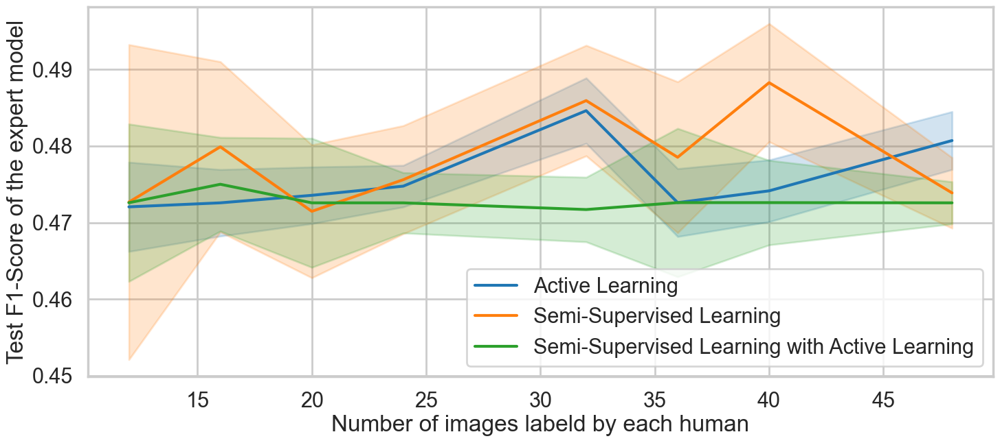

In [23]:
plt.figure()
sns.set_context("poster")
f, ax = plt.subplots(figsize=wide_format)
#, "labeler_id"
ln = sns.lineplot(x="labeled", y="value", hue=dff[["setting", "expert_predict"]].apply(tuple, axis=1), 
                  data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0), ax=ax)
#ax.set(ylim=(, 130))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test F1-Score of the expert model")
plt.legend(loc='lower right')
leg_texts = ["Active Learning", "Semi-Supervised Learning", "Semi-Supervised Learning with Active Learning", ]
for t, l in zip(ln.legend_.texts, leg_texts):
    t.set_text(l)
plt.savefig("../../images/NIH/expert_model/model_f1_right.png", bbox_inches="tight")

<Figure size 640x480 with 0 Axes>

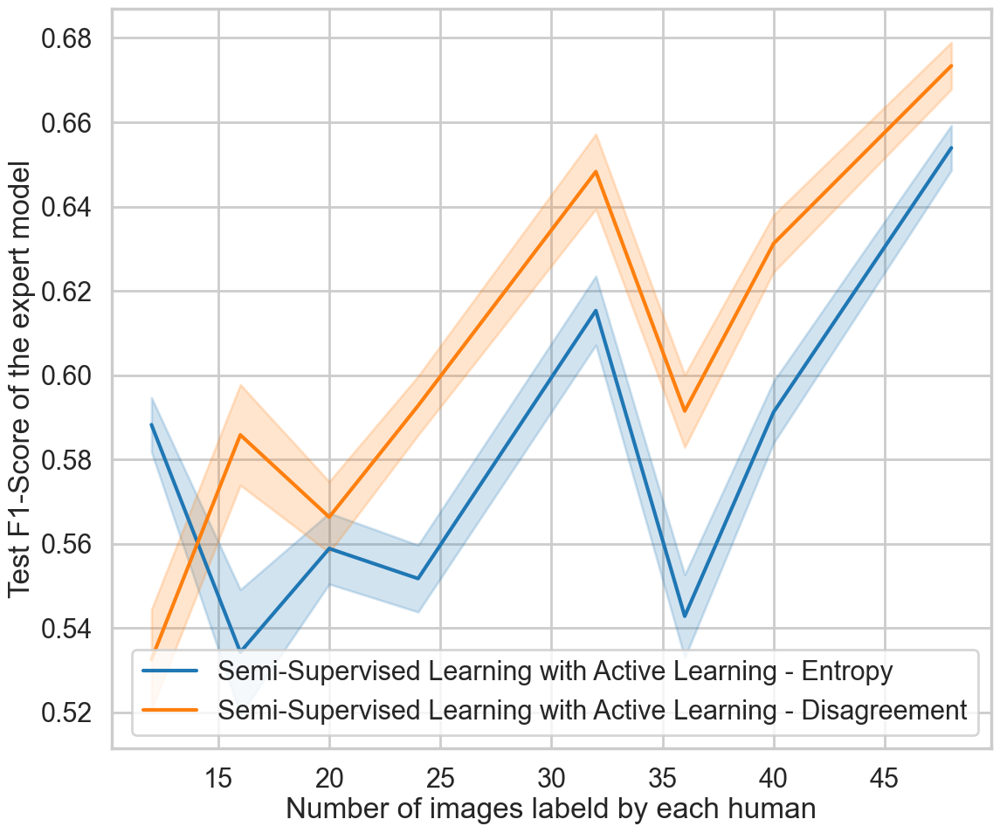

In [24]:
dff = df.copy()
dff = dff[dff["variable"] == "End"]
dff = dff[dff["expert_predict"] == "target"]
dff = dff[dff["setting"] != "NORMAL"]
dff = dff[dff["setting"] != "SSL_AL_SSL"]
dff = dff[dff["setting"] == "SSL_AL"]
#dff = dff[dff["overlap"] == 100]
#dff = dff[dff["sample_equal"] == True]
dff = dff[dff["labeled"] <= 50]
#dff = dff[dff["labeler_id"] != 4295342357]
#dff = dff[dff["labeler_id"] != 4295354117]
#dff = dff[dff["labeler_id"] != 4295349121]

#dff = dff[dff["labeler_id"] == 4295342357]
#dff = dff[dff["labeler_id"] == 4295354117]
#dff = dff[dff["labeler_id"] == 4295349121]
#dff = dff[dff["labeler_id"] == 4323195249]
#dff = dff[dff["labeler_id"] == 4295232296]

plt.figure()
sns.set_context("poster")
f, ax = plt.subplots(figsize=small_format)
#, "labeler_id"
ln = sns.lineplot(x="labeled", y="value", hue=dff[["setting", "expert_predict", "mod"]].apply(tuple, axis=1), 
                  data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0), ax=ax)
#ax.set(ylim=(, 130))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test F1-Score of the expert model")
plt.legend(loc='lower right')
leg_texts = ["Semi-Supervised Learning with Active Learning - Entropy", "Semi-Supervised Learning with Active Learning - Disagreement"]
for t, l in zip(ln.legend_.texts, leg_texts):
    t.set_text(l)
plt.savefig("../../images/NIH/expert_model/model_f1_target_strategy.png", bbox_inches="tight")

<Figure size 640x480 with 0 Axes>

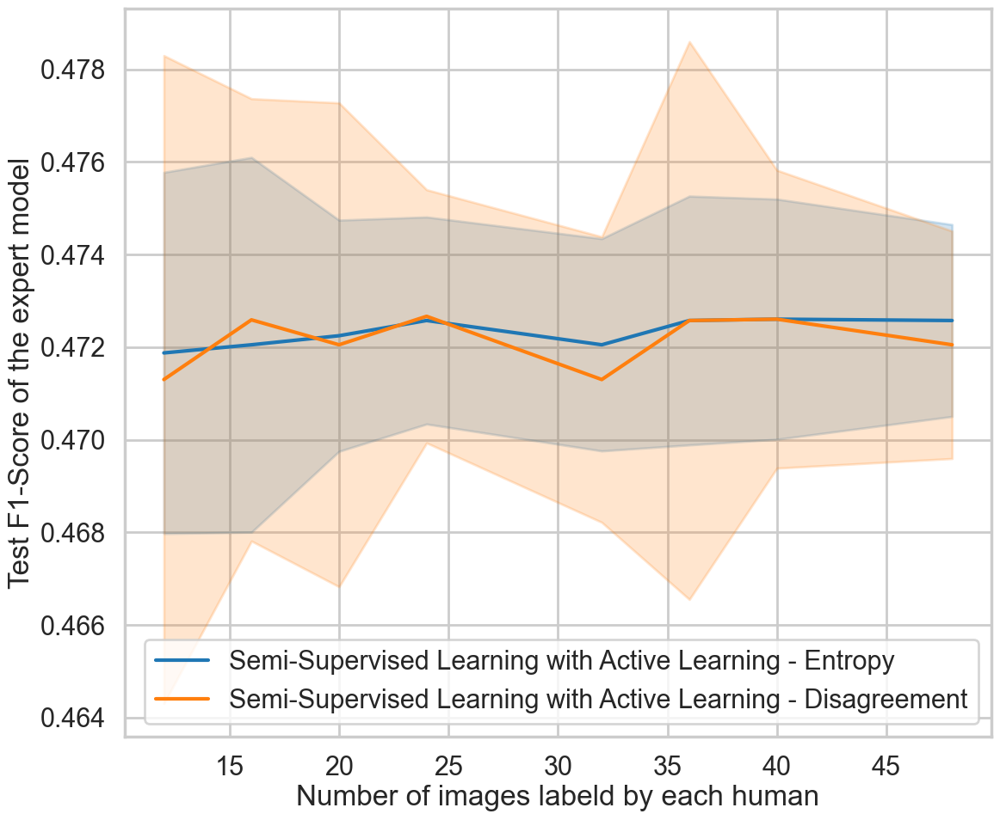

In [25]:
dff = df.copy()
dff = dff[dff["variable"] == "End"]
dff = dff[dff["expert_predict"] == "right"]
dff = dff[dff["setting"] != "NORMAL"]
dff = dff[dff["setting"] != "SSL_AL_SSL"]
dff = dff[dff["setting"] == "SSL_AL"]
#dff = dff[dff["overlap"] == 100]
#dff = dff[dff["sample_equal"] == True]
dff = dff[dff["labeled"] <= 50]
#dff = dff[dff["labeler_id"] != 4295342357]
#dff = dff[dff["labeler_id"] != 4295354117]
#dff = dff[dff["labeler_id"] != 4295349121]

#dff = dff[dff["labeler_id"] == 4295342357]
#dff = dff[dff["labeler_id"] == 4295354117]
#dff = dff[dff["labeler_id"] == 4295349121]
#dff = dff[dff["labeler_id"] == 4323195249]
#dff = dff[dff["labeler_id"] == 4295232296]

plt.figure()
sns.set_context("poster")
f, ax = plt.subplots(figsize=small_format)
#, "labeler_id"
ln = sns.lineplot(x="labeled", y="value", hue=dff[["setting", "expert_predict", "mod"]].apply(tuple, axis=1), 
                  data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0), ax=ax)
#ax.set(ylim=(, 130))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test F1-Score of the expert model")
plt.legend(loc='lower right')
leg_texts = ["Semi-Supervised Learning with Active Learning - Entropy", "Semi-Supervised Learning with Active Learning - Disagreement"]
for t, l in zip(ln.legend_.texts, leg_texts):
    t.set_text(l)
plt.savefig("../../images/NIH/expert_model/model_f1_right_strategy.png", bbox_inches="tight")

<Figure size 640x480 with 0 Axes>

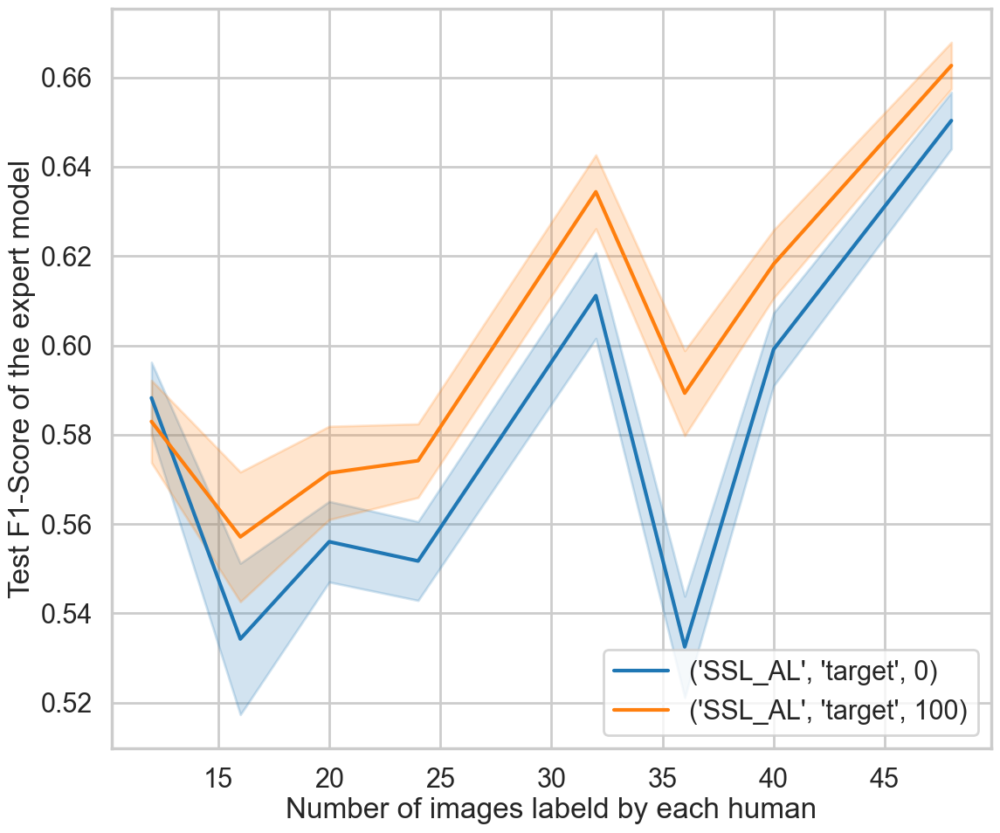

In [26]:
dff = df.copy()
dff = dff[dff["variable"] == "End"]
dff = dff[dff["expert_predict"] == "target"]
dff = dff[dff["setting"] != "NORMAL"]
dff = dff[dff["setting"] != "SSL_AL_SSL"]
dff = dff[dff["setting"] == "SSL_AL"]
#dff = dff[dff["overlap"] == 100]
#dff = dff[dff["sample_equal"] == True]
dff = dff[dff["labeled"] <= 50]
#dff = dff[dff["labeler_id"] != 4295342357]
#dff = dff[dff["labeler_id"] != 4295354117]
#dff = dff[dff["labeler_id"] != 4295349121]

#dff = dff[dff["labeler_id"] == 4295342357]
#dff = dff[dff["labeler_id"] == 4295354117]
#dff = dff[dff["labeler_id"] == 4295349121]
#dff = dff[dff["labeler_id"] == 4323195249]
#dff = dff[dff["labeler_id"] == 4295232296]

plt.figure()
sns.set_context("poster")
f, ax = plt.subplots(figsize=small_format)
#, "labeler_id"
ln = sns.lineplot(x="labeled", y="value", hue=dff[["setting", "expert_predict", "overlap"]].apply(tuple, axis=1), 
                  data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0), ax=ax)
#ax.set(ylim=(, 130))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test F1-Score of the expert model")
plt.legend(loc='lower right')
#leg_texts = ["Semi-Supervised Learning with Active Learning - Entropy", "Semi-Supervised Learning with Active Learning - Disagreement"]
#for t, l in zip(ln.legend_.texts, leg_texts):
#    t.set_text(l)
#plt.savefig("../../images/NIH/expert_model/model_f1_target_strategy.png", bbox_inches="tight")

<Figure size 640x480 with 0 Axes>

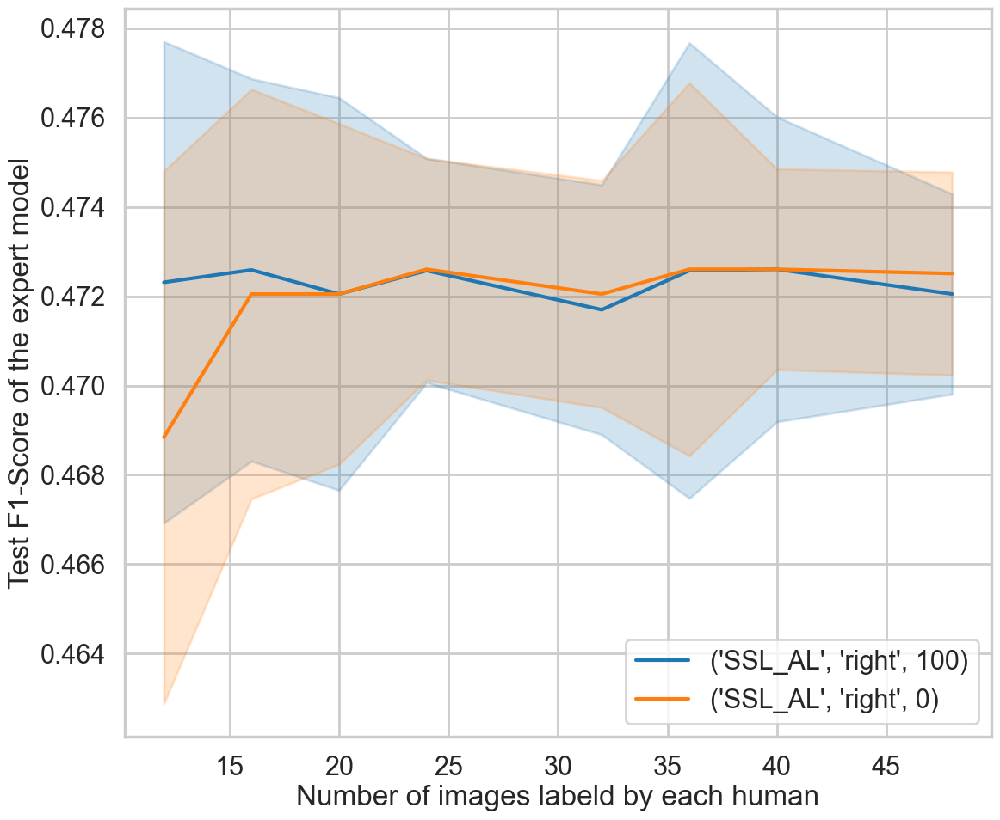

In [27]:
dff = df.copy()
dff = dff[dff["variable"] == "End"]
dff = dff[dff["expert_predict"] == "right"]
dff = dff[dff["setting"] != "NORMAL"]
dff = dff[dff["setting"] != "SSL_AL_SSL"]
dff = dff[dff["setting"] == "SSL_AL"]
#dff = dff[dff["overlap"] == 100]
#dff = dff[dff["sample_equal"] == True]
dff = dff[dff["labeled"] <= 50]
#dff = dff[dff["labeler_id"] != 4295342357]
#dff = dff[dff["labeler_id"] != 4295354117]
#dff = dff[dff["labeler_id"] != 4295349121]

#dff = dff[dff["labeler_id"] == 4295342357]
#dff = dff[dff["labeler_id"] == 4295354117]
#dff = dff[dff["labeler_id"] == 4295349121]
#dff = dff[dff["labeler_id"] == 4323195249]
#dff = dff[dff["labeler_id"] == 4295232296]

plt.figure()
sns.set_context("poster")
f, ax = plt.subplots(figsize=small_format)
#, "labeler_id"
ln = sns.lineplot(x="labeled", y="value", hue=dff[["setting", "expert_predict", "overlap"]].apply(tuple, axis=1), 
                  data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0), ax=ax)
#ax.set(ylim=(, 130))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test F1-Score of the expert model")
plt.legend(loc='lower right')
#leg_texts = ["Semi-Supervised Learning with Active Learning - Entropy", "Semi-Supervised Learning with Active Learning - Disagreement"]
#for t, l in zip(ln.legend_.texts, leg_texts):
#    t.set_text(l)
#plt.savefig("../../images/NIH/expert_model/model_f1_target_strategy.png", bbox_inches="tight")

<Figure size 640x480 with 0 Axes>

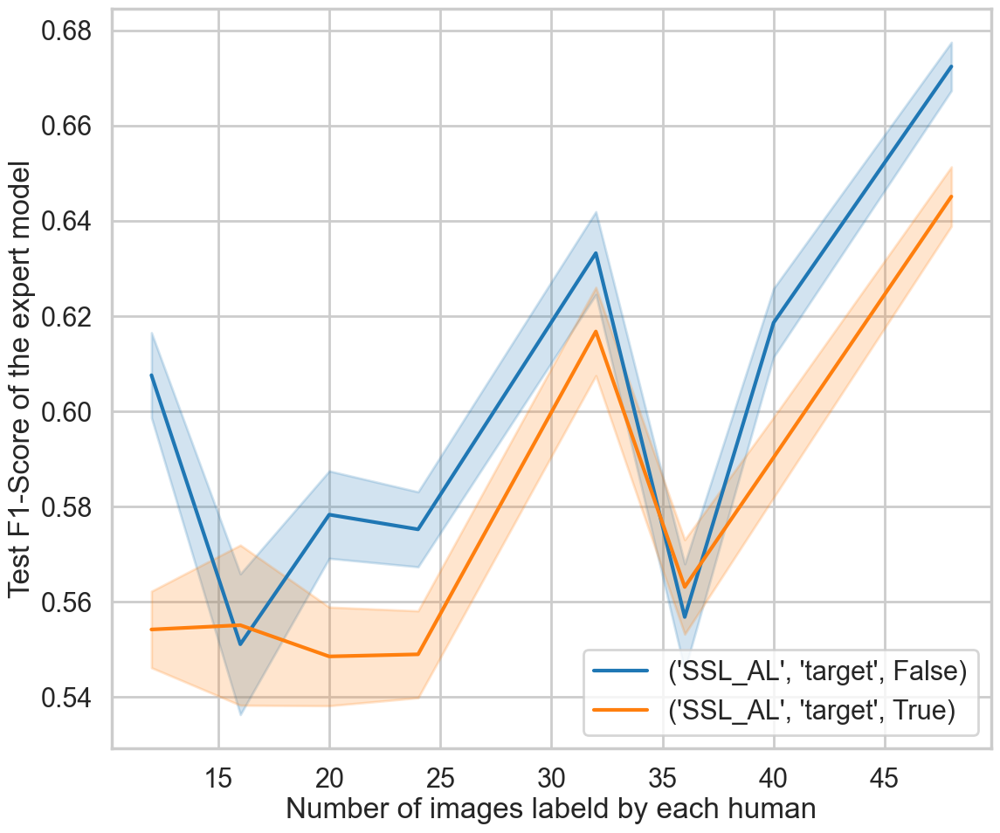

In [28]:
dff = df.copy()
dff = dff[dff["variable"] == "End"]
dff = dff[dff["expert_predict"] == "target"]
dff = dff[dff["setting"] != "NORMAL"]
dff = dff[dff["setting"] != "SSL_AL_SSL"]
dff = dff[dff["setting"] == "SSL_AL"]
#dff = dff[dff["overlap"] == 100]
#dff = dff[dff["sample_equal"] == True]
dff = dff[dff["labeled"] <= 50]
#dff = dff[dff["labeler_id"] != 4295342357]
#dff = dff[dff["labeler_id"] != 4295354117]
#dff = dff[dff["labeler_id"] != 4295349121]

#dff = dff[dff["labeler_id"] == 4295342357]
#dff = dff[dff["labeler_id"] == 4295354117]
#dff = dff[dff["labeler_id"] == 4295349121]
#dff = dff[dff["labeler_id"] == 4323195249]
#dff = dff[dff["labeler_id"] == 4295232296]

plt.figure()
sns.set_context("poster")
f, ax = plt.subplots(figsize=small_format)
#, "labeler_id"
ln = sns.lineplot(x="labeled", y="value", hue=dff[["setting", "expert_predict", "sample_equal"]].apply(tuple, axis=1), 
                  data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0), ax=ax)
#ax.set(ylim=(, 130))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test F1-Score of the expert model")
plt.legend(loc='lower right')
#leg_texts = ["Semi-Supervised Learning with Active Learning - Entropy", "Semi-Supervised Learning with Active Learning - Disagreement"]
#for t, l in zip(ln.legend_.texts, leg_texts):
#    t.set_text(l)
#plt.savefig("../../images/NIH/expert_model/model_f1_target_strategy.png", bbox_inches="tight")

<Figure size 640x480 with 0 Axes>

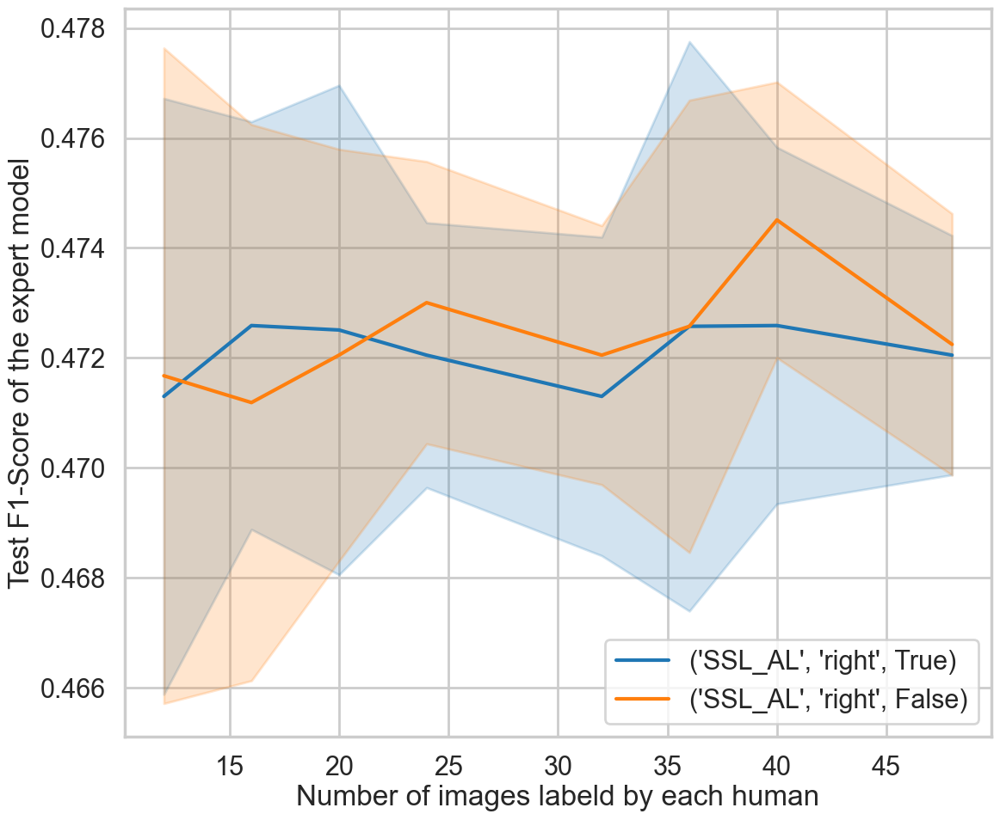

In [29]:
dff = df.copy()
dff = dff[dff["variable"] == "End"]
dff = dff[dff["expert_predict"] == "right"]
dff = dff[dff["setting"] != "NORMAL"]
dff = dff[dff["setting"] != "SSL_AL_SSL"]
dff = dff[dff["setting"] == "SSL_AL"]
#dff = dff[dff["overlap"] == 100]
#dff = dff[dff["sample_equal"] == True]
dff = dff[dff["labeled"] <= 50]
#dff = dff[dff["labeler_id"] != 4295342357]
#dff = dff[dff["labeler_id"] != 4295354117]
#dff = dff[dff["labeler_id"] != 4295349121]

#dff = dff[dff["labeler_id"] == 4295342357]
#dff = dff[dff["labeler_id"] == 4295354117]
#dff = dff[dff["labeler_id"] == 4295349121]
#dff = dff[dff["labeler_id"] == 4323195249]
#dff = dff[dff["labeler_id"] == 4295232296]

plt.figure()
sns.set_context("poster")
f, ax = plt.subplots(figsize=small_format)
#, "labeler_id"
ln = sns.lineplot(x="labeled", y="value", hue=dff[["setting", "expert_predict", "sample_equal"]].apply(tuple, axis=1), 
                  data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0), ax=ax)
#ax.set(ylim=(, 130))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test F1-Score of the expert model")
plt.legend(loc='lower right')
#leg_texts = ["Semi-Supervised Learning with Active Learning - Entropy", "Semi-Supervised Learning with Active Learning - Disagreement"]
#for t, l in zip(ln.legend_.texts, leg_texts):
#    t.set_text(l)
#plt.savefig("../../images/NIH/expert_model/model_f1_target_strategy.png", bbox_inches="tight")

In [49]:
dfs = []
for labeler_id in [4295342357, 4295354117, 4295349121, 4323195249, 4295232296]:

    var_columns = []
    cut_out = [("setting", "PERFECT")]

    df_plot, df_runs = expertMetrics.create_plot_df_grouped(labeler_id, "Test", "fpr", var_columns=var_columns, unwanted_tuples=cut_out)
    
    df = df_plot#[df_plot["variable"] == "End"]
    df = df.join(df_runs, on="group")
    
    df["labeler_id"] = labeler_id
    
    dfs.append(df.copy())
    
    print(labeler_id)
    
df = dfs[0]

for temp_df in range(1, len(dfs)):
    df = pd.concat([df, dfs[temp_df]])
    
df.head()

0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected
0 detected

,variable,value,run,group,expert_predict,labeler_ids,al_labels,init_size,labels_per_round,labeled,rounds,overlap,mod,setting,sample_equal,labeler_id
0,End,0.474453,193,193,target,"[4295349121, 4295342357]",1,4,4,12,2,0,confidence,SSL_AL,False,4295342357
1,End,0.090909,193,193,target,"[4295349121, 4295342357]",1,4,4,12,2,0,confidence,SSL_AL,False,4295342357
2,End,0.035971,193,193,target,"[4295349121, 4295342357]",1,4,4,12,2,0,confidence,SSL_AL,False,4295342357
3,End,0.162162,193,193,target,"[4295349121, 4295342357]",1,4,4,12,2,0,confidence,SSL_AL,False,4295342357
4,End,0.010000,193,193,target,"[4295349121, 4295342357]",1,4,4,12,2,0,confidence,SSL_AL,False,4295342357


In [51]:
df

,variable,value,run,group,expert_predict,labeler_ids,al_labels,init_size,labels_per_round,labeled,rounds,overlap,mod,setting,sample_equal,labeler_id
0,End,0.474453,193,193,target,"[4295349121, 4295342357]",1,4,4,12,2,0,confidence,SSL_AL,False,4295342357
1,End,0.090909,193,193,target,"[4295349121, 4295342357]",1,4,4,12,2,0,confidence,SSL_AL,False,4295342357
2,End,0.035971,193,193,target,"[4295349121, 4295342357]",1,4,4,12,2,0,confidence,SSL_AL,False,4295342357
3,End,0.162162,193,193,target,"[4295349121, 4295342357]",1,4,4,12,2,0,confidence,SSL_AL,False,4295342357
4,End,0.010000,193,193,target,"[4295349121, 4295342357]",1,4,4,12,2,0,confidence,SSL_AL,False,4295342357
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9669,Start,0.458333,1287,1287,target,"[4323195249, 4295232296]",0,32,8,48,2,100,disagreement_diff,SSL_AL,False,4295232296
9670,Start,0.565217,1288,1288,right,"[4323195249, 4295232296]",0,32,8,48,2,100,disagreement_diff,SSL_AL,False,4295232296
9671,Start,0.500000,1288,1288,right,"[4323195249, 4295232296]",0,32,8,48,2,100,disagreement_diff,SSL_AL,False,4295232296
9672,Start,1.000000,1288,1288,right,"[4323195249, 4295232296]",0,32,8,48,2,100,disagreement_diff,SSL_AL,False,4295232296


In [60]:
dff = df.copy()
dff = dff[dff["variable"] == "End"]
dff = dff[dff["expert_predict"] == "right"]
dff = dff[dff["setting"] != "NORMAL"]
dff = dff[dff["setting"] != "SSL_AL_SSL"]
#dff = dff[dff["setting"] == "SSL_AL"]
#dff = dff[dff["overlap"] == 100]
#dff = dff[dff["sample_equal"] == True]
dff = dff[dff["labeled"] <= 50]

dff[dff["value"] <= 0]["value"].count()

18

[Text(0.5, 0, 'Number of images labeld by each human'),
 Text(0, 0.5, 'Test Fals-Positive-Rate of the expert model')]

<Figure size 640x480 with 0 Axes>

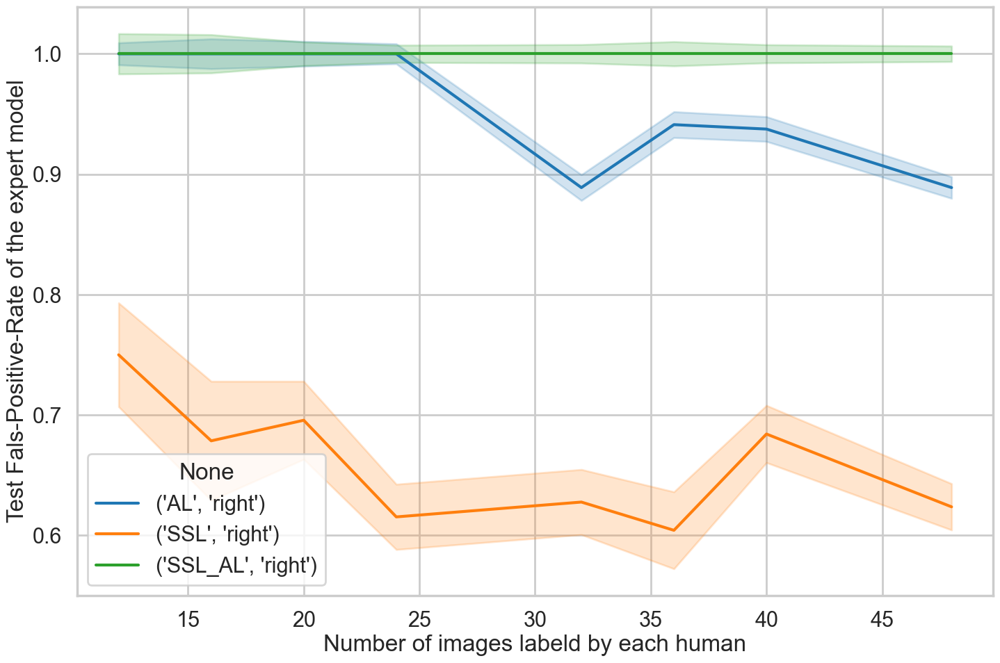

In [68]:
dff = df.copy()
dff = dff[dff["variable"] == "End"]
dff = dff[dff["expert_predict"] == "right"]
dff = dff[dff["setting"] != "NORMAL"]
dff = dff[dff["setting"] != "SSL_AL_SSL"]
dff = dff[dff["value"] > 0]
#dff = dff[dff["setting"] == "SSL_AL"]
#dff = dff[dff["overlap"] == 100]
#dff = dff[dff["sample_equal"] == True]
dff = dff[dff["labeled"] <= 50]
#dff = dff[dff["labeler_id"] != 4295342357]
#dff = dff[dff["labeler_id"] != 4295354117]
#dff = dff[dff["labeler_id"] != 4295349121]

#dff = dff[dff["labeler_id"] == 4295342357]
#dff = dff[dff["labeler_id"] == 4295354117]
#dff = dff[dff["labeler_id"] == 4295349121]
#dff = dff[dff["labeler_id"] == 4323195249]
#dff = dff[dff["labeler_id"] == 4295232296]

plt.figure()
sns.set_context("poster")
f, ax = plt.subplots(figsize=wide_format_h)
#, "labeler_id"
ln = sns.lineplot(x="labeled", y="value", hue=dff[["setting", "expert_predict"]].apply(tuple, axis=1), 
                  data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0), ax=ax)
#ax.set(ylim=(, 130))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test Fals-Positive-Rate of the expert model")
#plt.legend(loc='lower right')
#leg_texts = ["Semi-Supervised Learning with Active Learning - Entropy", "Semi-Supervised Learning with Active Learning - Disagreement"]
#for t, l in zip(ln.legend_.texts, leg_texts):
#    t.set_text(l)
#plt.savefig("../../images/NIH/expert_model/model_f1_target_strategy.png", bbox_inches="tight")

[Text(0.5, 0, 'Number of images labeld by each human'),
 Text(0, 0.5, 'Test Fals-Positive-Rate of the expert model')]

<Figure size 640x480 with 0 Axes>

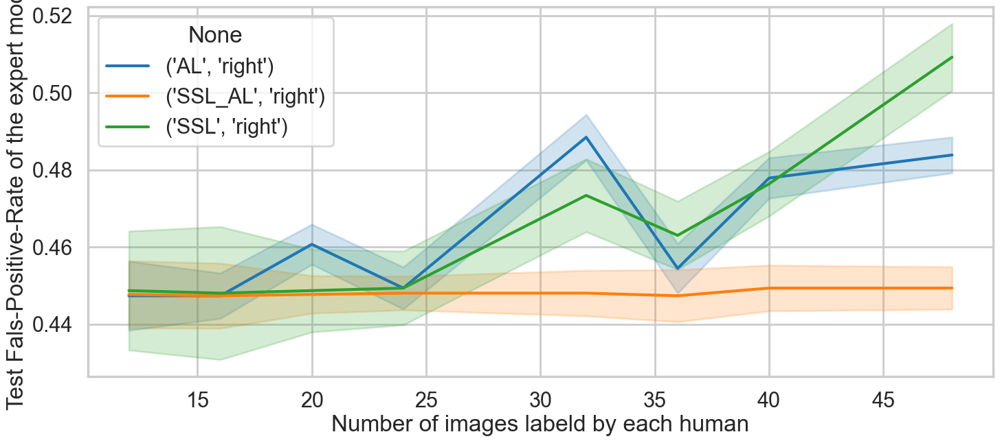

In [175]:
dff = df.copy()
dff = dff[dff["variable"] == "End"]
dff = dff[dff["expert_predict"] == "right"]
dff = dff[dff["setting"] != "NORMAL"]
dff = dff[dff["setting"] != "SSL_AL_SSL"]
#dff = dff[dff["setting"] == "SSL_AL"]
#dff = dff[dff["overlap"] == 100]
#dff = dff[dff["sample_equal"] == True]
dff = dff[dff["labeled"] <= 50]
#dff = dff[dff["labeler_id"] != 4295342357]
#dff = dff[dff["labeler_id"] != 4295354117]
#dff = dff[dff["labeler_id"] != 4295349121]

#dff = dff[dff["labeler_id"] == 4295342357]
#dff = dff[dff["labeler_id"] == 4295354117]
#dff = dff[dff["labeler_id"] == 4295349121]
#dff = dff[dff["labeler_id"] == 4323195249]
#dff = dff[dff["labeler_id"] == 4295232296]

plt.figure()
sns.set_context("poster")
f, ax = plt.subplots(figsize=wide_format)
#, "labeler_id"
ln = sns.lineplot(x="labeled", y="value", hue=dff[["setting", "expert_predict"]].apply(tuple, axis=1), 
                  data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0), ax=ax)
#ax.set(ylim=(, 130))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test Fals-Positive-Rate of the expert model")
#plt.legend(loc='lower right')
#leg_texts = ["Semi-Supervised Learning with Active Learning - Entropy", "Semi-Supervised Learning with Active Learning - Disagreement"]
#for t, l in zip(ln.legend_.texts, leg_texts):
#    t.set_text(l)
#plt.savefig("../../images/NIH/expert_model/model_f1_target_strategy.png", bbox_inches="tight")

In [83]:
dff = df.copy()
dff = dff[dff["expert_predict"] == "target"]
dff = dff[dff["overlap"] == 0]
dff = dff[dff["sample_equal"] == False]

<Figure size 640x480 with 0 Axes>

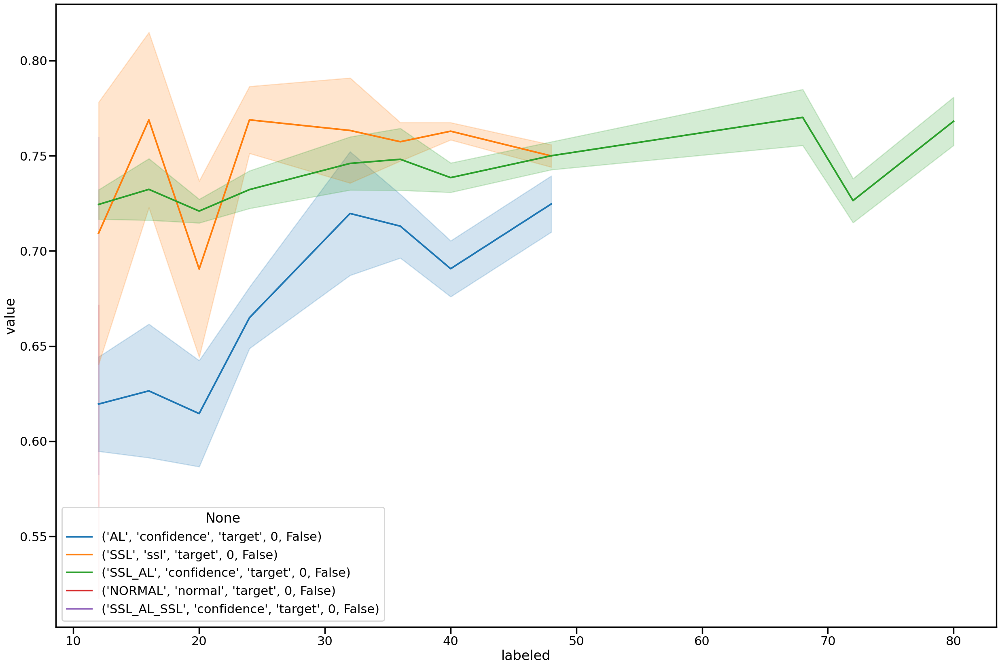

In [84]:
plt.figure()
sns.set_context("poster")
f, ax = plt.subplots(figsize=(30, 20))
ln = sns.lineplot(x="labeled", y="value", hue=dff[["setting", "mod", "expert_predict", "overlap", "sample_equal"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0), ax=ax)

In [ ]:
dff = df[df["setting"] != "PERFECT"].copy().reset_index()
#dff = df[df["setting"] == "SSL_AL"].copy().reset_index()
#dff = dff[dff["expert_predict"] == "target"]
dff = dff[dff["overlap"] != 0]
dff = dff[dff["sample_equal"] != False]
#dff = dff[dff["labeler_ids"] != "[4323195249, 4295232296]"]
#dff = dff[dff["labeler_ids"] != "[4295349121, 4295342357]"]
dff = dff[dff["mod"] != "disagreement_diff"]
#dff = df[df["expert_predict"] == "right"].reset_index()
dfff = df[df["setting"] == "PERFECT"].reset_index()
dff["group"] = dff["group"].replace(runs_df.to_dict()["labeled"])
dff = dff[dff["group"] <= 50]
f, ax = plt.subplots(figsize=(13, 11))
sns.set_context("poster")
#, "overlap", "sample_equal", "expert_predict", "mod"
#sns.lineplot(x="group", y="value", hue="setting", data=df.reset_index(), err_style="band", style="mod")
ln = sns.lineplot(x="group", y="value", hue=dff[["setting", "mod", "sample_equal"]].apply(tuple, axis=1), data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("se", 1.0))
#sns.lineplot(x="group", y="value", data=dff, err_style="band", markers=True, estimator=estimator, errorbar=("sd", 0.5))
ax.axhline(estimator(dfff["value"].dropna()), ls='--', color="red", label="Optimal Setting")
#ax.axhline(90.1403561, ls='--', color="g")
#ax.axhline(87.5957923, ls='--', color="b")
ax.set(ylim=(80, 100))

ax.set(xlabel='Number of images labeled by each human', ylabel="Test Accuracy of the L2D System")
plt.legend(loc='upper right')
#leg_texts = ["Active Learning", "Semi-Supervised Learning", "Semi-Supervised Learning with Active Learning", "Supervised"]
#for t, l in zip(ln.legend_.texts, leg_texts):
#    t.set_text(l)

In [ ]:
var_columns = ["sample_equal", "overlap", "rounds", "init_size", "labels_per_round"]
cut_out = [("expert_predict", "right"), ("mod", "disagreement_diff")]


df_plot, df_runs = expertMetrics.create_plot_df_grouped(4295349121, "Test", "accurancy", var_columns=var_columns, unwanted_tuples=cut_out)

plt.figure()
f, ax = plt.subplots(figsize=(25, 11))
sns.boxplot(df_plot, x="group", y="value", hue="variable", hue_order=["Start", "End"], ax=ax)

df_runs.head(30)

In [23]:
df_runs

,labeled
4,12
24,20
40,36
45,16
50,24
60,40
74,68
153,72
161,32
169,48


,labeled
4,12
45,16
24,20
50,24
161,32
40,36
60,40
169,48
74,68
153,72


<Figure size 640x480 with 0 Axes>

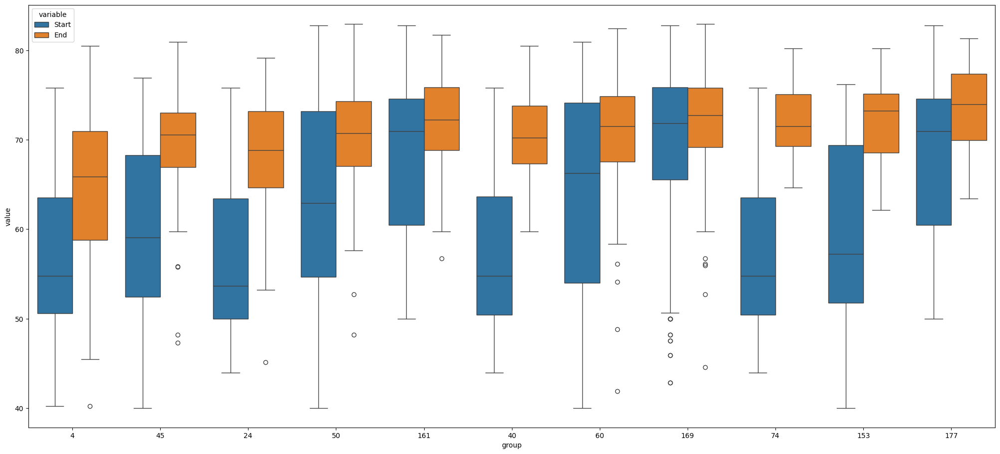

In [21]:
var_columns = ["sample_equal", "overlap", "rounds", "init_size", "labels_per_round"]
#var_columns = ["labeled", "rounds", "init_size", "labels_per_round"]
fix_columns = [("setting", "SSL_AL"), ("expert_predict", "target"), ("mod", "confidence")]#, ("labeler_ids", "[4323195249, 4295232296]")]


df_plot, df_runs = expertMetrics.create_plot_df_grouped_hue(4323195249, "Test", "accurancy", var_columns=var_columns, fix_columns=fix_columns)

sort_index = df_runs.sort_values(by=["labeled"]).index

plt.figure()
f, ax = plt.subplots(figsize=(25, 11))
sns.boxplot(df_plot, x="group", y="value", hue="variable", hue_order=["Start", "End"], ax=ax, order=sort_index)

df_runs.sort_values(by=["labeled"]).head(100)

In [ ]:
var_columns = ["sample_equal", "overlap", "rounds", "init_size", "labels_per_round"]
#var_columns = ["labeled", "rounds", "init_size", "labels_per_round"]
fix_columns = [("setting", "SSL_AL"), ("expert_predict", "target"), ("mod", "confidence")]


df_plot, df_runs = expertMetrics.create_plot_df_grouped_hue(4295232296, "Test", "accurancy", var_columns=var_columns, fix_columns=fix_columns)

sort_index = df_runs.sort_values(by=["labeled"]).index

plt.figure()
f, ax = plt.subplots(figsize=(25, 11))
sns.boxplot(df_plot, x="group", y="value", hue="variable", hue_order=["Start", "End"], ax=ax, order=sort_index)

df_runs.sort_values(by=["labeled"]).head(100)

In [ ]:
def create_expert_metrics(met):
    metrics = {}
    for expert_id in met[0]:
        metrics[expert_id] = []
        for run in met:
            start_metrics = {}
            end_metrics = {}
            for seed_fold, value in run[expert_id].items():
                if "Start" in value:
                    start_metrics[seed_fold] = value["Start"]
                end_metrics[seed_fold] = value["End"]
            if len(start_metrics) == 0:
                start_metrics = end_metrics
            metrics[expert_id].append({
                "Start": start_metrics,
                "End": end_metrics
            })
    return metrics

In [ ]:
create_expert_metrics(expertMetrics.get_expert_values("Test", "f1"))

In [ ]:
get_expert_df(create_expert_metrics(expertMetrics.get_expert_values("Test", "f1")), 4323195249)

In [ ]:
import matplotlib.pyplot as plt

def get_expert_values(step, metric_name):

    mett = []
    for element in metrics2:
        met = {}
        for seed, value1 in element["expert metrics"].items():
            for fold, value2 in value1.items():
                for expert, value3 in value2.items():
                    if expert not in met:
                        met[expert] = {}
                    met[expert][f"Seed_{seed}_Fold_{fold}"] = {}
                    met[expert][f"Seed_{seed}_Fold_{fold}"]["End"] = value3[step]["End"][metric_name]
                    if "Start" in value3[step]:
                        met[expert][f"Seed_{seed}_Fold_{fold}"]["Start"] = value3[step]["Start"][metric_name]
                    else:
                        pass
        mett.append(met)
    return mett

def get_single_values(met, run, expert_id, step):
    values = []
    for key, value in met[run][expert_id].items():
        values.append(value[step])
    return values

def plot_expert_values(met):
    df1 = pd.DataFrame(met[4323195249])
    df2 = pd.DataFrame(met[4295232296])

    fd1 = df1.T.reset_index()
    fd1["expert"] = 4323195249
    fd2 = df2.T.reset_index()
    fd2["expert"] = 4295232296
    df3 = pd.concat([fd1, fd2])
    df3 = df3.melt(id_vars=["index", "expert"])

    plt.figure()
    sns.boxplot(df3, x="expert", y="value",
            hue="variable",)

In [ ]:
met = get_expert_values("Val", "accurancy_balanced")

plot_expert_values(met[2])
plot_expert_values(met[1])
df_runs

In [ ]:
met = get_expert_values("Val", "accurancy_balanced")

In [ ]:
def create_expert_metrics(met):
    metrics = {}
    for expert_id in met[0]:
        metrics[expert_id] = []
        for run in met:
            start_metrics = {}
            end_metrics = {}
            for seed_fold, value in run[expert_id].items():
                if "Start" in value:
                    start_metrics[seed_fold] = value["Start"]
                end_metrics[seed_fold] = value["End"]
            if len(start_metrics) == 0:
                start_metrics = end_metrics
            metrics[expert_id].append({
                "Start": start_metrics,
                "End": end_metrics
            })
    return metrics

def get_expert_df(metrics, expert_id, start=False):
    if start:
        df1 = pd.DataFrame([row["Start"] for row in metrics[expert_id]]).reset_index().melt(id_vars=['index'], var_name='seed_fold', value_name='start')
    df2 = pd.DataFrame([row["End"] for row in metrics[expert_id]]).reset_index().melt(id_vars=['index'], var_name='seed_fold', value_name='end')

    if start:
        df_final = df1
        df_final["end"] = df2["end"]
    else:
        df_final = df2
    df_final = df_final.melt(id_vars=["index", "seed_fold"], var_name="step")

    return df_final

def plot_expert_runs_al(metrics, expert_id, step, metrics_name):
    met = get_expert_values(step, metrics_name)
    df = get_expert_df(create_expert_metrics(met), expert_id, start=True)
    plt.figure()
    f, ax = plt.subplots(figsize=(25, 11))
    sns.boxplot(df, x="index", y="value", hue="step", ax=ax)

def plot_expert_runs_end(metrics, expert_id, step, metrics_name):
    met = get_expert_values(step, metrics_name)
    df = get_expert_df(create_expert_metrics(met), expert_id)
    plt.figure()
    f, ax = plt.subplots(figsize=(25, 11))
    sns.boxplot(df, x="index", y="value", ax=ax)

In [ ]:
plot_expert_runs_al(metrics, 4323195249, "Test", "accurancy_balanced")

In [ ]:
plot_expert_runs_end(metrics, 4323195249, "Val", "accurancy_balanced")

In [ ]:
from zipfile import ZipFile as zipfile

with zipfile("../../Metrics_Folder/NIH/Metrics_1013.zip", 'r') as zip: 
    # printing all the contents of the zip file 
    zip.printdir() 
  
    # extracting all the files 
    print('Extracting all the files now...') 
    zip.extractall("../../Metrics_Folder/NIH/") 
    print('Done!') 

In [ ]:
with open("../../Metrics_Folder/NIH/Metrics_688.pickle", 'rb') as handle:
    metrics = pickle.load(handle)

In [ ]:
runs = pd.DataFrame(metrics).drop(["expert metrics", "verma", "hemmer", "artificial expert predictions"], axis=1)

In [ ]:
remove_index = []
for i in range(len(metrics)):
    if metrics[i]["mod"] == "disagreement_diff":
        remove_index.append(i)

In [ ]:
for i in remove_index[::-1]:
    del metrics[i]

In [ ]:
with open("../Metrics_Folder/Metrics_700.pickle", 'wb') as handle:
    pickle.dump(metrics, handle, protocol=pickle.HIGHEST_PROTOCOL)